<a href="https://colab.research.google.com/github/songc42/Feature-proliferation/blob/main/Local_pytorch_stylegan2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
!ls


In [ ]:
%cd drive/MyDrive/stylegan2-ada-pytorch


/content/drive/MyDrive/stylegan2-ada-pytorch


In [ ]:
!pip install -r ./Requirements.txt -f https://download.pytorch.org/whl/torch_stable.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 205.9/205.9 KB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 KB 15.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.9/26.9 MB 18.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 GB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 62.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 103.9 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 1.13.1+cu116
    Uninstalling torch-1.13.1+cu116:
      Successfully uninstalled torch-1.13.1+cu116
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.1+cu116
    Uninstalling torchvision-0.14.1+cu116:
      Successfully uninstalled torchvision-0

#并行计算

In [ ]:
import threading
import time
def func(times, name, ret):
    for i in range(times):
      a=100**3+3005**10
        #print(name + ' run: ' + str(i))
    ret[name] = name + " finished with " + str(times) + " times printed"
    return


if __name__ == '__main__':

    thread_pool = []
    ret = {}
    th_1 = threading.Thread(target=func, args=[120000000, 'exp_1', ret], name='exp_1')
    th_2 = threading.Thread(target=func, args=[120000000, 'th_2', ret], name='exp_2')
    th_3 = threading.Thread(target=func, args=[120000000, 'th_3', ret], name='exp_2')
    th_4 = threading.Thread(target=func, args=[120000000, 'th_4', ret], name='exp_2')
    thread_pool.append(th_1)
    thread_pool.append(th_2)
    thread_pool.append(th_3)
    thread_pool.append(th_4)
    start = time.time()
    for th in thread_pool:
        #start = time.time()
        th.start()
        #end = time.time()
        #print(end - start)

    for th in thread_pool:
        th.join()
    end = time.time()
    print(end - start)
    start = time.time()
    func(480000000, 'exp_1', {})
    #func(1, 'exp_2', {})
    end = time.time()


    print(end - start)
    print(ret)

26.61361265182495
14.658300161361694
{'exp_1': 'exp_1 finished with 120000000 times printed', 'th_4': 'th_4 finished with 120000000 times printed', 'th_2': 'th_2 finished with 120000000 times printed', 'th_3': 'th_3 finished with 120000000 times printed'}


In [ ]:
import threading
zzz=[1,2,3,4]
def modify_feature(times, name, ret):
  for i_index in range(times):
    print(zzz[i_index])
    ret[name] = name + " finished with " + str(times) + " times printed"
    # minus=x[0][i_index].mean()-m_all[i_index]
    # ratio=minus/vari_all[i_index]
if __name__ == '__main__':

    thread_pool = []
    ret = {}
    th_1 = threading.Thread(target=modify_feature, args=[3, 'exp_1', ret], name='exp_1')
    th_2 = threading.Thread(target=modify_feature, args=[4, 'th_2', ret], name='exp_2')
    thread_pool.append(th_1)
    thread_pool.append(th_2)

    for th in thread_pool:
        th.start()

    for th in thread_pool:
        th.join()
    # for th in thread_pool:
    #     print('1',th)

#PROGAN2 normalization

In [ ]:
import pickle
def save_variable(v,filename):
    f=open(filename,'wb')
    pickle.dump(v,f)
    f.close()
    return filename
def load_variavle(filename):
    f=open(filename,'rb')
    r=pickle.load(f)
    f.close()
    return r
import os
import re
from typing import List, Optional
import matplotlib.pyplot as plt
import click
import dnnlib
import numpy as np
import PIL.Image
import torch
import legacy
#import training.networks_progan_normal as t_n
#import training.networks as t_n
#import training.multi_networks as t_n
import training.multi_networks_parallel as t_n
#import training.multi_networks_s_fea as t_n

z_dim= 512
c_dim= 0
w_dim= 512
img_resolution= 512
img_channels=3
device=torch.device('cuda')
G_copy=t_n.Generator(z_dim,c_dim,w_dim,img_resolution,img_channels).to(device)
#G_copy.load_state_dict(torch.load("afhqcat.pkl"))
G_copy.load_state_dict(torch.load("cat1.pth"))
# G_copy.load_state_dict(torch.load("ffhq_model.pth"))

<All keys matched successfully>

The time used to execute this is given below
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
72.22973251342773
modify_all_num= tensor(2928, device='cuda:0')


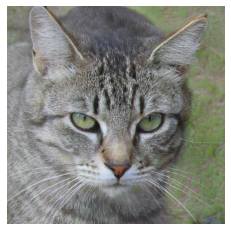

In [ ]:
import time
#True False
pro_normal=True
save_variable(pro_normal,'pro_normal.txt')
seed=78038
seed_num=100
if pro_normal:
  sub_name=str(seed)+'normalised'
else:
  sub_name=str(seed)
z = torch.from_numpy(np.random.RandomState(seed).randn(1, G_copy.z_dim)).to(device)
label = torch.zeros([1, G_copy.c_dim], device=device)
truncation_psi=1
noise_mode= 'const'
#z = torch.from_numpy(np.random.RandomState(seed+i).randn(1, G_copy.z_dim)).to(device)
z_all=[]
for i in range(seed_num):
  z_all.append(torch.from_numpy(np.random.RandomState(seed+i).randn(1, G_copy.z_dim)).to(device))
print("The time used to execute this is given below")
start = time.time()
modify_all_num=0
for i in range(seed_num):
  ws = G_copy.mapping(z_all[i], label, truncation_psi=truncation_psi, truncation_cutoff=None)
  #img,x_all,y_all,styles_all,str_mod,x_mod_mean_all = G_copy.synthesis(ws,seed+i, noise_mode=noise_mode)
  img,x_all,b_modify_num_all = G_copy.synthesis(ws,seed+i, noise_mode=noise_mode)
  modify_all_num+=b_modify_num_all
end = time.time()
print(end - start)
img_y = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
img_y = img_y.detach().cpu().numpy()
img_y=PIL.Image.fromarray(img_y[0], 'RGB')
f_name='ProGan_normal'
#img_y.save(f'{f_name}/{sub_name}.png')
plt.imshow(img_y)
plt.axis('off')
print('modify_all_num=',modify_all_num)

The time used to execute this is given below
1.7499637603759766


(-0.5, 511.5, 511.5, -0.5)

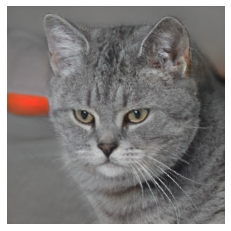

In [ ]:
import time
#True False
pro_normal=True
save_variable(pro_normal,'pro_normal.txt')
seed=000
if pro_normal:
  sub_name=str(seed)+'normalised'
else:
  sub_name=str(seed)
z = torch.from_numpy(np.random.RandomState(seed).randn(1, G_copy.z_dim)).to(device)
label = torch.zeros([1, G_copy.c_dim], device=device)
truncation_psi=1
noise_mode= 'const'

print("The time used to execute this is given below")
start = time.time()
for i in range(10):

  z = torch.from_numpy(np.random.RandomState(seed+i).randn(1, G_copy.z_dim)).to(device)
  ws = G_copy.mapping(z, label, truncation_psi=truncation_psi, truncation_cutoff=None)
  #img,x_all,y_all,styles_all,str_mod,x_mod_mean_all = G_copy.synthesis(ws,seed+i, noise_mode=noise_mode)
  img,x_all = G_copy.synthesis(ws,seed+i, noise_mode=noise_mode)
end = time.time()
print(end - start)
img_y = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
img_y = img_y.detach().cpu().numpy()
img_y=PIL.Image.fromarray(img_y[0], 'RGB')
f_name='ProGan_normal'
#img_y.save(f'{f_name}/{sub_name}.png')
plt.imshow(img_y)
plt.axis('off')

In [ ]:
a=torch.tensor([[[1,2],
        [5,6]],
        [[5,6],[7,8]],
        [[9,10],[11,12]]])
b=torch.tensor([10,100,1000])
#c=torch.tensor([10,100]*torch.ones(2,2))

In [ ]:
d=a.reshape(3,-1).t()
d
#d.size()

tensor([[ 1,  5,  9],
        [ 2,  6, 10],
        [ 5,  7, 11],
        [ 6,  8, 12]])

In [ ]:
b.matmul(d)

tensor([ 9510, 10620, 11750, 12860])

In [ ]:
a.permute(1,2,0)

tensor([[[1, 5],
         [2, 6]],

        [[5, 7],
         [6, 8]]])

In [ ]:
n=b.size()
for i in range(int(str(n))):
  print(1)

ValueError: ignored

In [ ]:
e=d/b
e.t().reshape(3,2,2)
#e.reshape(3,2,2)

tensor([[[0.1000, 0.2000],
         [0.5000, 0.6000]],

        [[0.0500, 0.0600],
         [0.0700, 0.0800]],

        [[0.0090, 0.0100],
         [0.0110, 0.0120]]])

In [ ]:
x_3=x_all[3]

In [ ]:
x_3.size()

torch.Size([1, 512, 32, 32])

In [ ]:
x_3_mean=x_3[0].mean([1,2])

In [ ]:
x_3_mean=x_3_mean.mean(2)

In [ ]:
x_3_mean

#循环3000次看PSNR

In [ ]:
import pickle
def load_variavle(filename):
    f=open(filename,'rb')
    r=pickle.load(f)
    f.close()
    return r

In [ ]:
import numpy as np
np.inf

inf

In [ ]:
import pickle
import numpy as np
PSNR_TRUN=0
PSNR_MOD=0
for i in range(77000,80000):
  print(i)
  f='./PSNR_trun_face/'+str(i)+'.txt'
  f_2='./PSNR_mod_face/'+str(i)+'.txt'


  if load_variavle(f_2)==np.inf:
    print('挑')
    continue
  else:
    PSNR_MOD=PSNR_MOD+load_variavle(f_2)
  PSNR_TRUN=PSNR_TRUN+load_variavle(f)


In [ ]:
f_2
#print(load_variavle(f_2))

'./PSNR_mod_face/77000.txt'

In [ ]:
f_ori='./face_77000_80000/'+str(seed)+'.png'
f_truncation='./Trun_face_77000_80000/'+str(seed)+'.png'
img_ori=torch.from_numpy(cv2.imread(f_ori))

NameError: ignored

In [ ]:
seed=70000
f='./PSNR_trun_face/'+str(seed)+'.txt'
f_2='./PSNR_mod_face/'+str(seed)+'.txt'
print(load_variavle(f_2))

tensor(4.0221, device='cuda:0')


In [ ]:
!pip install -r ./Requirements.txt -f https://download.pytorch.org/whl/torch_stable.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 195 kB 8.2 MB/s 
     |████████████████████████████████| 108 kB 52.6 MB/s 
     |████████████████████████████████| 26.9 MB 1.4 MB/s 
     |███████████████████████         | 834.1 MB 1.3 MB/s eta 0:04:14tcmalloc: large alloc 1147494400 bytes == 0x3d60000 @  0x7f82b42ab615 0x592b76 0x4df71e 0x59afff 0x515655 0x549576 0x593fce 0x548ae9 0x51566f 0x549576 0x593fce 0x548ae9 0x5127f1 0x598e3b 0x511f68 0x598e3b 0x511f68 0x598e3b 0x511f68 0x4bc98a 0x532e76 0x594b72 0x515600 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576 0x593fce 0x5118f8 0x593dd7
     |█████████████████████████████▏  | 1055.7 MB 1.2 MB/s eta 0:01:23tcmalloc: large alloc 1434370048 bytes == 0x483b6000 @  0x7f82b42ab615 0x592b76 0x4df71e 0x59afff 0x515655 0x549576 0x593fce 0x548ae9 0x51566f 0x549576 0x593fce 0x548ae9 0x5127f1 0x598e3b 0x511f68 0x598e3b 0x511f68 0x598e3b 0x511f68 0x4bc98a 0x532e76 0x594b72 0x515600 0x549576 0

#生成的truncation文档


In [ ]:
[face_7000_trun, cat_10000_trun, met_10000_trun]

In [ ]:
bash download.sh afhq-dataset
bash download.sh pretrained-network-afhq

SyntaxError: ignored

In [ ]:
!python dataset_tool.py --source=~/downloads/afhq/train/cat --dest=~/datasets/afhqcat.zip

Error: Missing input file or directory: ~/downloads/afhq/train/cat


#取数据

In [ ]:

from PIL import Image
import pickle
import matplotlib.pyplot as plt # plt 用于显示图片
import cv2 as cv
import seaborn as sns
ly3=[100,473]
ly4=[125, 130, 183, 473, 475, 499]
ly5=[33, 77, 78, 120, 124, 159, 242, 273, 316, 334, 406, 462, 464, 501]
ly6=[11, 26, 51, 52, 55, 59, 96, 98, 139, 140,158,160,177,183,198,215,223,244,255,256,314,358,379,380,408,413,438,496]
ly7=[]
ly=['ly_3','ly_4','ly_5','ly_6','ly_7']
num=3
ly_select=ly[num-3]
f_ori='./79058/'+ly_select+'/'
f_modify='./79058_modify_ly3/'+ly_select+'/'
save_1='./79058/Picture_select/'+ly_select+'_'
save_2='./79058_modify_ly3/Picture_select_modify/'+ly_select+'_'
for i in eval('ly'+str(num)):
  f_extract_ori=f_ori+str(i+1)+'.png'
  f_extract_modify=f_modify+str(i)+'.png'

  map_ori=cv.imread(f_extract_ori)
  #map_modify=load_variavle(f_extract_modify)
  print('这是第',i,'个')
  ax = sns.heatmap(map_ori,center=0.0)
  scatter_fig = ax.get_figure()
  plt.show()
  save=False
  if save:
    img = cv.imread(f_extract_ori)
    savepath1=save_1+str(i+1)+'.png'
    cv.imwrite(savepath1, img)
    #plt.imshow(I,'Reds') # 显示图片
    #plt.axis('off') # 不显示坐标轴
    #plt.show()
    img = cv.imread(f_extract_modify)
    savepath2=save_2+str(i+1)+'.png'
    cv.imwrite(savepath2, img)

这是第 100 个


ValueError: ignored

In [ ]:
f_extract_ori

'./79058/ly_3/101.png'

# 记录模型参数

In [ ]:
import dnnlib
import legacy
device='cuda'
network_pkl='https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/metfaces.pkl'
with dnnlib.util.open_url(network_pkl) as f:
  print('f=', f)
  #G_copy.load_state_dict(torch.load(f))
  G_copy = legacy.load_network_pkl(f)['G_ema'].to(device)

f= <_io.BytesIO object at 0x7f982363ef50>


In [ ]:
G_copy.w_dim

512

In [ ]:
import torch
torch.save(G_copy.state_dict(), 'metface.pth')

In [ ]:
ws = G.mapping(z, label, truncation_psi=truncation_psi, truncation_cutoff=None)
cat= G.synthesis(ws, noise_mode=noise_mode)

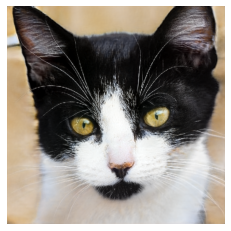

In [ ]:
img_y = (cat.cpu().permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
plt.axis('off')
plt.imshow(img_y[0].cpu().numpy())
plt.show()

In [ ]:
z_dim= 512
c_dim= 0
w_dim= 512
img_resolution= 1024
img_channels=3

In [ ]:
G.img_channels

NameError: ignored

In [ ]:
torch.save(G.state_dict(), 'cat1.pth')

#载入模型

In [ ]:
import os
import re
from typing import List, Optional
import matplotlib.pyplot as plt
import click
import dnnlib
import numpy as np
import PIL.Image
import torch
import legacy
#import training.networks as t_n
import training.multi_networks as t_n
#import training.multi_networks_s_fea as t_n

z_dim= 512
c_dim= 0
w_dim= 512
img_resolution= 512
img_channels=3
device=torch.device('cuda')
G_copy=t_n.Generator(z_dim,c_dim,w_dim,img_resolution,img_channels).to(device)
G_copy.load_state_dict(torch.load("dog1_weights.pth"))

FileNotFoundError: ignored

#生成7000张人脸modified

In [ ]:
import pickle
def save_variable(v,filename):
    f=open(filename,'wb')
    pickle.dump(v,f)
    f.close()
    return filename
def load_variavle(filename):
    f=open(filename,'rb')
    r=pickle.load(f)
    f.close()
    return r
import os
import re
from typing import List, Optional
import matplotlib.pyplot as plt
import click
import dnnlib
import numpy as np
import PIL.Image
import torch
import legacy
import training.networks as t_n
#import training.multi_networks as t_n
#import training.multi_networks_s_fea as t_n

z_dim= 512
c_dim= 0
w_dim= 512
img_resolution= 1024
img_channels=3
device=torch.device('cuda')
G_copy=t_n.Generator(z_dim,c_dim,w_dim,img_resolution,img_channels).to(device)
#G_copy.load_state_dict(torch.load("afhqcat.pkl"))
#G_copy.load_state_dict(torch.load("cat1.pth"))
G_copy.load_state_dict(torch.load("ffhq_model.pth"))

const_size= torch.Size([512, 4, 4])


<All keys matched successfully>

In [ ]:
import pickle
import os
im_all=[]
#del  img_y
tru=False
for j in range(1):
  for i_index in range(1):
    if tru:
      mod_0=[99,0,0,0,0,0,0, 0,0]
      mod_1=[0,0,0,0,0,0, 0, 0, 0]
      trun_num=0.7+i_index/20
      #trun_num=1
      ratio_num=2
    else:
      mod_0=[99,1,1,1,0,0,0, 0,0]
      mod_1=[1,1,1,1,0,0, 0, 0, 0]
      trun_num=1
      ratio_num=1+i_index/2
    #ratio_num=2
    error_s=71974
    seed = 1815 #@param {type:"slider", min:1, max:10000, step:1}
    Display = True #@param ["True", "False"] {type:"raw", allow-input: true}
    Save = True #@param ["True", "None"] {type:"raw"}
    Only_final = True #@param ["True", "None"] {type:"raw"}
    error_seed = True #@param ["True", "None"] {type:"raw"}
    device='cuda'
    #设置target_modify
    target_modify=False
    save_variable(target_modify,'target_modify.txt')
    #设置modify_rate
    modify_rate=2+j
    save_variable(modify_rate,'modify_rate.txt')

    #设置ratio
    #ratio_threshold=2
    ratio_threshold=ratio_num
    save_variable(ratio_threshold,'ratio_threshold.txt')

    #设置modify_index_conv0
    mod_0=[99,1,1,1,0,0,0, 0,0]
    modify_index_conv0=mod_0
    save_variable(modify_index_conv0,'v2_modify_index_conv0.txt')

    #设置modify_index_conv1
    mod_1=[1,1,1,1,0,0, 0, 0, 0]
    modify_index_conv1=mod_1
    save_variable(modify_index_conv1,'v2_modify_index_conv1.txt')
    #设置instance normalization
    In_normalization=False
    save_variable(In_normalization,'In_normalization.txt')
    In_normalization_cof_conv0=0#设置instance normalization conv0
    save_variable(In_normalization_cof_conv0,'In_normalization_cof_conv0.txt')
    In_normalization_cof_conv1=0#设置instance normalization conv1
    save_variable(In_normalization_cof_conv1,'In_normalization_cof_conv1.txt')
    #设置Only_exetreme True False
    Only_exetreme=False
    save_variable(Only_exetreme,'Only_exetreme.txt')
    #设置Only_exetreme_cof_conv0
    Only_exetreme_cof_conv0=0

    save_variable(Only_exetreme_cof_conv0,'Only_exetreme_cof_conv0.txt')
    if error_seed:
      seed=error_s
    z = torch.from_numpy(np.random.RandomState(seed).randn(1, G_copy.z_dim)).to(device)
    label = torch.zeros([1, G_copy.c_dim], device=device)
    truncation_psi=trun_num
    noise_mode= 'const'
    ws = G_copy.mapping(z, label, truncation_psi=truncation_psi, truncation_cutoff=None)
    img,x_all,y_all,styles_all,str_mod,x_mod_mean_all = G_copy.synthesis(ws, noise_mode=noise_mode)
    f_name='Const_c'
    sub_name=seed+str_mod
    if Save:
      img_y = (img[8].permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
      img_y = img_y.detach().cpu().numpy()
      img_y=PIL.Image.fromarray(img_y[0], 'RGB')
      #img = img.resize((128,128), PIL.Image.ANTIALIAS)
      #index_mean=record_mean(x_all)
      #save_variable(index_mean,f_name)
      #mean_all.append(index_mean)

      img_y.save(f'{f_name}/{sub_name}_{truncation_psi}.png')

    display=True
    # True False
    if display:
      img_y = (img[8].permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
      plt.axis('off')
      plt.imshow(img_y[0].cpu().numpy())
      plt.show()
    im_all.append(img_y)

In [ ]:

#生成多个seeds的z
import os
seed = 79000
#Display = True #@param ["True", "False"] {type:"raw", allow-input: true}
#Save = None #@param ["True", "None"] {type:"raw"}
#Only_final = True #@param ["True", "None"] {type:"raw"}
device=torch.device('cuda')
label = torch.zeros([1, G_copy.c_dim], device=device)
truncation_psi=1
noise_mode= 'const'

#设置target_modify
target_modify=False
save_variable(target_modify,'target_modify.txt')

#设置modify_rate and ratio
modify_rate=2#设置设置modify_rate
ratio_threshold=2#设置ratio
save_variable(modify_rate,'modify_rate.txt')
save_variable(ratio_threshold,'ratio_threshold.txt')

#设置instance normalization
In_normalization=False
save_variable(In_normalization,'In_normalization.txt')
In_normalization_cof_conv0=0#设置instance normalization
In_normalization_cof_conv1=0#设置instance normalization
save_variable(In_normalization_cof_conv0,'In_normalization_cof_conv0.txt')
save_variable(In_normalization_cof_conv1,'In_normalization_cof_conv1.txt')

#设置modify_index_conv0 and modify_index_conv1
mod_0=[99,1,1,1,0,0,0, 0,0]
modify_index_conv0=mod_0#设置modify_index_conv0
mod_1=[1,1,1,1,0,0, 0, 0, 0]#设置modify_index_conv1
modify_index_conv1=mod_1

save_variable(modify_index_conv0,'v2_modify_index_conv0.txt')
save_variable(modify_index_conv1,'v2_modify_index_conv1.txt')


#设置Only_exetreme True False
Only_exetreme=False
Only_exetreme_cof_conv0=0.1#设置Only_exetreme_cof_conv0

save_variable(Only_exetreme,'Only_exetreme.txt')
save_variable(Only_exetreme_cof_conv0,'Only_exetreme_cof_conv0.txt')

z_all=[]
seed_num= 1000 #@param {type:"slider", min:1, max:7999, step:1}

for i in range(seed_num):

  z = torch.from_numpy(np.random.RandomState(seed+i).randn(1, G_copy.z_dim)).to(device)
  z_all.append(z)
#img_all=[]

#os.mkdir(f_name)
mean_all=[]
#生成多个图片
for i in range(seed_num):
  seed_compute=seed+i
  f_name='./Const_c'
  print('处理第',i)
  #img = G_copy(z_all[i], label, truncation_psi=truncation_psi, noise_mode=noise_mode)
  ws = G_copy.mapping(z_all[i], label, truncation_psi=truncation_psi, truncation_cutoff=8)
  img,x_all,y_all,styles_all,str_mod,x_mod_mean_all= G_copy.synthesis(ws,noise_mode=noise_mode)
  img = (img[8].permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  sub_name=str(seed_compute)+str_mod

  img = img.cpu().numpy()
  img=PIL.Image.fromarray(img[0], 'RGB')
  #img = img.resize((128,128), PIL.Image.ANTIALIAS)
  #index_mean=record_mean(x_all)
  #save_variable(index_mean,f_name)
  #mean_all.append(index_mean)

  img.save(f'{f_name}/{sub_name}.png')
  #del img, sub_name, str_name, f_name,seed_compute,ws


流式输出内容被截断，只能显示最后 5000 行内容。
修改了block 2 conv1的第 190 mean()= 0.88 minus= 0.86 var()= 2.82 ratio= tensor(2.2436, device='cuda:0', grad_fn=<DivBackward0>)
修改了block 2 conv1的第 367 mean()= 0.91 minus= 0.75 var()= 2.1 ratio= tensor(2.0206, device='cuda:0', grad_fn=<DivBackward0>)
修改了block 2 conv1的第 375 mean()= 0.42 minus= 0.46 var()= 1.29 ratio= tensor(2.1396, device='cuda:0', grad_fn=<DivBackward0>)
修改了block 2 conv1的第 386 mean()= 0.45 minus= 0.59 var()= 1.82 ratio= tensor(2.4550, device='cuda:0', grad_fn=<DivBackward0>)
修改了block 2 conv1的第 430 mean()= 0.58 minus= 0.62 var()= 1.07 ratio= tensor(2.0151, device='cuda:0', grad_fn=<DivBackward0>)
b_modify_num= [2]
修改了block 3 conv0的第 49 mean()= 1.09 minus= 1.2 var()= 5.92 ratio= tensor(2.2046, device='cuda:0', grad_fn=<DivBackward0>)
修改了block 3 conv1的第 409 mean()= 0.19 minus= 0.42 var()= 3.8 ratio= tensor(2.3259, device='cuda:0', grad_fn=<DivBackward0>)
b_modify_num= [1]
处理第 920
初始dtype= torch.float32
修改了block 0 conv1的第 45 mean()= 0.08 minus= 0.13 va

#生成多张1000多张猫或met

In [ ]:

#生成多个seeds的z
import os
seed = 79000
#Display = True #@param ["True", "False"] {type:"raw", allow-input: true}
#Save = None #@param ["True", "None"] {type:"raw"}
#Only_final = True #@param ["True", "None"] {type:"raw"}
device=torch.device('cuda')
label = torch.zeros([1, G_copy.c_dim], device=device)
truncation_psi=1
noise_mode= 'const'
#设置type_data
type_data='met'
save_variable(type_data,'type_data.txt')
#设置instance normalization False
In_normalization=False
save_variable(In_normalization,'In_normalization.txt')
#设置modify_index_conv0
modify_index_conv0=[99,1,1,1,0,0,0, 0,0]
#           .1,3,5,7,9,11,13,15
save_variable(modify_index_conv0,'modify_index_conv0.txt')

#设置modify_index_conv1
modify_index_conv1=[1,1,1,1,0,0, 0, 0, 0]
#          0,2,4,6,8,10,12, 14,16
save_variable(modify_index_conv1,'modify_index_conv1.txt')
#设置instance normalization
In_normalization_cof_conv0=0
save_variable(In_normalization_cof_conv0,'In_normalization_cof_conv0.txt')
#设置instance normalization
In_normalization_cof_conv1=0
save_variable(In_normalization_cof_conv1,'In_normalization_cof_conv1.txt')
#设置Only_exetreme True False
Only_exetreme=True
save_variable(Only_exetreme,'Only_exetreme.txt')
#设置Only_exetreme_cof_conv0
Only_exetreme_cof_conv0=0.1
save_variable(Only_exetreme_cof_conv0,'Only_exetreme_cof_conv0.txt')

z_all=[]
seed_num= 1000 #@param {type:"slider", min:1, max:3999, step:1}

for i in range(seed_num):

  z = torch.from_numpy(np.random.RandomState(seed+i).randn(1, G_copy.z_dim)).to(device)
  z_all.append(z)
#img_all=[]

#os.mkdir(f_name)
mean_all=[]
#生成多个图片
for i in range(seed_num):
  seed_compute=seed+i
  f_name='./Metface_modify_v2'
  print('处理第',i)
  #img = G_copy(z_all[i], label, truncation_psi=truncation_psi, noise_mode=noise_mode)
  ws = G_copy.mapping(z_all[i], label, truncation_psi=truncation_psi, truncation_cutoff=8)
  img,x_all,y_all,styles_all,str_mod,x_mod_mean_all= G_copy.synthesis(ws,noise_mode=noise_mode)
  img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  sub_name=str(seed_compute)+str_mod

  img = img.cpu().numpy()
  img=PIL.Image.fromarray(img[0], 'RGB')
  #img = img.resize((128,128), PIL.Image.ANTIALIAS)
  #index_mean=record_mean(x_all)
  #save_variable(index_mean,f_name)
  #mean_all.append(index_mean)

  img.save(f'{f_name}/{sub_name}.png')
  #del img, sub_name, str_name, f_name,seed_compute,ws

NameError: ignored

In [ ]:
load_variavle('met_b2_conv0.txt')

#生成一千张图片

In [ ]:
#生成多个seeds的z
import os
import time
seed = 79000
#Display = True #@param ["True", "False"] {type:"raw", allow-input: true}
#Save = None #@param ["True", "None"] {type:"raw"}
#Only_final = True #@param ["True", "None"] {type:"raw"}
device=torch.device('cuda')
label = torch.zeros([1, G_copy.c_dim], device=device)
truncation_psi=1
noise_mode= 'const'
z_all=[]
seed_num= 1000 #@param {type:"slider", min:1, max:3999, step:1}

for i in range(seed_num):

  z = torch.from_numpy(np.random.RandomState(seed+i).randn(1, G_copy.z_dim)).to(device)
  z_all.append(z)
#img_all=[]

#os.mkdir(f_name)
mean_all=[]
#生成多个图片
for i in range(seed_num):
  seed_compute=seed+i
  f_name='./S_Conv0_1_Modify_v4_2.5ratio_no_abs'
  print('处理第',i)
  #img = G_copy(z_all[i], label, truncation_psi=truncation_psi, noise_mode=noise_mode)


  start = time.time()
  print("The time used to execute this is given below")
  end = time.time()
  print(end - start)
  ws = G_copy.mapping(z_all[i], label, truncation_psi=truncation_psi, truncation_cutoff=8)
  img,str_name = G_copy.synthesis(ws,seed, noise_mode=noise_mode)
  img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  if str_name=='_':
    sub_name=str(seed_compute)
  else:
    sub_name=str(seed_compute)+str_name
  img = img.cpu().numpy()
  img=PIL.Image.fromarray(img[0], 'RGB')
  #img = img.resize((128,128), PIL.Image.ANTIALIAS)
  #index_mean=record_mean(x_all)
  #save_variable(index_mean,f_name)
  #mean_all.append(index_mean)

  #img.save(f'{f_name}/{sub_name}.png')
  del img, sub_name, str_name, f_name,seed_compute,ws

#找到所有的问题标号

In [ ]:
error_p = 2 #@param {type:"slider", min:1, max:43, step:1}
error_index=[]
for line in open("seeds_col.txt"):
  error_index.append(line)
error_s=int(error_index[error_p-1])

#计算styles的均值和方差

In [ ]:
sss=load_variavle('styles_var_b5_conv1.txt')
sss

In [ ]:
#方差函数
import math
def style_vari(sta,end,block,step):
  #载入均值
  f_mean='styles_m_b'+str(block)+'_conv'+str(step)+'.txt'
  s_m=load_variavle(f_mean)
  for i in range(sta,end):
    f_name='./styles_3000/'+str(i)+'.txt'
    print('处理第',i)
    m_1=load_variavle(f_name)
    if block==0:
      m_1=m_1[block][0]
    else:
      m_1=m_1[block][step][0]
    m_1=list_sub_square(m_1,s_m)
    if i==sta:
      square_all=m_1
    else:
      square_all=list_add(square_all,m_1)
  std=list_div(square_all,(end-sta))
  std_sqrt=[math.sqrt(k) for k in std]

  return std_sqrt

In [ ]:
#均值函数
#ss=list_add(s_0,s_1)
def compute_styles_mean(sta,end,block,step):

  for i in range(sta,end):
    print('处理第',i)
    f_name='./styles_3000/'+str(i)+'.txt'
    m=load_variavle(f_name)
    if block==0:
      m_b=m[block][0]
    else:
      m_b=m[block][step][0]
    if i==sta:
      mean_all=m_b
    else:
      mean_all=list_add(mean_all,m_b)
  mean_all=list_div(mean_all,(end-sta))
  return mean_all
#style_m=compute_styles_mean(77000,80000,1,1)
def save_conv0_mean(sta,end,block):
  #m_all=[0,1,2,3]

  for i in range(sta,end):
    print('处理第',i)

    #f_name='./Conv0_record_mean_v2/'+str(i)+'.txt'


    f_name='./Conv0_record_mean_v2/'+str(i)+'b'+str(block)+'.txt'
    m=load_variavle(f_name)
      #print(m_b_m)
    if i==sta:
        m_all=m
    else:
      m_all=list_add(m_all,m)
  m_mean=list_div(m_all,(end-sta))
  save_name='conv0_b'+str(block)+'.txt'
  save_variable(m_mean,save_name)
  return m_all

In [ ]:
str(1000)

'1000'

In [ ]:
f_name='Conv0_record_mean_v2/'+str(990)+'b'+str(0+1)+'.txt'
m=load_variavle(f_name)
m

In [ ]:
filename='styles_m_b1_conv1.txt'
save_variable(style_m,filename)

'styles_m_b1_conv1.txt'

In [ ]:
#计算全部均值
for i in [2,3,4,5]:
  for j in range(2):
    style_m=compute_styles_mean(77000,80000,i,j)
    filename='styles_m_b'+str(i)+'_conv'+str(j)+'.txt'
    save_variable(style_m,filename)

In [ ]:
#算全部方差
for i in range(6):
  if i==0:
    range_num=1
  else:
    range_num=2
  for j in range(range_num):
    style_var=style_vari(77000,80000,i,j)
    filename='styles_var_b'+str(i)+'_conv'+str(j)+'.txt'
    save_variable(style_var,filename)

#生成3000张图片的style

In [ ]:
#生成多个seeds的z
import os
seed = 77000
#Display = True #@param ["True", "False"] {type:"raw", allow-input: true}
#Save = None #@param ["True", "None"] {type:"raw"}
#Only_final = True #@param ["True", "None"] {type:"raw"}
device=torch.device('cuda')
label = torch.zeros([1, G_copy.c_dim], device=device)
truncation_psi=1
noise_mode= 'const'
z_all=[]
seed_num= 1 #@param {type:"slider", min:1, max:3999, step:1}

for i in range(seed_num):

  z = torch.from_numpy(np.random.RandomState(seed+i).randn(1, G_copy.z_dim)).to(device)
  z_all.append(z)
#img_all=[]

#os.mkdir(f_name)
mean_all=[]
#生成多个图片
for i in range(seed_num):
  seed_compute=seed+i
  f_name='styles_3000/'
  f_name=f_name+str(seed_compute)+'.txt'
  print('处理第',i)
  #img = G_copy(z_all[i], label, truncation_psi=truncation_psi, noise_mode=noise_mode)
  ws = G_copy.mapping(z_all[i], label, truncation_psi=truncation_psi, truncation_cutoff=8)
  img,x_all,y_all,styles_all = G_copy.synthesis(ws, noise_mode=noise_mode)
  save_variable(styles_all,f_name)


In [ ]:
#dd=styles_all[4]
def com_mean(a):
  all=0
  for i in a:
    all+=i
  mean=all/len(a)
  return mean

In [ ]:
f_name='styles_3000/78379.txt'
for i in range(79379,79380):
  f_name='styles_3000/'+str(i)+'.txt'
  mm=load_variavle(f_name)
  mm1=mm[1][1][0]
  list(zip(range(512),mm1))
list(zip(range(512),mm1))

#生成一张图片并显示(multi_networks_s_fea.py,img,string)


In [ ]:
error_s=79379
seed = 1815 #@param {type:"slider", min:1, max:10000, step:1}
Display = True #@param ["True", "False"] {type:"raw", allow-input: true}
Save = None #@param ["True", "None"] {type:"raw"}
Only_final = True #@param ["True", "None"] {type:"raw"}
error_seed = True #@param ["True", "None"] {type:"raw"}
device='cuda'
if error_seed:
  seed=error_s
z = torch.from_numpy(np.random.RandomState(seed).randn(1, G_copy.z_dim)).to(device)
label = torch.zeros([1, G_copy.c_dim], device=device)
truncation_psi=1
noise_mode= 'const'
ws = G_copy.mapping(z, label, truncation_psi=truncation_psi, truncation_cutoff=None)
img,str_name = G_copy.synthesis(ws, seed, noise_mode=noise_mode)
display=True
# True False
if display:
  img_y = (img.cpu().permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  plt.axis('off')
  plt.imshow(img_y[0].cpu().numpy())
  plt.show()

In [ ]:
str_name

'_8_3_2_2_9_2_0_0_0_'

In [ ]:
str_name

'_14_3_6_3_2_1_1_2_6_'

In [ ]:
str_name

'_7_18_2_2_2_2_0_0_0_'

#生成一张图片并显示(multi_networks.py,img,string)






In [ ]:
error_s=79598
seed = 1815 #@param {type:"slider", min:1, max:10000, step:1}
Display = True #@param ["True", "False"] {type:"raw", allow-input: true}
Save = None #@param ["True", "None"] {type:"raw"}
Only_final = True #@param ["True", "None"] {type:"raw"}
error_seed = True #@param ["True", "None"] {type:"raw"}
device='cuda'
if error_seed:
  seed=error_s
z = torch.from_numpy(np.random.RandomState(seed).randn(1, G_copy.z_dim)).to(device)
label = torch.zeros([1, G_copy.c_dim], device=device)
truncation_psi=1
noise_mode= 'const'
ws = G_copy.mapping(z, label, truncation_psi=truncation_psi, truncation_cutoff=None)
img,str_name = G_copy.synthesis(ws,seed,noise_mode=noise_mode)
display=True
# True False
if display:
  img_y = (img.cpu().permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  plt.axis('off')
  plt.imshow(img_y[0].cpu().numpy())
  plt.show()

In [ ]:
str_name

'_3_5_1_2_3_1_1_6_1_'

In [ ]:
str_name

'_7_7_5_5_8_8_4_5_0_'

#Metface：生成一张图片并显示(cat_networks.py,img,x,style)

In [ ]:
%cd drive/MyDrive/stylegan2-ada-pytorch

/content/drive/MyDrive/stylegan2-ada-pytorch


In [ ]:
import pickle
def save_variable(v,filename):
    f=open(filename,'wb')
    pickle.dump(v,f)
    f.close()
    return filename
def load_variavle(filename):
    f=open(filename,'rb')
    r=pickle.load(f)
    f.close()
    return r
import os
import re
from typing import List, Optional
import matplotlib.pyplot as plt
import click
import dnnlib
import numpy as np
import PIL.Image
import torch
import legacy
#import training.networks as t_n
import training.cat_networks as t_n
#import training.multi_networks as t_n
#import training.multi_networks_s_fea as t_n

z_dim= 512
c_dim= 0
w_dim= 512
img_resolution= 1024
img_channels=3
device=torch.device('cuda')
G_copy=t_n.Generator(z_dim,c_dim,w_dim,img_resolution,img_channels).to(device)
#G_copy.load_state_dict(torch.load("afhqcat.pkl"))
G_copy.load_state_dict(torch.load("metface.pth"))

const_size= torch.Size([512, 4, 4])


<All keys matched successfully>

初始dtype= torch.float32


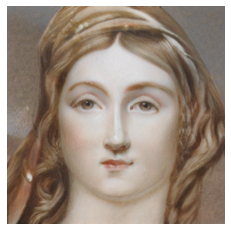

初始dtype= torch.float32


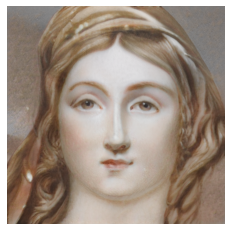

初始dtype= torch.float32


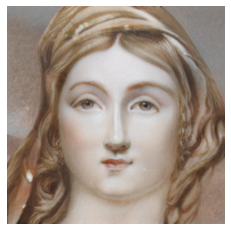

初始dtype= torch.float32


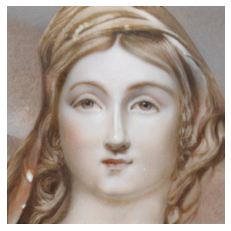

初始dtype= torch.float32


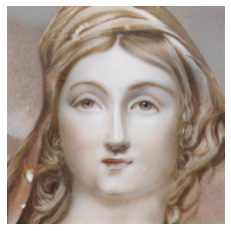

初始dtype= torch.float32


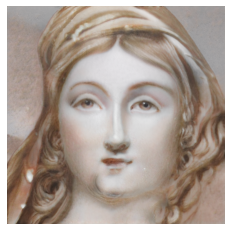

初始dtype= torch.float32


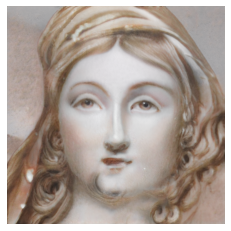

初始dtype= torch.float32


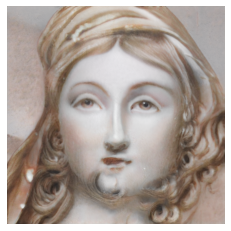

初始dtype= torch.float32


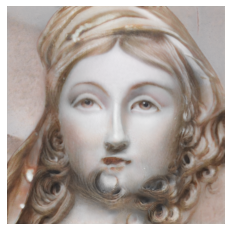

In [ ]:
import pickle
import os
tru=True
img_all=[]
for j in range(1):
  for i_index in range(9):
    if tru:
      mod_0=[99,0,0,0,0,0,0, 0,0]
      mod_1=[0,0,0,0,0,0, 0, 0, 0]
      trun_num=0.55+i_index/20
      #trun_num=1
      ratio_num=2
    else:
      mod_0=[99,1,1,1,0,0,0, 0,0]
      mod_1=[1,1,1,1,0,0, 0, 0, 0]
      trun_num=1
      ratio_num=0+i_index/2
    truncation_psi=trun_num
    error_s=77104
    seed = 1815 #@param {type:"slider", min:1, max:10000, step:1}
    Display = True #@param ["True", "False"] {type:"raw", allow-input: true}
    Save = None #@param ["True", "None"] {type:"raw"}
    Only_final = True #@param ["True", "None"] {type:"raw"}
    error_seed = True #@param ["True", "None"] {type:"raw"}
    device='cuda'
    #设置type_data
    type_data='met'
    save_variable(type_data,'type_data.txt')
    #设置target_modify
    target_modify=False
    save_variable(target_modify,'target_modify.txt')
    #设置modify_rate
    modify_rate=2+j
    save_variable(modify_rate,'modify_rate.txt')

    #设置ratio
    #ratio_threshold=2
    ratio_threshold=ratio_num
    save_variable(ratio_threshold,'ratio_threshold.txt')
    #设置instance normalization False
    In_normalization=False
    save_variable(In_normalization,'In_normalization.txt')
    #设置modify_rate
    modify_rate=1+j
    save_variable(modify_rate,'modify_rate.txt')
    #设置modify_index_conv0

    modify_index_conv0=[99,1,1,1,0,0,0, 0,0]
    #           .1,3,5,7,9,11,13,15
    modify_index_conv0=mod_0
    save_variable(modify_index_conv0,'modify_index_conv0.txt')

    #设置modify_index_conv1
    modify_index_conv1=[1,1,1,1,0,0, 0, 0, 0]
    #          0,2,4,6,8,10,12, 14,16
    modify_index_conv1=mod_1
    save_variable(modify_index_conv1,'modify_index_conv1.txt')
    #设置instance normalization
    In_normalization_cof_conv0=0
    save_variable(In_normalization_cof_conv0,'In_normalization_cof_conv0.txt')
    #设置instance normalization
    In_normalization_cof_conv1=0
    save_variable(In_normalization_cof_conv1,'In_normalization_cof_conv1.txt')
    #设置Only_exetreme True False
    Only_exetreme=True
    save_variable(Only_exetreme,'Only_exetreme.txt')
    #设置Only_exetreme_cof_conv0
    Only_exetreme_cof_conv0=0.1
    save_variable(Only_exetreme_cof_conv0,'Only_exetreme_cof_conv0.txt')

    if error_seed:
      seed=error_s
    z = torch.from_numpy(np.random.RandomState(seed).randn(1, G_copy.z_dim)).to(device)
    label = torch.zeros([1, G_copy.c_dim], device=device)
    #truncation_psi=1
    noise_mode= 'const'
    ws = G_copy.mapping(z, label, truncation_psi=truncation_psi, truncation_cutoff=None)
    img,x_all,y_all,styles_all,str_mod,x_mod_mean_all = G_copy.synthesis(ws, noise_mode=noise_mode)
    display=True
    f_name='./Cat_modify_b0_3_cof_01'

    # True False
    if display:
      img_y = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
      plt.axis('off')
      plt.imshow(img_y[0].cpu().numpy())
      plt.show()
    img_y = img_y.detach().cpu().numpy()
    img_y=PIL.Image.fromarray(img_y[0], 'RGB')
    img_all.append(img_y)

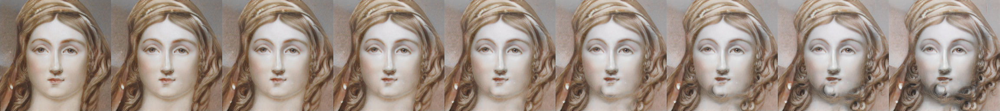

In [ ]:
createImageGrid(img_all, scale=0.25, rows=1)

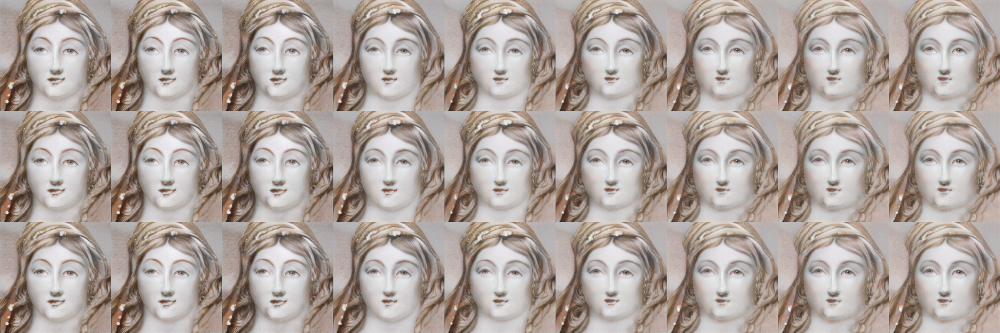

In [ ]:
createImageGrid(img_all, scale=0.25, rows=3)

#cat：生成一张图片并显示(cat_networks.py,img,x,style)

In [ ]:
%cd drive/MyDrive/stylegan2-ada-pytorch

/content/drive/MyDrive/stylegan2-ada-pytorch


In [ ]:
import pickle
def save_variable(v,filename):
    f=open(filename,'wb')
    pickle.dump(v,f)
    f.close()
    return filename
def load_variavle(filename):
    f=open(filename,'rb')
    r=pickle.load(f)
    f.close()
    return r
import os
import re
from typing import List, Optional
import matplotlib.pyplot as plt
import click
import dnnlib
import numpy as np
import PIL.Image
import torch
import legacy
#import training.cat_networks as t_n
from training import cat_networks as t_n
#import training.multi_networks as t_n
#import training.multi_networks_s_fea as t_n

z_dim= 512
c_dim= 0
w_dim= 512
img_resolution= 512
img_channels=3
device=torch.device('cuda')
G_copy=t_n.Generator(z_dim,c_dim,w_dim,img_resolution,img_channels).to(device)
#G_copy.load_state_dict(torch.load("afhqcat.pkl"))
G_copy.load_state_dict(torch.load("cat1.pth"))

const_size= torch.Size([512, 4, 4])


<All keys matched successfully>

Setting up PyTorch plugin "bias_act_plugin"... Done.
初始dtype= torch.float32
修改了block 0 conv1的第 119 mean()= 0.1 minus= 0.18 var()= 0.33 ratio= tensor(2.5308, device='cuda:0', grad_fn=<DivBackward0>)
修改了block 0 conv1的第 481 mean()= 0.17 minus= 0.15 var()= 0.5 ratio= tensor(2.2985, device='cuda:0', grad_fn=<DivBackward0>)
b_modify_num= 0
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
修改了block 1 conv0的第 49 mean()= 0.79 minus= 0.48 var()= 0.41 ratio= tensor(2.6539, device='cuda:0', grad_fn=<DivBackward0>)
修改了block 1 conv0的第 52 mean()= -0.06 minus= -0.25 var()= 0.11 ratio= tensor(-2.1268, device='cuda:0', grad_fn=<DivBackward0>)
修改了block 1 conv0的第 55 mean()= 0.07 minus= -0.19 var()= 0.13 ratio= tensor(-2.1563, device='cuda:0', grad_fn=<DivBackward0>)
修改了block 1 conv0的第 115 mean()= 0.34 minus= 0.24 var()= 0.32 ratio= tensor(3.1299, device='cuda:0', grad_fn=<DivBackward0>)
修改了block 1 conv0的第 122 mean()= 0.19 minus= 0.21 var()= 0.11 ratio= tensor(2.3046, device='cuda:0', grad_fn=<DivBackw

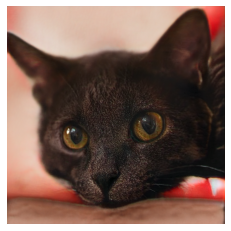

In [ ]:
import pickle
import os
tru=False
img_all=[]
for j in range(1):
  for i_index in range(1):
    if tru:
      mod_0=[99,0,0,0,0,0,0, 0,0]
      mod_1=[0,0,0,0,0,0, 0, 0, 0]
      trun_num=0.55+i_index/20
      #trun_num=1
      ratio_num=2
    else:
      mod_0=[99,1,1,1,0,0,0, 0,0]
      mod_1=[1,1,1,1,0,0, 0, 0, 0]
      trun_num=1
      ratio_num=0+i_index/2
    error_s=77675
    seed = 1815 #@param {type:"slider", min:1, max:10000, step:1}
    Display = True #@param ["True", "False"] {type:"raw", allow-input: true}
    Save = None #@param ["True", "None"] {type:"raw"}
    Only_final = True #@param ["True", "None"] {type:"raw"}
    error_seed = True #@param ["True", "None"] {type:"raw"}
    device='cuda'
    #设置type_data
    type_data='cat'
    save_variable(type_data,'type_data.txt')
    #设置instance normalization False
    In_normalization=False
    save_variable(In_normalization,'In_normalization.txt')
    #设置modify_rate
    modify_rate=1+j
    save_variable(modify_rate,'modify_rate.txt')
    #设置modify_index_conv0

    modify_index_conv0=[99,1,1,1,0,0,0, 0,0]
    #           .1,3,5,7,9,11,13,15
    modify_index_conv0=mod_0
    save_variable(modify_index_conv0,'modify_index_conv0.txt')

    #设置modify_index_conv1
    modify_index_conv1=[1,1,1,1,0,0, 0, 0, 0]
    #          0,2,4,6,8,10,12, 14,16
    modify_index_conv1=mod_1
    save_variable(modify_index_conv1,'modify_index_conv1.txt')
    #设置instance normalization
    In_normalization_cof_conv0=0
    save_variable(In_normalization_cof_conv0,'In_normalization_cof_conv0.txt')
    #设置instance normalization
    In_normalization_cof_conv1=0
    save_variable(In_normalization_cof_conv1,'In_normalization_cof_conv1.txt')
    #设置Only_exetreme True False
    Only_exetreme=False
    save_variable(Only_exetreme,'Only_exetreme.txt')
    #设置Only_exetreme_cof_conv0
    Only_exetreme_cof_conv0=0.1
    save_variable(Only_exetreme_cof_conv0,'Only_exetreme_cof_conv0.txt')

    if error_seed:
      seed=error_s
    z = torch.from_numpy(np.random.RandomState(seed).randn(1, G_copy.z_dim)).to(device)
    label = torch.zeros([1, G_copy.c_dim], device=device)
    truncation_psi=1
    truncation_psi=trun_num
    noise_mode= 'const'
    ws = G_copy.mapping(z, label, truncation_psi=truncation_psi, truncation_cutoff=None)
    img,x_all,y_all,styles_all,str_mod,x_mod_mean_all = G_copy.synthesis(ws, noise_mode=noise_mode)
    display=True


    # True False
    if display:
      img_y = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
      plt.axis('off')
      plt.imshow(img_y[0].cpu().numpy())
      plt.show()
    img_y = img_y.detach().cpu().numpy()
    img_y=PIL.Image.fromarray(img_y[0], 'RGB')
    img_all.append(img_y)

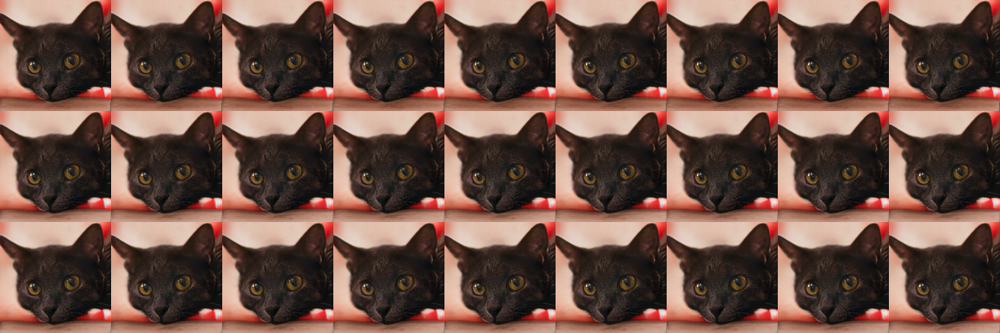

In [ ]:
createImageGrid(img_all, scale=0.25, rows=3)

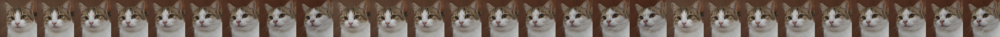

In [ ]:
createImageGrid(img_all, scale=0.25, rows=1)

In [ ]:
str_mod

'_3_0_2_3_2_11_1_0_0_'

In [ ]:
import math
def list_sqrt(a):
  c = []
  for i in range(len(a)):
      c.append(math.sqrt(a[i]))
  return c
def com_mean(a):
  all=0
  for i in a:
    all+=i
  mean=all/len(a)
  return mean
f_name='cat_var_b1_conv1.txt'
#f_name='vari_b0.txt'
mm=load_variavle(f_name)
cc=mm
#cc=list_sqrt(mm)
com_mean(cc)

0.08905608552639516

#生成一张图片并显示(networks.py,img,x,style)

In [ ]:
%cd drive/MyDrive/stylegan2-ada-pytorch

/content/drive/MyDrive/stylegan2-ada-pytorch


In [ ]:
import pickle
def save_variable(v,filename):
    f=open(filename,'wb')
    pickle.dump(v,f)
    f.close()
    return filename
def load_variavle(filename):
    f=open(filename,'rb')
    r=pickle.load(f)
    f.close()
    return r
import os
import re
from typing import List, Optional
import matplotlib.pyplot as plt
import click
import dnnlib
import numpy as np
import PIL.Image
import torch
import legacy
# import training.networks as t_n
import training.network as t_n
#import training.multi_networks as t_n
#import training.multi_networks_s_fea as t_n

z_dim= 512
c_dim= 0
w_dim= 512
img_resolution= 1024
img_channels=3
device=torch.device('cuda')
G_copy=t_n.Generator(z_dim,c_dim,w_dim,img_resolution,img_channels).to(device)
#G_copy.load_state_dict(torch.load("afhqcat.pkl"))
#G_copy.load_state_dict(torch.load("cat1.pth"))
G_copy.load_state_dict(torch.load("ffhq_model.pth"))

<All keys matched successfully>

In [ ]:
a={1:3,2:4}

In [ ]:
f_name_all=['Truncation_10_4_9w','Truncation_07_4_9w']
truncation_dic={'Truncation_10_4_9w':1,'Truncation_10_4_9w':0.7}
truncation_dic[f_name_all[0]]

0.7

This is image 60400


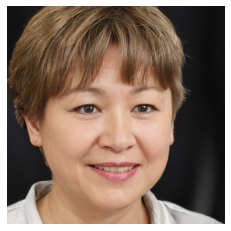

This is image 60401


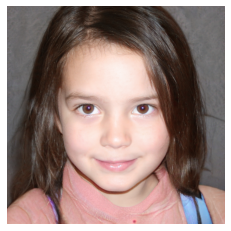

This is image 60402


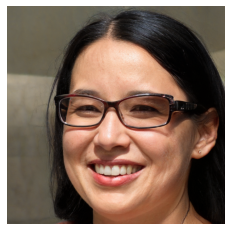

This is image 60403


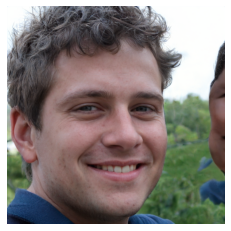

This is image 60404


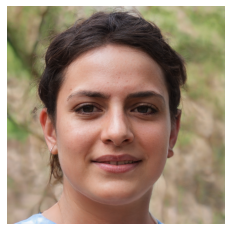

This is image 60405


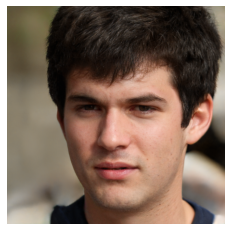

This is image 60406


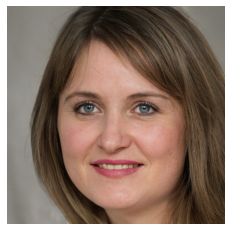

This is image 60407


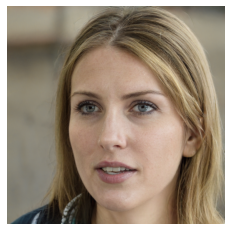

This is image 60408


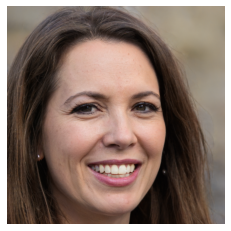

This is image 60409


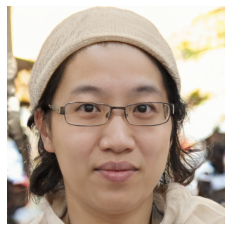

流式输出内容被截断，只能显示最后 5000 行内容。
This is image 85000
This is image 85001
This is image 85002
This is image 85003
This is image 85004
This is image 85005
This is image 85006
This is image 85007
This is image 85008
This is image 85009
This is image 85010
This is image 85011
This is image 85012
This is image 85013
This is image 85014
This is image 85015
This is image 85016
This is image 85017
This is image 85018
This is image 85019
This is image 85020
This is image 85021
This is image 85022
This is image 85023
This is image 85024
This is image 85025
This is image 85026
This is image 85027
This is image 85028
This is image 85029
This is image 85030
This is image 85031
This is image 85032
This is image 85033
This is image 85034
This is image 85035
This is image 85036
This is image 85037
This is image 85038
This is image 85039
This is image 85040
This is image 85041
This is image 85042
This is image 85043
This is image 85044
This is image 85045
This is image 85046
This is image 85047
This is image

In [ ]:

f_name_all=['Truncation_10_4_9w','Truncation_07_4_9w']
truncation_dic={'Truncation_10_4_9w':1,'Truncation_10_4_9w':0.7}
seed_sta_all=[60400,40000]
for l in range(1):
  seed_sta = seed_sta_all[l]
  seed_num=90000-seed_sta
  f_name=f_name_all[l]
  truncation_psi=truncation_dic[f_name]
  for i in range(seed_num):
      seed=seed_sta+i
      if seed>69999 and seed <80000:
        continue
      print('This is image',seed)
      z = torch.from_numpy(np.random.RandomState(seed).randn(1, G_copy.z_dim)).to(device)
      label = torch.zeros([1, G_copy.c_dim], device=device)

      noise_mode= 'const'
      img= G_copy(z, label,truncation_psi=truncation_psi,noise_mode=noise_mode)

      # display
      if i<10:
          display =True
      else:
          display =False
      if display:
          img_y = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
          plt.axis('off')
          plt.imshow(img_y[0].cpu().numpy())
          plt.show()
      Save=True
      sub_name=str(seed)
      if Save:
          img_y = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
          img_y = img_y.detach().cpu().numpy()
          img_y=PIL.Image.fromarray(img_y[0], 'RGB')
  #         img_y.save(f'{f_name}/{sub_name}_{truncation_psi}.png')
          img_y.save(f'{f_name}/{sub_name}.png')

In [ ]:
trun_num

0.9500000000000001

In [ ]:
import pickle
import os
im_all=[]
#del  img_y
tru=True
for j in range(1):
  for i_index in range(8):
    if tru:
      mod_0=[99,0,0,0,0,0,0, 0,0]
      mod_1=[0,0,0,0,0,0, 0, 0, 0]
      trun_num=0.3+i_index/10
      #trun_num=1
      ratio_num=2
    else:
      mod_0=[99,0,0,1,0,0,0, 0,0]
      mod_1=[0,0,1,0,0,0, 0, 0, 0]
      trun_num=1
      ratio_num=1+i_index/2
    ratio_num=2
    error_s=79773
    seed = 1815 #@param {type:"slider", min:1, max:10000, step:1}
    Display = True #@param ["True", "False"] {type:"raw", allow-input: true}
    Save = True #@param ["True", "None"] {type:"raw"}
    Only_final = True #@param ["True", "None"] {type:"raw"}
    error_seed = True #@param ["True", "None"] {type:"raw"}
    device='cuda'
    #设置only_collect
    only_collect=True
    save_variable(only_collect,'only_collect.txt')
    #设置target_modify
    target_modify=False
    save_variable(target_modify,'target_modify.txt')
    #设置modify_rate
    modify_rate=2+j
    save_variable(modify_rate,'modify_rate.txt')

    #设置ratio
    #ratio_threshold=2
    ratio_threshold=ratio_num
    save_variable(ratio_threshold,'ratio_threshold.txt')
    #设置instance normalization
    In_normalization=False
    save_variable(In_normalization,'In_normalization.txt')
    #设置modify_index_conv0
    modify_index_conv0=mod_0
    #           .1,3,5,7,9,11,13,15
    save_variable(modify_index_conv0,'v2_modify_index_conv0.txt')

    #设置modify_index_conv1
    modify_index_conv1=mod_1
    #          0,2,4,6,8,10,12, 14,16
    save_variable(modify_index_conv1,'v2_modify_index_conv1.txt')
    #设置instance normalization
    In_normalization_cof_conv0=0
    save_variable(In_normalization_cof_conv0,'In_normalization_cof_conv0.txt')
    #设置instance normalization
    In_normalization_cof_conv1=0
    save_variable(In_normalization_cof_conv1,'In_normalization_cof_conv1.txt')
    #设置Only_exetreme True False
    Only_exetreme=True
    save_variable(Only_exetreme,'Only_exetreme.txt')
    #设置Only_exetreme_cof_conv0
    Only_exetreme_cof_conv0=1

    save_variable(Only_exetreme_cof_conv0,'Only_exetreme_cof_conv0.txt')
    if error_seed:
      seed=error_s
    z = torch.from_numpy(np.random.RandomState(seed).randn(1, G_copy.z_dim)).to(device)
    label = torch.zeros([1, G_copy.c_dim], device=device)
    truncation_psi=trun_num
    noise_mode= 'const'
    ws = G_copy.mapping(z, label, truncation_psi=truncation_psi, truncation_cutoff=None)
    img,x_all,y_all,styles_all,str_mod,x_mod_mean_all = G_copy.synthesis(ws, noise_mode=noise_mode)
    f_name='Const_c'
    sub_name=str(seed)+str_mod
    if Save:
      img_y = (img[8].permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
      img_y = img_y.detach().cpu().numpy()
      img_y=PIL.Image.fromarray(img_y[0], 'RGB')
      #img_y.save(f'{f_name}/{sub_name}_{truncation_psi}.png')
      #img = img.resize((128,128), PIL.Image.ANTIALIAS)
      #index_mean=record_mean(x_all)
      #save_variable(index_mean,f_name)
      #mean_all.append(index_mean)

      #img_y.save(f'{f_name}/{sub_name}_{truncation_psi}.png')

    display=True
    # True False
    if display:
      img_y = (img[8].permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
      plt.axis('off')
      plt.imshow(img_y[0].cpu().numpy())
      plt.show()
    im_all.append(img_y)

In [ ]:
from tqdm import tqdm
for i in trange(3,7):
  print(i)

100%|██████████| 4/4 [00:00<00:00, 24209.55it/s]

3
4
5
6


In [ ]:
i

1

In [ ]:
import seaborn as sns
sta=1
end=sta+1
for j in range(sta,end):
  cc=x_mod_mean_all[j]
  for j in cc:
    ax = sns.heatmap(j.detach().cpu().numpy(),center=0.0)
    plt.show()

In [ ]:
createImageGrid(im_all, scale=0.25, rows=3)

In [ ]:
str_mod

'_'

#Rebuttal,生成10000张t=1的图片

In [ ]:
%cd drive/MyDrive/stylegan2-ada-pytorch

/content/drive/MyDrive/stylegan2-ada-pytorch


In [ ]:
import pickle
def save_variable(v,filename):
    f=open(filename,'wb')
    pickle.dump(v,f)
    f.close()
    return filename
def load_variavle(filename):
    f=open(filename,'rb')
    r=pickle.load(f)
    f.close()
    return r
import os
import re
from typing import List, Optional
import matplotlib.pyplot as plt
import click
import dnnlib
import numpy as np
import PIL.Image
import torch
import legacy
import training.networks as t_n
#import training.multi_networks as t_n
#import training.multi_networks_s_fea as t_n

z_dim= 512
c_dim= 0
w_dim= 512
img_resolution= 512
img_channels=3
device=torch.device('cuda')
G_copy=t_n.Generator(z_dim,c_dim,w_dim,img_resolution,img_channels).to(device)
#G_copy.load_state_dict(torch.load("afhqcat.pkl"))
G_copy.load_state_dict(torch.load("cat1.pth"))
#G_copy.load_state_dict(torch.load("ffhq_model.pth"))

const_size= torch.Size([512, 4, 4])


<All keys matched successfully>

In [ ]:
import pickle
import os
im_all=[]
#del  img_y
tru=False
for j in range(1):
  for i_index in range(2000):
    if tru:
      mod_0=[99,0,0,0,0,0,0, 0,0]
      mod_1=[0,0,0,0,0,0, 0, 0, 0]
      trun_num=0.3+i_index/10
      #trun_num=1
      ratio_num=2
    else:
      mod_0=[99,1,1,1,0,0,0, 0,0]
      mod_1=[1,1,1,1,0,0, 0, 0, 0]
      trun_num=1
      ratio_num=1+i_index/2
    ratio_num=0.5
    seed = 1176 #@param {type:"slider", min:0, max:100000, step:1}
    Display = True #@param ["True", "False"] {type:"raw", allow-input: true}
    Save = True #@param ["True", "None"] {type:"raw"}
    Only_final = True #@param ["True", "None"] {type:"raw"}
    device='cuda'
    #设置only_collect
    only_collect=True
    save_variable(only_collect,'only_collect.txt')
    #设置target_modify
    target_modify=False
    save_variable(target_modify,'target_modify.txt')
    #设置modify_rate
    modify_rate=2
    save_variable(modify_rate,'modify_rate.txt')

    #设置ratio
    ratio_threshold=2
    ratio_threshold=ratio_num
    save_variable(ratio_threshold,'ratio_threshold.txt')
    #设置instance normalization
    In_normalization=False
    save_variable(In_normalization,'In_normalization.txt')
    #设置modify_index_conv0
    modify_index_conv0=mod_0
    #           .1,3,5,7,9,11,13,15
    save_variable(modify_index_conv0,'v2_modify_index_conv0.txt')

    #设置modify_index_conv1
    modify_index_conv1=mod_1
    #          0,2,4,6,8,10,12, 14,16
    save_variable(modify_index_conv1,'v2_modify_index_conv1.txt')
    #设置instance normalization
    In_normalization_cof_conv0=0
    save_variable(In_normalization_cof_conv0,'In_normalization_cof_conv0.txt')
    #设置instance normalization
    In_normalization_cof_conv1=0
    save_variable(In_normalization_cof_conv1,'In_normalization_cof_conv1.txt')
    #设置Only_exetreme True False
    Only_exetreme=False
    save_variable(Only_exetreme,'Only_exetreme.txt')
    #设置Only_exetreme_cof_conv0
    Only_exetreme_cof_conv0=0

    save_variable(Only_exetreme_cof_conv0,'Only_exetreme_cof_conv0.txt')

    z = torch.from_numpy(np.random.RandomState(seed+i_index).randn(1, G_copy.z_dim)).to(device)
    label = torch.zeros([1, G_copy.c_dim], device=device)
    truncation_psi=trun_num
    noise_mode= 'const'
    ws = G_copy.mapping(z, label, truncation_psi=truncation_psi, truncation_cutoff=None)
    img,x_all,y_all,styles_all,str_mod,x_mod_mean_all = G_copy.synthesis(ws, noise_mode=noise_mode)
    f_name='cat_modify_t05'
    sub_name=str(seed+i_index)+'t05'
    if Save:
      img_y = (img[0].permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
      img_y = img_y.detach().cpu().numpy()
      img_y=PIL.Image.fromarray(img_y[0], 'RGB')
      #img = img.resize((128,128), PIL.Image.ANTIALIAS)
      #index_mean=record_mean(x_all)
      #save_variable(index_mean,f_name)
      #mean_all.append(index_mean)

      img_y.save(f'{f_name}/{sub_name}.png')

    display=False
    # True False
    if display:
      img_y = (img[8].permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
      plt.axis('off')
      plt.imshow(img_y[0].cpu().numpy())
      plt.show()
    im_all.append(img_y)

#调试整体layer

In [ ]:
sta=2
end=sta+1
def sns_mean_var(sta,end,x_all):
  for j in range(sta,end):
    bb=x_all[j]
    if len(bb)==1:
      bb=bb[0]
    import seaborn as sns
    #cc=load_variavle('x_358.txt')
    plt.axis('off')
    cc=0
    for i in bb:
      #print(cc)
      cc+=i
    cc=cc/len(bb)
    dd=cc>2*cc.mean()
    print(cc.mean())
    print(dd)
    #ax.set_axis_off
    ax = sns.heatmap(cc.detach().cpu().numpy(),center=0.0)
    plt.show()
    ax = sns.heatmap((cc*dd).detach().cpu().numpy(),center=0.0)

    #plt.imshow(ax)
    print('mean')
    plt.show()
    scatter_fig = ax.get_figure()
    #scatter_fig.savefig('sns_1.png', dpi = 400)
    #plt.imshow(cc.detach().cpu().numpy())
    #plt.show()
    #ax.savefig('sns_1.png')
    print(cc.var())
    var_channel=0
    dis_play=True
    if dis_play:
      for i in bb:
        var_channel+=(i).pow(2)
      plt.axis('off')
      var_channel=var_channel/len(bb)
      dd=var_channel>2*var_channel.mean()

      ax = sns.heatmap(var_channel.detach().cpu().numpy(),center=0.1)
      plt.show()
      cancer=var_channel*dd
      ax = sns.heatmap(cancer.detach().cpu().numpy(),center=0.1)
      #ax = sns.heatmap(var_channel.detach().cpu().numpy(),center=0.1)
      print('var')
      plt.show()
  return cancer

In [ ]:
x_all

NameError: ignored

In [ ]:
cancer=sns_mean_var(5,6,x_mod_mean_all)

In [ ]:
cc=var_channel*(var_channel>3*var_channel.mean())
cc

tensor([[-0.0000, -0.0000, -0.0000, -0.0000, 0.0000, 0.0000, 0.0000, -0.0000, -0.0000,
         -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, 0.0000],
        [-0.0000, -0.0000, -0.0000, 0.0000, 0.0000, 0.0000, -0.0000, -0.0000, -0.0000,
         -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000],
        [0.0000, -0.0000, -0.0000, 0.0000, 0.0000, 0.0000, -0.0000, -0.0000, -0.0000,
         -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000],
        [-0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000,
         -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000],
        [-0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000,
         -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000],
        [-0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000,
         -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000, -0.0000],
        [-0.0000, -0.0000, -0.000

In [ ]:
zz=x_all[4][0]

In [ ]:
var_channel=zz[435]

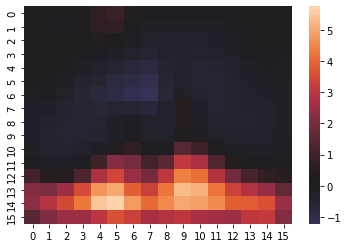

In [ ]:
ax = sns.heatmap(var_channel.detach().cpu().numpy(),center=0.1)
plt.show()

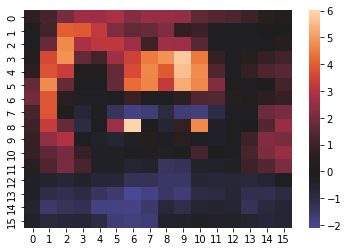

In [ ]:
ax = sns.heatmap(x_0[0][10].detach().cpu().numpy(),center=0.1)
plt.show()

In [ ]:
dd=cc.detach().cpu().numpy()

In [ ]:
mask=var_channel>3*var_channel.mean()

In [ ]:
x_0=torch.nn.functional.interpolate(x_7, size=None, scale_factor=0.25, mode='nearest', align_corners=None, recompute_scale_factor=None)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "


In [ ]:
x_1=torch.nn.functional.interpolate(x_7, size=None, scale_factor=0.0625, mode='nearest', align_corners=None, recompute_scale_factor=None)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "


In [ ]:
x_7=x_all[11][0]

In [ ]:
sum(sum(mask*x_0[0][37]))/sum(sum(x_0[0][37]))

tensor(0.8730, device='cuda:0', grad_fn=<DivBackward0>)

In [ ]:
cof_col=[]
for i_index,i in enumerate(x_1[0]):
  cof=sum(sum(mask*i.abs()))/sum(sum(i.abs()))
  print(cof)
  if cof>0.35:
    #ax = sns.heatmap(i.detach().cpu().numpy(),center=0.1)
    #plt.show()
    cof_col.append(i_index)

In [ ]:
cof_col

In [ ]:
ee_16=dd
zz_16=(ee_16==0)*1+(ee_16>0)*0.5
save_variable(zz_16,'zz_16.txt')

'zz_16.txt'

In [ ]:
ee=dd[::4,0::4]
zz_32=(ee==0)*1+(ee>0)*0.5
ee_16=dd[::8,0::8]
zz_16=(ee_16==0)*1+(ee_16>0)*0.5

In [ ]:
ee_8=dd[::16,0::16]
zz_8=(ee_8==0)*1+(ee_8>0)*0.5

In [ ]:
ee_64=dd[::2,0::2]
zz_64=(ee_64==0)*1+(ee_64>0)*0.5

In [ ]:
save_variable(zz_64,'zz_64.txt')
save_variable(zz_32,'zz_32.txt')
save_variable(zz_16,'zz_16.txt')

'zz_16.txt'

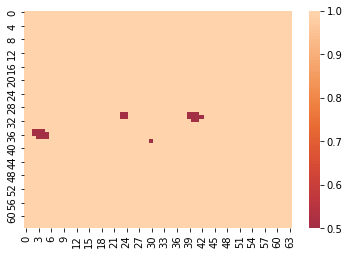

In [ ]:
ax = sns.heatmap(zz_64,center=0.1)
plt.show()

In [ ]:
#想要这些亮点的值为一半，其他值为1
aa=(ee>0)*0.5
bb=ee==0

In [ ]:
zz=(ee==0)*1+(ee>0)*0.5

In [ ]:
zz

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

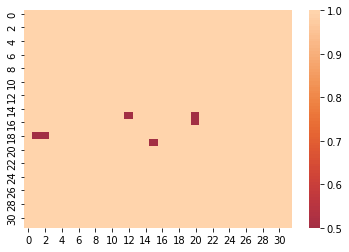

In [ ]:
ax = sns.heatmap(zz,center=0.1)
plt.show()

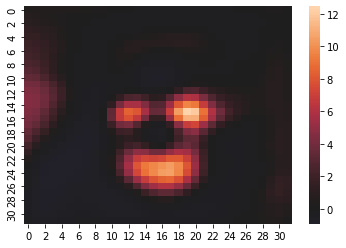

In [ ]:
a = x_all[5][0]
a_32=a[0][0]
ax = sns.heatmap(a_32.detach().cpu().numpy(),center=0.1)
plt.show()

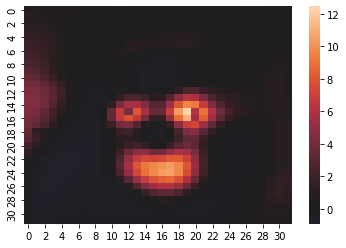

In [ ]:
nn=a_32.detach().cpu()*zz
ax = sns.heatmap(nn.detach().cpu().numpy(),center=0.1)
plt.show()

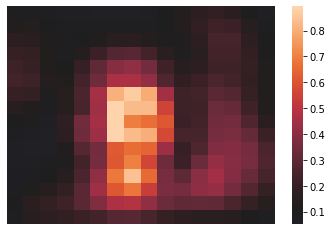

In [ ]:

for j in range(sta,end):
  bb=x_all[j][0]
  if len(bb)==1:
    bb=bb[0]
  var_channel=0
  for i in bb.abs():
    var_channel+=(i-cc).pow(2)
  plt.axis('off')
  var_channel=var_channel/len(bb)
  ax = sns.heatmap(var_channel.detach().cpu().numpy(),center=0.1)
  plt.show()

In [ ]:
zz=bb[0]

AttributeError: ignored

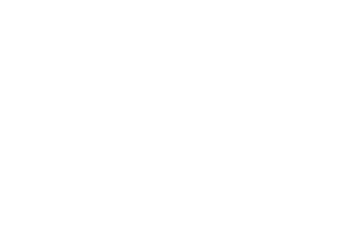

In [ ]:
cc=x_mod_mean_all[8]
import seaborn as sns
#cc=load_variavle('x_358.txt')
plt.axis('off')
print(cc.mean(),cc.var())
ax = sns.heatmap(cc.detach().cpu().numpy(),center=0.1)
#plt.imshow(cc[0].detach().cpu().numpy(),cmap="gray")
plt.show()

In [ ]:
import pickle
import os
error_s=79005
seed = 1815 #@param {type:"slider", min:1, max:10000, step:1}
Display = True #@param ["True", "False"] {type:"raw", allow-input: true}
Save = None #@param ["True", "None"] {type:"raw"}
Only_final = True #@param ["True", "None"] {type:"raw"}
error_seed = True #@param ["True", "None"] {type:"raw"}
device='cuda'
#设置instance normalization
In_normalization=False
save_variable(In_normalization,'In_normalization.txt')
#设置modify_index_conv0
modify_index_conv0=[99,1,1,1,0,0,0, 0,0]
#           .1,3,5,7,9,11,13,15
save_variable(modify_index_conv0,'modify_index_conv0.txt')

#设置modify_index_conv1
modify_index_conv1=[1,1,1,1,0,0, 0, 0, 0]
#          0,2,4,6,8,10,12, 14,16
save_variable(modify_index_conv1,'modify_index_conv1.txt')
#设置instance normalization
In_normalization_cof_conv0=3
save_variable(In_normalization_cof_conv0,'In_normalization_cof_conv0.txt')
#设置instance normalization
In_normalization_cof_conv1=3
save_variable(In_normalization_cof_conv1,'In_normalization_cof_conv1.txt')
#设置Only_exetreme True False
Only_exetreme=True
save_variable(Only_exetreme,'Only_exetreme.txt')
#设置Only_exetreme_cof_conv0
Only_exetreme_cof_conv0=1
save_variable(Only_exetreme_cof_conv0,'Only_exetreme_cof_conv0.txt')

if error_seed:
  seed=error_s
z = torch.from_numpy(np.random.RandomState(seed).randn(1, G_copy.z_dim)).to(device)
label = torch.zeros([1, G_copy.c_dim], device=device)
truncation_psi=1
noise_mode= 'const'
ws = G_copy.mapping(z, label, truncation_psi=truncation_psi, truncation_cutoff=None)
img,x_all_1,y_all,styles_all,str_mod,x_mod_mean_all = G_copy.synthesis(ws, noise_mode=noise_mode)
display=True
# True False
if display:
  img_y = (img[8].permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  plt.axis('off')
  plt.imshow(img_y[0].cpu().numpy())
  plt.show()

In [ ]:
str_mod

'_5_22_17_16_13_6_16_'

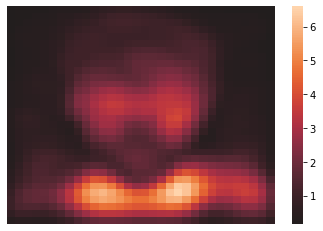

In [ ]:
import seaborn as sns
def show_heat(x):
  plt.axis('off')
  img_feature=x.detach().cpu().numpy()
  ax = sns.heatmap(img_feature, center=0)
show_heat(x_mod_mean_all[6])


In [ ]:
styles_all1=styles_all
list(zip(range(512),styles_all1[4][0][0]))

In [ ]:
f_name='styles_m_b4_conv0.txt'
mm=load_variavle(f_name)
list(zip(range(512),mm))

In [ ]:
import math
math.log(4,2)

2.0

In [ ]:
ccc=styles_all[4][1][0]
list(zip(range(512),ccc))

In [ ]:

ddd=load_variavle('./styles_3000/78000.txt')
#ddd=load_variavle('styles_m_b4_conv1.txt')
eee=ddd[5][0]
#list(zip(range(512),ddd[8][0]))

In [ ]:
list(zip(range(512),list_sub(ccc,ddd)))

In [ ]:
f='styles_3000/77000.txt'
save_variable(s1,f)

'styles_3000/77000.txt'

In [ ]:
ccc=load_variavle(f)

#没有叠加过的rgb图像

In [ ]:
#@title
if Save or Display:
  for x,y in enumerate(y_all):
    img_y = (y.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    if Save:
      PIL.Image.fromarray(img_y[0].cpu().numpy(), 'RGB').save(f'out_Gcopy/seed{seed:04d}blcok{x}.png')
    if Display:
      plt.axis('off')
      plt.imshow(img_y[0])
      plt.show()

#叠加过的rgb图像

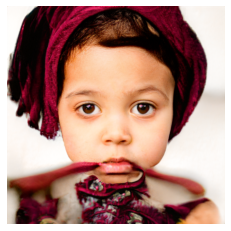

In [ ]:
if Save or Display:
  for x,y in enumerate(img):
    img_y = (y.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    if Only_final and x<8:
      continue
    else:
      if Save:
        PIL.Image.fromarray(img_y[0].cpu().numpy(), 'RGB').save(f'out_Gcopy/seed{seed:04d}blcok{x}.png')
      if Display:
        plt.axis('off')
        plt.imshow(img_y[0])
        plt.show()

#总结：
1、如397的问题是不好向前追溯的，只能在block3解决问题，block1不行，2没试过
2、如058的问题就能追溯到block1，并且效果最好，在block2解决时有效果，但是没有在block1解决问题好，或许问题就是这一层出来的。
3、如397的问题基本可以确定后面行成的，因为把block1的feature map前三百，或者后三百全部置0，后面还是照样出现问题。（之后可以试试如058类的问题）
4、找出的某一层的feature map往往可以解决一类问题，所以这是说明了什么呢？


In [ ]:
#fea_name=str(seed)+'_block'+str(display_block)
ccc=range(100,200)

list(ccc)

#Feature map的显示1

这是feature map 1 tensor(-0.1919, device='cuda:0', grad_fn=<MeanBackward0>)


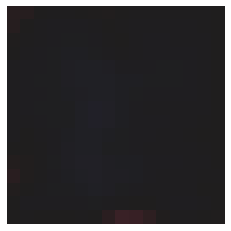

这是feature map 2 tensor(-0.0669, device='cuda:0', grad_fn=<MeanBackward0>)


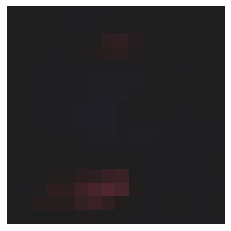

这是feature map 3 tensor(-0.0125, device='cuda:0', grad_fn=<MeanBackward0>)


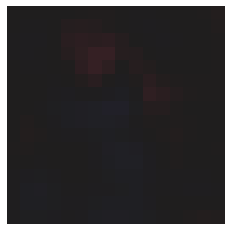

这是feature map 4 tensor(-0.0866, device='cuda:0', grad_fn=<MeanBackward0>)


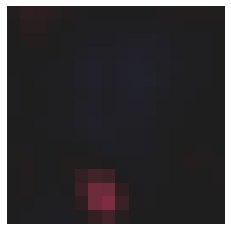

这是feature map 5 tensor(-0.0383, device='cuda:0', grad_fn=<MeanBackward0>)


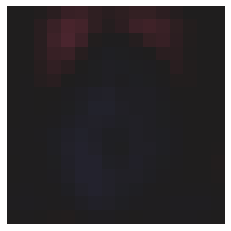

这是feature map 6 tensor(-0.0302, device='cuda:0', grad_fn=<MeanBackward0>)


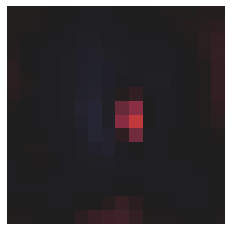

这是feature map 7 tensor(-0.3771, device='cuda:0', grad_fn=<MeanBackward0>)


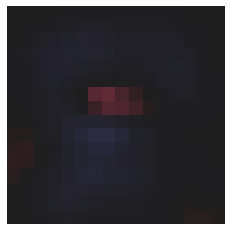

这是feature map 8 tensor(0.0526, device='cuda:0', grad_fn=<MeanBackward0>)


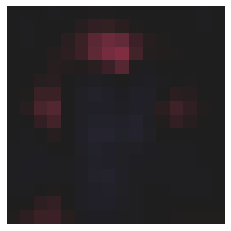

这是feature map 9 tensor(-0.0938, device='cuda:0', grad_fn=<MeanBackward0>)


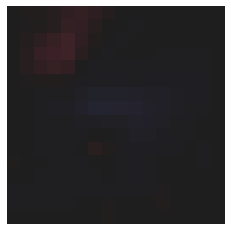

这是feature map 10 tensor(0.0316, device='cuda:0', grad_fn=<MeanBackward0>)


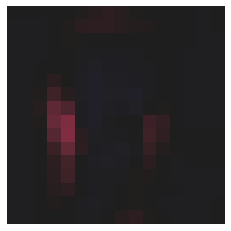

这是feature map 11 tensor(0.1592, device='cuda:0', grad_fn=<MeanBackward0>)


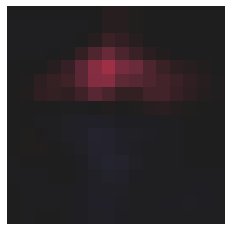

这是feature map 12 tensor(0.5799, device='cuda:0', grad_fn=<MeanBackward0>)


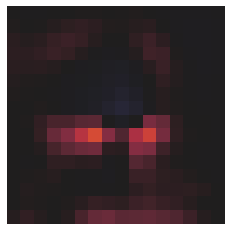

这是feature map 13 tensor(0.0891, device='cuda:0', grad_fn=<MeanBackward0>)


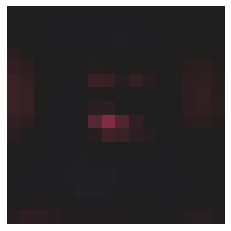

这是feature map 14 tensor(-0.1633, device='cuda:0', grad_fn=<MeanBackward0>)


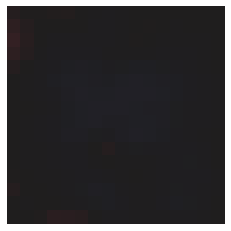

这是feature map 15 tensor(0.2521, device='cuda:0', grad_fn=<MeanBackward0>)


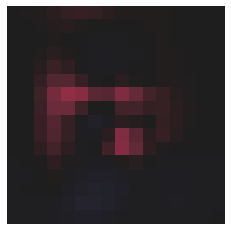

这是feature map 16 tensor(-0.2172, device='cuda:0', grad_fn=<MeanBackward0>)


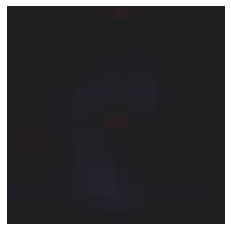

这是feature map 17 tensor(-0.1494, device='cuda:0', grad_fn=<MeanBackward0>)


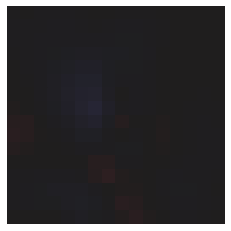

这是feature map 18 tensor(-0.1790, device='cuda:0', grad_fn=<MeanBackward0>)


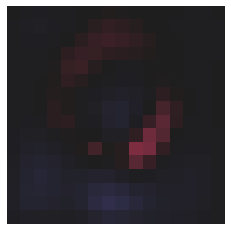

这是feature map 19 tensor(-0.0591, device='cuda:0', grad_fn=<MeanBackward0>)


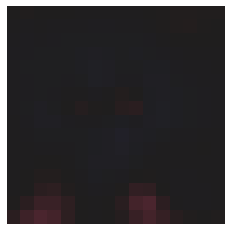

这是feature map 20 tensor(-0.1412, device='cuda:0', grad_fn=<MeanBackward0>)


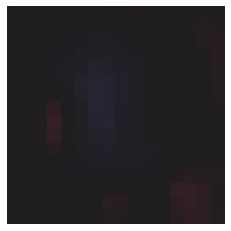

这是feature map 21 tensor(-0.3232, device='cuda:0', grad_fn=<MeanBackward0>)


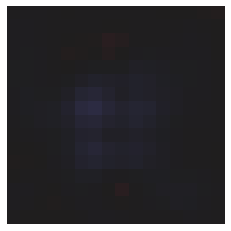

这是feature map 22 tensor(0.2542, device='cuda:0', grad_fn=<MeanBackward0>)


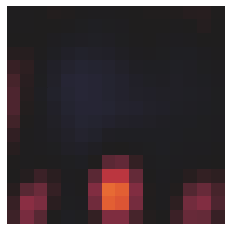

这是feature map 23 tensor(-0.1209, device='cuda:0', grad_fn=<MeanBackward0>)


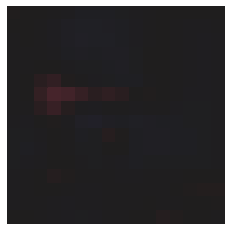

这是feature map 24 tensor(-0.0896, device='cuda:0', grad_fn=<MeanBackward0>)


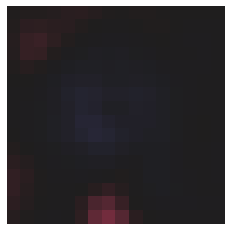

这是feature map 25 tensor(-0.1459, device='cuda:0', grad_fn=<MeanBackward0>)


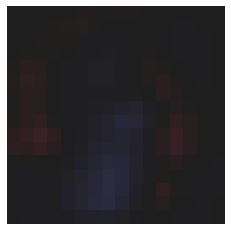

这是feature map 26 tensor(-0.2466, device='cuda:0', grad_fn=<MeanBackward0>)


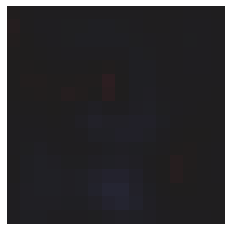

这是feature map 27 tensor(-0.1848, device='cuda:0', grad_fn=<MeanBackward0>)


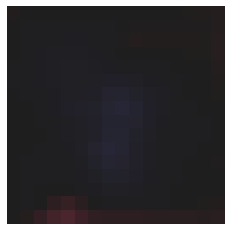

这是feature map 28 tensor(-0.0614, device='cuda:0', grad_fn=<MeanBackward0>)


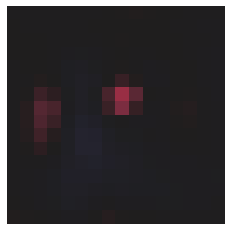

这是feature map 29 tensor(0.2437, device='cuda:0', grad_fn=<MeanBackward0>)


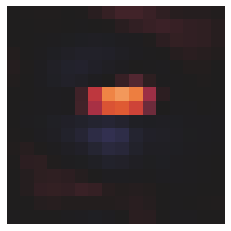

这是feature map 30 tensor(0.9495, device='cuda:0', grad_fn=<MeanBackward0>)


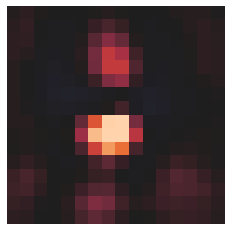

这是feature map 31 tensor(0.0067, device='cuda:0', grad_fn=<MeanBackward0>)


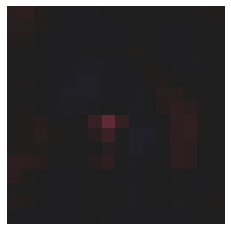

这是feature map 32 tensor(0.2803, device='cuda:0', grad_fn=<MeanBackward0>)


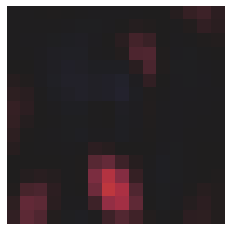

这是feature map 33 tensor(-0.0153, device='cuda:0', grad_fn=<MeanBackward0>)


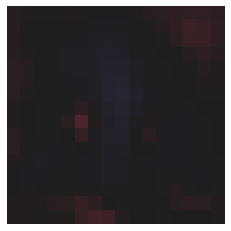

这是feature map 34 tensor(0.0946, device='cuda:0', grad_fn=<MeanBackward0>)


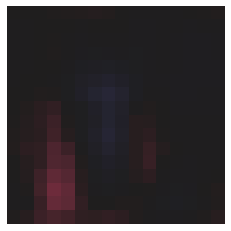

这是feature map 35 tensor(0.0712, device='cuda:0', grad_fn=<MeanBackward0>)


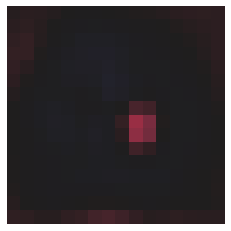

这是feature map 36 tensor(-0.3290, device='cuda:0', grad_fn=<MeanBackward0>)


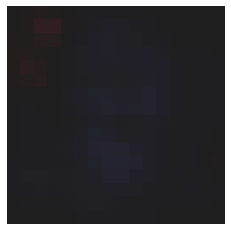

这是feature map 37 tensor(0.0363, device='cuda:0', grad_fn=<MeanBackward0>)


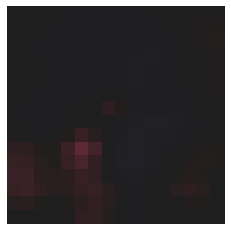

这是feature map 38 tensor(0.0158, device='cuda:0', grad_fn=<MeanBackward0>)


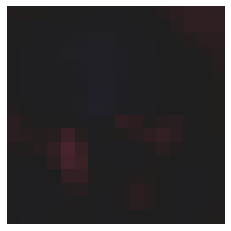

这是feature map 39 tensor(0.1114, device='cuda:0', grad_fn=<MeanBackward0>)


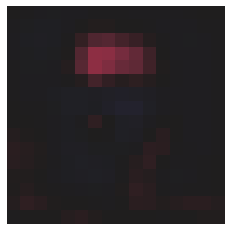

这是feature map 40 tensor(0.7464, device='cuda:0', grad_fn=<MeanBackward0>)


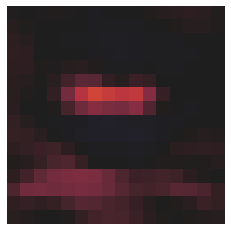

这是feature map 41 tensor(-0.2428, device='cuda:0', grad_fn=<MeanBackward0>)


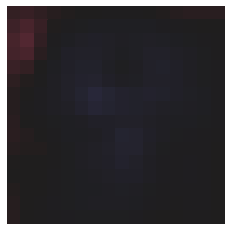

这是feature map 42 tensor(0.0929, device='cuda:0', grad_fn=<MeanBackward0>)


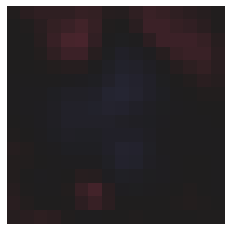

这是feature map 43 tensor(-0.2627, device='cuda:0', grad_fn=<MeanBackward0>)


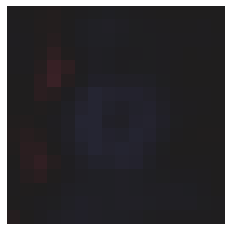

这是feature map 44 tensor(0.0043, device='cuda:0', grad_fn=<MeanBackward0>)


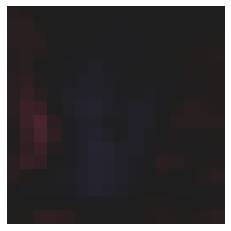

这是feature map 45 tensor(-0.0002, device='cuda:0', grad_fn=<MeanBackward0>)


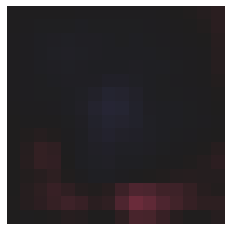

这是feature map 46 tensor(0.2671, device='cuda:0', grad_fn=<MeanBackward0>)


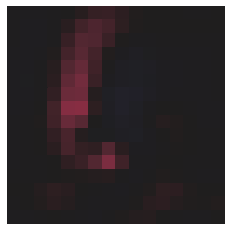

这是feature map 47 tensor(0.0832, device='cuda:0', grad_fn=<MeanBackward0>)


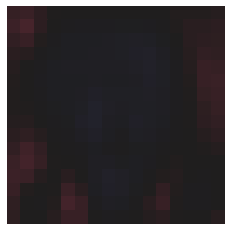

这是feature map 48 tensor(-0.3104, device='cuda:0', grad_fn=<MeanBackward0>)


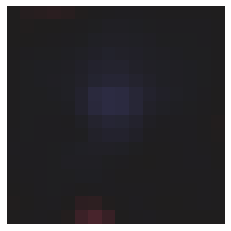

这是feature map 49 tensor(-0.0334, device='cuda:0', grad_fn=<MeanBackward0>)


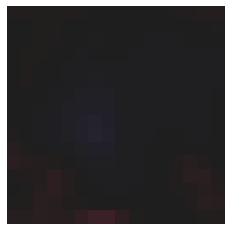

这是feature map 50 tensor(0.3163, device='cuda:0', grad_fn=<MeanBackward0>)


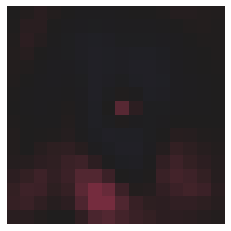

这是feature map 51 tensor(0.0959, device='cuda:0', grad_fn=<MeanBackward0>)


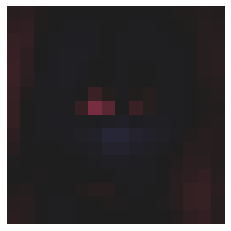

这是feature map 52 tensor(0.0057, device='cuda:0', grad_fn=<MeanBackward0>)


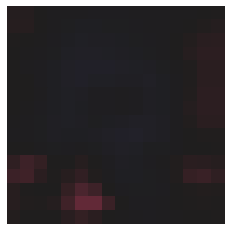

这是feature map 53 tensor(-0.0116, device='cuda:0', grad_fn=<MeanBackward0>)


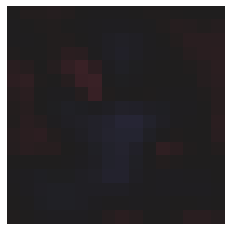

这是feature map 54 tensor(-0.1340, device='cuda:0', grad_fn=<MeanBackward0>)


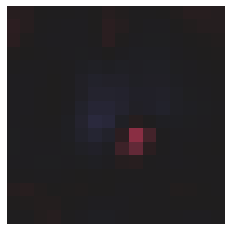

这是feature map 55 tensor(0.1306, device='cuda:0', grad_fn=<MeanBackward0>)


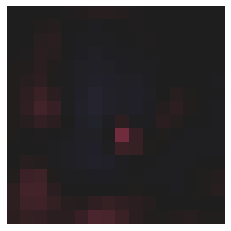

这是feature map 56 tensor(-0.0412, device='cuda:0', grad_fn=<MeanBackward0>)


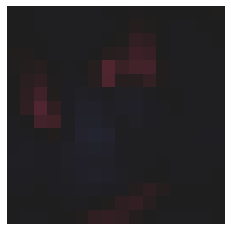

这是feature map 57 tensor(-0.0259, device='cuda:0', grad_fn=<MeanBackward0>)


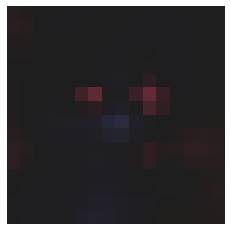

这是feature map 58 tensor(0.1818, device='cuda:0', grad_fn=<MeanBackward0>)


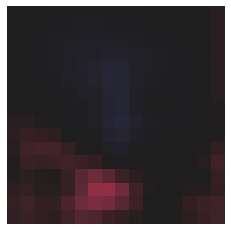

这是feature map 59 tensor(-0.1090, device='cuda:0', grad_fn=<MeanBackward0>)


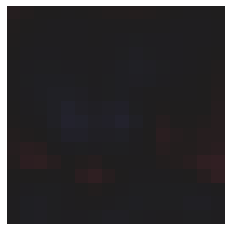

这是feature map 60 tensor(0.2322, device='cuda:0', grad_fn=<MeanBackward0>)


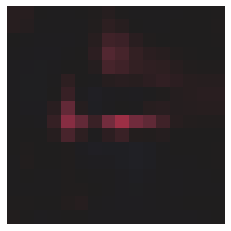

这是feature map 61 tensor(-0.0343, device='cuda:0', grad_fn=<MeanBackward0>)


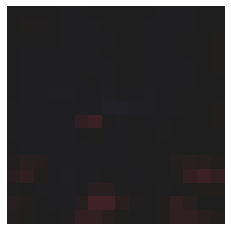

这是feature map 62 tensor(0.0538, device='cuda:0', grad_fn=<MeanBackward0>)


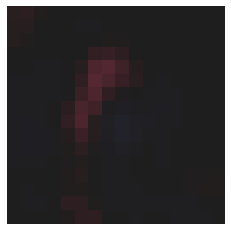

这是feature map 63 tensor(0.0479, device='cuda:0', grad_fn=<MeanBackward0>)


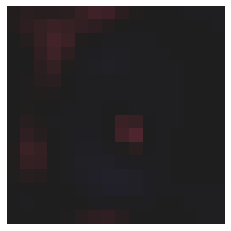

这是feature map 64 tensor(-0.1639, device='cuda:0', grad_fn=<MeanBackward0>)


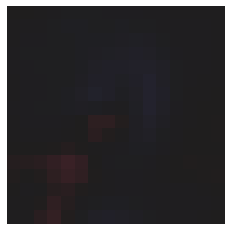

这是feature map 65 tensor(-0.1772, device='cuda:0', grad_fn=<MeanBackward0>)


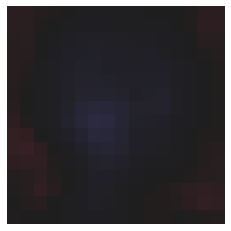

这是feature map 66 tensor(-0.0994, device='cuda:0', grad_fn=<MeanBackward0>)


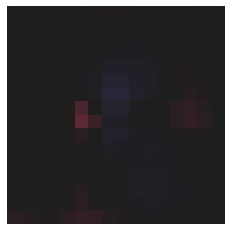

这是feature map 67 tensor(0.1960, device='cuda:0', grad_fn=<MeanBackward0>)


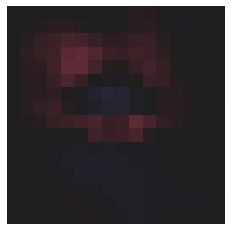

这是feature map 68 tensor(-0.1535, device='cuda:0', grad_fn=<MeanBackward0>)


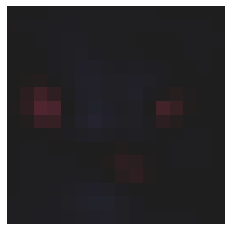

这是feature map 69 tensor(-0.0278, device='cuda:0', grad_fn=<MeanBackward0>)


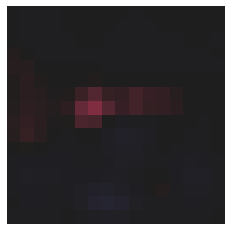

这是feature map 70 tensor(-0.0094, device='cuda:0', grad_fn=<MeanBackward0>)


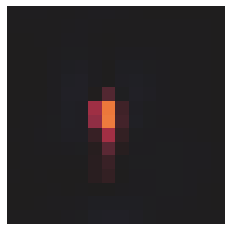

这是feature map 71 tensor(0.3820, device='cuda:0', grad_fn=<MeanBackward0>)


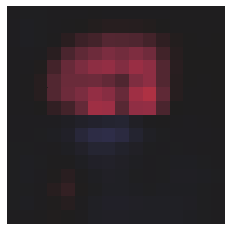

这是feature map 72 tensor(0.1993, device='cuda:0', grad_fn=<MeanBackward0>)


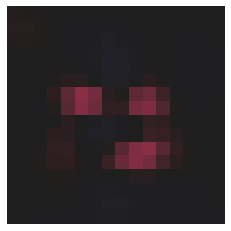

这是feature map 73 tensor(-0.1056, device='cuda:0', grad_fn=<MeanBackward0>)


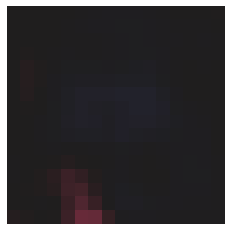

这是feature map 74 tensor(-0.0390, device='cuda:0', grad_fn=<MeanBackward0>)


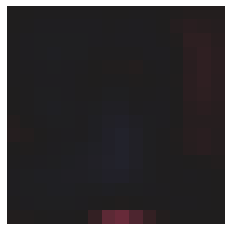

这是feature map 75 tensor(0.1481, device='cuda:0', grad_fn=<MeanBackward0>)


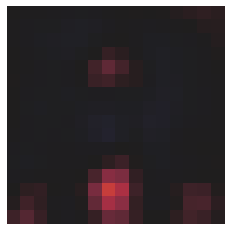

这是feature map 76 tensor(-0.1593, device='cuda:0', grad_fn=<MeanBackward0>)


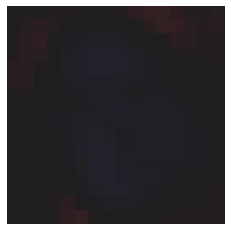

这是feature map 77 tensor(-0.2436, device='cuda:0', grad_fn=<MeanBackward0>)


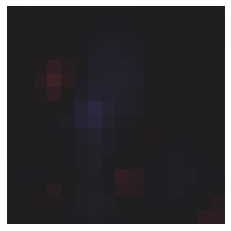

这是feature map 78 tensor(-0.0740, device='cuda:0', grad_fn=<MeanBackward0>)


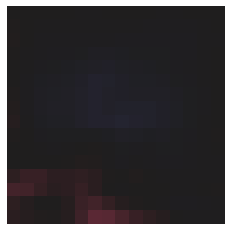

这是feature map 79 tensor(0.0053, device='cuda:0', grad_fn=<MeanBackward0>)


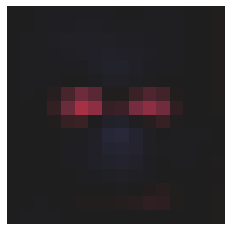

这是feature map 80 tensor(-0.2111, device='cuda:0', grad_fn=<MeanBackward0>)


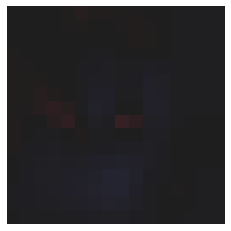

这是feature map 81 tensor(0.0094, device='cuda:0', grad_fn=<MeanBackward0>)


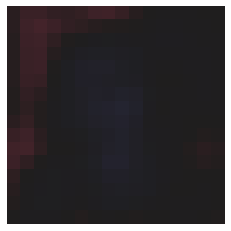

这是feature map 82 tensor(-0.1319, device='cuda:0', grad_fn=<MeanBackward0>)


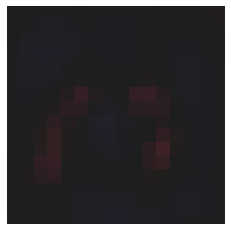

这是feature map 83 tensor(-0.1380, device='cuda:0', grad_fn=<MeanBackward0>)


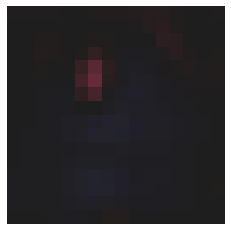

这是feature map 84 tensor(-0.2587, device='cuda:0', grad_fn=<MeanBackward0>)


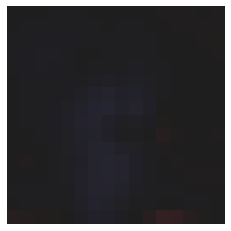

这是feature map 85 tensor(-0.1980, device='cuda:0', grad_fn=<MeanBackward0>)


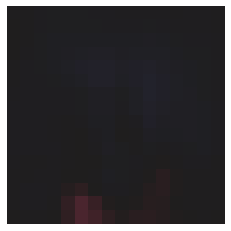

这是feature map 86 tensor(0.2935, device='cuda:0', grad_fn=<MeanBackward0>)


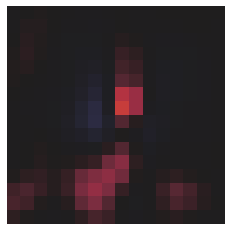

这是feature map 87 tensor(0.1068, device='cuda:0', grad_fn=<MeanBackward0>)


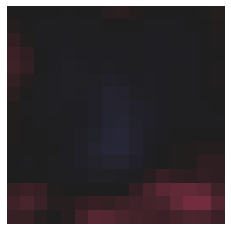

这是feature map 88 tensor(-0.2064, device='cuda:0', grad_fn=<MeanBackward0>)


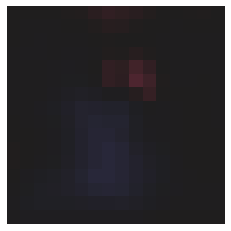

这是feature map 89 tensor(0.2213, device='cuda:0', grad_fn=<MeanBackward0>)


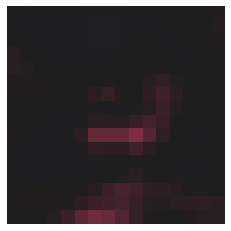

这是feature map 90 tensor(-0.0682, device='cuda:0', grad_fn=<MeanBackward0>)


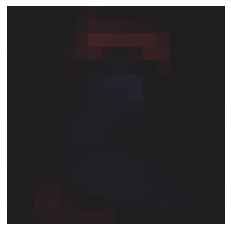

这是feature map 91 tensor(0.1037, device='cuda:0', grad_fn=<MeanBackward0>)


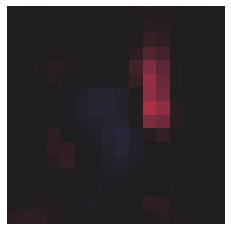

这是feature map 92 tensor(-0.1927, device='cuda:0', grad_fn=<MeanBackward0>)


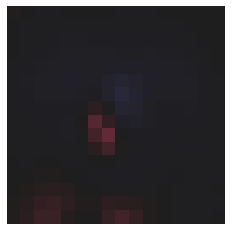

这是feature map 93 tensor(-0.2549, device='cuda:0', grad_fn=<MeanBackward0>)


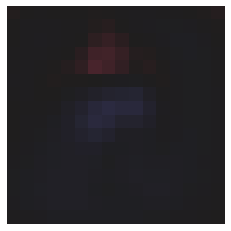

这是feature map 94 tensor(-0.0777, device='cuda:0', grad_fn=<MeanBackward0>)


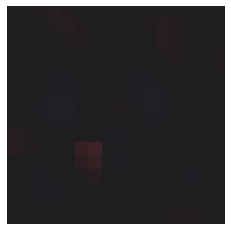

这是feature map 95 tensor(-0.1570, device='cuda:0', grad_fn=<MeanBackward0>)


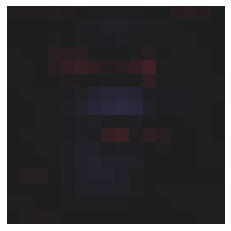

这是feature map 96 tensor(-0.0093, device='cuda:0', grad_fn=<MeanBackward0>)


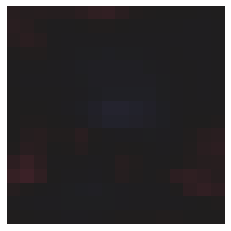

这是feature map 97 tensor(-0.2714, device='cuda:0', grad_fn=<MeanBackward0>)


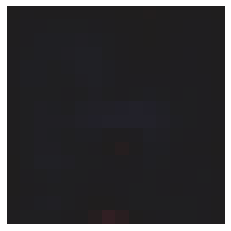

这是feature map 98 tensor(0.2013, device='cuda:0', grad_fn=<MeanBackward0>)


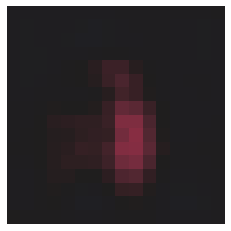

这是feature map 99 tensor(0.0784, device='cuda:0', grad_fn=<MeanBackward0>)


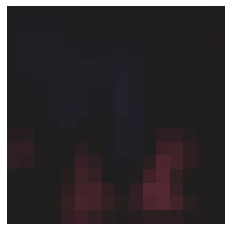

这是feature map 100 tensor(0.0370, device='cuda:0', grad_fn=<MeanBackward0>)


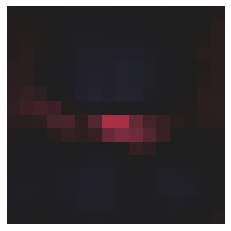

这是feature map 101 tensor(0.0888, device='cuda:0', grad_fn=<MeanBackward0>)


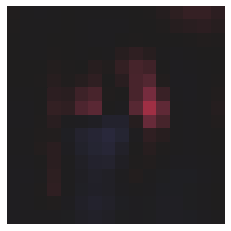

这是feature map 102 tensor(-0.0422, device='cuda:0', grad_fn=<MeanBackward0>)


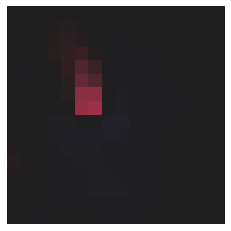

这是feature map 103 tensor(-0.3711, device='cuda:0', grad_fn=<MeanBackward0>)


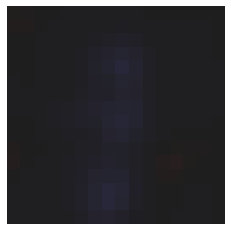

这是feature map 104 tensor(0.0064, device='cuda:0', grad_fn=<MeanBackward0>)


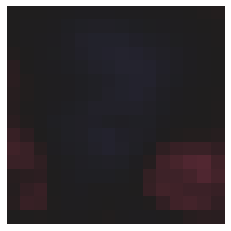

这是feature map 105 tensor(0.4894, device='cuda:0', grad_fn=<MeanBackward0>)


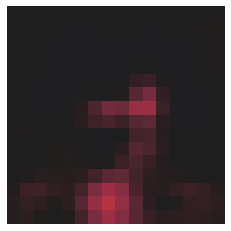

这是feature map 106 tensor(-0.1209, device='cuda:0', grad_fn=<MeanBackward0>)


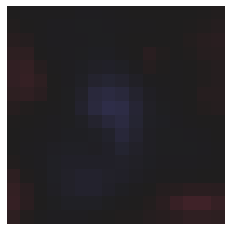

这是feature map 107 tensor(0.4066, device='cuda:0', grad_fn=<MeanBackward0>)


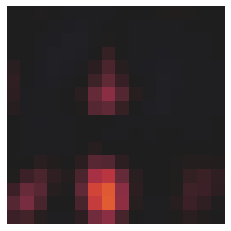

这是feature map 108 tensor(0.3188, device='cuda:0', grad_fn=<MeanBackward0>)


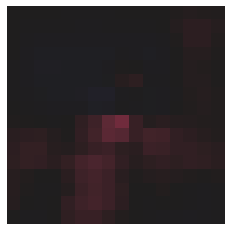

这是feature map 109 tensor(-0.0265, device='cuda:0', grad_fn=<MeanBackward0>)


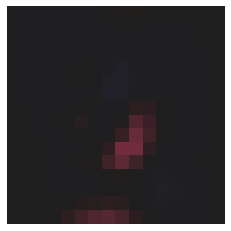

这是feature map 110 tensor(0.4150, device='cuda:0', grad_fn=<MeanBackward0>)


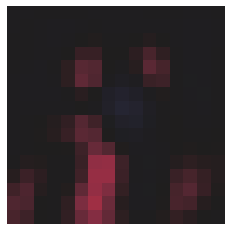

这是feature map 111 tensor(0.3197, device='cuda:0', grad_fn=<MeanBackward0>)


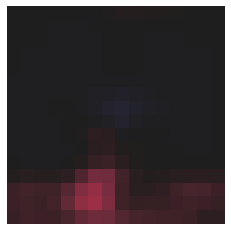

这是feature map 112 tensor(0.2356, device='cuda:0', grad_fn=<MeanBackward0>)


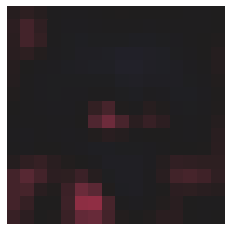

这是feature map 113 tensor(-0.1158, device='cuda:0', grad_fn=<MeanBackward0>)


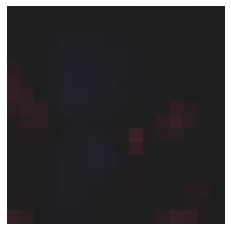

这是feature map 114 tensor(-0.1975, device='cuda:0', grad_fn=<MeanBackward0>)


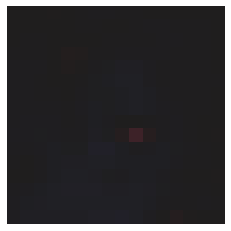

这是feature map 115 tensor(-0.1125, device='cuda:0', grad_fn=<MeanBackward0>)


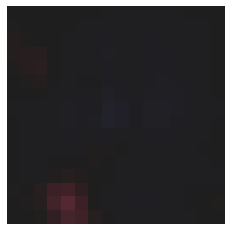

这是feature map 116 tensor(-0.0721, device='cuda:0', grad_fn=<MeanBackward0>)


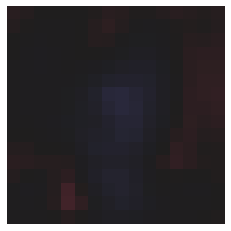

这是feature map 117 tensor(0.0276, device='cuda:0', grad_fn=<MeanBackward0>)


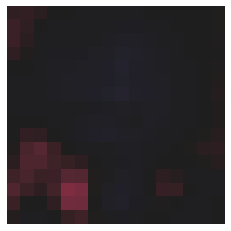

这是feature map 118 tensor(-0.1655, device='cuda:0', grad_fn=<MeanBackward0>)


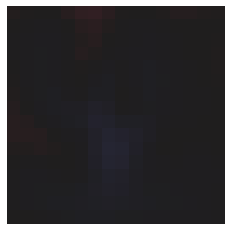

这是feature map 119 tensor(-0.0735, device='cuda:0', grad_fn=<MeanBackward0>)


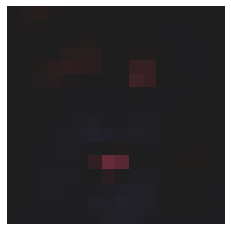

这是feature map 120 tensor(0.1428, device='cuda:0', grad_fn=<MeanBackward0>)


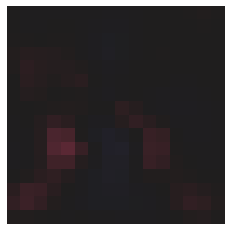

这是feature map 121 tensor(3.4467, device='cuda:0', grad_fn=<MeanBackward0>)


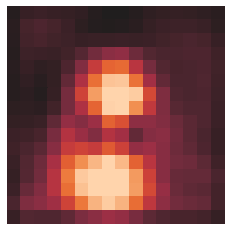

这是feature map 122 tensor(-0.4060, device='cuda:0', grad_fn=<MeanBackward0>)


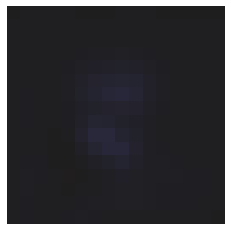

这是feature map 123 tensor(0.0540, device='cuda:0', grad_fn=<MeanBackward0>)


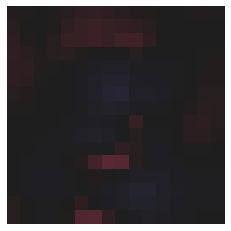

这是feature map 124 tensor(-0.0493, device='cuda:0', grad_fn=<MeanBackward0>)


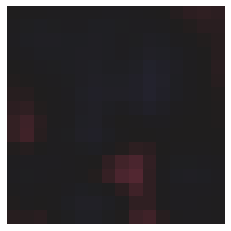

这是feature map 125 tensor(-0.0430, device='cuda:0', grad_fn=<MeanBackward0>)


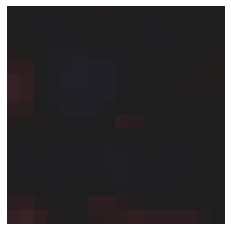

这是feature map 126 tensor(0.2571, device='cuda:0', grad_fn=<MeanBackward0>)


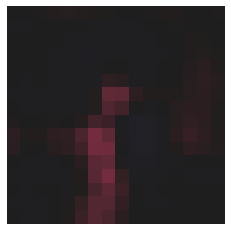

这是feature map 127 tensor(0.3239, device='cuda:0', grad_fn=<MeanBackward0>)


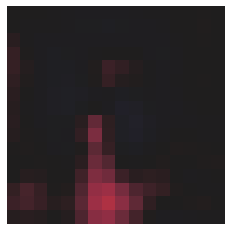

这是feature map 128 tensor(-0.1463, device='cuda:0', grad_fn=<MeanBackward0>)


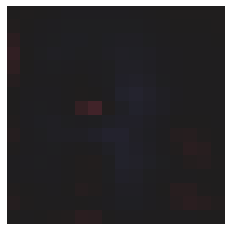

这是feature map 129 tensor(-0.1179, device='cuda:0', grad_fn=<MeanBackward0>)


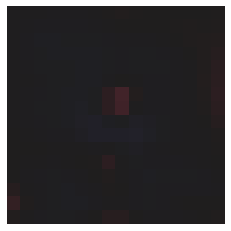

这是feature map 130 tensor(0.3252, device='cuda:0', grad_fn=<MeanBackward0>)


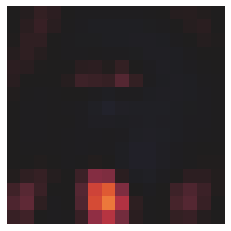

这是feature map 131 tensor(0.5138, device='cuda:0', grad_fn=<MeanBackward0>)


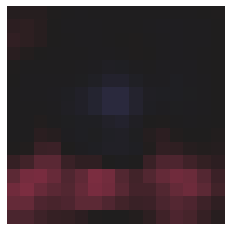

这是feature map 132 tensor(-0.0965, device='cuda:0', grad_fn=<MeanBackward0>)


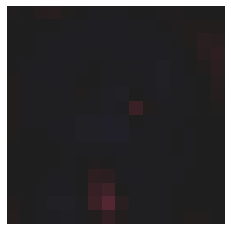

这是feature map 133 tensor(0.0249, device='cuda:0', grad_fn=<MeanBackward0>)


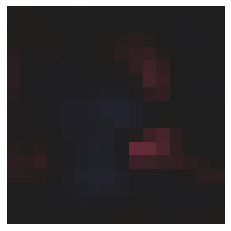

这是feature map 134 tensor(0.5269, device='cuda:0', grad_fn=<MeanBackward0>)


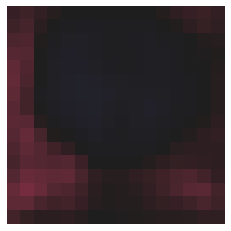

这是feature map 135 tensor(0.1397, device='cuda:0', grad_fn=<MeanBackward0>)


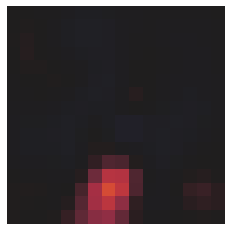

这是feature map 136 tensor(-0.0168, device='cuda:0', grad_fn=<MeanBackward0>)


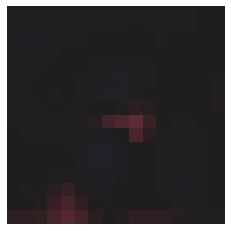

这是feature map 137 tensor(0.0826, device='cuda:0', grad_fn=<MeanBackward0>)


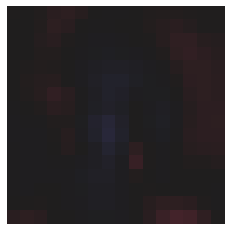

这是feature map 138 tensor(0.2808, device='cuda:0', grad_fn=<MeanBackward0>)


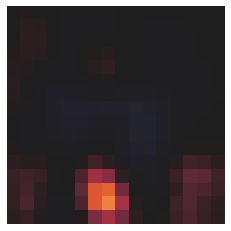

这是feature map 139 tensor(-0.3072, device='cuda:0', grad_fn=<MeanBackward0>)


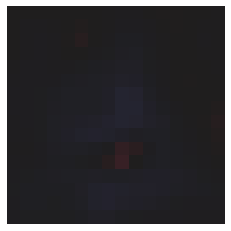

这是feature map 140 tensor(-0.0258, device='cuda:0', grad_fn=<MeanBackward0>)


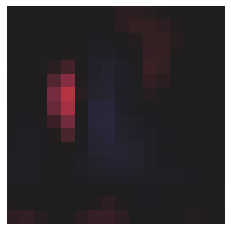

这是feature map 141 tensor(0.0757, device='cuda:0', grad_fn=<MeanBackward0>)


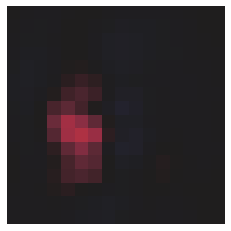

这是feature map 142 tensor(0.2257, device='cuda:0', grad_fn=<MeanBackward0>)


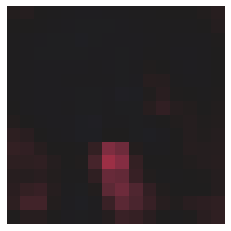

这是feature map 143 tensor(0.0367, device='cuda:0', grad_fn=<MeanBackward0>)


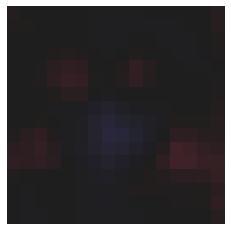

这是feature map 144 tensor(0.0297, device='cuda:0', grad_fn=<MeanBackward0>)


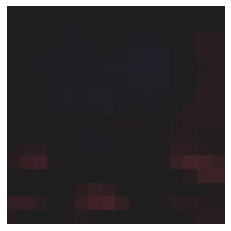

这是feature map 145 tensor(-0.0869, device='cuda:0', grad_fn=<MeanBackward0>)


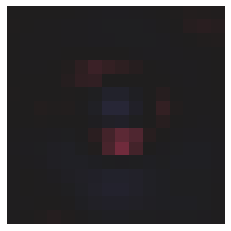

这是feature map 146 tensor(-0.2408, device='cuda:0', grad_fn=<MeanBackward0>)


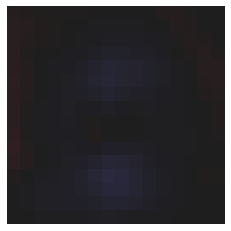

这是feature map 147 tensor(0.2884, device='cuda:0', grad_fn=<MeanBackward0>)


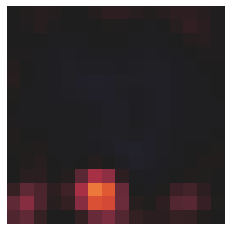

这是feature map 148 tensor(-0.0766, device='cuda:0', grad_fn=<MeanBackward0>)


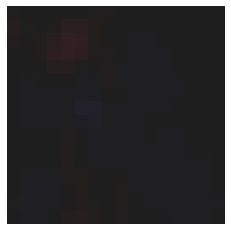

这是feature map 149 tensor(-0.0508, device='cuda:0', grad_fn=<MeanBackward0>)


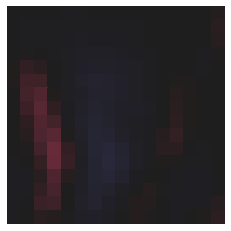

这是feature map 150 tensor(-0.2077, device='cuda:0', grad_fn=<MeanBackward0>)


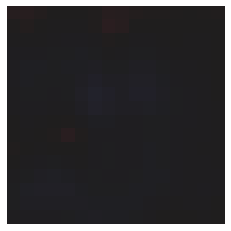

这是feature map 151 tensor(-0.1468, device='cuda:0', grad_fn=<MeanBackward0>)


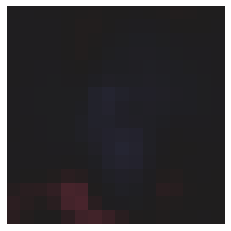

这是feature map 152 tensor(-0.3469, device='cuda:0', grad_fn=<MeanBackward0>)


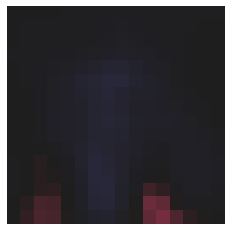

这是feature map 153 tensor(-0.2103, device='cuda:0', grad_fn=<MeanBackward0>)


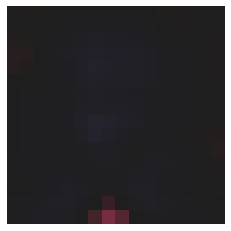

这是feature map 154 tensor(-0.0374, device='cuda:0', grad_fn=<MeanBackward0>)


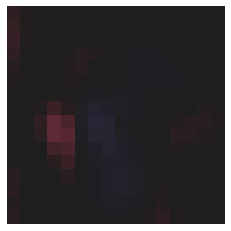

这是feature map 155 tensor(-0.2075, device='cuda:0', grad_fn=<MeanBackward0>)


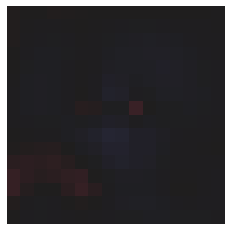

这是feature map 156 tensor(0.2830, device='cuda:0', grad_fn=<MeanBackward0>)


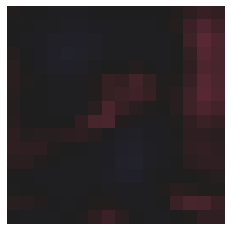

这是feature map 157 tensor(-0.0098, device='cuda:0', grad_fn=<MeanBackward0>)


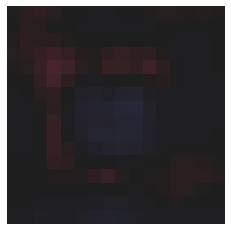

这是feature map 158 tensor(-0.2478, device='cuda:0', grad_fn=<MeanBackward0>)


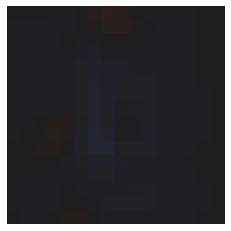

这是feature map 159 tensor(-0.2484, device='cuda:0', grad_fn=<MeanBackward0>)


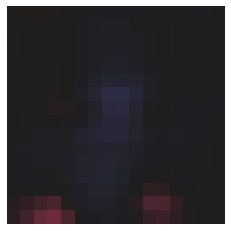

这是feature map 160 tensor(-0.0521, device='cuda:0', grad_fn=<MeanBackward0>)


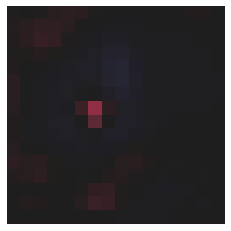

这是feature map 161 tensor(-0.1923, device='cuda:0', grad_fn=<MeanBackward0>)


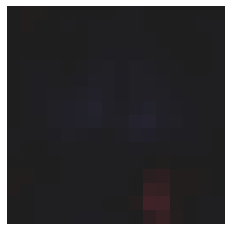

这是feature map 162 tensor(-0.1698, device='cuda:0', grad_fn=<MeanBackward0>)


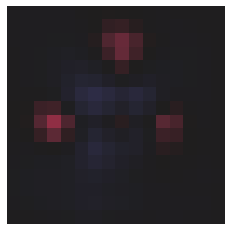

这是feature map 163 tensor(-0.0137, device='cuda:0', grad_fn=<MeanBackward0>)


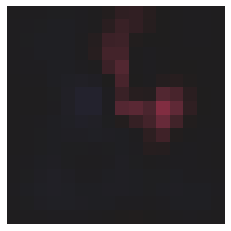

这是feature map 164 tensor(0.1780, device='cuda:0', grad_fn=<MeanBackward0>)


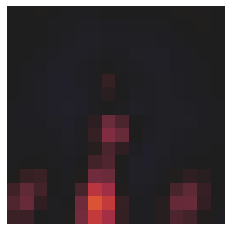

这是feature map 165 tensor(0.1201, device='cuda:0', grad_fn=<MeanBackward0>)


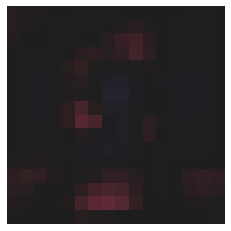

这是feature map 166 tensor(-0.0620, device='cuda:0', grad_fn=<MeanBackward0>)


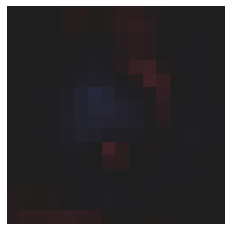

这是feature map 167 tensor(0.3730, device='cuda:0', grad_fn=<MeanBackward0>)


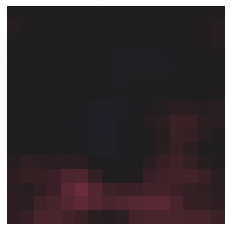

这是feature map 168 tensor(-0.0812, device='cuda:0', grad_fn=<MeanBackward0>)


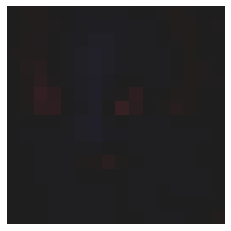

这是feature map 169 tensor(-0.2337, device='cuda:0', grad_fn=<MeanBackward0>)


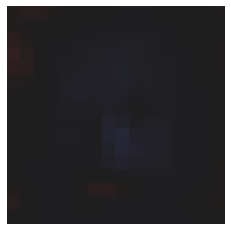

这是feature map 170 tensor(0.1819, device='cuda:0', grad_fn=<MeanBackward0>)


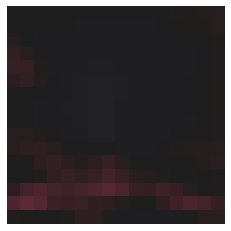

这是feature map 171 tensor(0.0317, device='cuda:0', grad_fn=<MeanBackward0>)


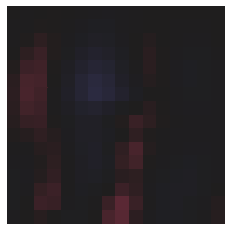

这是feature map 172 tensor(-0.0450, device='cuda:0', grad_fn=<MeanBackward0>)


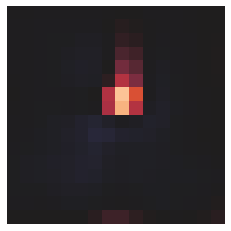

这是feature map 173 tensor(-0.0335, device='cuda:0', grad_fn=<MeanBackward0>)


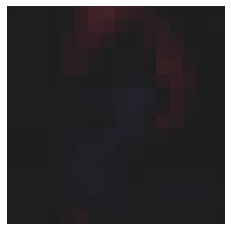

这是feature map 174 tensor(-0.1122, device='cuda:0', grad_fn=<MeanBackward0>)


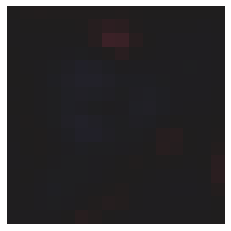

这是feature map 175 tensor(0.4335, device='cuda:0', grad_fn=<MeanBackward0>)


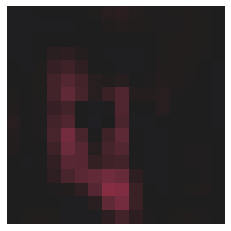

这是feature map 176 tensor(-0.2538, device='cuda:0', grad_fn=<MeanBackward0>)


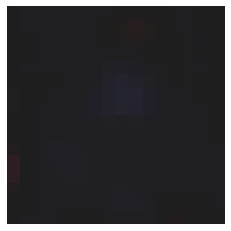

这是feature map 177 tensor(0.0356, device='cuda:0', grad_fn=<MeanBackward0>)


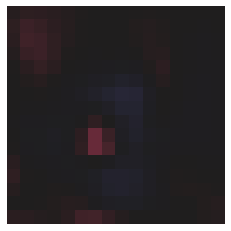

这是feature map 178 tensor(0.3378, device='cuda:0', grad_fn=<MeanBackward0>)


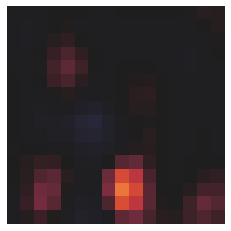

这是feature map 179 tensor(-0.2398, device='cuda:0', grad_fn=<MeanBackward0>)


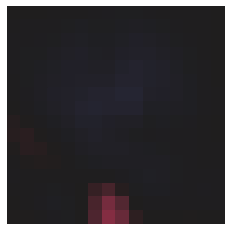

这是feature map 180 tensor(0.3178, device='cuda:0', grad_fn=<MeanBackward0>)


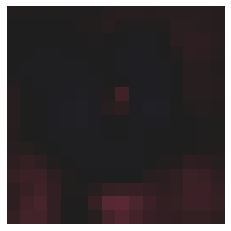

这是feature map 181 tensor(0.1624, device='cuda:0', grad_fn=<MeanBackward0>)


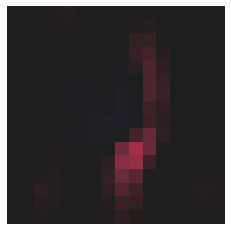

这是feature map 182 tensor(0.0329, device='cuda:0', grad_fn=<MeanBackward0>)


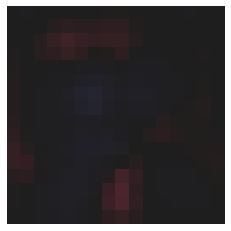

这是feature map 183 tensor(0.5987, device='cuda:0', grad_fn=<MeanBackward0>)


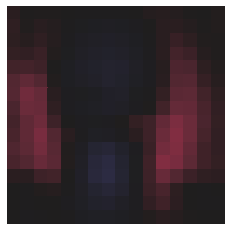

这是feature map 184 tensor(-0.0751, device='cuda:0', grad_fn=<MeanBackward0>)


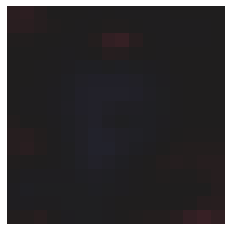

这是feature map 185 tensor(-0.3842, device='cuda:0', grad_fn=<MeanBackward0>)


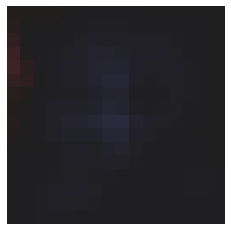

这是feature map 186 tensor(-0.0227, device='cuda:0', grad_fn=<MeanBackward0>)


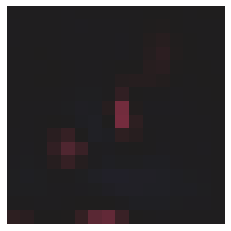

这是feature map 187 tensor(-0.2193, device='cuda:0', grad_fn=<MeanBackward0>)


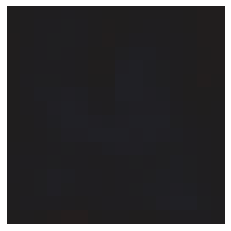

这是feature map 188 tensor(-0.2182, device='cuda:0', grad_fn=<MeanBackward0>)


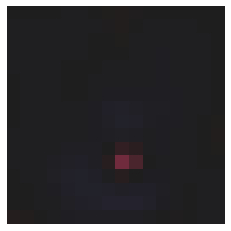

这是feature map 189 tensor(0.0571, device='cuda:0', grad_fn=<MeanBackward0>)


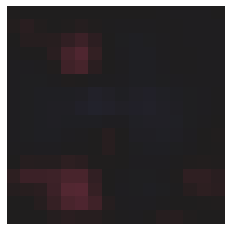

这是feature map 190 tensor(0.4969, device='cuda:0', grad_fn=<MeanBackward0>)


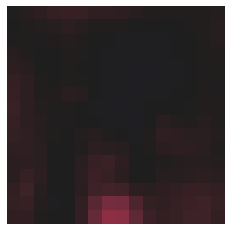

这是feature map 191 tensor(-0.0225, device='cuda:0', grad_fn=<MeanBackward0>)


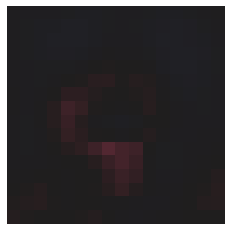

这是feature map 192 tensor(-0.1397, device='cuda:0', grad_fn=<MeanBackward0>)


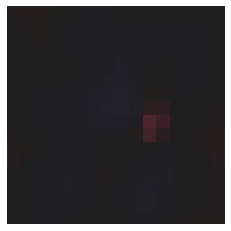

这是feature map 193 tensor(-0.0869, device='cuda:0', grad_fn=<MeanBackward0>)


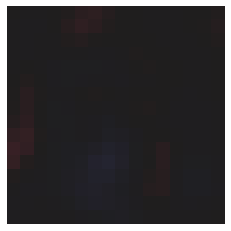

这是feature map 194 tensor(-0.1167, device='cuda:0', grad_fn=<MeanBackward0>)


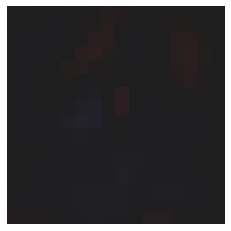

这是feature map 195 tensor(-0.1834, device='cuda:0', grad_fn=<MeanBackward0>)


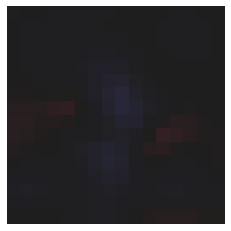

这是feature map 196 tensor(0.3168, device='cuda:0', grad_fn=<MeanBackward0>)


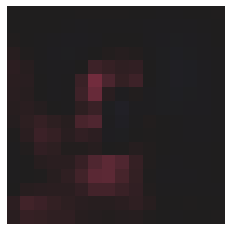

这是feature map 197 tensor(0.4710, device='cuda:0', grad_fn=<MeanBackward0>)


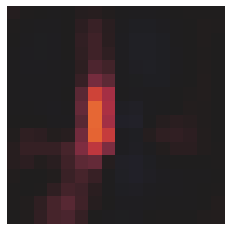

这是feature map 198 tensor(-0.0466, device='cuda:0', grad_fn=<MeanBackward0>)


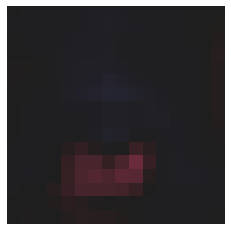

这是feature map 199 tensor(-0.0781, device='cuda:0', grad_fn=<MeanBackward0>)


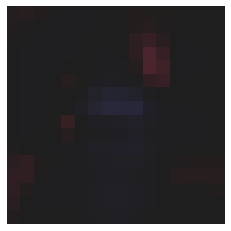

这是feature map 200 tensor(-0.1501, device='cuda:0', grad_fn=<MeanBackward0>)


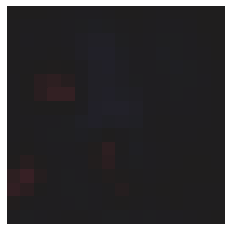

这是feature map 201 tensor(-0.1082, device='cuda:0', grad_fn=<MeanBackward0>)


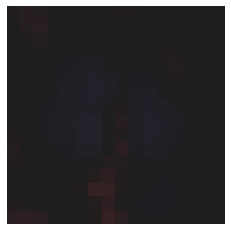

这是feature map 202 tensor(-0.0464, device='cuda:0', grad_fn=<MeanBackward0>)


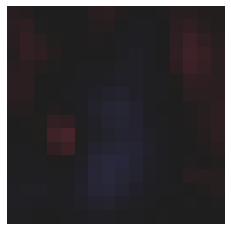

这是feature map 203 tensor(-0.1687, device='cuda:0', grad_fn=<MeanBackward0>)


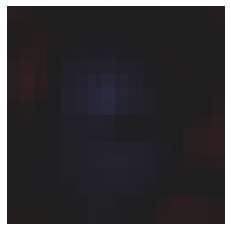

这是feature map 204 tensor(0.1948, device='cuda:0', grad_fn=<MeanBackward0>)


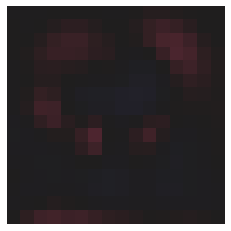

这是feature map 205 tensor(0.0782, device='cuda:0', grad_fn=<MeanBackward0>)


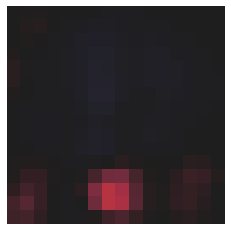

这是feature map 206 tensor(0.1888, device='cuda:0', grad_fn=<MeanBackward0>)


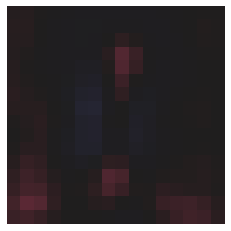

这是feature map 207 tensor(0.0180, device='cuda:0', grad_fn=<MeanBackward0>)


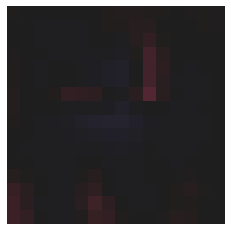

这是feature map 208 tensor(0.5465, device='cuda:0', grad_fn=<MeanBackward0>)


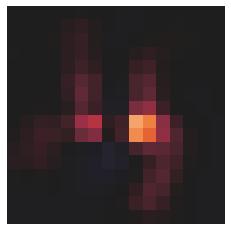

这是feature map 209 tensor(-0.2451, device='cuda:0', grad_fn=<MeanBackward0>)


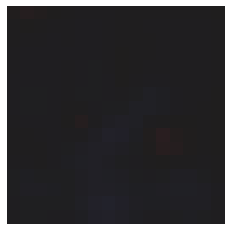

这是feature map 210 tensor(0.1261, device='cuda:0', grad_fn=<MeanBackward0>)


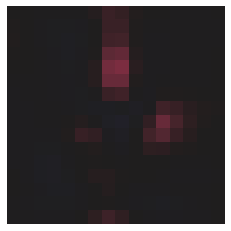

这是feature map 211 tensor(-0.2286, device='cuda:0', grad_fn=<MeanBackward0>)


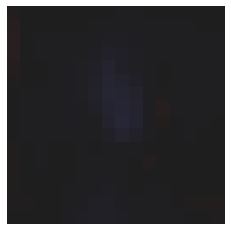

这是feature map 212 tensor(0.5533, device='cuda:0', grad_fn=<MeanBackward0>)


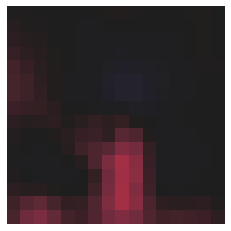

这是feature map 213 tensor(0.1034, device='cuda:0', grad_fn=<MeanBackward0>)


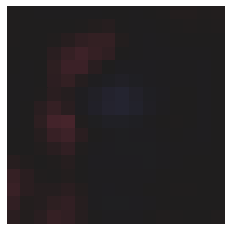

这是feature map 214 tensor(0.1636, device='cuda:0', grad_fn=<MeanBackward0>)


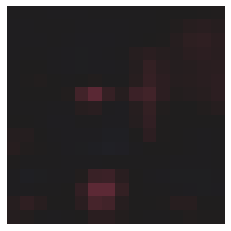

这是feature map 215 tensor(0.0740, device='cuda:0', grad_fn=<MeanBackward0>)


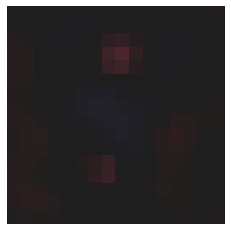

这是feature map 216 tensor(-0.2077, device='cuda:0', grad_fn=<MeanBackward0>)


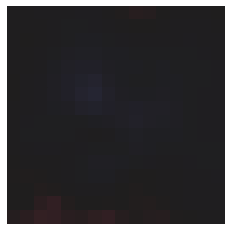

这是feature map 217 tensor(0.1776, device='cuda:0', grad_fn=<MeanBackward0>)


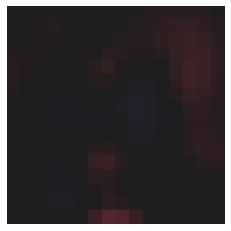

这是feature map 218 tensor(-0.1650, device='cuda:0', grad_fn=<MeanBackward0>)


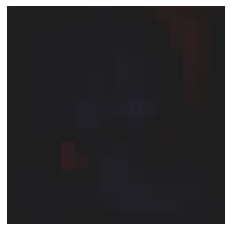

这是feature map 219 tensor(-0.2838, device='cuda:0', grad_fn=<MeanBackward0>)


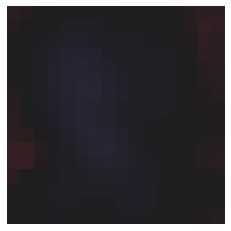

这是feature map 220 tensor(-0.2287, device='cuda:0', grad_fn=<MeanBackward0>)


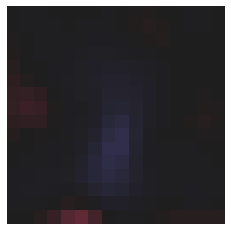

这是feature map 221 tensor(0.3730, device='cuda:0', grad_fn=<MeanBackward0>)


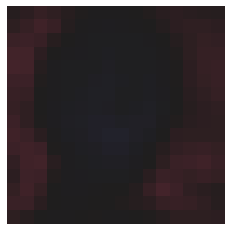

这是feature map 222 tensor(-0.0052, device='cuda:0', grad_fn=<MeanBackward0>)


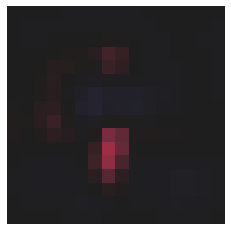

这是feature map 223 tensor(0.3069, device='cuda:0', grad_fn=<MeanBackward0>)


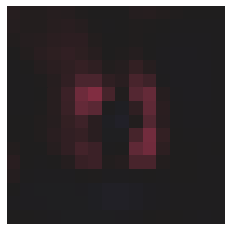

这是feature map 224 tensor(-0.1139, device='cuda:0', grad_fn=<MeanBackward0>)


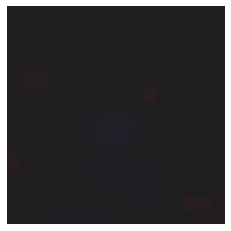

这是feature map 225 tensor(0.3582, device='cuda:0', grad_fn=<MeanBackward0>)


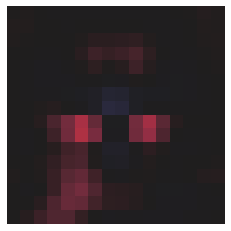

这是feature map 226 tensor(-0.1587, device='cuda:0', grad_fn=<MeanBackward0>)


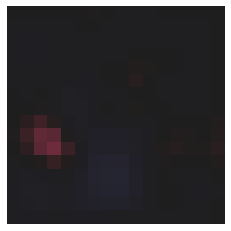

这是feature map 227 tensor(-0.0660, device='cuda:0', grad_fn=<MeanBackward0>)


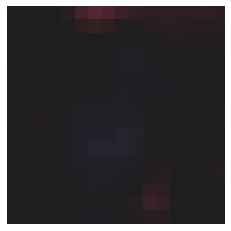

这是feature map 228 tensor(0.2379, device='cuda:0', grad_fn=<MeanBackward0>)


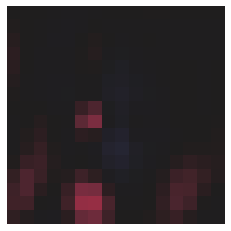

这是feature map 229 tensor(0.3688, device='cuda:0', grad_fn=<MeanBackward0>)


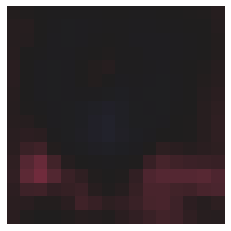

这是feature map 230 tensor(-0.0059, device='cuda:0', grad_fn=<MeanBackward0>)


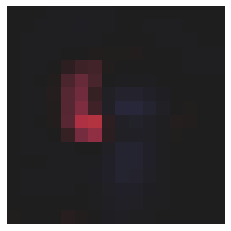

这是feature map 231 tensor(0.1309, device='cuda:0', grad_fn=<MeanBackward0>)


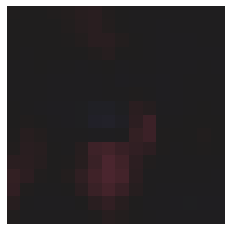

这是feature map 232 tensor(0.1328, device='cuda:0', grad_fn=<MeanBackward0>)


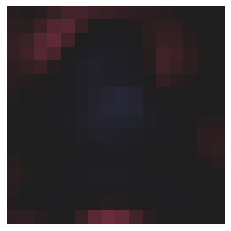

这是feature map 233 tensor(-0.3558, device='cuda:0', grad_fn=<MeanBackward0>)


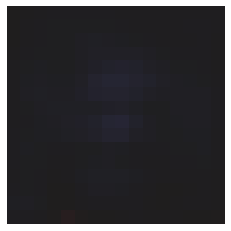

这是feature map 234 tensor(0.1856, device='cuda:0', grad_fn=<MeanBackward0>)


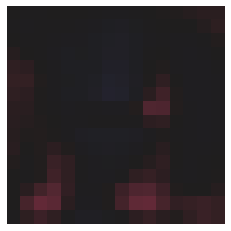

这是feature map 235 tensor(0.3798, device='cuda:0', grad_fn=<MeanBackward0>)


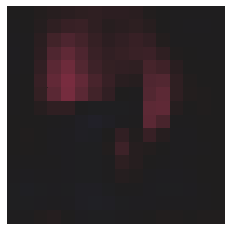

这是feature map 236 tensor(0.0566, device='cuda:0', grad_fn=<MeanBackward0>)


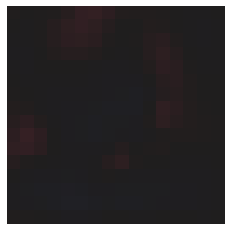

这是feature map 237 tensor(0.2372, device='cuda:0', grad_fn=<MeanBackward0>)


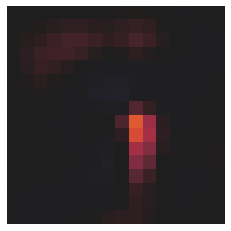

这是feature map 238 tensor(-0.1092, device='cuda:0', grad_fn=<MeanBackward0>)


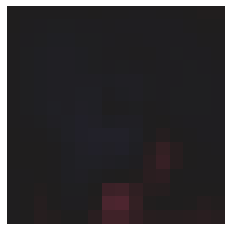

这是feature map 239 tensor(-0.0952, device='cuda:0', grad_fn=<MeanBackward0>)


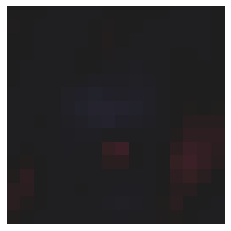

这是feature map 240 tensor(0.3395, device='cuda:0', grad_fn=<MeanBackward0>)


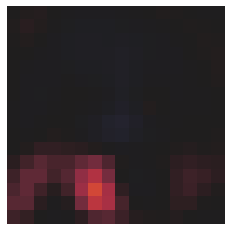

这是feature map 241 tensor(-0.2176, device='cuda:0', grad_fn=<MeanBackward0>)


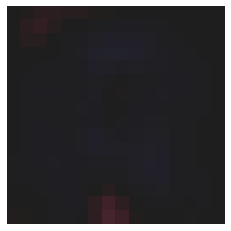

这是feature map 242 tensor(-0.2769, device='cuda:0', grad_fn=<MeanBackward0>)


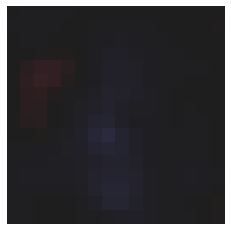

这是feature map 243 tensor(0.2154, device='cuda:0', grad_fn=<MeanBackward0>)


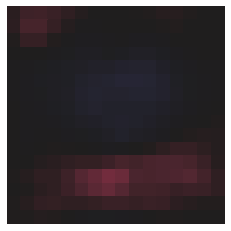

这是feature map 244 tensor(-0.2496, device='cuda:0', grad_fn=<MeanBackward0>)


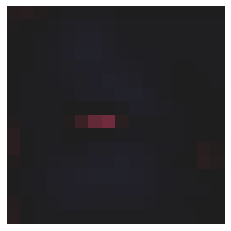

这是feature map 245 tensor(0.0039, device='cuda:0', grad_fn=<MeanBackward0>)


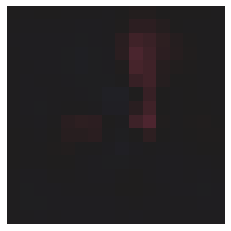

这是feature map 246 tensor(-0.1106, device='cuda:0', grad_fn=<MeanBackward0>)


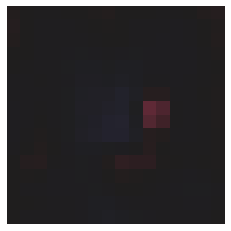

这是feature map 247 tensor(0.0731, device='cuda:0', grad_fn=<MeanBackward0>)


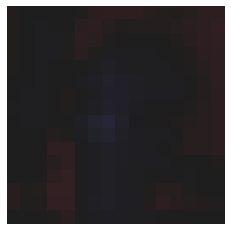

这是feature map 248 tensor(0.1285, device='cuda:0', grad_fn=<MeanBackward0>)


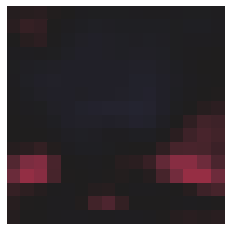

这是feature map 249 tensor(0.1917, device='cuda:0', grad_fn=<MeanBackward0>)


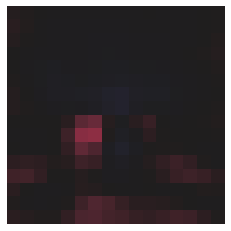

这是feature map 250 tensor(-0.1527, device='cuda:0', grad_fn=<MeanBackward0>)


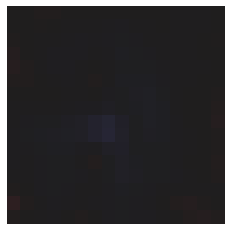

这是feature map 251 tensor(-0.0185, device='cuda:0', grad_fn=<MeanBackward0>)


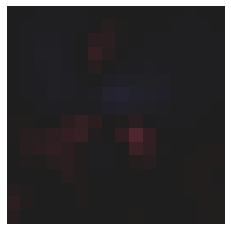

这是feature map 252 tensor(-0.1887, device='cuda:0', grad_fn=<MeanBackward0>)


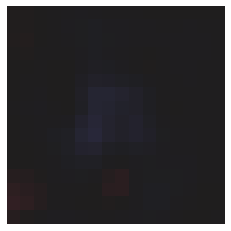

这是feature map 253 tensor(0.4621, device='cuda:0', grad_fn=<MeanBackward0>)


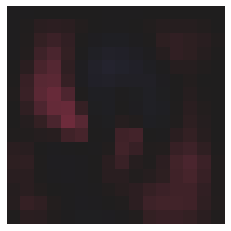

这是feature map 254 tensor(-0.0159, device='cuda:0', grad_fn=<MeanBackward0>)


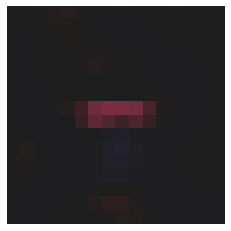

这是feature map 255 tensor(-0.1690, device='cuda:0', grad_fn=<MeanBackward0>)


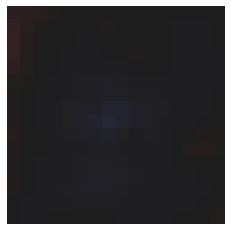

这是feature map 256 tensor(-0.1027, device='cuda:0', grad_fn=<MeanBackward0>)


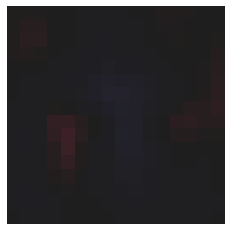

这是feature map 257 tensor(-0.2691, device='cuda:0', grad_fn=<MeanBackward0>)


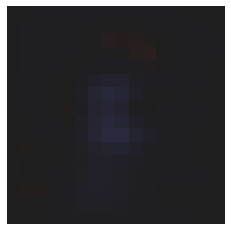

这是feature map 258 tensor(0.2911, device='cuda:0', grad_fn=<MeanBackward0>)


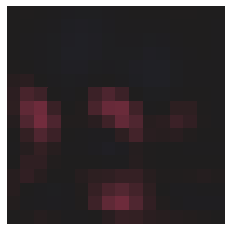

这是feature map 259 tensor(0.2268, device='cuda:0', grad_fn=<MeanBackward0>)


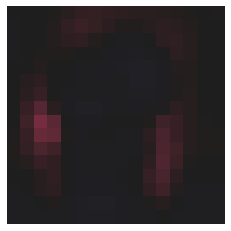

这是feature map 260 tensor(-0.1591, device='cuda:0', grad_fn=<MeanBackward0>)


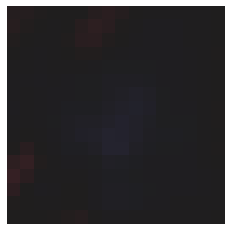

这是feature map 261 tensor(-0.2196, device='cuda:0', grad_fn=<MeanBackward0>)


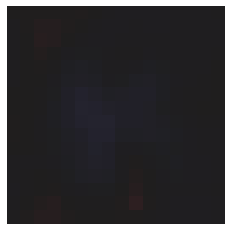

这是feature map 262 tensor(0.0017, device='cuda:0', grad_fn=<MeanBackward0>)


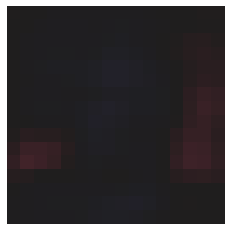

这是feature map 263 tensor(-0.1318, device='cuda:0', grad_fn=<MeanBackward0>)


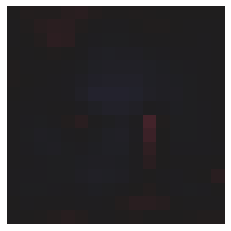

这是feature map 264 tensor(0.0450, device='cuda:0', grad_fn=<MeanBackward0>)


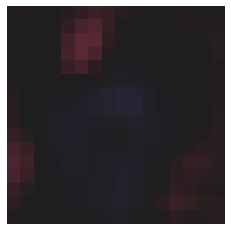

这是feature map 265 tensor(0.0550, device='cuda:0', grad_fn=<MeanBackward0>)


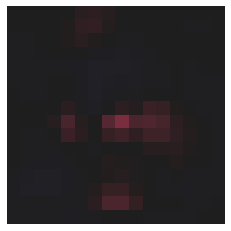

这是feature map 266 tensor(0.5230, device='cuda:0', grad_fn=<MeanBackward0>)


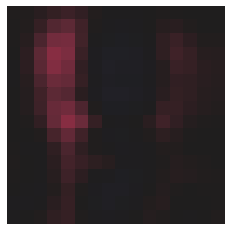

这是feature map 267 tensor(0.1735, device='cuda:0', grad_fn=<MeanBackward0>)


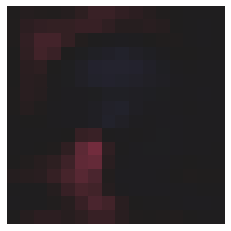

这是feature map 268 tensor(-0.2459, device='cuda:0', grad_fn=<MeanBackward0>)


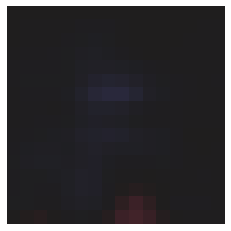

这是feature map 269 tensor(-0.0857, device='cuda:0', grad_fn=<MeanBackward0>)


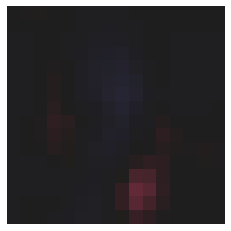

这是feature map 270 tensor(0.0282, device='cuda:0', grad_fn=<MeanBackward0>)


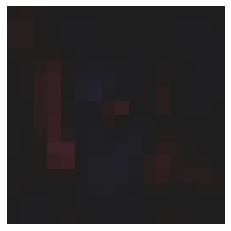

这是feature map 271 tensor(-0.1749, device='cuda:0', grad_fn=<MeanBackward0>)


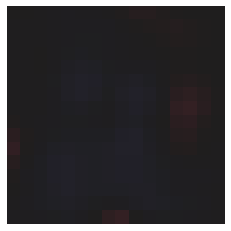

这是feature map 272 tensor(-0.2029, device='cuda:0', grad_fn=<MeanBackward0>)


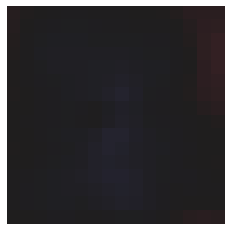

这是feature map 273 tensor(0.0915, device='cuda:0', grad_fn=<MeanBackward0>)


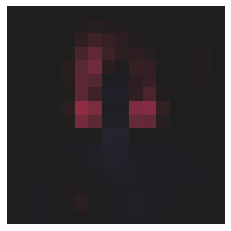

这是feature map 274 tensor(-0.1393, device='cuda:0', grad_fn=<MeanBackward0>)


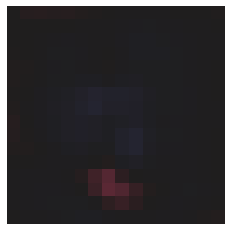

这是feature map 275 tensor(-0.1617, device='cuda:0', grad_fn=<MeanBackward0>)


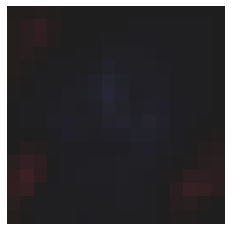

这是feature map 276 tensor(-0.1390, device='cuda:0', grad_fn=<MeanBackward0>)


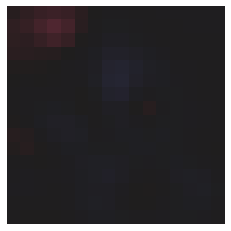

这是feature map 277 tensor(-0.2447, device='cuda:0', grad_fn=<MeanBackward0>)


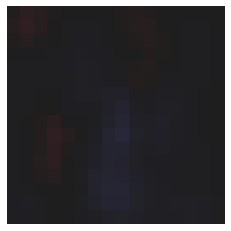

这是feature map 278 tensor(0.9547, device='cuda:0', grad_fn=<MeanBackward0>)


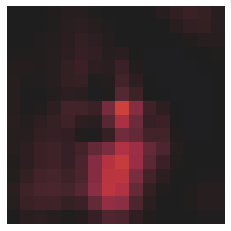

这是feature map 279 tensor(-0.0242, device='cuda:0', grad_fn=<MeanBackward0>)


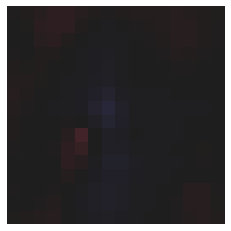

这是feature map 280 tensor(0.1948, device='cuda:0', grad_fn=<MeanBackward0>)


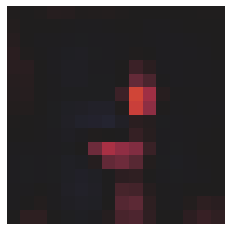

这是feature map 281 tensor(0.0064, device='cuda:0', grad_fn=<MeanBackward0>)


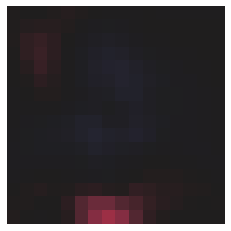

这是feature map 282 tensor(-0.1656, device='cuda:0', grad_fn=<MeanBackward0>)


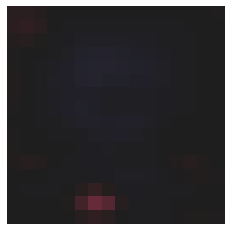

这是feature map 283 tensor(0.0078, device='cuda:0', grad_fn=<MeanBackward0>)


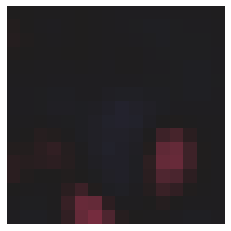

这是feature map 284 tensor(0.2765, device='cuda:0', grad_fn=<MeanBackward0>)


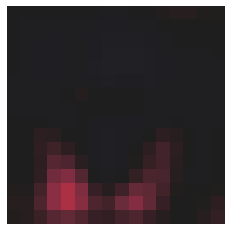

这是feature map 285 tensor(-0.2032, device='cuda:0', grad_fn=<MeanBackward0>)


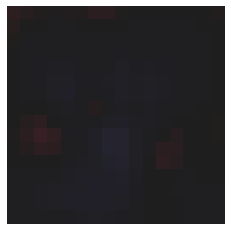

这是feature map 286 tensor(0.1790, device='cuda:0', grad_fn=<MeanBackward0>)


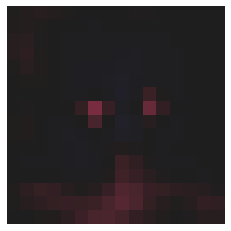

这是feature map 287 tensor(-0.1897, device='cuda:0', grad_fn=<MeanBackward0>)


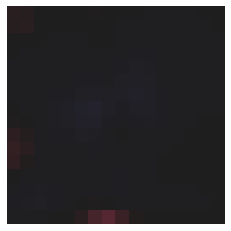

这是feature map 288 tensor(-0.2430, device='cuda:0', grad_fn=<MeanBackward0>)


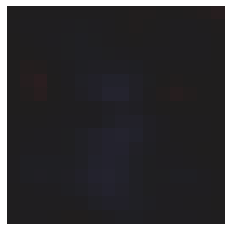

这是feature map 289 tensor(-0.1297, device='cuda:0', grad_fn=<MeanBackward0>)


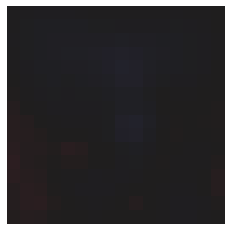

这是feature map 290 tensor(0.0332, device='cuda:0', grad_fn=<MeanBackward0>)


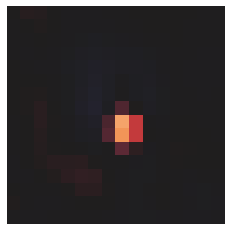

这是feature map 291 tensor(0.0391, device='cuda:0', grad_fn=<MeanBackward0>)


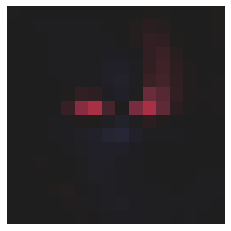

这是feature map 292 tensor(-0.2900, device='cuda:0', grad_fn=<MeanBackward0>)


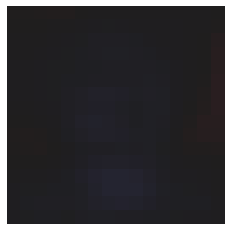

这是feature map 293 tensor(0.1137, device='cuda:0', grad_fn=<MeanBackward0>)


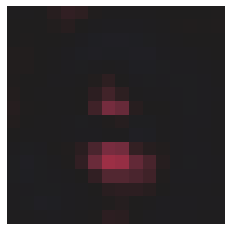

这是feature map 294 tensor(-0.0676, device='cuda:0', grad_fn=<MeanBackward0>)


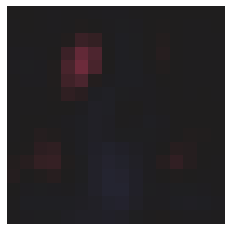

这是feature map 295 tensor(-0.0273, device='cuda:0', grad_fn=<MeanBackward0>)


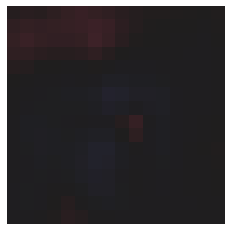

这是feature map 296 tensor(-0.0882, device='cuda:0', grad_fn=<MeanBackward0>)


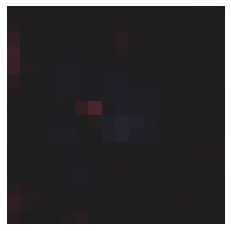

这是feature map 297 tensor(-0.0730, device='cuda:0', grad_fn=<MeanBackward0>)


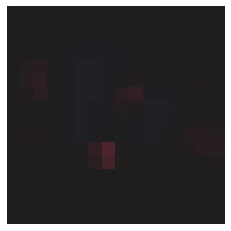

这是feature map 298 tensor(0.2670, device='cuda:0', grad_fn=<MeanBackward0>)


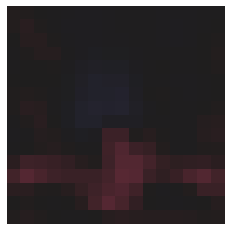

这是feature map 299 tensor(-0.1114, device='cuda:0', grad_fn=<MeanBackward0>)


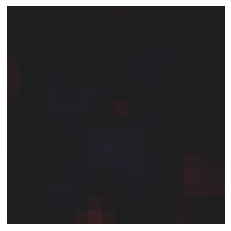

这是feature map 300 tensor(0.1627, device='cuda:0', grad_fn=<MeanBackward0>)


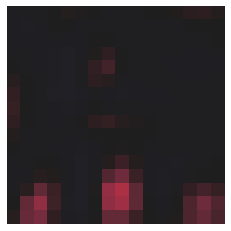

这是feature map 301 tensor(-0.0525, device='cuda:0', grad_fn=<MeanBackward0>)


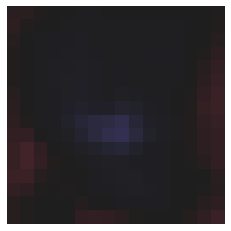

这是feature map 302 tensor(-0.1058, device='cuda:0', grad_fn=<MeanBackward0>)


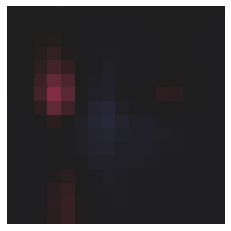

这是feature map 303 tensor(-0.2109, device='cuda:0', grad_fn=<MeanBackward0>)


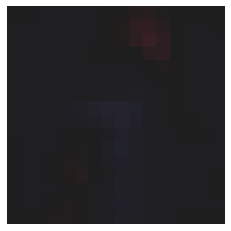

这是feature map 304 tensor(-0.2634, device='cuda:0', grad_fn=<MeanBackward0>)


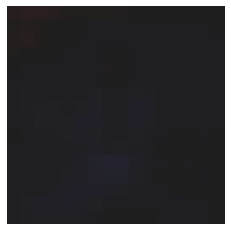

这是feature map 305 tensor(-0.0849, device='cuda:0', grad_fn=<MeanBackward0>)


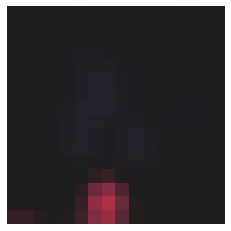

这是feature map 306 tensor(-0.2184, device='cuda:0', grad_fn=<MeanBackward0>)


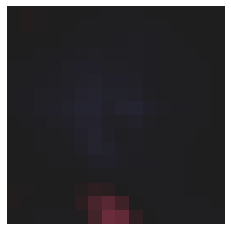

这是feature map 307 tensor(0.7994, device='cuda:0', grad_fn=<MeanBackward0>)


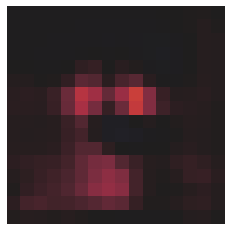

这是feature map 308 tensor(-0.0004, device='cuda:0', grad_fn=<MeanBackward0>)


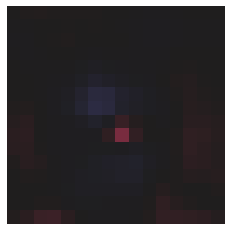

这是feature map 309 tensor(0.7101, device='cuda:0', grad_fn=<MeanBackward0>)


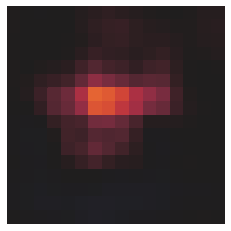

这是feature map 310 tensor(-0.0221, device='cuda:0', grad_fn=<MeanBackward0>)


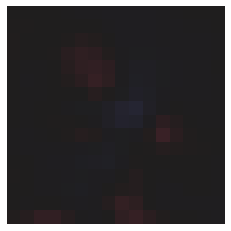

这是feature map 311 tensor(-0.0025, device='cuda:0', grad_fn=<MeanBackward0>)


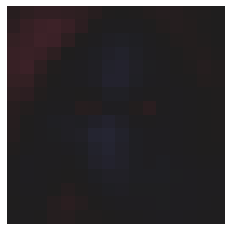

这是feature map 312 tensor(-0.2223, device='cuda:0', grad_fn=<MeanBackward0>)


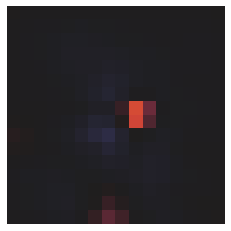

这是feature map 313 tensor(-0.2598, device='cuda:0', grad_fn=<MeanBackward0>)


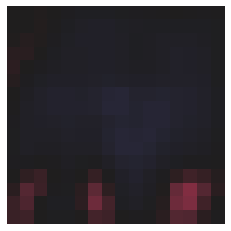

这是feature map 314 tensor(0.3663, device='cuda:0', grad_fn=<MeanBackward0>)


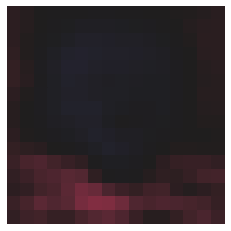

这是feature map 315 tensor(-0.2804, device='cuda:0', grad_fn=<MeanBackward0>)


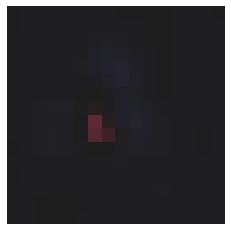

这是feature map 316 tensor(0.0225, device='cuda:0', grad_fn=<MeanBackward0>)


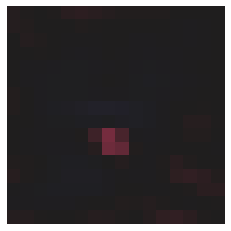

这是feature map 317 tensor(-0.1731, device='cuda:0', grad_fn=<MeanBackward0>)


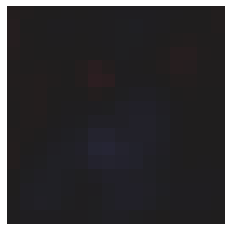

这是feature map 318 tensor(0.1832, device='cuda:0', grad_fn=<MeanBackward0>)


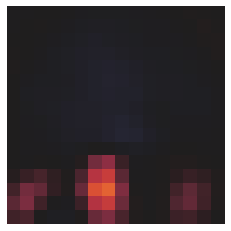

这是feature map 319 tensor(0.7323, device='cuda:0', grad_fn=<MeanBackward0>)


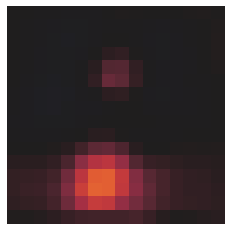

这是feature map 320 tensor(0.3422, device='cuda:0', grad_fn=<MeanBackward0>)


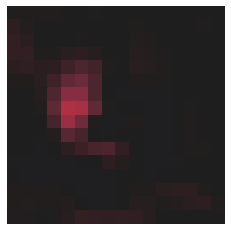

这是feature map 321 tensor(0.1741, device='cuda:0', grad_fn=<MeanBackward0>)


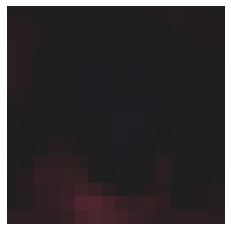

这是feature map 322 tensor(-0.1018, device='cuda:0', grad_fn=<MeanBackward0>)


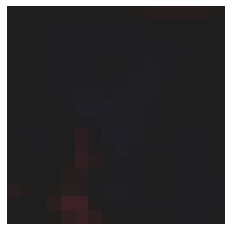

这是feature map 323 tensor(-0.1160, device='cuda:0', grad_fn=<MeanBackward0>)


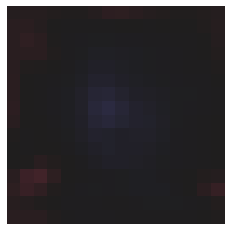

这是feature map 324 tensor(-0.3076, device='cuda:0', grad_fn=<MeanBackward0>)


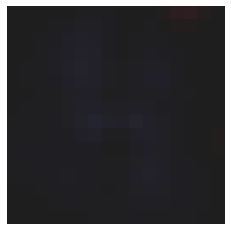

这是feature map 325 tensor(0.0016, device='cuda:0', grad_fn=<MeanBackward0>)


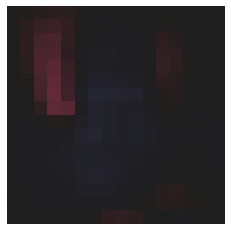

这是feature map 326 tensor(-0.0910, device='cuda:0', grad_fn=<MeanBackward0>)


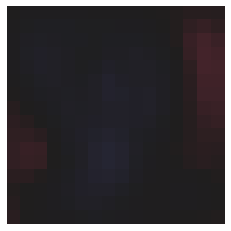

这是feature map 327 tensor(0.3665, device='cuda:0', grad_fn=<MeanBackward0>)


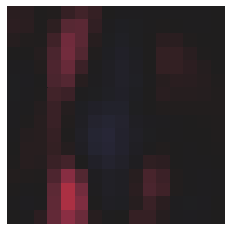

这是feature map 328 tensor(-0.2488, device='cuda:0', grad_fn=<MeanBackward0>)


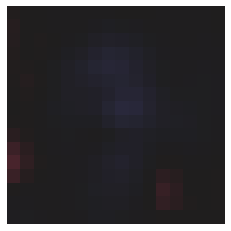

这是feature map 329 tensor(-0.0913, device='cuda:0', grad_fn=<MeanBackward0>)


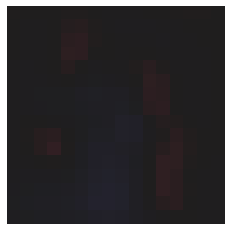

这是feature map 330 tensor(0.0224, device='cuda:0', grad_fn=<MeanBackward0>)


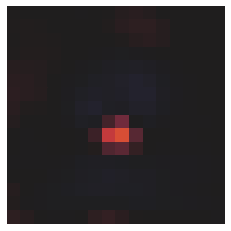

这是feature map 331 tensor(0.0664, device='cuda:0', grad_fn=<MeanBackward0>)


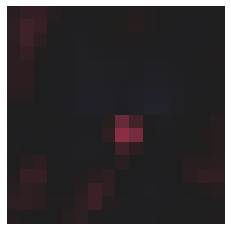

这是feature map 332 tensor(-0.1844, device='cuda:0', grad_fn=<MeanBackward0>)


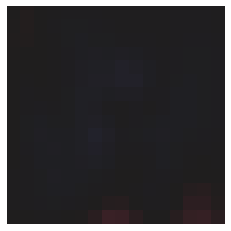

这是feature map 333 tensor(-0.1930, device='cuda:0', grad_fn=<MeanBackward0>)


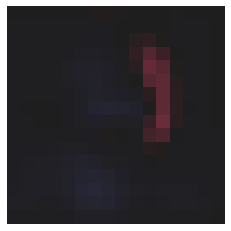

这是feature map 334 tensor(0.3582, device='cuda:0', grad_fn=<MeanBackward0>)


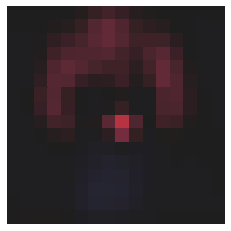

这是feature map 335 tensor(0.4996, device='cuda:0', grad_fn=<MeanBackward0>)


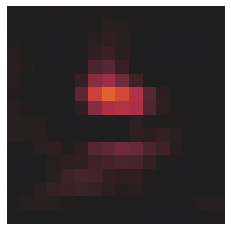

这是feature map 336 tensor(0.1382, device='cuda:0', grad_fn=<MeanBackward0>)


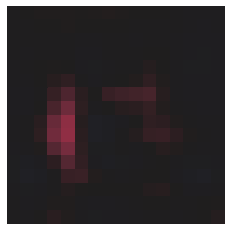

这是feature map 337 tensor(-0.1800, device='cuda:0', grad_fn=<MeanBackward0>)


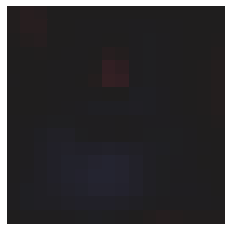

这是feature map 338 tensor(-0.2173, device='cuda:0', grad_fn=<MeanBackward0>)


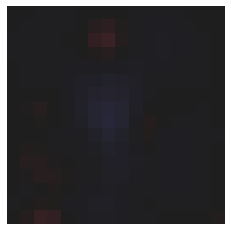

这是feature map 339 tensor(-0.1662, device='cuda:0', grad_fn=<MeanBackward0>)


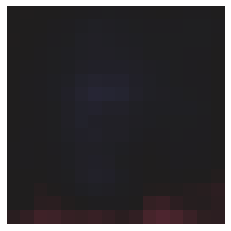

这是feature map 340 tensor(-0.1213, device='cuda:0', grad_fn=<MeanBackward0>)


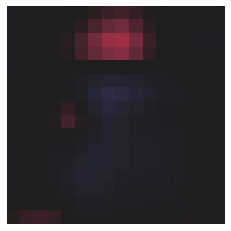

这是feature map 341 tensor(0.5902, device='cuda:0', grad_fn=<MeanBackward0>)


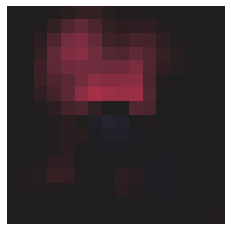

这是feature map 342 tensor(-0.0999, device='cuda:0', grad_fn=<MeanBackward0>)


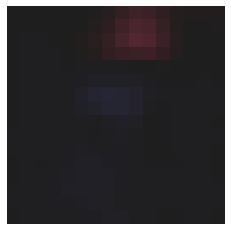

这是feature map 343 tensor(-0.1634, device='cuda:0', grad_fn=<MeanBackward0>)


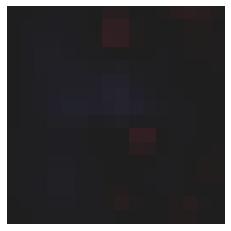

这是feature map 344 tensor(0.0979, device='cuda:0', grad_fn=<MeanBackward0>)


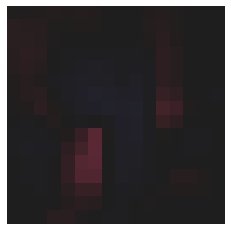

这是feature map 345 tensor(0.0003, device='cuda:0', grad_fn=<MeanBackward0>)


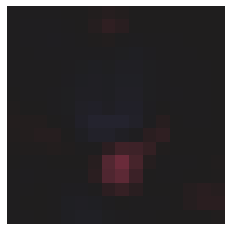

这是feature map 346 tensor(0.2267, device='cuda:0', grad_fn=<MeanBackward0>)


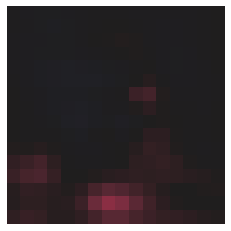

这是feature map 347 tensor(0.0230, device='cuda:0', grad_fn=<MeanBackward0>)


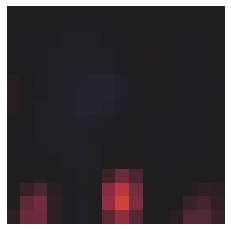

这是feature map 348 tensor(-0.1882, device='cuda:0', grad_fn=<MeanBackward0>)


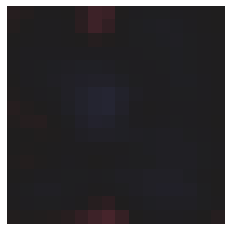

这是feature map 349 tensor(0.0472, device='cuda:0', grad_fn=<MeanBackward0>)


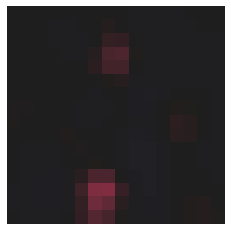

这是feature map 350 tensor(-0.4370, device='cuda:0', grad_fn=<MeanBackward0>)


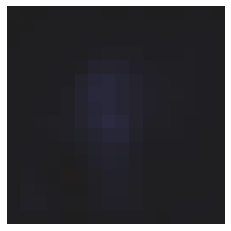

这是feature map 351 tensor(0.4728, device='cuda:0', grad_fn=<MeanBackward0>)


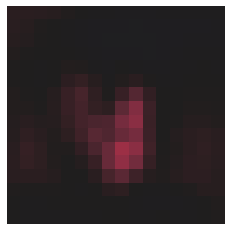

这是feature map 352 tensor(0.0255, device='cuda:0', grad_fn=<MeanBackward0>)


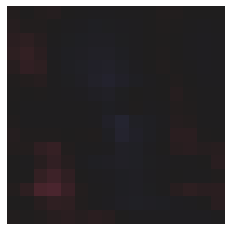

这是feature map 353 tensor(-0.2032, device='cuda:0', grad_fn=<MeanBackward0>)


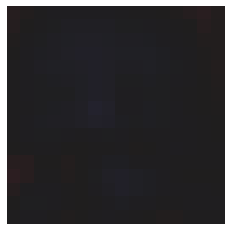

这是feature map 354 tensor(-0.1528, device='cuda:0', grad_fn=<MeanBackward0>)


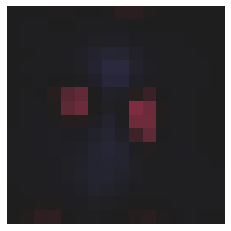

这是feature map 355 tensor(0.2309, device='cuda:0', grad_fn=<MeanBackward0>)


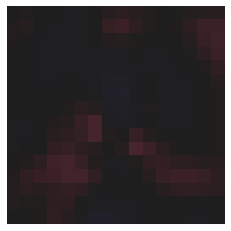

这是feature map 356 tensor(0.1407, device='cuda:0', grad_fn=<MeanBackward0>)


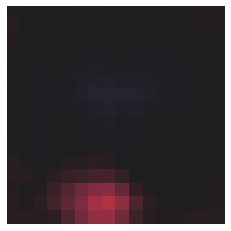

这是feature map 357 tensor(-0.1079, device='cuda:0', grad_fn=<MeanBackward0>)


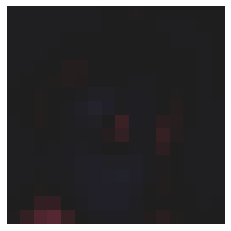

这是feature map 358 tensor(-0.2025, device='cuda:0', grad_fn=<MeanBackward0>)


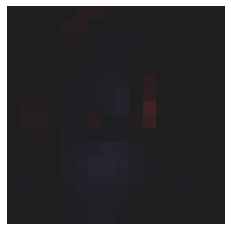

这是feature map 359 tensor(0.0013, device='cuda:0', grad_fn=<MeanBackward0>)


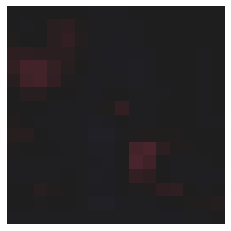

这是feature map 360 tensor(0.2249, device='cuda:0', grad_fn=<MeanBackward0>)


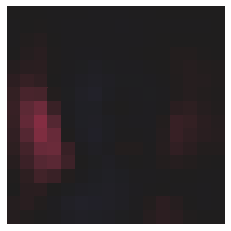

这是feature map 361 tensor(-0.0610, device='cuda:0', grad_fn=<MeanBackward0>)


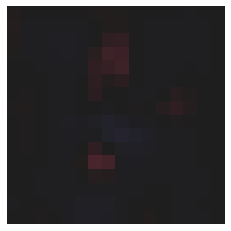

这是feature map 362 tensor(-0.2201, device='cuda:0', grad_fn=<MeanBackward0>)


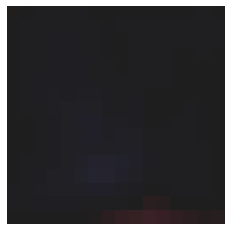

这是feature map 363 tensor(0.1619, device='cuda:0', grad_fn=<MeanBackward0>)


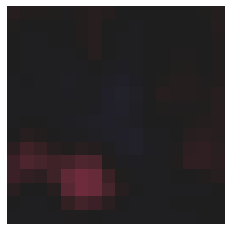

这是feature map 364 tensor(0.2069, device='cuda:0', grad_fn=<MeanBackward0>)


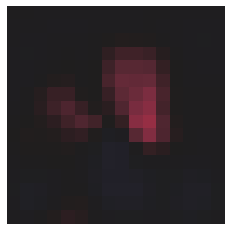

这是feature map 365 tensor(0.1571, device='cuda:0', grad_fn=<MeanBackward0>)


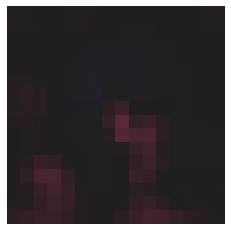

这是feature map 366 tensor(-0.0597, device='cuda:0', grad_fn=<MeanBackward0>)


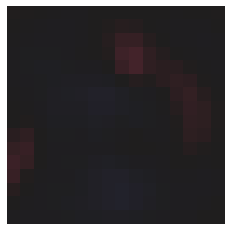

这是feature map 367 tensor(-0.1912, device='cuda:0', grad_fn=<MeanBackward0>)


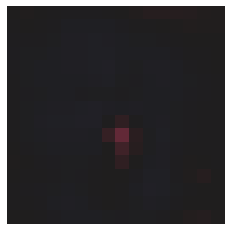

这是feature map 368 tensor(-0.0693, device='cuda:0', grad_fn=<MeanBackward0>)


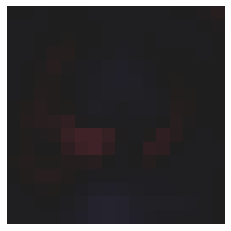

这是feature map 369 tensor(-0.3628, device='cuda:0', grad_fn=<MeanBackward0>)


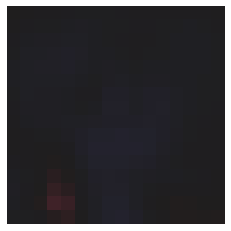

这是feature map 370 tensor(0.0133, device='cuda:0', grad_fn=<MeanBackward0>)


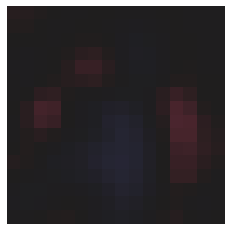

这是feature map 371 tensor(0.3399, device='cuda:0', grad_fn=<MeanBackward0>)


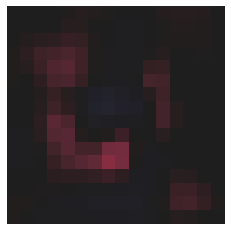

这是feature map 372 tensor(-0.2275, device='cuda:0', grad_fn=<MeanBackward0>)


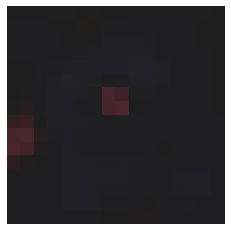

这是feature map 373 tensor(0.0008, device='cuda:0', grad_fn=<MeanBackward0>)


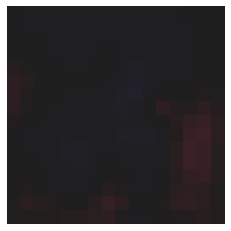

这是feature map 374 tensor(0.1785, device='cuda:0', grad_fn=<MeanBackward0>)


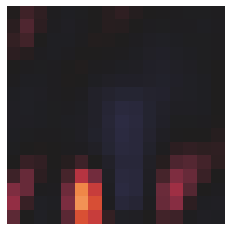

这是feature map 375 tensor(0.0629, device='cuda:0', grad_fn=<MeanBackward0>)


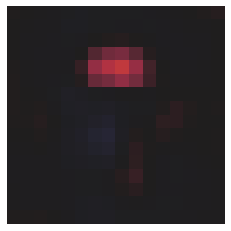

这是feature map 376 tensor(-0.1050, device='cuda:0', grad_fn=<MeanBackward0>)


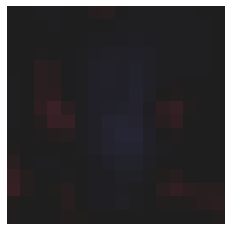

这是feature map 377 tensor(0.0933, device='cuda:0', grad_fn=<MeanBackward0>)


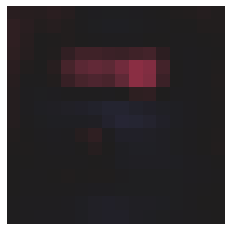

这是feature map 378 tensor(-0.2709, device='cuda:0', grad_fn=<MeanBackward0>)


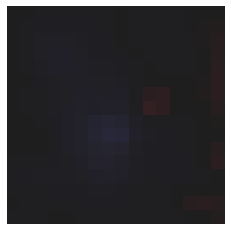

这是feature map 379 tensor(0.5101, device='cuda:0', grad_fn=<MeanBackward0>)


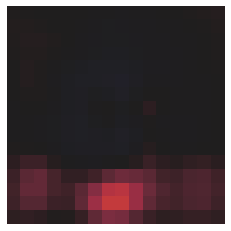

这是feature map 380 tensor(-0.0113, device='cuda:0', grad_fn=<MeanBackward0>)


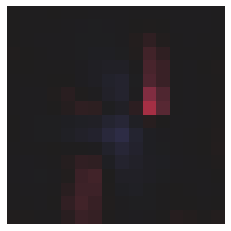

这是feature map 381 tensor(0.2547, device='cuda:0', grad_fn=<MeanBackward0>)


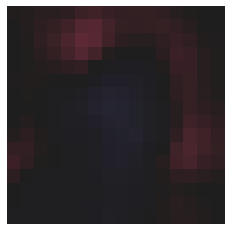

这是feature map 382 tensor(-0.1341, device='cuda:0', grad_fn=<MeanBackward0>)


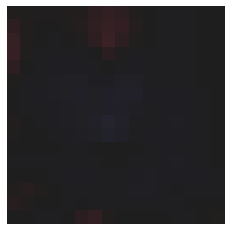

这是feature map 383 tensor(-0.1307, device='cuda:0', grad_fn=<MeanBackward0>)


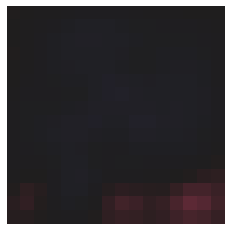

这是feature map 384 tensor(0.0127, device='cuda:0', grad_fn=<MeanBackward0>)


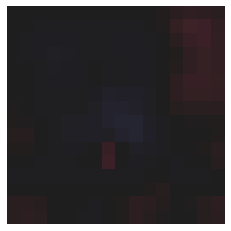

这是feature map 385 tensor(-0.1065, device='cuda:0', grad_fn=<MeanBackward0>)


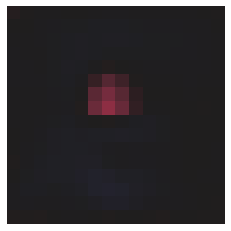

这是feature map 386 tensor(0.1376, device='cuda:0', grad_fn=<MeanBackward0>)


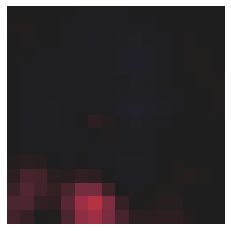

这是feature map 387 tensor(-0.3247, device='cuda:0', grad_fn=<MeanBackward0>)


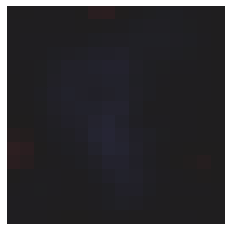

这是feature map 388 tensor(0.0046, device='cuda:0', grad_fn=<MeanBackward0>)


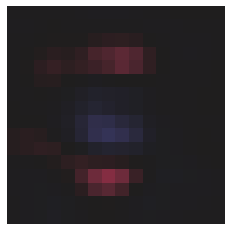

这是feature map 389 tensor(-0.1209, device='cuda:0', grad_fn=<MeanBackward0>)


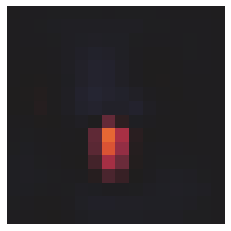

这是feature map 390 tensor(-0.0789, device='cuda:0', grad_fn=<MeanBackward0>)


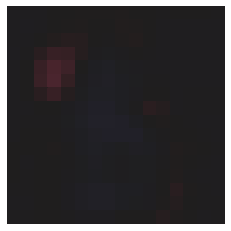

这是feature map 391 tensor(0.1184, device='cuda:0', grad_fn=<MeanBackward0>)


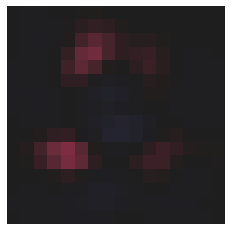

这是feature map 392 tensor(0.1111, device='cuda:0', grad_fn=<MeanBackward0>)


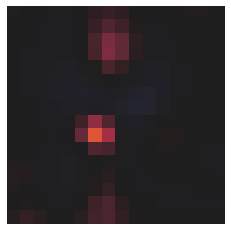

这是feature map 393 tensor(-0.3222, device='cuda:0', grad_fn=<MeanBackward0>)


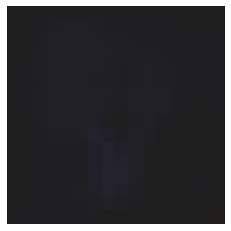

这是feature map 394 tensor(-0.1053, device='cuda:0', grad_fn=<MeanBackward0>)


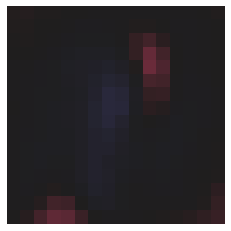

这是feature map 395 tensor(-0.1492, device='cuda:0', grad_fn=<MeanBackward0>)


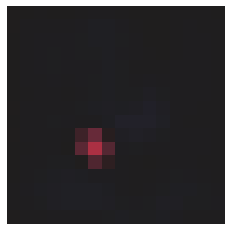

这是feature map 396 tensor(0.6475, device='cuda:0', grad_fn=<MeanBackward0>)


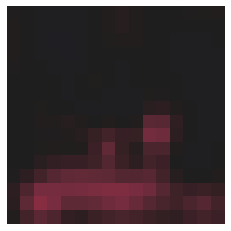

这是feature map 397 tensor(-0.2357, device='cuda:0', grad_fn=<MeanBackward0>)


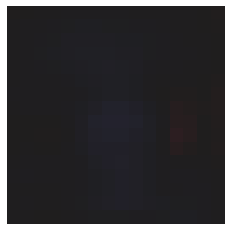

这是feature map 398 tensor(-0.1046, device='cuda:0', grad_fn=<MeanBackward0>)


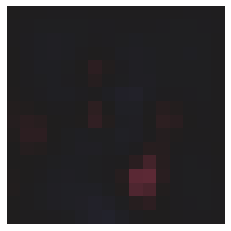

这是feature map 399 tensor(-0.0614, device='cuda:0', grad_fn=<MeanBackward0>)


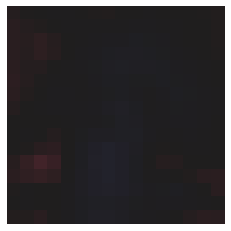

这是feature map 400 tensor(0.4193, device='cuda:0', grad_fn=<MeanBackward0>)


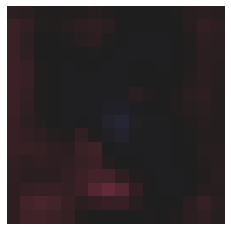

这是feature map 401 tensor(0.3322, device='cuda:0', grad_fn=<MeanBackward0>)


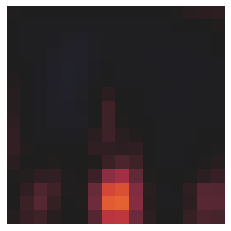

这是feature map 402 tensor(-0.1901, device='cuda:0', grad_fn=<MeanBackward0>)


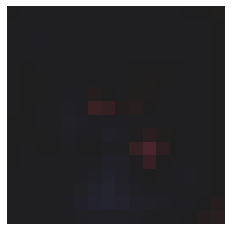

这是feature map 403 tensor(0.4425, device='cuda:0', grad_fn=<MeanBackward0>)


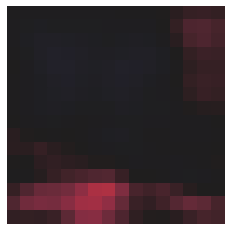

这是feature map 404 tensor(-0.1056, device='cuda:0', grad_fn=<MeanBackward0>)


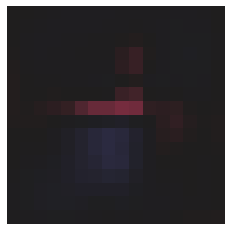

这是feature map 405 tensor(-0.1548, device='cuda:0', grad_fn=<MeanBackward0>)


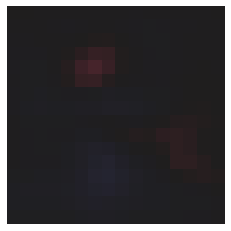

这是feature map 406 tensor(0.0944, device='cuda:0', grad_fn=<MeanBackward0>)


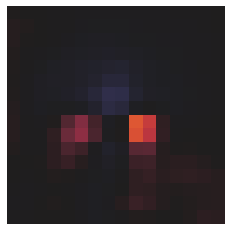

这是feature map 407 tensor(-0.0892, device='cuda:0', grad_fn=<MeanBackward0>)


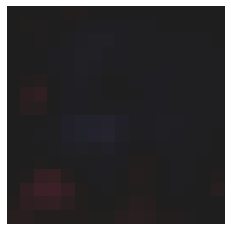

这是feature map 408 tensor(-0.1495, device='cuda:0', grad_fn=<MeanBackward0>)


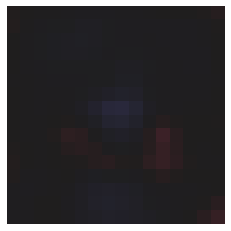

这是feature map 409 tensor(0.8578, device='cuda:0', grad_fn=<MeanBackward0>)


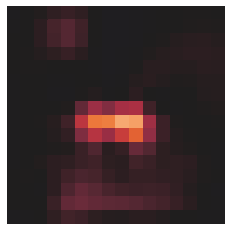

这是feature map 410 tensor(-0.1618, device='cuda:0', grad_fn=<MeanBackward0>)


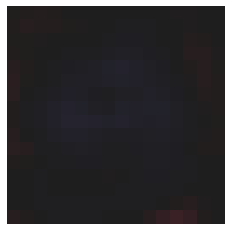

这是feature map 411 tensor(-0.0728, device='cuda:0', grad_fn=<MeanBackward0>)


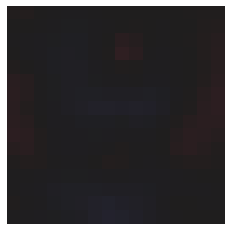

这是feature map 412 tensor(0.2766, device='cuda:0', grad_fn=<MeanBackward0>)


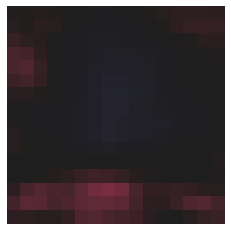

这是feature map 413 tensor(0.0810, device='cuda:0', grad_fn=<MeanBackward0>)


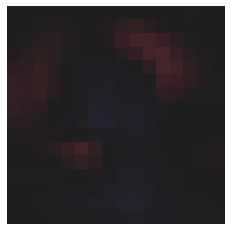

这是feature map 414 tensor(-0.4717, device='cuda:0', grad_fn=<MeanBackward0>)


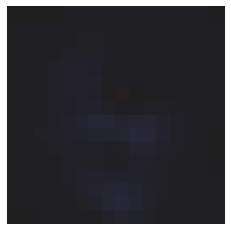

这是feature map 415 tensor(-0.0584, device='cuda:0', grad_fn=<MeanBackward0>)


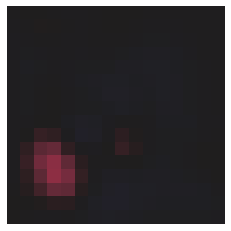

这是feature map 416 tensor(-0.1147, device='cuda:0', grad_fn=<MeanBackward0>)


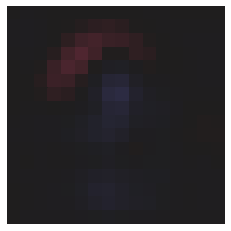

这是feature map 417 tensor(-0.0322, device='cuda:0', grad_fn=<MeanBackward0>)


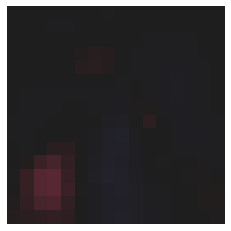

这是feature map 418 tensor(-0.1156, device='cuda:0', grad_fn=<MeanBackward0>)


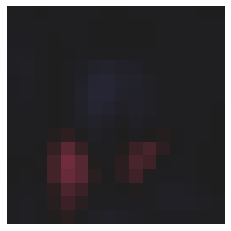

这是feature map 419 tensor(0.1063, device='cuda:0', grad_fn=<MeanBackward0>)


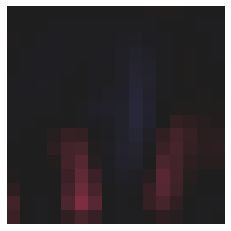

这是feature map 420 tensor(0.2164, device='cuda:0', grad_fn=<MeanBackward0>)


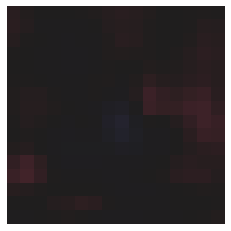

这是feature map 421 tensor(-0.2819, device='cuda:0', grad_fn=<MeanBackward0>)


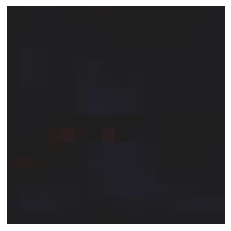

这是feature map 422 tensor(0.1781, device='cuda:0', grad_fn=<MeanBackward0>)


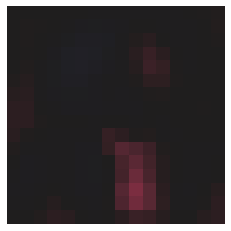

这是feature map 423 tensor(-0.1703, device='cuda:0', grad_fn=<MeanBackward0>)


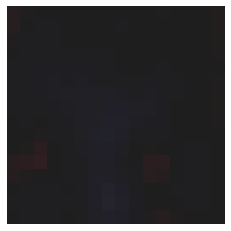

这是feature map 424 tensor(0.0974, device='cuda:0', grad_fn=<MeanBackward0>)


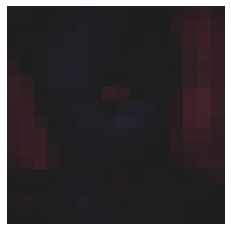

这是feature map 425 tensor(-0.3049, device='cuda:0', grad_fn=<MeanBackward0>)


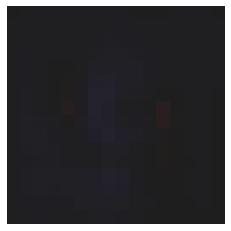

这是feature map 426 tensor(0.1180, device='cuda:0', grad_fn=<MeanBackward0>)


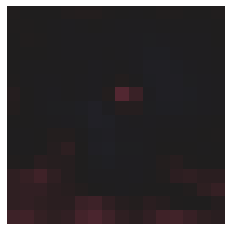

这是feature map 427 tensor(-0.2643, device='cuda:0', grad_fn=<MeanBackward0>)


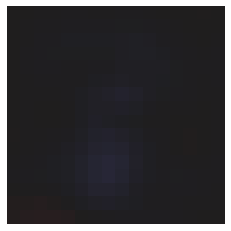

这是feature map 428 tensor(-0.1143, device='cuda:0', grad_fn=<MeanBackward0>)


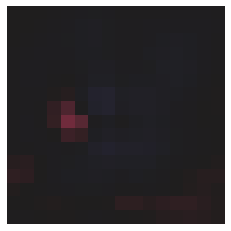

这是feature map 429 tensor(0.0057, device='cuda:0', grad_fn=<MeanBackward0>)


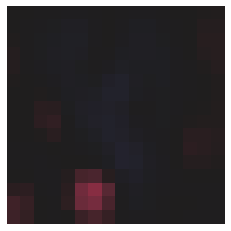

这是feature map 430 tensor(-0.0888, device='cuda:0', grad_fn=<MeanBackward0>)


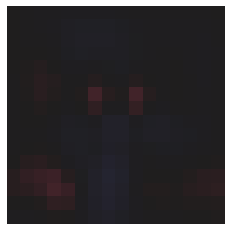

这是feature map 431 tensor(0.1756, device='cuda:0', grad_fn=<MeanBackward0>)


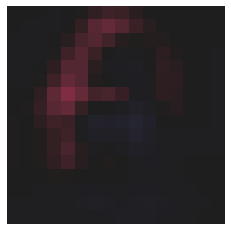

这是feature map 432 tensor(-0.1180, device='cuda:0', grad_fn=<MeanBackward0>)


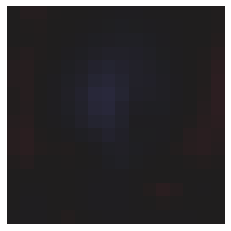

这是feature map 433 tensor(-0.1384, device='cuda:0', grad_fn=<MeanBackward0>)


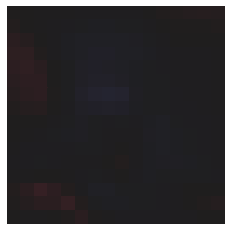

这是feature map 434 tensor(0.1704, device='cuda:0', grad_fn=<MeanBackward0>)


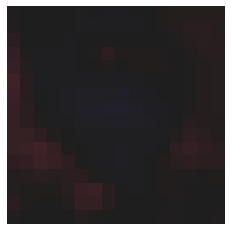

这是feature map 435 tensor(-0.0868, device='cuda:0', grad_fn=<MeanBackward0>)


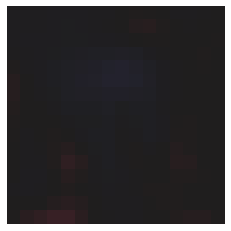

这是feature map 436 tensor(0.6516, device='cuda:0', grad_fn=<MeanBackward0>)


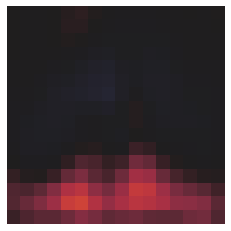

这是feature map 437 tensor(-0.1631, device='cuda:0', grad_fn=<MeanBackward0>)


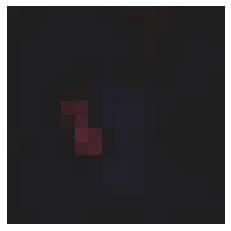

这是feature map 438 tensor(-0.0308, device='cuda:0', grad_fn=<MeanBackward0>)


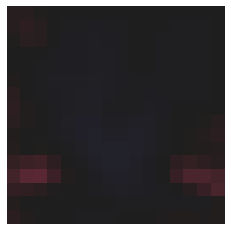

这是feature map 439 tensor(0.4316, device='cuda:0', grad_fn=<MeanBackward0>)


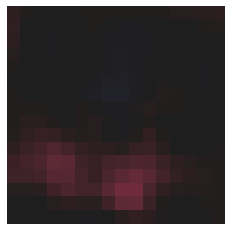

这是feature map 440 tensor(-0.1244, device='cuda:0', grad_fn=<MeanBackward0>)


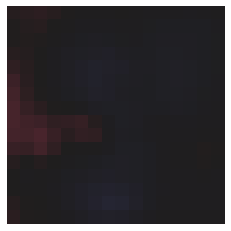

这是feature map 441 tensor(0.8585, device='cuda:0', grad_fn=<MeanBackward0>)


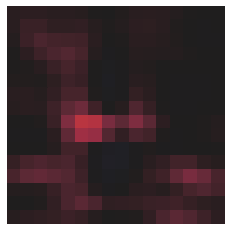

这是feature map 442 tensor(-0.3019, device='cuda:0', grad_fn=<MeanBackward0>)


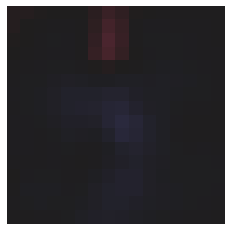

这是feature map 443 tensor(0.2034, device='cuda:0', grad_fn=<MeanBackward0>)


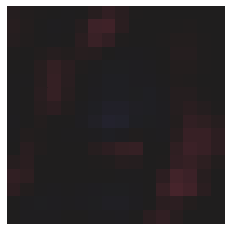

这是feature map 444 tensor(-0.0676, device='cuda:0', grad_fn=<MeanBackward0>)


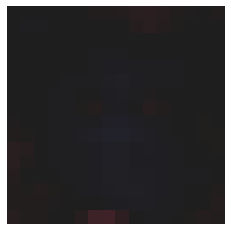

这是feature map 445 tensor(-0.0287, device='cuda:0', grad_fn=<MeanBackward0>)


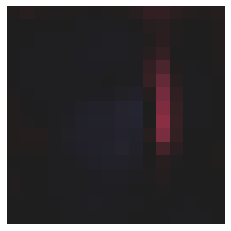

这是feature map 446 tensor(-0.1704, device='cuda:0', grad_fn=<MeanBackward0>)


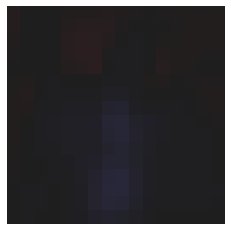

这是feature map 447 tensor(0.1091, device='cuda:0', grad_fn=<MeanBackward0>)


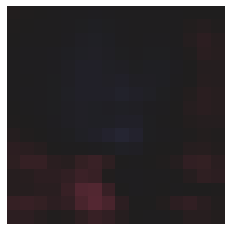

这是feature map 448 tensor(-0.1265, device='cuda:0', grad_fn=<MeanBackward0>)


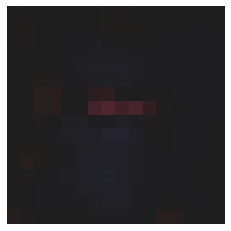

这是feature map 449 tensor(-0.1842, device='cuda:0', grad_fn=<MeanBackward0>)


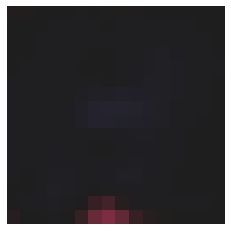

这是feature map 450 tensor(-0.0056, device='cuda:0', grad_fn=<MeanBackward0>)


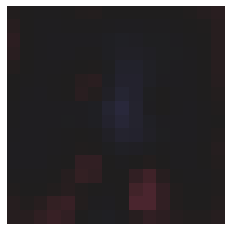

这是feature map 451 tensor(-0.1571, device='cuda:0', grad_fn=<MeanBackward0>)


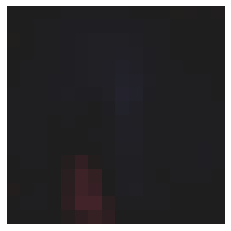

这是feature map 452 tensor(-0.2675, device='cuda:0', grad_fn=<MeanBackward0>)


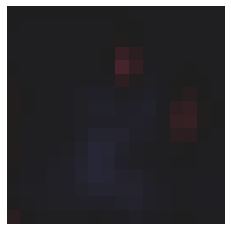

这是feature map 453 tensor(0.4358, device='cuda:0', grad_fn=<MeanBackward0>)


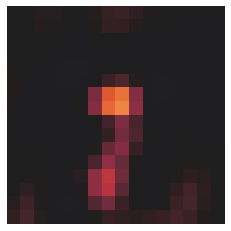

这是feature map 454 tensor(0.0409, device='cuda:0', grad_fn=<MeanBackward0>)


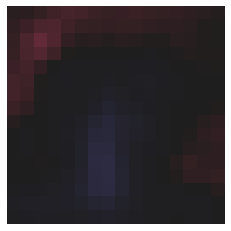

这是feature map 455 tensor(-0.4059, device='cuda:0', grad_fn=<MeanBackward0>)


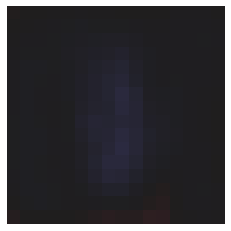

这是feature map 456 tensor(-0.2828, device='cuda:0', grad_fn=<MeanBackward0>)


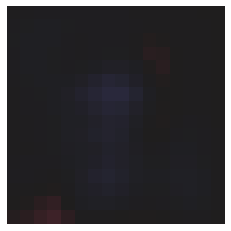

这是feature map 457 tensor(0.0715, device='cuda:0', grad_fn=<MeanBackward0>)


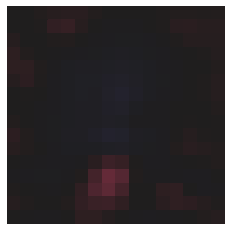

这是feature map 458 tensor(-0.1459, device='cuda:0', grad_fn=<MeanBackward0>)


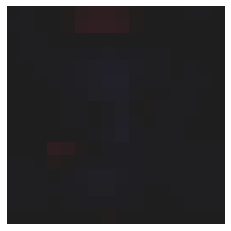

这是feature map 459 tensor(-0.3421, device='cuda:0', grad_fn=<MeanBackward0>)


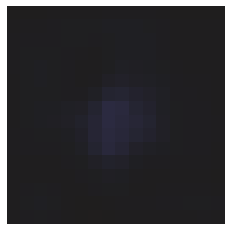

这是feature map 460 tensor(-0.1052, device='cuda:0', grad_fn=<MeanBackward0>)


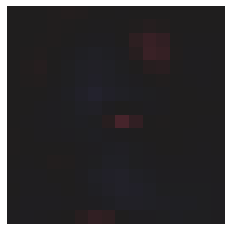

这是feature map 461 tensor(-0.0466, device='cuda:0', grad_fn=<MeanBackward0>)


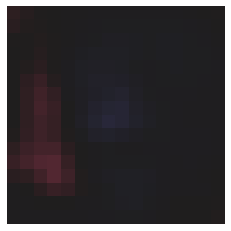

这是feature map 462 tensor(0.2608, device='cuda:0', grad_fn=<MeanBackward0>)


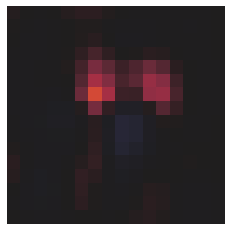

这是feature map 463 tensor(0.1548, device='cuda:0', grad_fn=<MeanBackward0>)


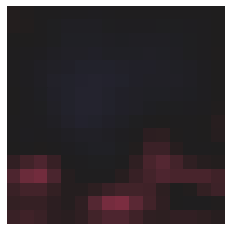

这是feature map 464 tensor(-0.2570, device='cuda:0', grad_fn=<MeanBackward0>)


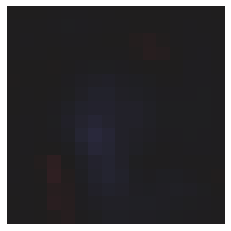

这是feature map 465 tensor(-0.0127, device='cuda:0', grad_fn=<MeanBackward0>)


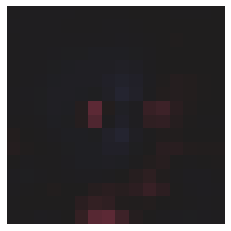

这是feature map 466 tensor(0.2559, device='cuda:0', grad_fn=<MeanBackward0>)


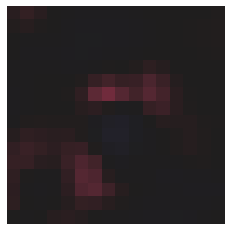

这是feature map 467 tensor(-0.0598, device='cuda:0', grad_fn=<MeanBackward0>)


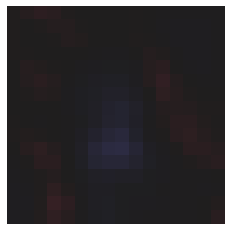

这是feature map 468 tensor(0.1214, device='cuda:0', grad_fn=<MeanBackward0>)


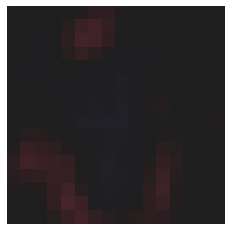

这是feature map 469 tensor(0.0669, device='cuda:0', grad_fn=<MeanBackward0>)


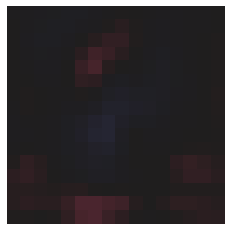

这是feature map 470 tensor(0.1374, device='cuda:0', grad_fn=<MeanBackward0>)


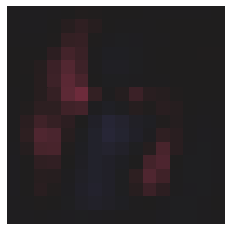

这是feature map 471 tensor(-0.2617, device='cuda:0', grad_fn=<MeanBackward0>)


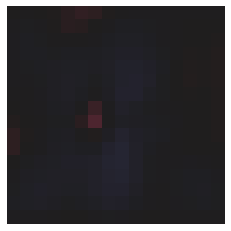

这是feature map 472 tensor(0.2236, device='cuda:0', grad_fn=<MeanBackward0>)


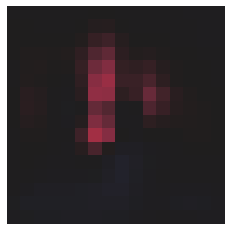

这是feature map 473 tensor(0.2078, device='cuda:0', grad_fn=<MeanBackward0>)


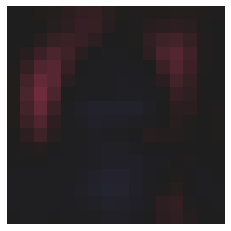

这是feature map 474 tensor(-0.1699, device='cuda:0', grad_fn=<MeanBackward0>)


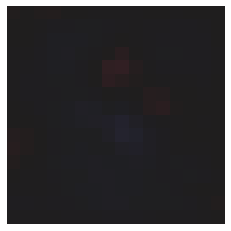

这是feature map 475 tensor(-0.0172, device='cuda:0', grad_fn=<MeanBackward0>)


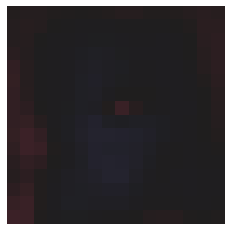

这是feature map 476 tensor(-0.1701, device='cuda:0', grad_fn=<MeanBackward0>)


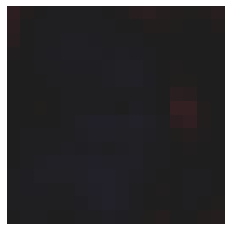

这是feature map 477 tensor(0.2913, device='cuda:0', grad_fn=<MeanBackward0>)


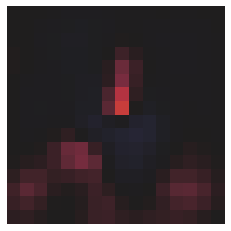

这是feature map 478 tensor(0.0515, device='cuda:0', grad_fn=<MeanBackward0>)


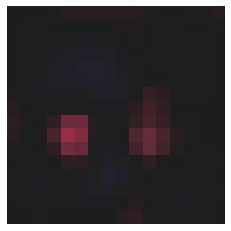

这是feature map 479 tensor(-0.0381, device='cuda:0', grad_fn=<MeanBackward0>)


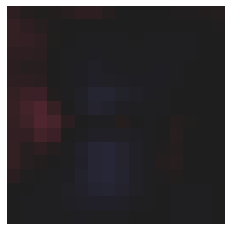

这是feature map 480 tensor(-0.0310, device='cuda:0', grad_fn=<MeanBackward0>)


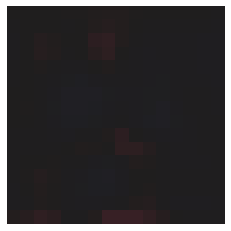

这是feature map 481 tensor(0.0756, device='cuda:0', grad_fn=<MeanBackward0>)


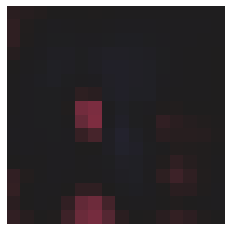

这是feature map 482 tensor(-0.2071, device='cuda:0', grad_fn=<MeanBackward0>)


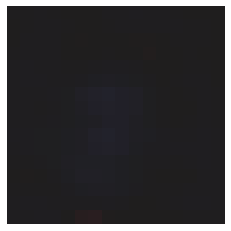

这是feature map 483 tensor(0.0402, device='cuda:0', grad_fn=<MeanBackward0>)


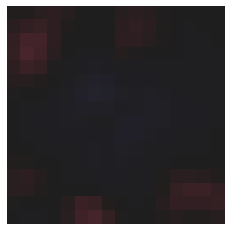

这是feature map 484 tensor(-0.1132, device='cuda:0', grad_fn=<MeanBackward0>)


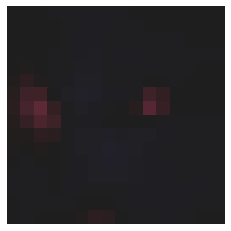

这是feature map 485 tensor(0.2846, device='cuda:0', grad_fn=<MeanBackward0>)


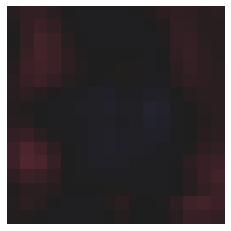

这是feature map 486 tensor(-0.0853, device='cuda:0', grad_fn=<MeanBackward0>)


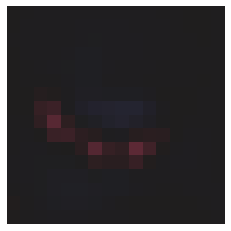

这是feature map 487 tensor(-0.0964, device='cuda:0', grad_fn=<MeanBackward0>)


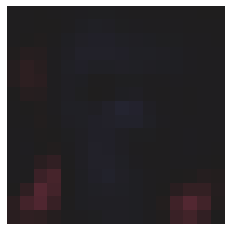

这是feature map 488 tensor(-0.4057, device='cuda:0', grad_fn=<MeanBackward0>)


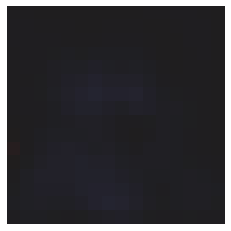

这是feature map 489 tensor(0.1030, device='cuda:0', grad_fn=<MeanBackward0>)


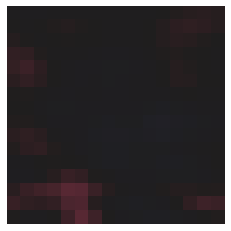

这是feature map 490 tensor(-0.2914, device='cuda:0', grad_fn=<MeanBackward0>)


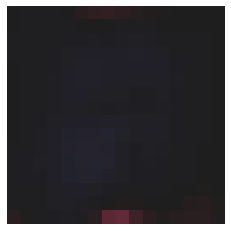

这是feature map 491 tensor(-0.0274, device='cuda:0', grad_fn=<MeanBackward0>)


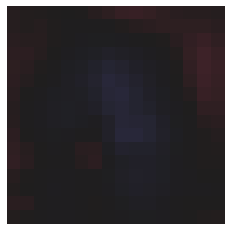

这是feature map 492 tensor(-0.0414, device='cuda:0', grad_fn=<MeanBackward0>)


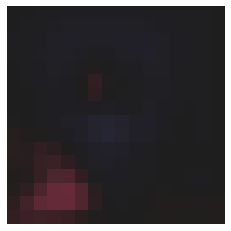

这是feature map 493 tensor(-0.0324, device='cuda:0', grad_fn=<MeanBackward0>)


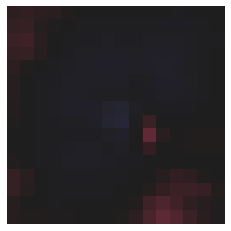

这是feature map 494 tensor(0.3836, device='cuda:0', grad_fn=<MeanBackward0>)


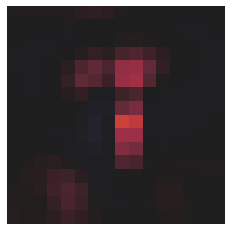

这是feature map 495 tensor(0.2569, device='cuda:0', grad_fn=<MeanBackward0>)


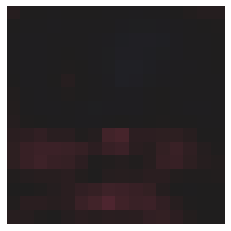

这是feature map 496 tensor(0.0466, device='cuda:0', grad_fn=<MeanBackward0>)


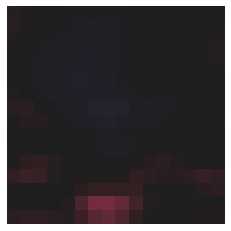

这是feature map 497 tensor(0.2471, device='cuda:0', grad_fn=<MeanBackward0>)


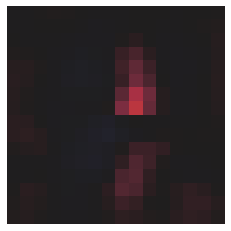

这是feature map 498 tensor(-0.0304, device='cuda:0', grad_fn=<MeanBackward0>)


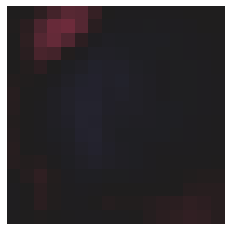

这是feature map 499 tensor(-0.0566, device='cuda:0', grad_fn=<MeanBackward0>)


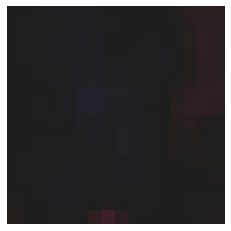

这是feature map 500 tensor(0.3321, device='cuda:0', grad_fn=<MeanBackward0>)


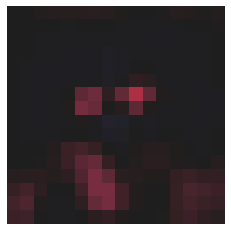

这是feature map 501 tensor(0.0334, device='cuda:0', grad_fn=<MeanBackward0>)


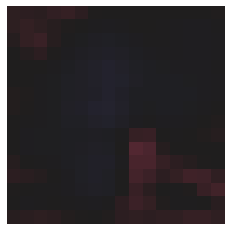

这是feature map 502 tensor(0.9498, device='cuda:0', grad_fn=<MeanBackward0>)


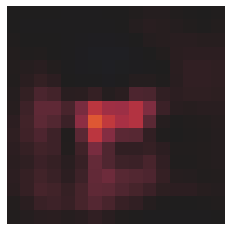

这是feature map 503 tensor(0.2433, device='cuda:0', grad_fn=<MeanBackward0>)


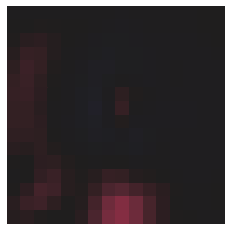

这是feature map 504 tensor(0.1382, device='cuda:0', grad_fn=<MeanBackward0>)


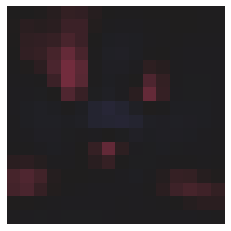

这是feature map 505 tensor(-0.3038, device='cuda:0', grad_fn=<MeanBackward0>)


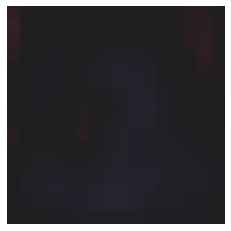

这是feature map 506 tensor(-0.1282, device='cuda:0', grad_fn=<MeanBackward0>)


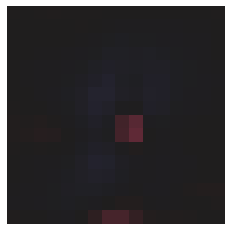

这是feature map 507 tensor(0.0128, device='cuda:0', grad_fn=<MeanBackward0>)


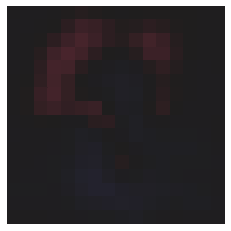

这是feature map 508 tensor(0.1585, device='cuda:0', grad_fn=<MeanBackward0>)


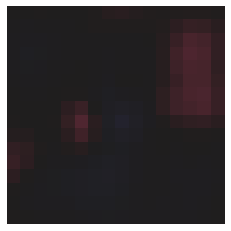

这是feature map 509 tensor(0.1503, device='cuda:0', grad_fn=<MeanBackward0>)


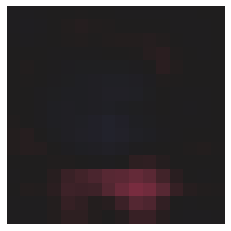

这是feature map 510 tensor(-0.1198, device='cuda:0', grad_fn=<MeanBackward0>)


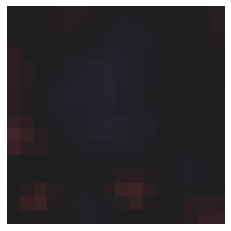

这是feature map 511 tensor(0.1191, device='cuda:0', grad_fn=<MeanBackward0>)


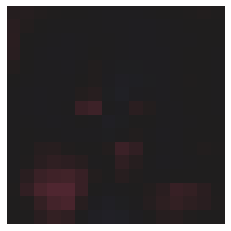

这是feature map 512 tensor(0.3859, device='cuda:0', grad_fn=<MeanBackward0>)


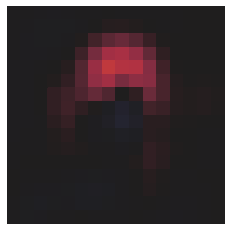

In [ ]:

import seaborn as sns
def junzhi_fangcha(x):
  mean=x.mean()
  var=x.var()
  return mean,var
import imageio
for l in [4]:
  display_block = l

  num_feature_map=25 #@param {type:"slider", min:0, max:512, step:1}

  out_all=True #@param ["True", "False"] {type:"raw", allow-input: true}
  display_tensor=True #@param ["True", "False"] {type:"raw", allow-input: true}
  save_feature=True #@param ["True", "False"] {type:"raw", allow-input: true}
  #Extract feature
  extracted_block=x_all[display_block][0]
  if len(extracted_block)==1:
    extracted_block=extracted_block[0]
  #extracted_feature=extracted_block[num_feature_map-1]
  import os
  if save_feature:
    fea_name='sns_fix_'+str(seed)+'_nopadding_3_ly3/ly_'+str(display_block)
    #fea_name='sns_fix_'+str(seed)+'_ori/ly_'+str(display_block)
    os.mkdir(fea_name)
  mean_all_1=[]
  max_all_1=[]
  if out_all:
    for i_index,i in enumerate(extracted_block):
      #i_mean,i_var=junzhi_fangcha(i)
      #i=(i-i_mean)/i_var
      #img_feature=(i * 127.5 + 128).clamp(0, 255).to(torch.uint8)
      img_feature=i
      #.clamp(0, 255)
      if display_tensor:
        print('这是feature map',i_index+1,i.mean())
        mean_all_1.append(i.abs().mean())
        max_all_1.append(i.max())
        #print('该feature map 0-255归一化后是',img_feature)
        #print('该feature map 绝对值后均值是',i.abs().mean())
      else:
        print('这是feature map',i_index+1)
      raw=True
      if save_feature:
        if raw:
          plt.axis('off')
          ax = sns.heatmap(img_feature.detach().cpu().numpy(),center=0.0,vmax=8,square=True,cbar=False)
          ax.set_axis_off
          plt.close()
          #plt.show()
          scatter_fig = ax.get_figure()
          scatter_fig.savefig(f'{fea_name}/{i_index+1}_ori.png',bbox_inches="tight",pad_inches = 0 )
          #save_variable(img_feature,f'{fea_name}/{i_index+1}.png')
        else:
          img_save = img_feature.detach().cpu().numpy()
          #img_feature=PIL.Image.fromarray(img_feature[0], 'gray')
          imageio.imsave(f'{fea_name}/{i_index+1}.png', img_save)
          #img_feature.save(f'{fea_name}/{i_index+1}.png')
      if display_tensor:
        plt.axis('off')
        img_feature=img_feature.detach().cpu().numpy()
        ax = sns.heatmap(img_feature, center=0,vmax=10,square=True,cbar=False)
        #plt.imshow(img_feature.detach().cpu().numpy(),cmap="ru")
        plt.show()
    zip_mean_1=zip(range(i_index+1),mean_all_1)
  if not out_all:
  #display
    print('这是feature map',num_feature_map,i)
    img_feature=(extracted_feature * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    plt.axis('off')
    plt.imshow(img_feature,cmap="gray")
    plt.show()




In [ ]:
x_309=load_variavle('309_058.txt')
x_473=load_variavle('473_058.txt')
x_60=load_variavle('60_058.txt')

In [ ]:
x_309[1]

IndexError: ignored

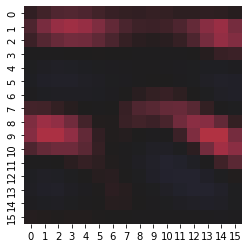

In [ ]:
import seaborn as sns
def junzhi_fangcha(x):
  mean=x.mean()
  var=x.var()
  return mean,var
import imageio
ax = sns.heatmap(x_60[0].detach().cpu().numpy(),center=0.0,vmax=8,square=True,cbar=False)
ax.set_axis_off
plt.show()

#Feature map的显示2

这是feature map 1 tensor(-0.0121, device='cuda:0', grad_fn=<MeanBackward0>)


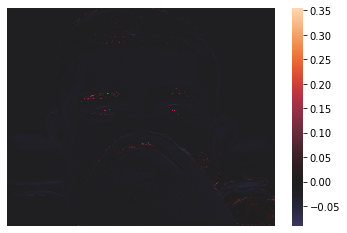

这是feature map 2 tensor(-0.0299, device='cuda:0', grad_fn=<MeanBackward0>)


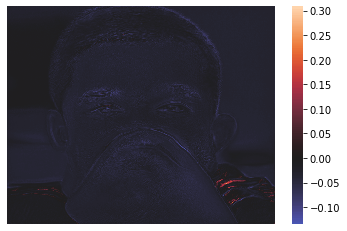

这是feature map 3 tensor(-0.0177, device='cuda:0', grad_fn=<MeanBackward0>)


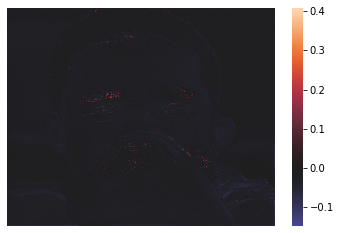

这是feature map 4 tensor(-0.0104, device='cuda:0', grad_fn=<MeanBackward0>)


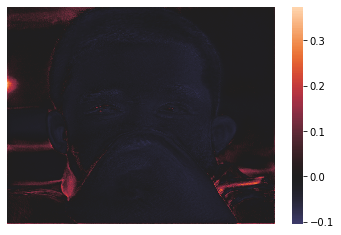

这是feature map 5 tensor(-0.0502, device='cuda:0', grad_fn=<MeanBackward0>)


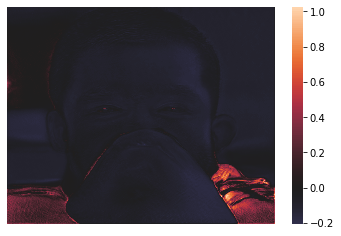

这是feature map 6 tensor(-0.0129, device='cuda:0', grad_fn=<MeanBackward0>)


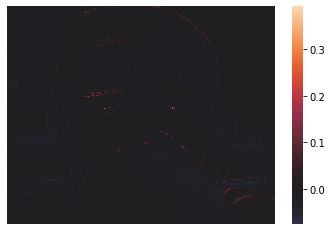

这是feature map 7 tensor(-0.0394, device='cuda:0', grad_fn=<MeanBackward0>)


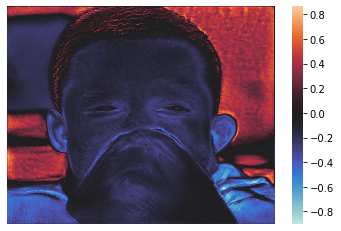

这是feature map 8 tensor(-0.0352, device='cuda:0', grad_fn=<MeanBackward0>)


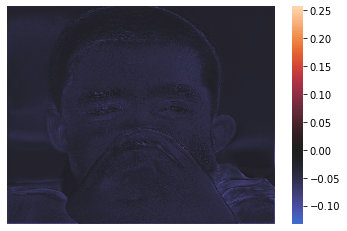

这是feature map 9 tensor(-0.0625, device='cuda:0', grad_fn=<MeanBackward0>)


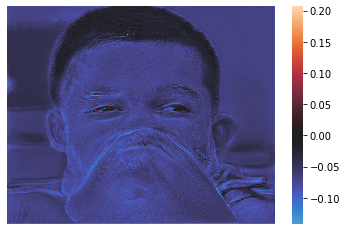

这是feature map 10 tensor(0.1248, device='cuda:0', grad_fn=<MeanBackward0>)


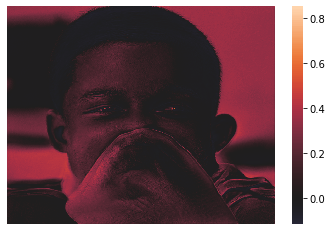

这是feature map 11 tensor(0.1265, device='cuda:0', grad_fn=<MeanBackward0>)


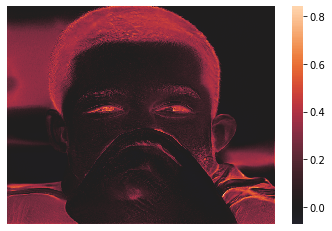

这是feature map 12 tensor(-0.0043, device='cuda:0', grad_fn=<MeanBackward0>)


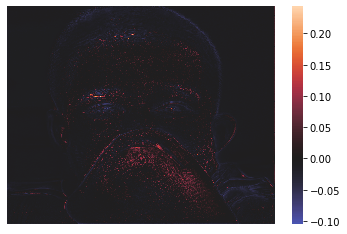

这是feature map 13 tensor(-0.0019, device='cuda:0', grad_fn=<MeanBackward0>)


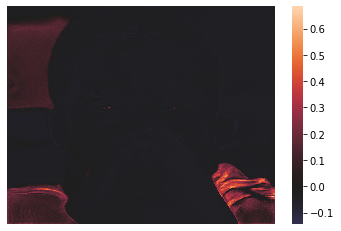

这是feature map 14 tensor(0.0027, device='cuda:0', grad_fn=<MeanBackward0>)


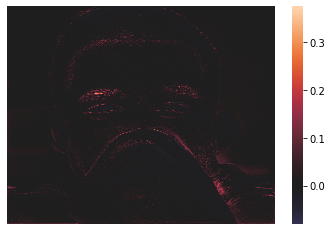

这是feature map 15 tensor(-0.0103, device='cuda:0', grad_fn=<MeanBackward0>)


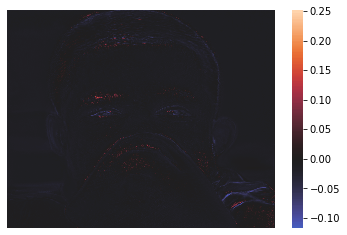

这是feature map 16 tensor(-0.0375, device='cuda:0', grad_fn=<MeanBackward0>)


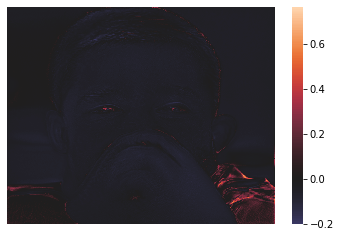

这是feature map 17 tensor(0.0136, device='cuda:0', grad_fn=<MeanBackward0>)


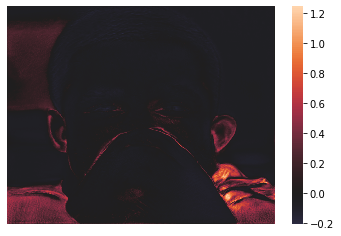

这是feature map 18 tensor(-0.0871, device='cuda:0', grad_fn=<MeanBackward0>)


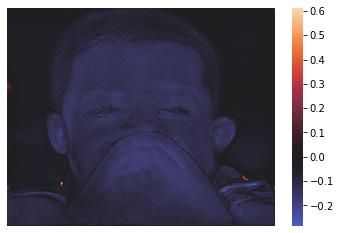

这是feature map 19 tensor(-0.0597, device='cuda:0', grad_fn=<MeanBackward0>)


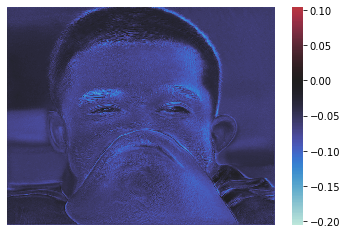

这是feature map 20 tensor(-0.0692, device='cuda:0', grad_fn=<MeanBackward0>)


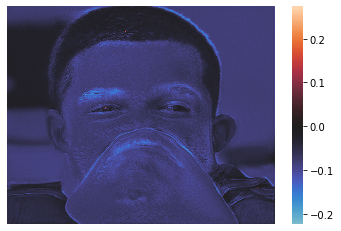

这是feature map 21 tensor(-0.0067, device='cuda:0', grad_fn=<MeanBackward0>)


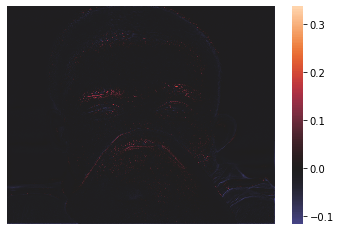

这是feature map 22 tensor(-0.0023, device='cuda:0', grad_fn=<MeanBackward0>)


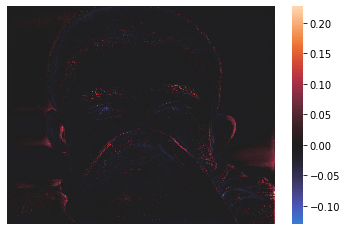

这是feature map 23 tensor(-0.0066, device='cuda:0', grad_fn=<MeanBackward0>)


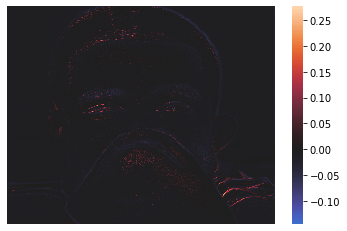

这是feature map 24 tensor(-0.0031, device='cuda:0', grad_fn=<MeanBackward0>)


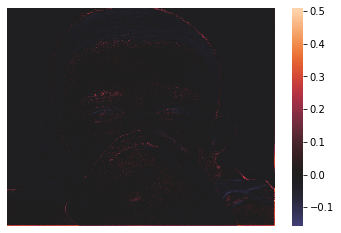

这是feature map 25 tensor(0.0042, device='cuda:0', grad_fn=<MeanBackward0>)


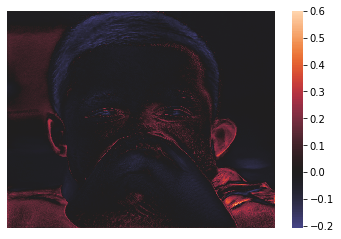

这是feature map 26 tensor(0.0798, device='cuda:0', grad_fn=<MeanBackward0>)


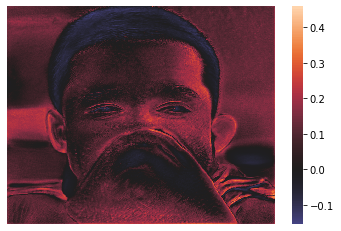

这是feature map 27 tensor(-0.0063, device='cuda:0', grad_fn=<MeanBackward0>)


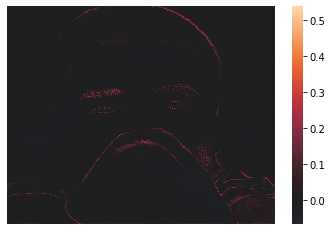

这是feature map 28 tensor(0.5071, device='cuda:0', grad_fn=<MeanBackward0>)


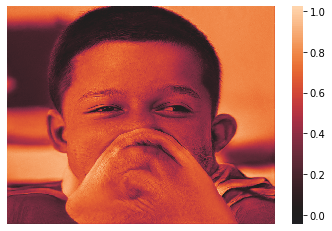

这是feature map 29 tensor(-0.0685, device='cuda:0', grad_fn=<MeanBackward0>)


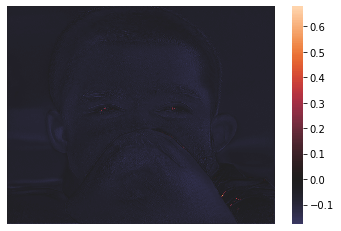

这是feature map 30 tensor(-0.0222, device='cuda:0', grad_fn=<MeanBackward0>)


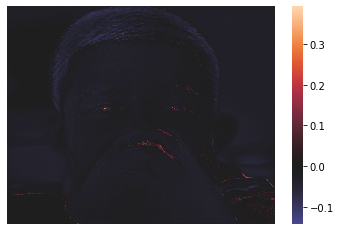

这是feature map 31 tensor(-0.0325, device='cuda:0', grad_fn=<MeanBackward0>)


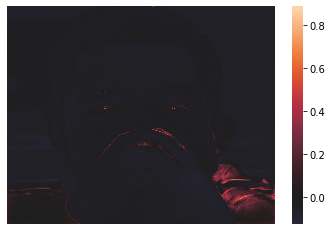

这是feature map 32 tensor(0.0387, device='cuda:0', grad_fn=<MeanBackward0>)


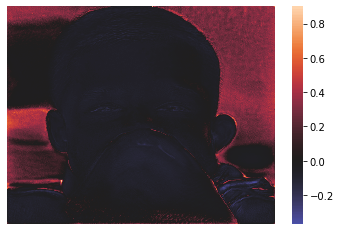

In [ ]:

import seaborn as sns
def junzhi_fangcha(x):
  mean=x.mean()
  var=x.var()
  return mean,var
import imageio
display_block = 16 #@param {type:"slider", min:0, max:17, step:1}

num_feature_map=25 #@param {type:"slider", min:0, max:512, step:1}

out_all=True #@param ["True", "False"] {type:"raw", allow-input: true}
display_tensor=False #@param ["True", "False"] {type:"raw", allow-input: true}
save_feature=True #@param ["True", "False"] {type:"raw", allow-input: true}
#Extract feature
extracted_block=x_all_1[display_block][0]
#extracted_feature=extracted_block[num_feature_map-1]
import os
if save_feature:
  fea_name=str(seed)+'normalized__block'+str(display_block)
  os.mkdir(fea_name)
mean_all_1=[]
max_all_1=[]
if out_all:
  for i_index,i in enumerate(extracted_block):
    #i_mean,i_var=junzhi_fangcha(i)
    #i=(i-i_mean)/i_var
    #img_feature=(i * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    img_feature=i
    #.clamp(0, 255)
    if display_tensor:
      print('这是feature map',i_index+1,i.mean())
      mean_all_1.append(i.abs().mean())
      max_all_1.append(i.max())
      #print('该feature map 0-255归一化后是',img_feature)
      #print('该feature map 绝对值后均值是',i.abs().mean())
    else:
      print('这是feature map',i_index+1)
    if save_feature:
      img_feature = img_feature.cpu().numpy()
      #img_feature=PIL.Image.fromarray(img_feature[0], 'gray')
      imageio.imsave(f'{fea_name}/{i_index+1}.png', img_feature)
      #img_feature.save(f'{fea_name}/{i_index+1}.png')
    if display_tensor:
      plt.axis('off')
      img_feature=img_feature.detach().cpu().numpy()
      ax = sns.heatmap(img_feature, center=0)
      #plt.imshow(img_feature.detach().cpu().numpy(),cmap="ru")
      plt.show()
  zip_mean_1=zip(range(i_index+1),mean_all_1)
if not out_all:
#display
  print('这是feature map',num_feature_map,i)
  img_feature=(extracted_feature * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  plt.axis('off')
  plt.imshow(img_feature,cmap="gray")
  plt.show()




#feature map 显示3（相减）


这是feature map 1 tensor(0.0379, device='cuda:0', grad_fn=<MeanBackward0>)


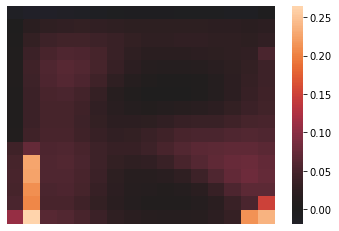

这是feature map 2 tensor(-0.0598, device='cuda:0', grad_fn=<MeanBackward0>)


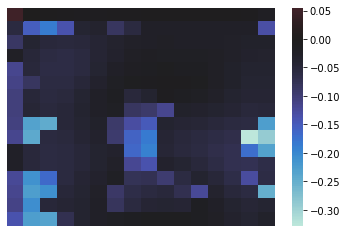

这是feature map 3 tensor(-0.1683, device='cuda:0', grad_fn=<MeanBackward0>)


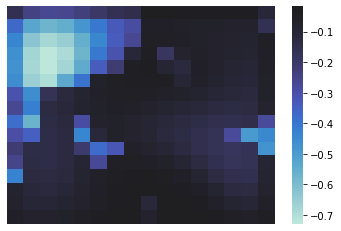

这是feature map 4 tensor(0.2086, device='cuda:0', grad_fn=<MeanBackward0>)


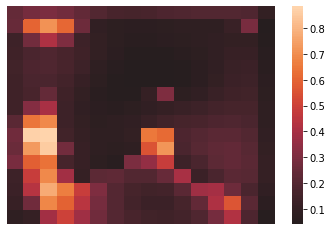

这是feature map 5 tensor(-0.0445, device='cuda:0', grad_fn=<MeanBackward0>)


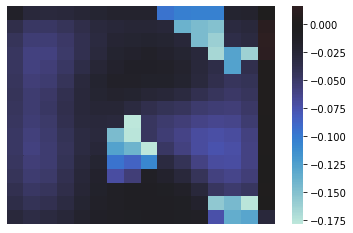

这是feature map 6 tensor(0.0017, device='cuda:0', grad_fn=<MeanBackward0>)


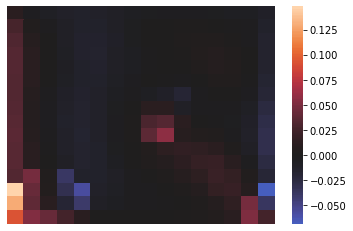

这是feature map 7 tensor(0.0605, device='cuda:0', grad_fn=<MeanBackward0>)


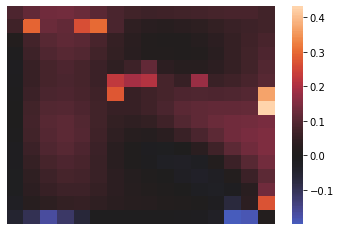

这是feature map 8 tensor(-0.0033, device='cuda:0', grad_fn=<MeanBackward0>)


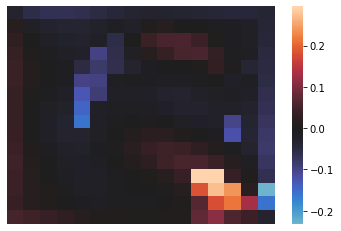

这是feature map 9 tensor(-0.1248, device='cuda:0', grad_fn=<MeanBackward0>)


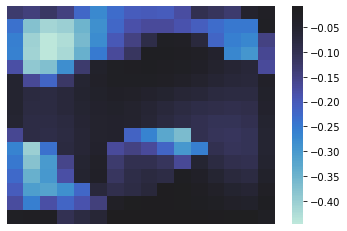

这是feature map 10 tensor(0.1697, device='cuda:0', grad_fn=<MeanBackward0>)


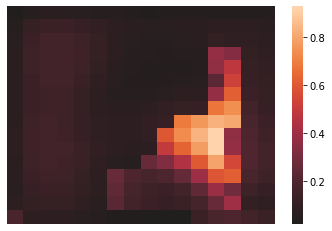

这是feature map 11 tensor(0.1233, device='cuda:0', grad_fn=<MeanBackward0>)


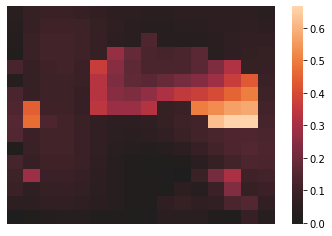

这是feature map 12 tensor(-0.1910, device='cuda:0', grad_fn=<MeanBackward0>)


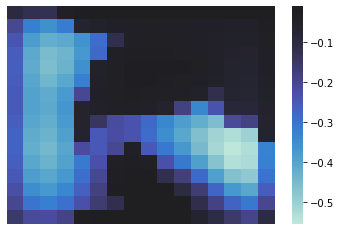

这是feature map 13 tensor(0.0977, device='cuda:0', grad_fn=<MeanBackward0>)


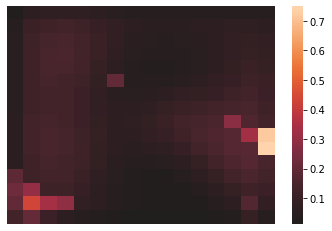

这是feature map 14 tensor(-0.0923, device='cuda:0', grad_fn=<MeanBackward0>)


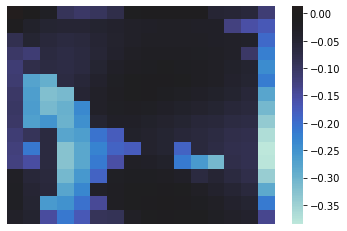

这是feature map 15 tensor(0.3078, device='cuda:0', grad_fn=<MeanBackward0>)


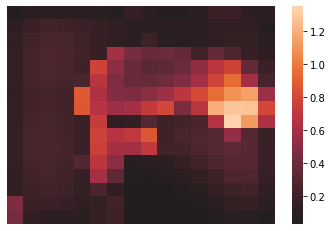

这是feature map 16 tensor(-0.2436, device='cuda:0', grad_fn=<MeanBackward0>)


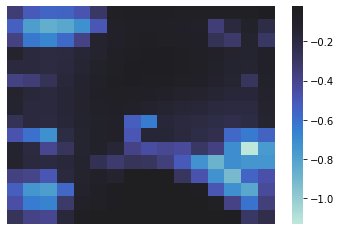

这是feature map 17 tensor(0.1574, device='cuda:0', grad_fn=<MeanBackward0>)


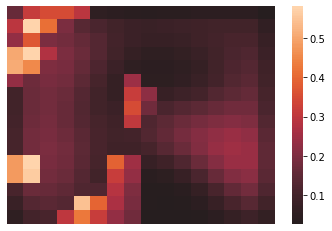

这是feature map 18 tensor(0.1700, device='cuda:0', grad_fn=<MeanBackward0>)


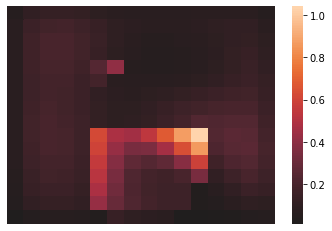

这是feature map 19 tensor(0.1570, device='cuda:0', grad_fn=<MeanBackward0>)


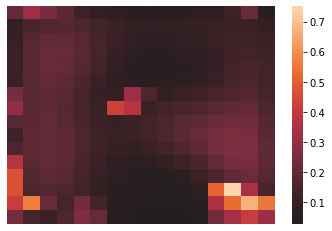

这是feature map 20 tensor(-0.4204, device='cuda:0', grad_fn=<MeanBackward0>)


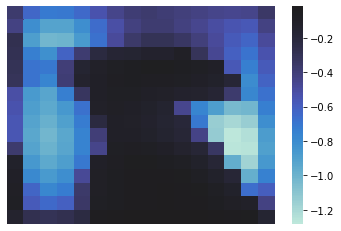

这是feature map 21 tensor(0.3669, device='cuda:0', grad_fn=<MeanBackward0>)


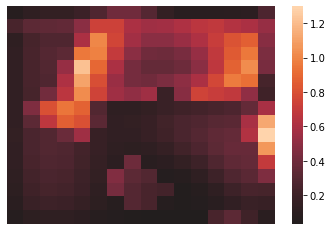

这是feature map 22 tensor(0.3176, device='cuda:0', grad_fn=<MeanBackward0>)


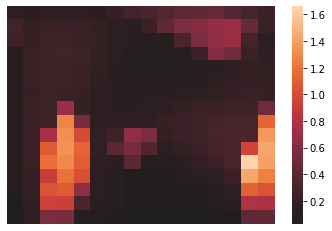

这是feature map 23 tensor(-0.2023, device='cuda:0', grad_fn=<MeanBackward0>)


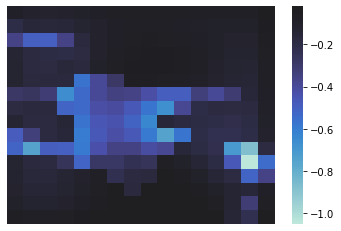

这是feature map 24 tensor(-0.5224, device='cuda:0', grad_fn=<MeanBackward0>)


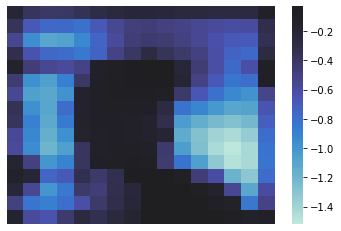

这是feature map 25 tensor(0.1807, device='cuda:0', grad_fn=<MeanBackward0>)


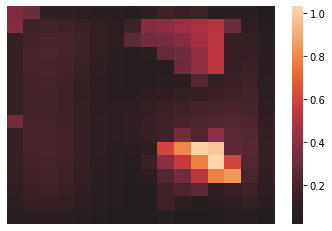

这是feature map 26 tensor(0.0642, device='cuda:0', grad_fn=<MeanBackward0>)


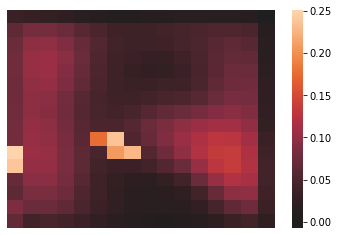

这是feature map 27 tensor(0.0490, device='cuda:0', grad_fn=<MeanBackward0>)


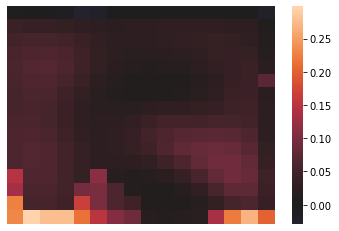

这是feature map 28 tensor(0.1614, device='cuda:0', grad_fn=<MeanBackward0>)


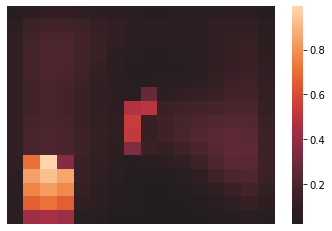

这是feature map 29 tensor(0.2224, device='cuda:0', grad_fn=<MeanBackward0>)


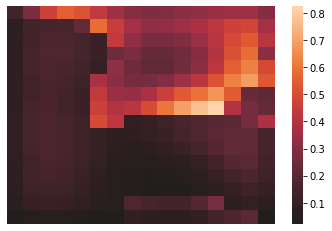

这是feature map 30 tensor(0.0974, device='cuda:0', grad_fn=<MeanBackward0>)


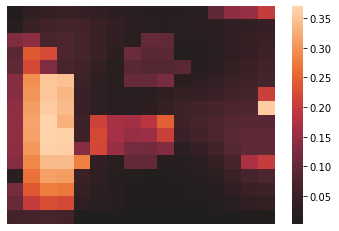

这是feature map 31 tensor(-0.3346, device='cuda:0', grad_fn=<MeanBackward0>)


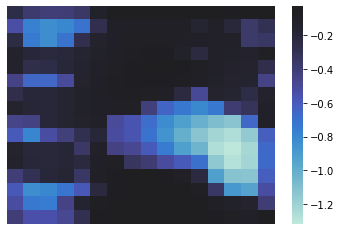

这是feature map 32 tensor(-0.0090, device='cuda:0', grad_fn=<MeanBackward0>)


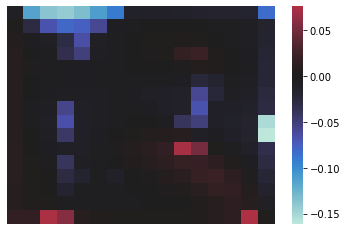

这是feature map 33 tensor(0.3772, device='cuda:0', grad_fn=<MeanBackward0>)


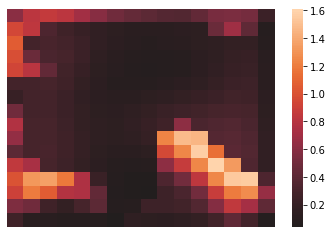

这是feature map 34 tensor(-0.1484, device='cuda:0', grad_fn=<MeanBackward0>)


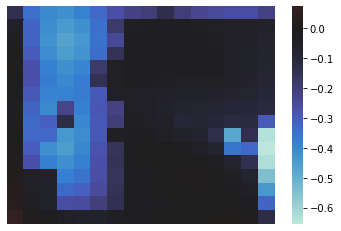

这是feature map 35 tensor(-0.0646, device='cuda:0', grad_fn=<MeanBackward0>)


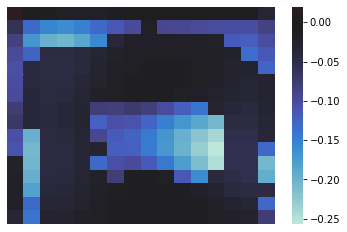

这是feature map 36 tensor(0.0730, device='cuda:0', grad_fn=<MeanBackward0>)


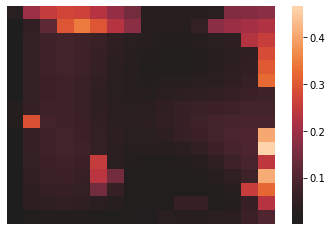

这是feature map 37 tensor(-0.0646, device='cuda:0', grad_fn=<MeanBackward0>)


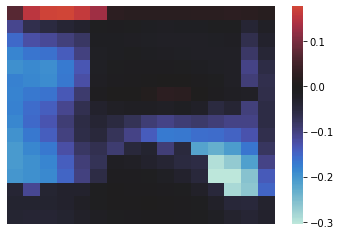

这是feature map 38 tensor(-0.0287, device='cuda:0', grad_fn=<MeanBackward0>)


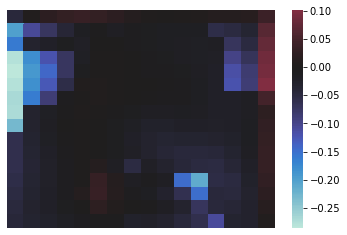

这是feature map 39 tensor(-0.6235, device='cuda:0', grad_fn=<MeanBackward0>)


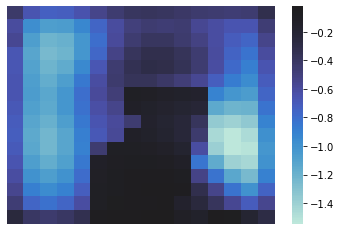

这是feature map 40 tensor(0.0432, device='cuda:0', grad_fn=<MeanBackward0>)


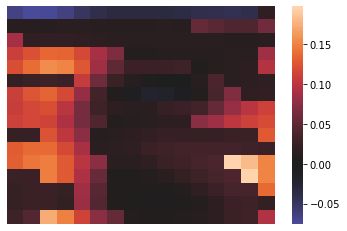

这是feature map 41 tensor(0.1985, device='cuda:0', grad_fn=<MeanBackward0>)


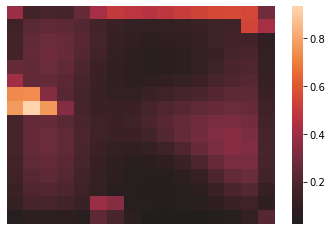

这是feature map 42 tensor(0.1163, device='cuda:0', grad_fn=<MeanBackward0>)


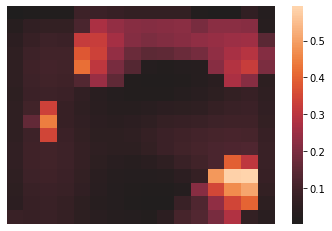

这是feature map 43 tensor(0.1698, device='cuda:0', grad_fn=<MeanBackward0>)


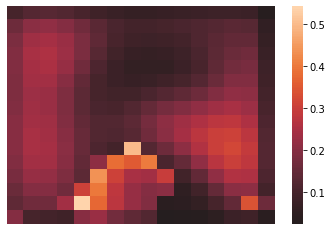

这是feature map 44 tensor(0.0156, device='cuda:0', grad_fn=<MeanBackward0>)


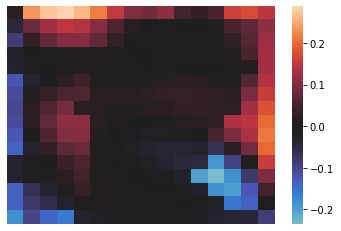

这是feature map 45 tensor(0.0213, device='cuda:0', grad_fn=<MeanBackward0>)


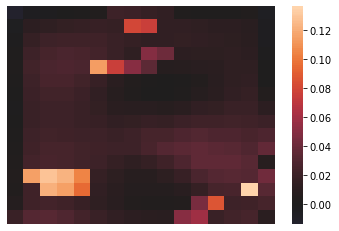

这是feature map 46 tensor(-0.0322, device='cuda:0', grad_fn=<MeanBackward0>)


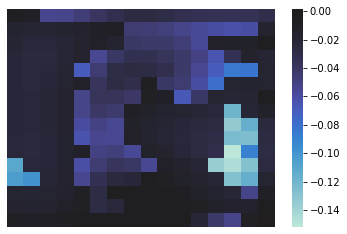

这是feature map 47 tensor(-0.5540, device='cuda:0', grad_fn=<MeanBackward0>)


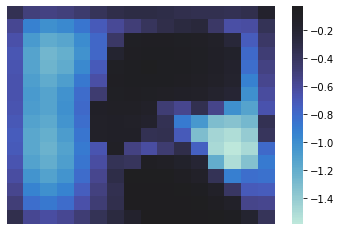

这是feature map 48 tensor(-0.1334, device='cuda:0', grad_fn=<MeanBackward0>)


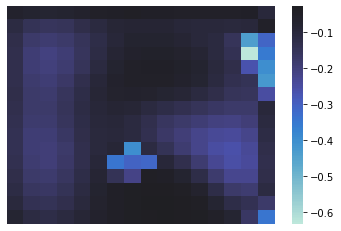

这是feature map 49 tensor(-0.0093, device='cuda:0', grad_fn=<MeanBackward0>)


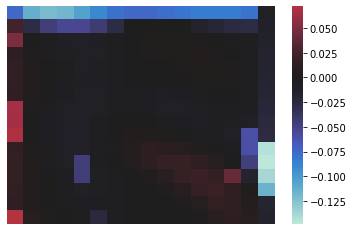

这是feature map 50 tensor(-0.3299, device='cuda:0', grad_fn=<MeanBackward0>)


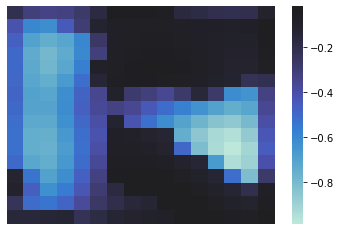

这是feature map 51 tensor(0.1175, device='cuda:0', grad_fn=<MeanBackward0>)


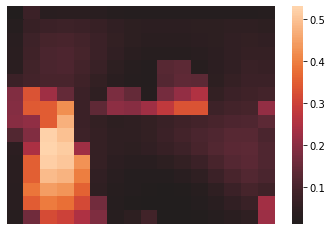

这是feature map 52 tensor(0.0909, device='cuda:0', grad_fn=<MeanBackward0>)


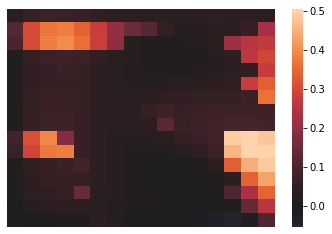

这是feature map 53 tensor(0.2250, device='cuda:0', grad_fn=<MeanBackward0>)


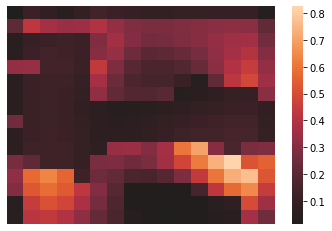

这是feature map 54 tensor(0.1080, device='cuda:0', grad_fn=<MeanBackward0>)


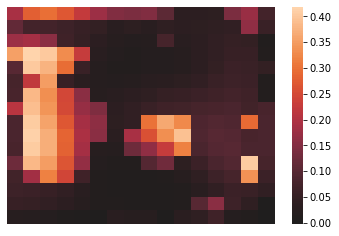

这是feature map 55 tensor(0.1890, device='cuda:0', grad_fn=<MeanBackward0>)


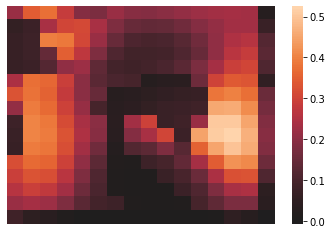

这是feature map 56 tensor(0.0276, device='cuda:0', grad_fn=<MeanBackward0>)


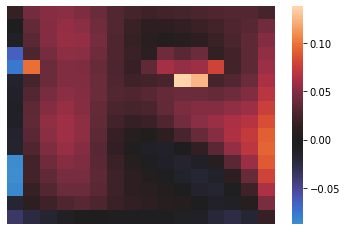

这是feature map 57 tensor(0.0238, device='cuda:0', grad_fn=<MeanBackward0>)


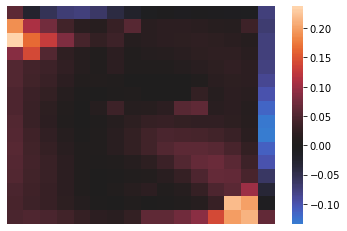

这是feature map 58 tensor(0.3898, device='cuda:0', grad_fn=<MeanBackward0>)


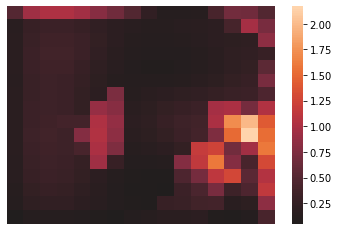

这是feature map 59 tensor(-0.0381, device='cuda:0', grad_fn=<MeanBackward0>)


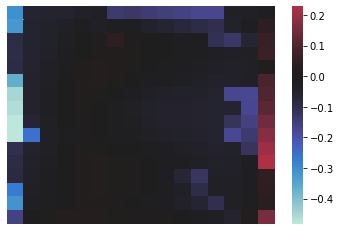

这是feature map 60 tensor(-0.1748, device='cuda:0', grad_fn=<MeanBackward0>)


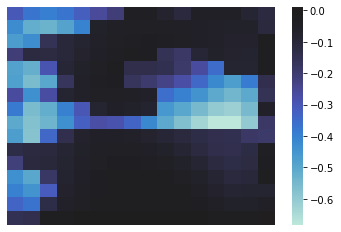

这是feature map 61 tensor(-0.5087, device='cuda:0', grad_fn=<MeanBackward0>)


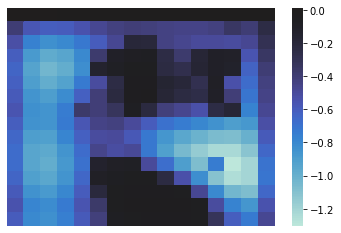

这是feature map 62 tensor(0.0763, device='cuda:0', grad_fn=<MeanBackward0>)


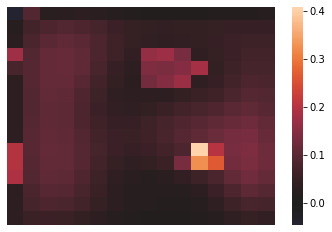

这是feature map 63 tensor(0.0750, device='cuda:0', grad_fn=<MeanBackward0>)


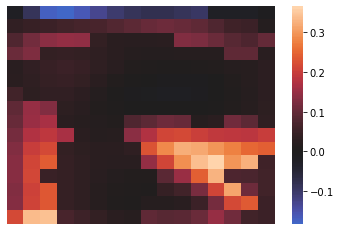

这是feature map 64 tensor(-0.0881, device='cuda:0', grad_fn=<MeanBackward0>)


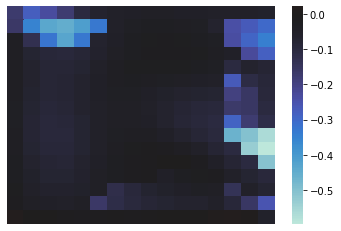

这是feature map 65 tensor(-0.2449, device='cuda:0', grad_fn=<MeanBackward0>)


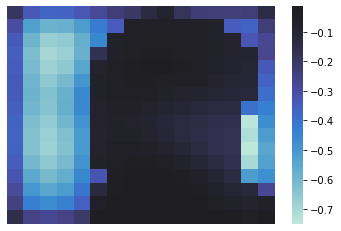

这是feature map 66 tensor(0.0093, device='cuda:0', grad_fn=<MeanBackward0>)


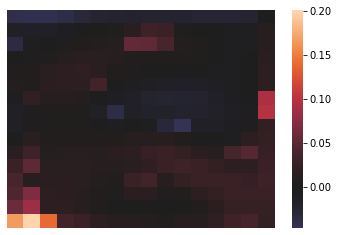

这是feature map 67 tensor(0.1344, device='cuda:0', grad_fn=<MeanBackward0>)


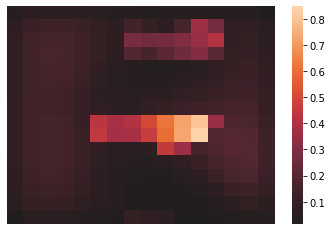

这是feature map 68 tensor(0.1385, device='cuda:0', grad_fn=<MeanBackward0>)


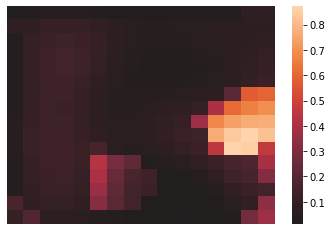

这是feature map 69 tensor(0.0141, device='cuda:0', grad_fn=<MeanBackward0>)


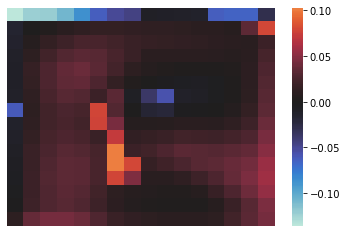

这是feature map 70 tensor(0.0278, device='cuda:0', grad_fn=<MeanBackward0>)


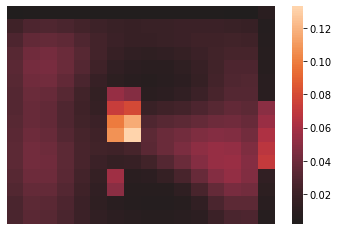

这是feature map 71 tensor(0.0314, device='cuda:0', grad_fn=<MeanBackward0>)


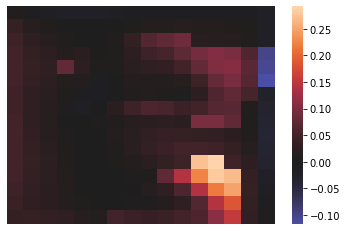

这是feature map 72 tensor(-0.0323, device='cuda:0', grad_fn=<MeanBackward0>)


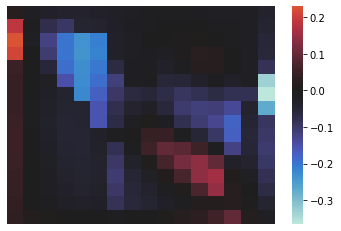

这是feature map 73 tensor(0.0312, device='cuda:0', grad_fn=<MeanBackward0>)


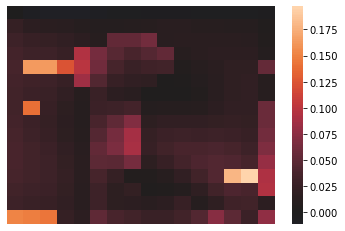

这是feature map 74 tensor(0.1330, device='cuda:0', grad_fn=<MeanBackward0>)


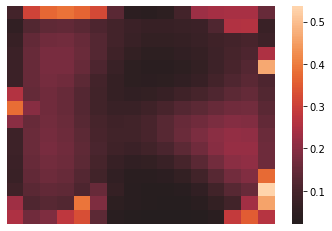

这是feature map 75 tensor(0.2450, device='cuda:0', grad_fn=<MeanBackward0>)


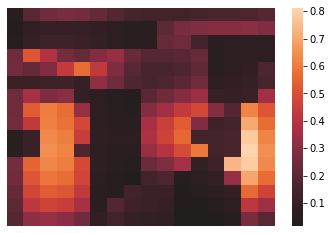

这是feature map 76 tensor(0.1577, device='cuda:0', grad_fn=<MeanBackward0>)


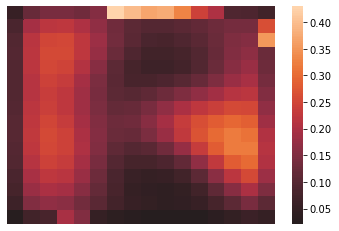

这是feature map 77 tensor(-0.0682, device='cuda:0', grad_fn=<MeanBackward0>)


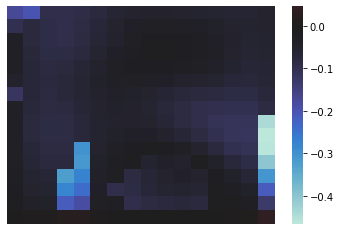

这是feature map 78 tensor(-0.2286, device='cuda:0', grad_fn=<MeanBackward0>)


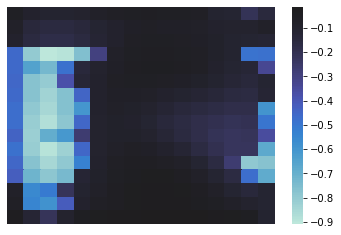

这是feature map 79 tensor(0.1718, device='cuda:0', grad_fn=<MeanBackward0>)


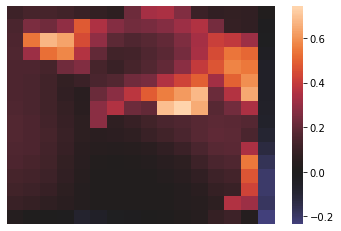

这是feature map 80 tensor(0.1058, device='cuda:0', grad_fn=<MeanBackward0>)


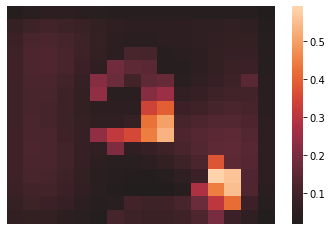

这是feature map 81 tensor(-0.0512, device='cuda:0', grad_fn=<MeanBackward0>)


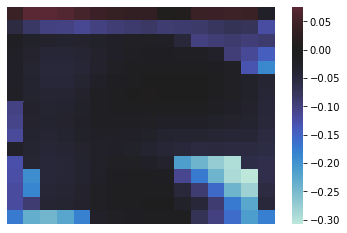

这是feature map 82 tensor(0.0745, device='cuda:0', grad_fn=<MeanBackward0>)


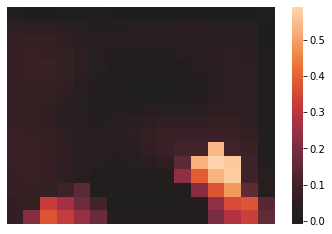

这是feature map 83 tensor(0.0828, device='cuda:0', grad_fn=<MeanBackward0>)


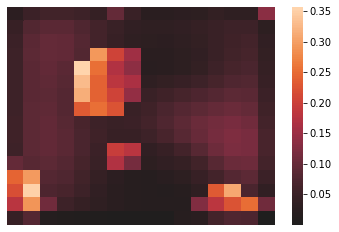

这是feature map 84 tensor(-0.0929, device='cuda:0', grad_fn=<MeanBackward0>)


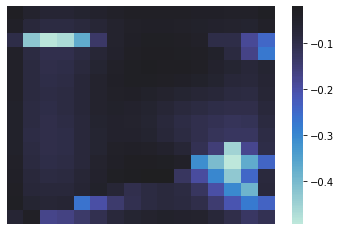

这是feature map 85 tensor(0.0583, device='cuda:0', grad_fn=<MeanBackward0>)


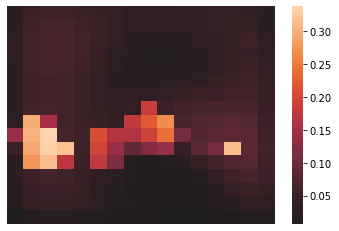

这是feature map 86 tensor(-0.0170, device='cuda:0', grad_fn=<MeanBackward0>)


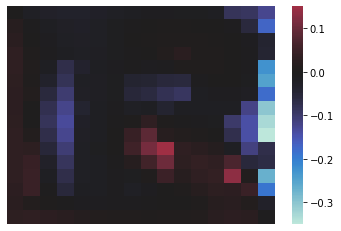

这是feature map 87 tensor(0.2607, device='cuda:0', grad_fn=<MeanBackward0>)


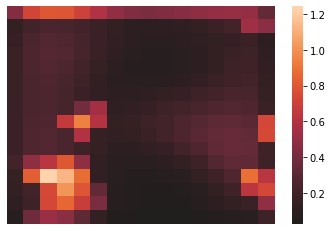

这是feature map 88 tensor(-0.2063, device='cuda:0', grad_fn=<MeanBackward0>)


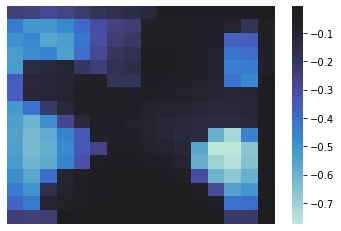

这是feature map 89 tensor(0.0505, device='cuda:0', grad_fn=<MeanBackward0>)


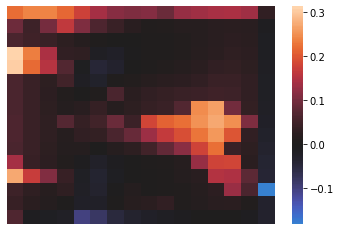

这是feature map 90 tensor(0.1219, device='cuda:0', grad_fn=<MeanBackward0>)


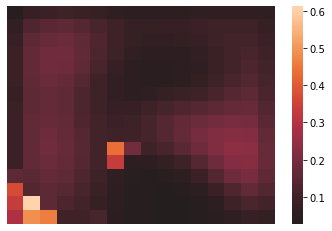

这是feature map 91 tensor(-0.2027, device='cuda:0', grad_fn=<MeanBackward0>)


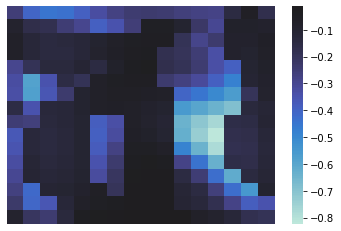

这是feature map 92 tensor(0.0646, device='cuda:0', grad_fn=<MeanBackward0>)


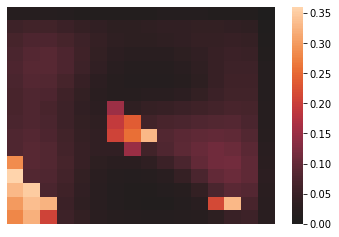

这是feature map 93 tensor(-0.0350, device='cuda:0', grad_fn=<MeanBackward0>)


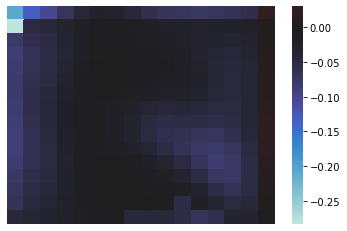

这是feature map 94 tensor(-0.0548, device='cuda:0', grad_fn=<MeanBackward0>)


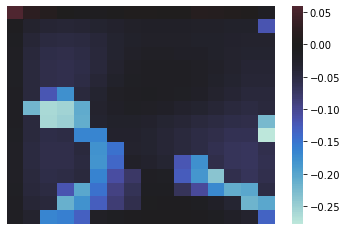

这是feature map 95 tensor(-0.3186, device='cuda:0', grad_fn=<MeanBackward0>)


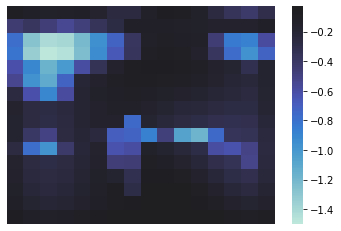

这是feature map 96 tensor(-0.1987, device='cuda:0', grad_fn=<MeanBackward0>)


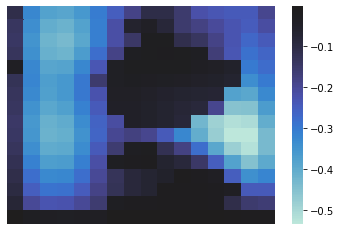

这是feature map 97 tensor(-0.0287, device='cuda:0', grad_fn=<MeanBackward0>)


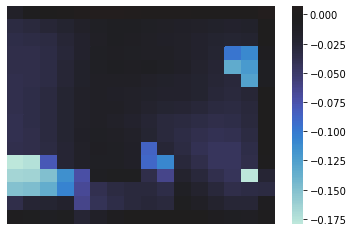

这是feature map 98 tensor(-0.0413, device='cuda:0', grad_fn=<MeanBackward0>)


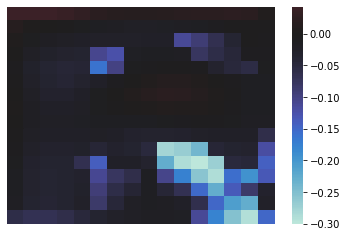

这是feature map 99 tensor(0.1818, device='cuda:0', grad_fn=<MeanBackward0>)


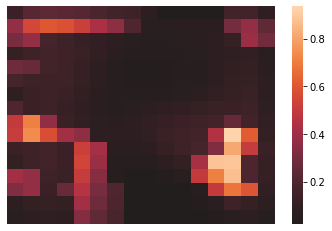

这是feature map 100 tensor(0.0644, device='cuda:0', grad_fn=<MeanBackward0>)


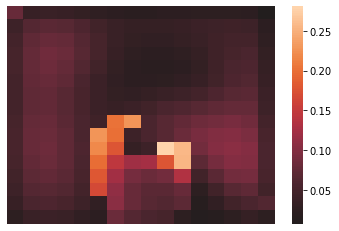

这是feature map 101 tensor(-0.0821, device='cuda:0', grad_fn=<MeanBackward0>)


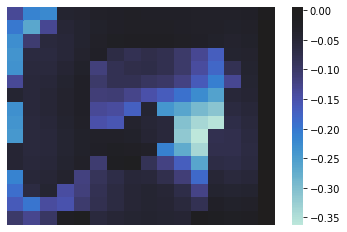

这是feature map 102 tensor(0.0190, device='cuda:0', grad_fn=<MeanBackward0>)


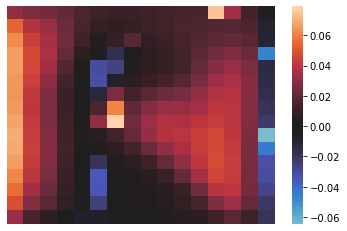

这是feature map 103 tensor(-0.0272, device='cuda:0', grad_fn=<MeanBackward0>)


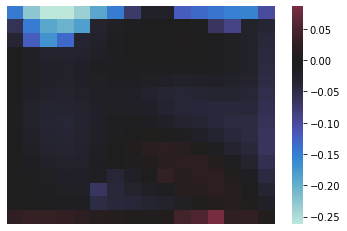

这是feature map 104 tensor(0.0629, device='cuda:0', grad_fn=<MeanBackward0>)


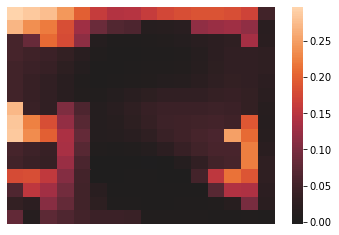

这是feature map 105 tensor(0.0161, device='cuda:0', grad_fn=<MeanBackward0>)


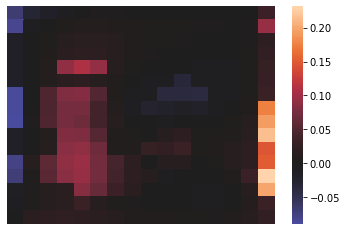

这是feature map 106 tensor(0.0513, device='cuda:0', grad_fn=<MeanBackward0>)


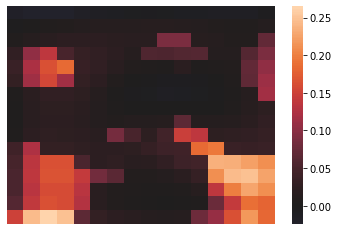

这是feature map 107 tensor(-0.0909, device='cuda:0', grad_fn=<MeanBackward0>)


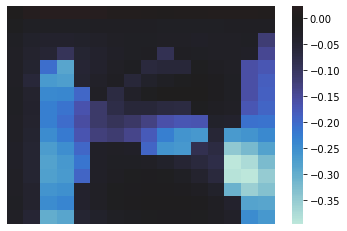

这是feature map 108 tensor(-0.1820, device='cuda:0', grad_fn=<MeanBackward0>)


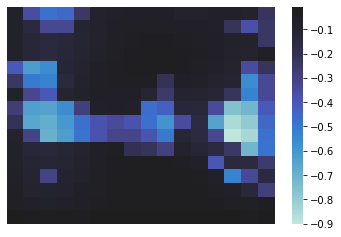

这是feature map 109 tensor(0.1114, device='cuda:0', grad_fn=<MeanBackward0>)


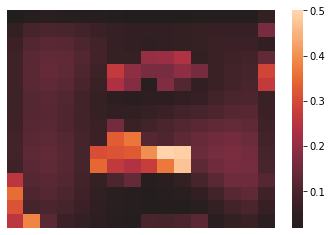

这是feature map 110 tensor(-0.0034, device='cuda:0', grad_fn=<MeanBackward0>)


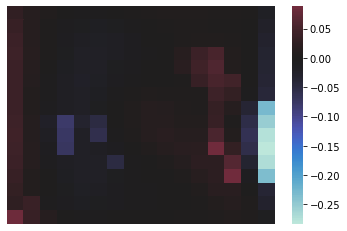

这是feature map 111 tensor(0.2374, device='cuda:0', grad_fn=<MeanBackward0>)


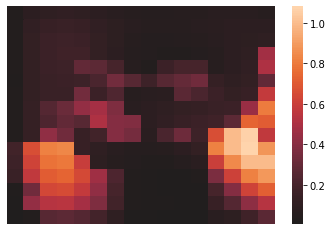

这是feature map 112 tensor(0.0693, device='cuda:0', grad_fn=<MeanBackward0>)


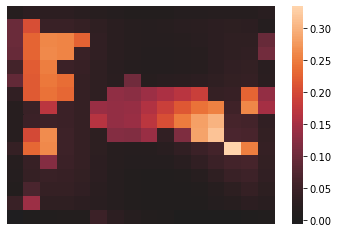

这是feature map 113 tensor(-0.4880, device='cuda:0', grad_fn=<MeanBackward0>)


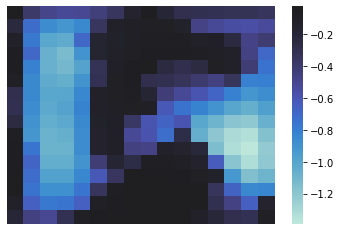

这是feature map 114 tensor(0.0246, device='cuda:0', grad_fn=<MeanBackward0>)


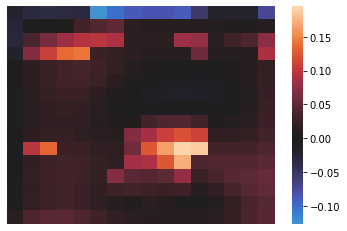

这是feature map 115 tensor(-0.0953, device='cuda:0', grad_fn=<MeanBackward0>)


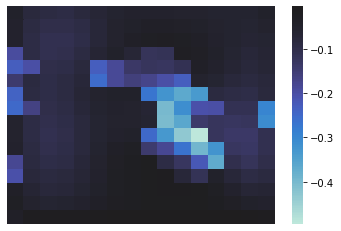

这是feature map 116 tensor(-0.0718, device='cuda:0', grad_fn=<MeanBackward0>)


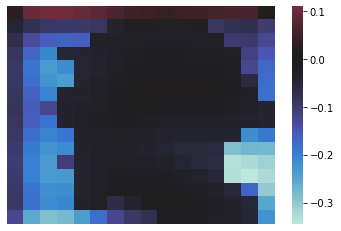

这是feature map 117 tensor(-0.4190, device='cuda:0', grad_fn=<MeanBackward0>)


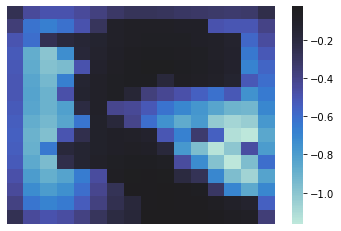

这是feature map 118 tensor(-0.0339, device='cuda:0', grad_fn=<MeanBackward0>)


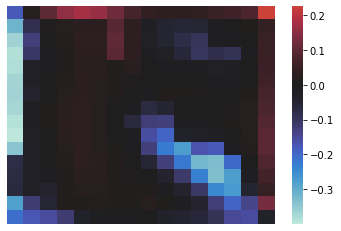

这是feature map 119 tensor(0.0718, device='cuda:0', grad_fn=<MeanBackward0>)


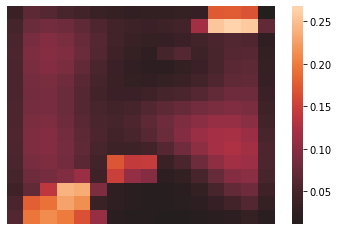

这是feature map 120 tensor(0.1595, device='cuda:0', grad_fn=<MeanBackward0>)


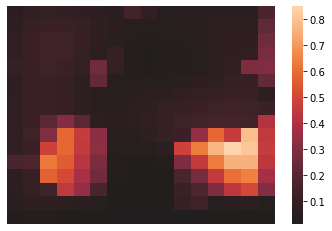

这是feature map 121 tensor(-0.1155, device='cuda:0', grad_fn=<MeanBackward0>)


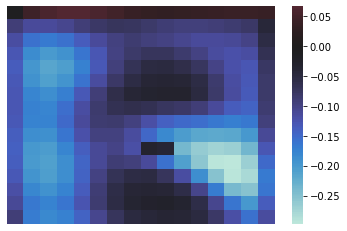

这是feature map 122 tensor(0.0294, device='cuda:0', grad_fn=<MeanBackward0>)


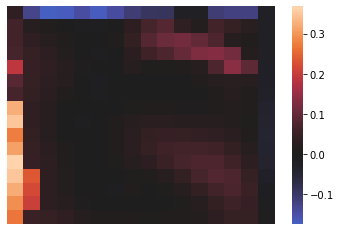

这是feature map 123 tensor(-0.0010, device='cuda:0', grad_fn=<MeanBackward0>)


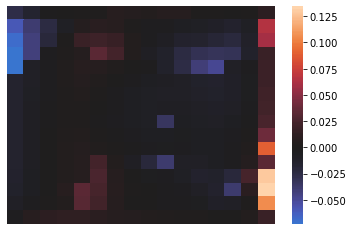

这是feature map 124 tensor(-0.2549, device='cuda:0', grad_fn=<MeanBackward0>)


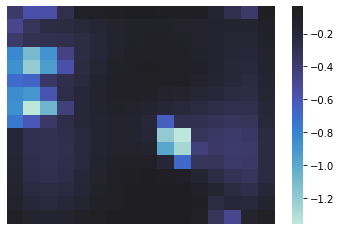

这是feature map 125 tensor(0.1292, device='cuda:0', grad_fn=<MeanBackward0>)


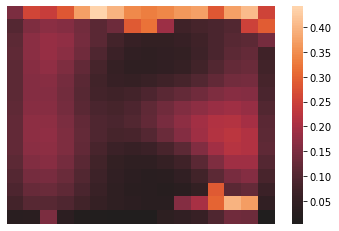

这是feature map 126 tensor(-0.9905, device='cuda:0', grad_fn=<MeanBackward0>)


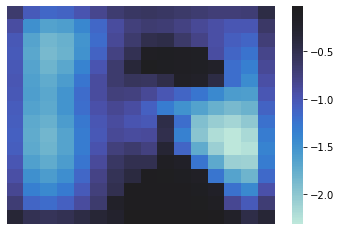

这是feature map 127 tensor(-0.2536, device='cuda:0', grad_fn=<MeanBackward0>)


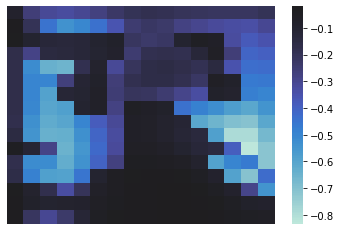

这是feature map 128 tensor(-0.2431, device='cuda:0', grad_fn=<MeanBackward0>)


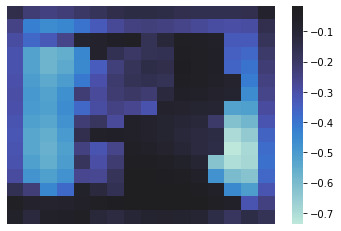

这是feature map 129 tensor(0.2168, device='cuda:0', grad_fn=<MeanBackward0>)


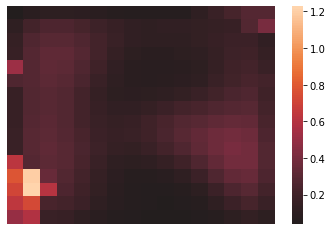

这是feature map 130 tensor(0.0533, device='cuda:0', grad_fn=<MeanBackward0>)


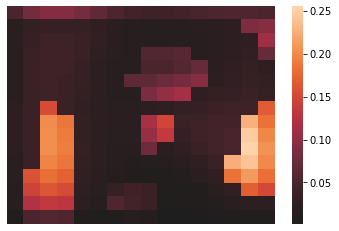

这是feature map 131 tensor(-1.2924, device='cuda:0', grad_fn=<MeanBackward0>)


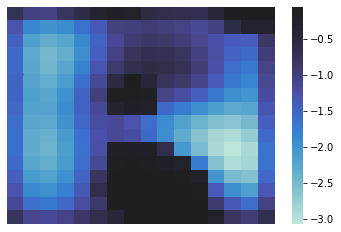

这是feature map 132 tensor(0.2159, device='cuda:0', grad_fn=<MeanBackward0>)


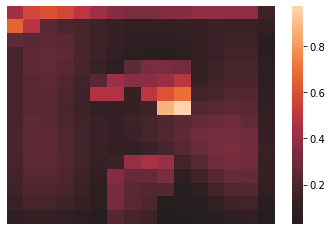

这是feature map 133 tensor(-0.1710, device='cuda:0', grad_fn=<MeanBackward0>)


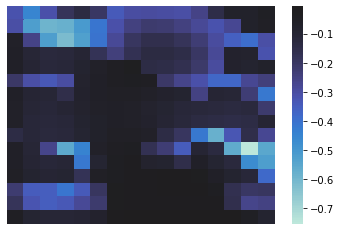

这是feature map 134 tensor(0.1386, device='cuda:0', grad_fn=<MeanBackward0>)


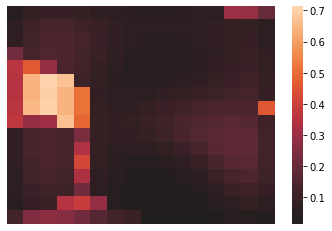

这是feature map 135 tensor(0.0385, device='cuda:0', grad_fn=<MeanBackward0>)


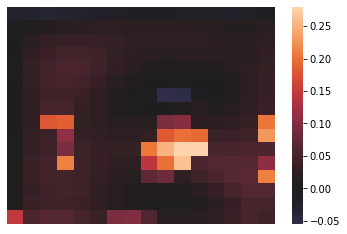

这是feature map 136 tensor(0.1678, device='cuda:0', grad_fn=<MeanBackward0>)


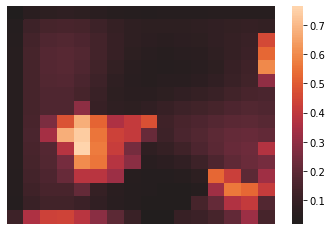

这是feature map 137 tensor(0.1464, device='cuda:0', grad_fn=<MeanBackward0>)


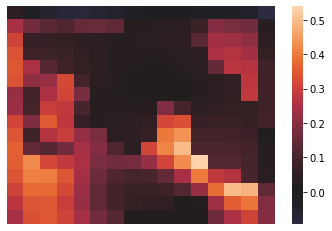

这是feature map 138 tensor(0.2139, device='cuda:0', grad_fn=<MeanBackward0>)


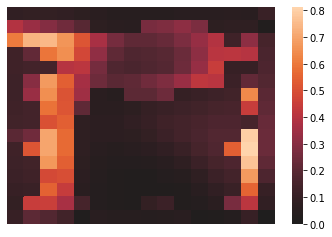

这是feature map 139 tensor(0.0418, device='cuda:0', grad_fn=<MeanBackward0>)


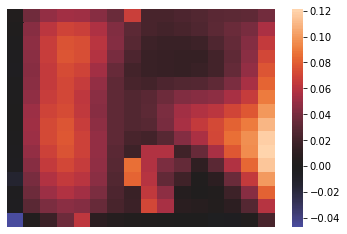

这是feature map 140 tensor(-0.5317, device='cuda:0', grad_fn=<MeanBackward0>)


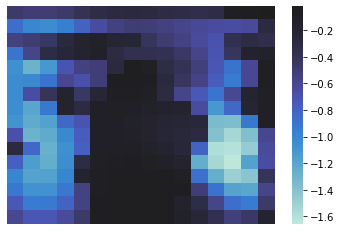

这是feature map 141 tensor(-0.0827, device='cuda:0', grad_fn=<MeanBackward0>)


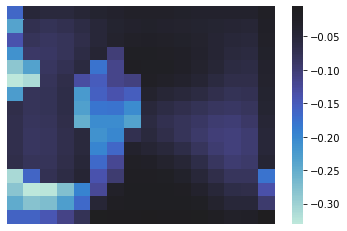

这是feature map 142 tensor(-0.2065, device='cuda:0', grad_fn=<MeanBackward0>)


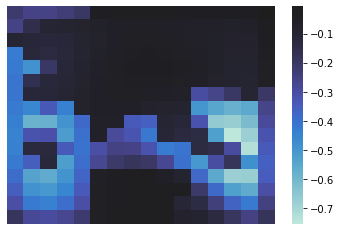

这是feature map 143 tensor(-0.1710, device='cuda:0', grad_fn=<MeanBackward0>)


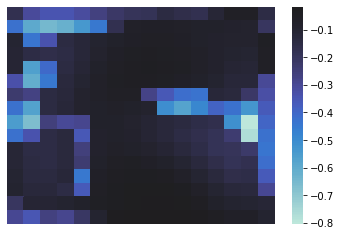

这是feature map 144 tensor(-0.4111, device='cuda:0', grad_fn=<MeanBackward0>)


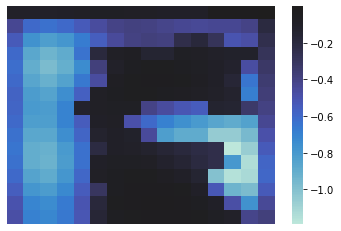

这是feature map 145 tensor(-0.5658, device='cuda:0', grad_fn=<MeanBackward0>)


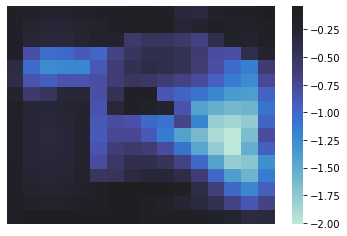

这是feature map 146 tensor(0.0661, device='cuda:0', grad_fn=<MeanBackward0>)


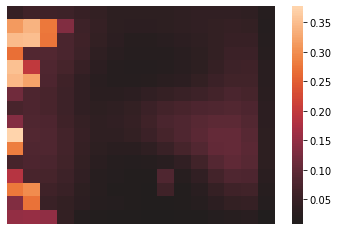

这是feature map 147 tensor(-0.1324, device='cuda:0', grad_fn=<MeanBackward0>)


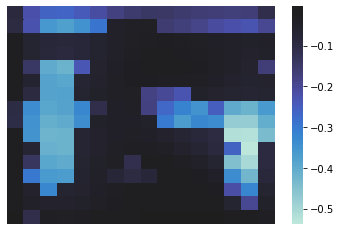

这是feature map 148 tensor(-0.3535, device='cuda:0', grad_fn=<MeanBackward0>)


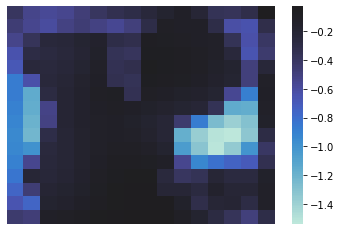

这是feature map 149 tensor(-0.1359, device='cuda:0', grad_fn=<MeanBackward0>)


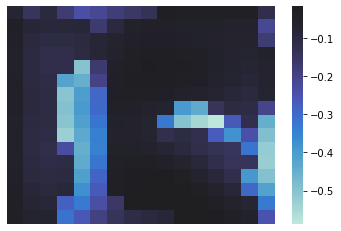

这是feature map 150 tensor(0.1668, device='cuda:0', grad_fn=<MeanBackward0>)


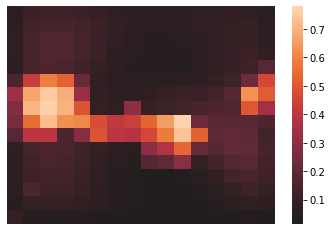

这是feature map 151 tensor(0.0393, device='cuda:0', grad_fn=<MeanBackward0>)


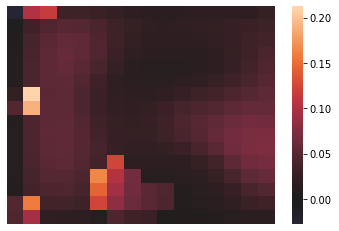

这是feature map 152 tensor(0.2136, device='cuda:0', grad_fn=<MeanBackward0>)


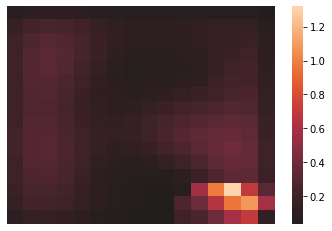

这是feature map 153 tensor(0.0189, device='cuda:0', grad_fn=<MeanBackward0>)


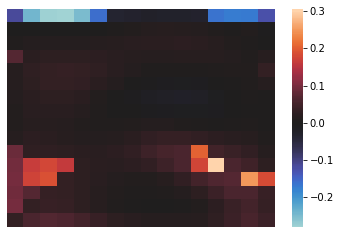

这是feature map 154 tensor(0.0488, device='cuda:0', grad_fn=<MeanBackward0>)


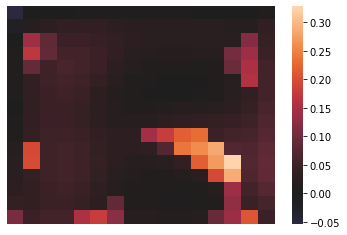

这是feature map 155 tensor(-0.1150, device='cuda:0', grad_fn=<MeanBackward0>)


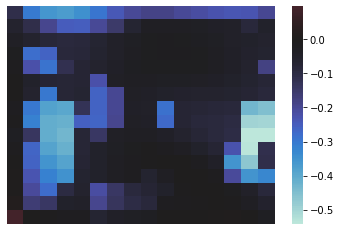

这是feature map 156 tensor(0.2761, device='cuda:0', grad_fn=<MeanBackward0>)


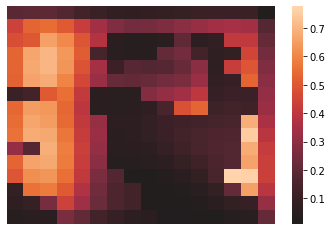

这是feature map 157 tensor(0.0961, device='cuda:0', grad_fn=<MeanBackward0>)


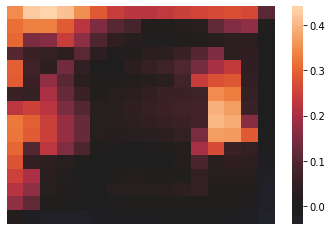

这是feature map 158 tensor(0.0780, device='cuda:0', grad_fn=<MeanBackward0>)


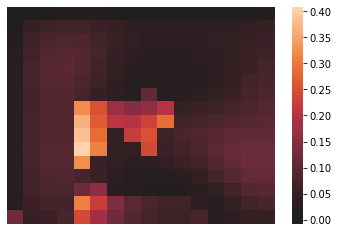

这是feature map 159 tensor(0.0281, device='cuda:0', grad_fn=<MeanBackward0>)


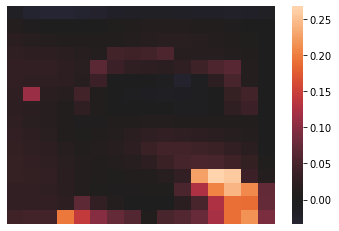

这是feature map 160 tensor(-0.0658, device='cuda:0', grad_fn=<MeanBackward0>)


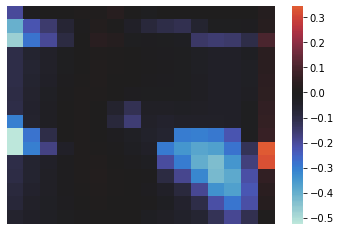

这是feature map 161 tensor(0.0157, device='cuda:0', grad_fn=<MeanBackward0>)


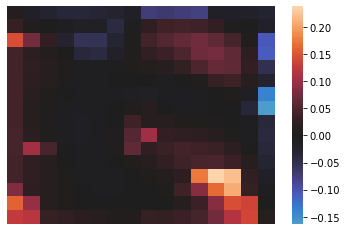

这是feature map 162 tensor(-0.0123, device='cuda:0', grad_fn=<MeanBackward0>)


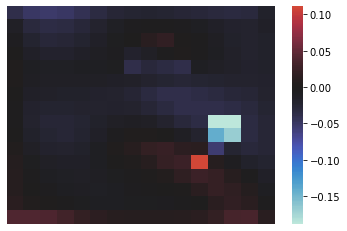

这是feature map 163 tensor(0.1048, device='cuda:0', grad_fn=<MeanBackward0>)


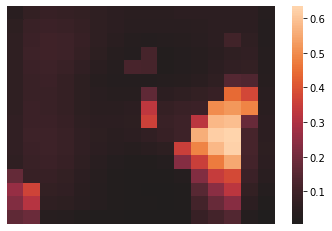

这是feature map 164 tensor(-0.0706, device='cuda:0', grad_fn=<MeanBackward0>)


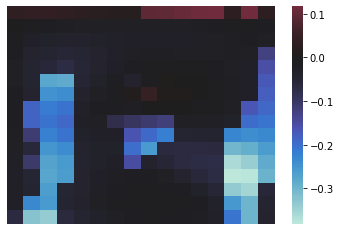

这是feature map 165 tensor(-0.1899, device='cuda:0', grad_fn=<MeanBackward0>)


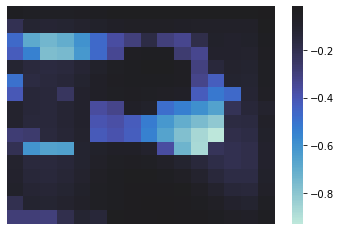

这是feature map 166 tensor(-0.4092, device='cuda:0', grad_fn=<MeanBackward0>)


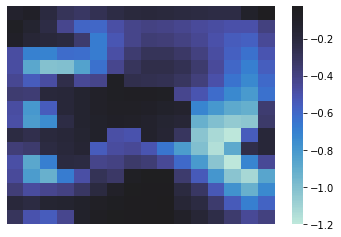

这是feature map 167 tensor(-0.2604, device='cuda:0', grad_fn=<MeanBackward0>)


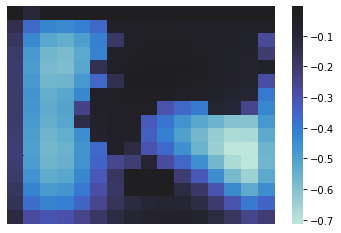

这是feature map 168 tensor(-0.0396, device='cuda:0', grad_fn=<MeanBackward0>)


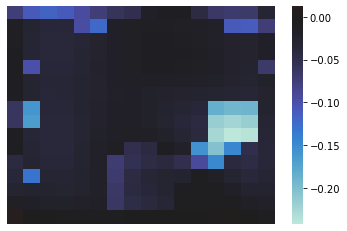

这是feature map 169 tensor(0.0332, device='cuda:0', grad_fn=<MeanBackward0>)


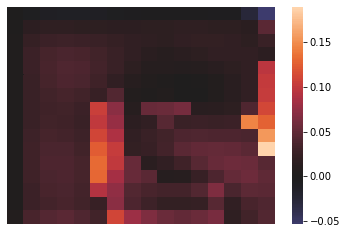

这是feature map 170 tensor(-0.2466, device='cuda:0', grad_fn=<MeanBackward0>)


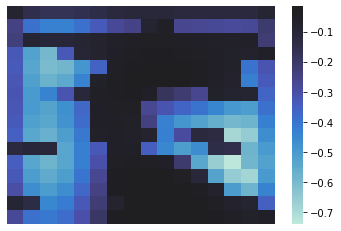

这是feature map 171 tensor(0.1898, device='cuda:0', grad_fn=<MeanBackward0>)


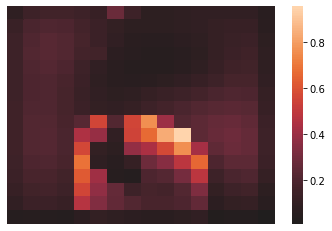

这是feature map 172 tensor(0.0071, device='cuda:0', grad_fn=<MeanBackward0>)


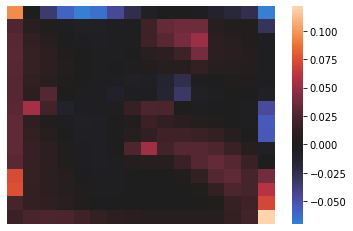

这是feature map 173 tensor(0.0269, device='cuda:0', grad_fn=<MeanBackward0>)


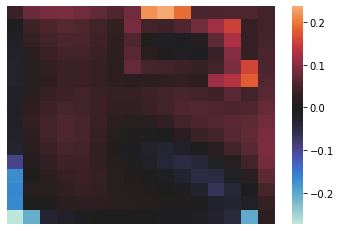

这是feature map 174 tensor(-0.1141, device='cuda:0', grad_fn=<MeanBackward0>)


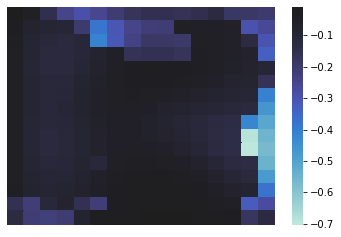

这是feature map 175 tensor(0.1440, device='cuda:0', grad_fn=<MeanBackward0>)


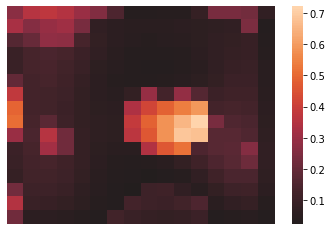

这是feature map 176 tensor(-0.0930, device='cuda:0', grad_fn=<MeanBackward0>)


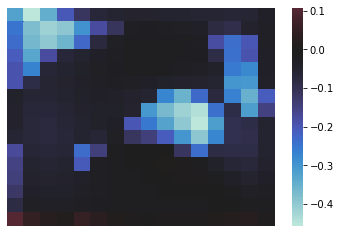

这是feature map 177 tensor(0.0272, device='cuda:0', grad_fn=<MeanBackward0>)


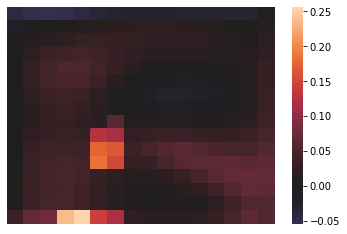

这是feature map 178 tensor(-0.1175, device='cuda:0', grad_fn=<MeanBackward0>)


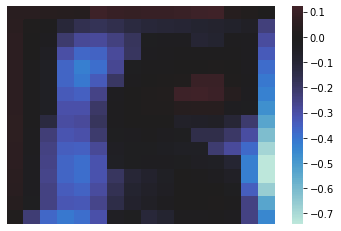

这是feature map 179 tensor(0.0276, device='cuda:0', grad_fn=<MeanBackward0>)


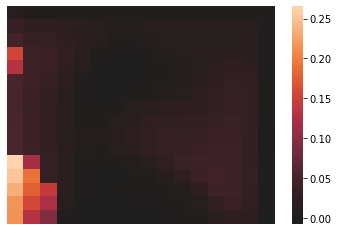

这是feature map 180 tensor(0.2329, device='cuda:0', grad_fn=<MeanBackward0>)


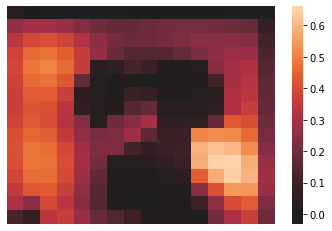

这是feature map 181 tensor(0.0007, device='cuda:0', grad_fn=<MeanBackward0>)


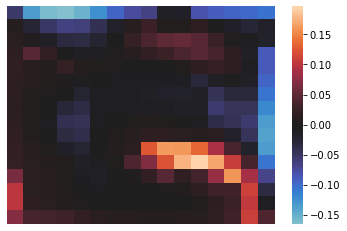

这是feature map 182 tensor(-0.3100, device='cuda:0', grad_fn=<MeanBackward0>)


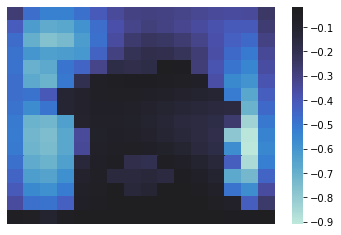

这是feature map 183 tensor(0.1655, device='cuda:0', grad_fn=<MeanBackward0>)


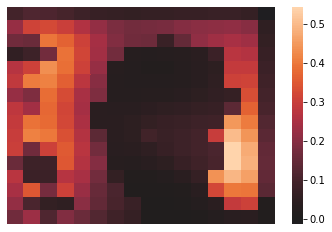

这是feature map 184 tensor(-0.6433, device='cuda:0', grad_fn=<MeanBackward0>)


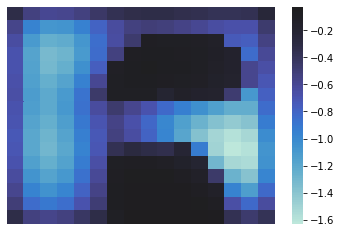

这是feature map 185 tensor(0.1326, device='cuda:0', grad_fn=<MeanBackward0>)


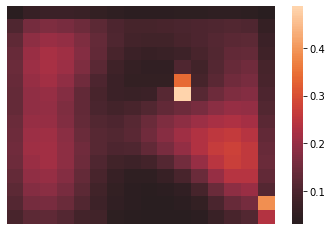

这是feature map 186 tensor(0.0060, device='cuda:0', grad_fn=<MeanBackward0>)


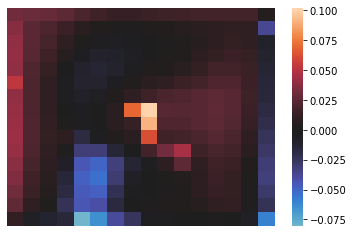

这是feature map 187 tensor(0.1066, device='cuda:0', grad_fn=<MeanBackward0>)


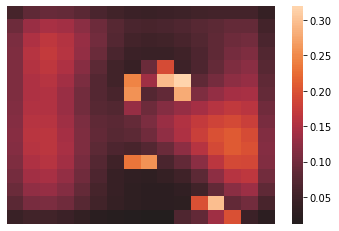

这是feature map 188 tensor(0.0186, device='cuda:0', grad_fn=<MeanBackward0>)


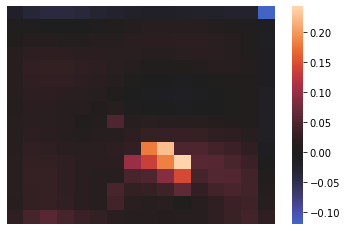

这是feature map 189 tensor(0.0412, device='cuda:0', grad_fn=<MeanBackward0>)


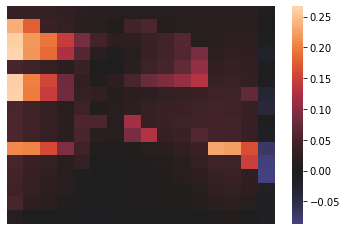

这是feature map 190 tensor(0.3633, device='cuda:0', grad_fn=<MeanBackward0>)


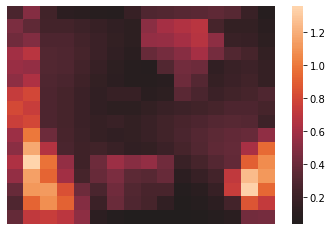

这是feature map 191 tensor(0.0541, device='cuda:0', grad_fn=<MeanBackward0>)


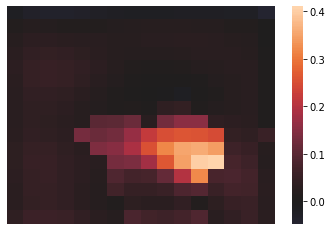

这是feature map 192 tensor(-0.2482, device='cuda:0', grad_fn=<MeanBackward0>)


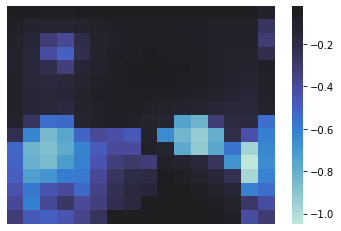

这是feature map 193 tensor(0.0063, device='cuda:0', grad_fn=<MeanBackward0>)


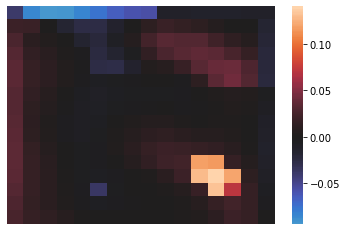

这是feature map 194 tensor(0.1904, device='cuda:0', grad_fn=<MeanBackward0>)


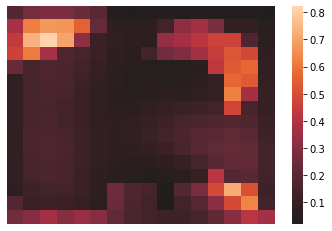

这是feature map 195 tensor(-0.1217, device='cuda:0', grad_fn=<MeanBackward0>)


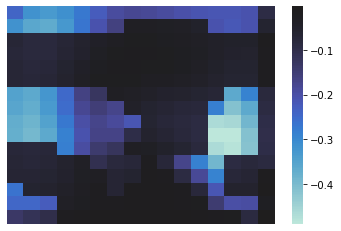

这是feature map 196 tensor(0.1675, device='cuda:0', grad_fn=<MeanBackward0>)


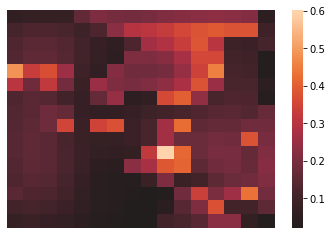

这是feature map 197 tensor(0.1055, device='cuda:0', grad_fn=<MeanBackward0>)


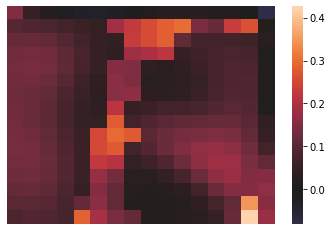

这是feature map 198 tensor(0.2182, device='cuda:0', grad_fn=<MeanBackward0>)


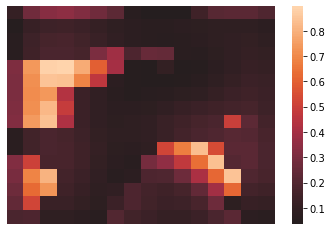

这是feature map 199 tensor(-0.2180, device='cuda:0', grad_fn=<MeanBackward0>)


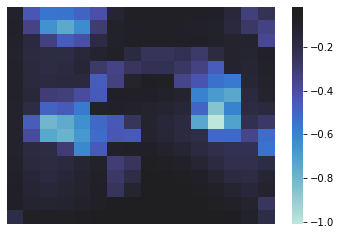

这是feature map 200 tensor(-0.0168, device='cuda:0', grad_fn=<MeanBackward0>)


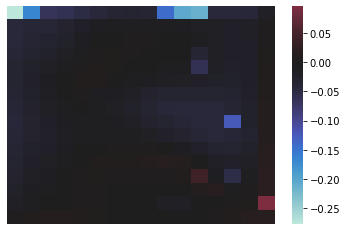

这是feature map 201 tensor(0.0533, device='cuda:0', grad_fn=<MeanBackward0>)


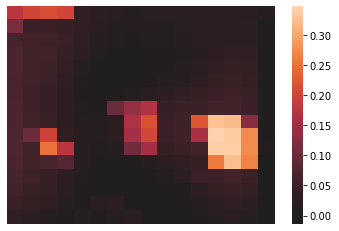

这是feature map 202 tensor(0.2840, device='cuda:0', grad_fn=<MeanBackward0>)


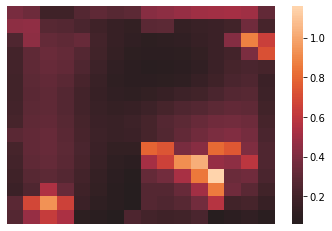

这是feature map 203 tensor(-0.0075, device='cuda:0', grad_fn=<MeanBackward0>)


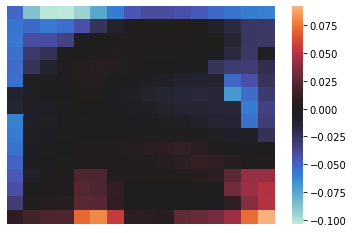

这是feature map 204 tensor(-0.2544, device='cuda:0', grad_fn=<MeanBackward0>)


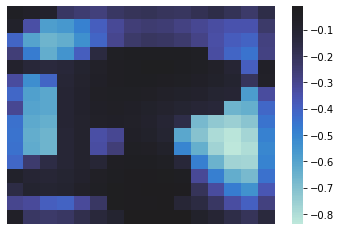

这是feature map 205 tensor(0.0946, device='cuda:0', grad_fn=<MeanBackward0>)


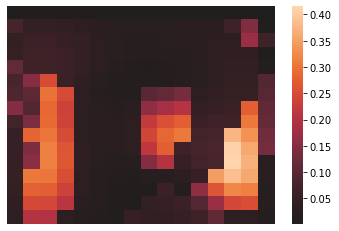

这是feature map 206 tensor(0.1043, device='cuda:0', grad_fn=<MeanBackward0>)


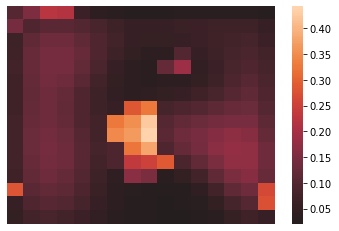

这是feature map 207 tensor(0.0967, device='cuda:0', grad_fn=<MeanBackward0>)


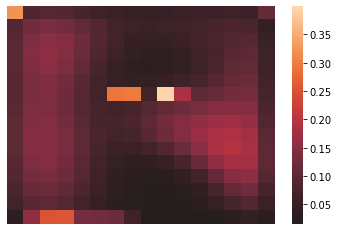

这是feature map 208 tensor(0.2353, device='cuda:0', grad_fn=<MeanBackward0>)


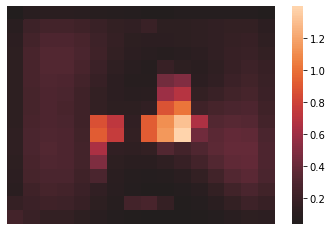

这是feature map 209 tensor(-0.1164, device='cuda:0', grad_fn=<MeanBackward0>)


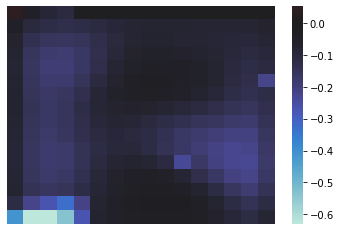

这是feature map 210 tensor(-0.3188, device='cuda:0', grad_fn=<MeanBackward0>)


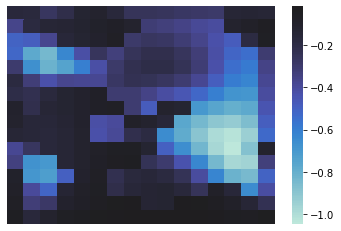

这是feature map 211 tensor(0.0184, device='cuda:0', grad_fn=<MeanBackward0>)


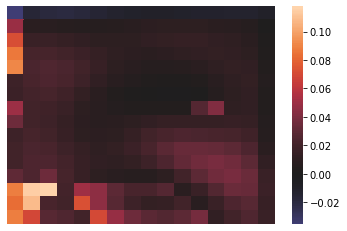

这是feature map 212 tensor(0.0182, device='cuda:0', grad_fn=<MeanBackward0>)


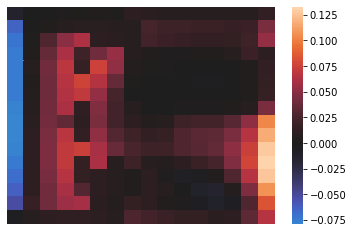

这是feature map 213 tensor(-0.1759, device='cuda:0', grad_fn=<MeanBackward0>)


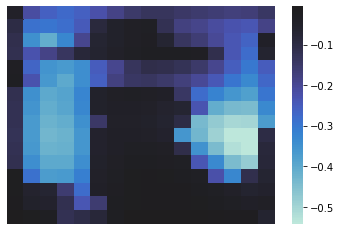

这是feature map 214 tensor(-0.3877, device='cuda:0', grad_fn=<MeanBackward0>)


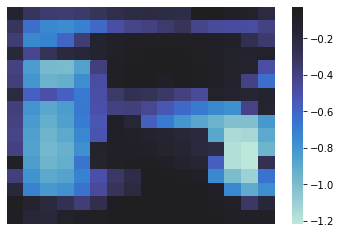

这是feature map 215 tensor(0.1100, device='cuda:0', grad_fn=<MeanBackward0>)


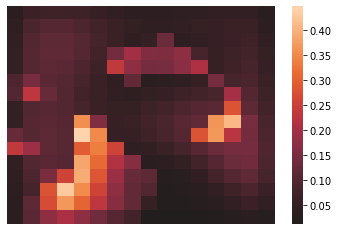

这是feature map 216 tensor(-0.0508, device='cuda:0', grad_fn=<MeanBackward0>)


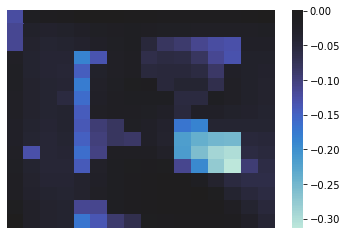

这是feature map 217 tensor(0.1711, device='cuda:0', grad_fn=<MeanBackward0>)


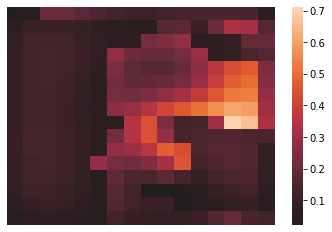

这是feature map 218 tensor(-0.0228, device='cuda:0', grad_fn=<MeanBackward0>)


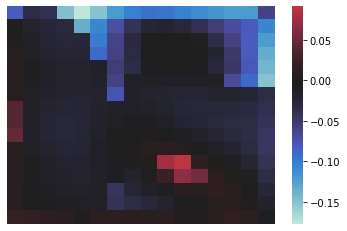

这是feature map 219 tensor(0.2160, device='cuda:0', grad_fn=<MeanBackward0>)


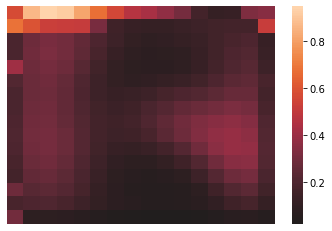

这是feature map 220 tensor(-0.2919, device='cuda:0', grad_fn=<MeanBackward0>)


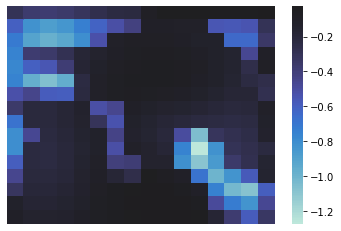

这是feature map 221 tensor(0.0928, device='cuda:0', grad_fn=<MeanBackward0>)


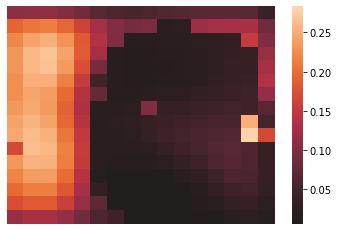

这是feature map 222 tensor(-0.0784, device='cuda:0', grad_fn=<MeanBackward0>)


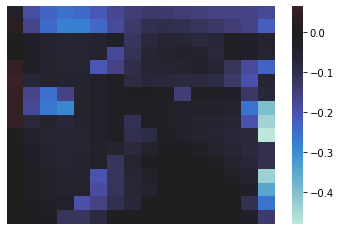

这是feature map 223 tensor(0.0263, device='cuda:0', grad_fn=<MeanBackward0>)


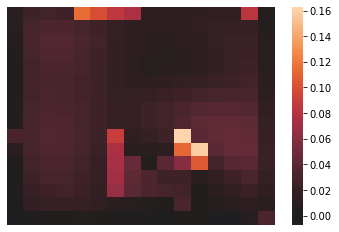

这是feature map 224 tensor(-0.0662, device='cuda:0', grad_fn=<MeanBackward0>)


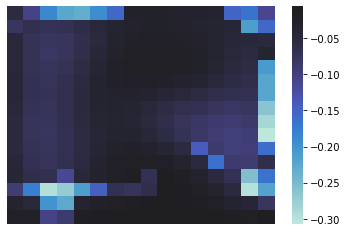

这是feature map 225 tensor(0.1608, device='cuda:0', grad_fn=<MeanBackward0>)


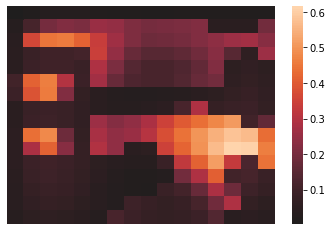

这是feature map 226 tensor(0.0160, device='cuda:0', grad_fn=<MeanBackward0>)


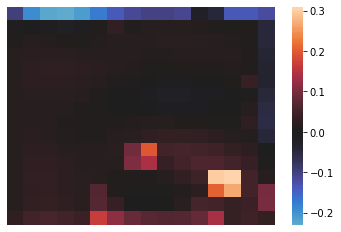

这是feature map 227 tensor(0.0021, device='cuda:0', grad_fn=<MeanBackward0>)


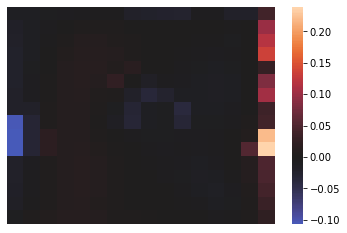

这是feature map 228 tensor(0.1763, device='cuda:0', grad_fn=<MeanBackward0>)


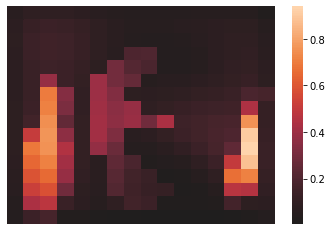

这是feature map 229 tensor(0.0703, device='cuda:0', grad_fn=<MeanBackward0>)


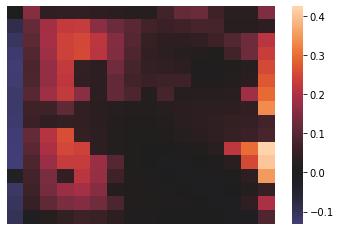

这是feature map 230 tensor(-0.0804, device='cuda:0', grad_fn=<MeanBackward0>)


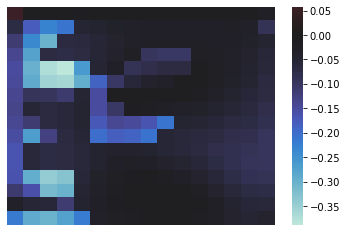

这是feature map 231 tensor(-0.2133, device='cuda:0', grad_fn=<MeanBackward0>)


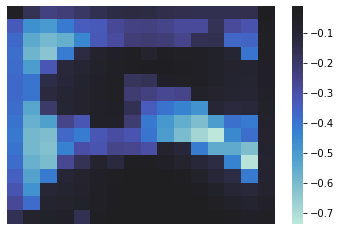

这是feature map 232 tensor(-0.1672, device='cuda:0', grad_fn=<MeanBackward0>)


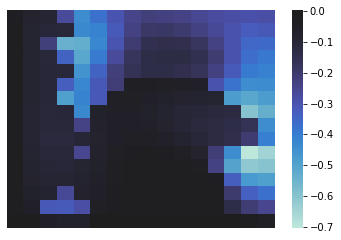

这是feature map 233 tensor(0.0596, device='cuda:0', grad_fn=<MeanBackward0>)


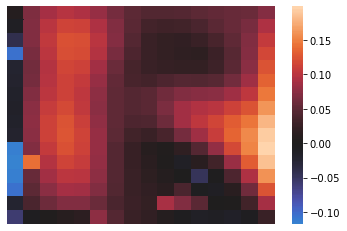

这是feature map 234 tensor(-0.1901, device='cuda:0', grad_fn=<MeanBackward0>)


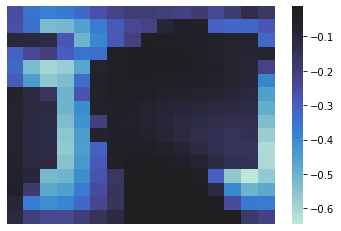

这是feature map 235 tensor(-0.2244, device='cuda:0', grad_fn=<MeanBackward0>)


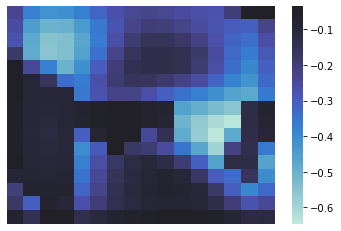

这是feature map 236 tensor(0.0160, device='cuda:0', grad_fn=<MeanBackward0>)


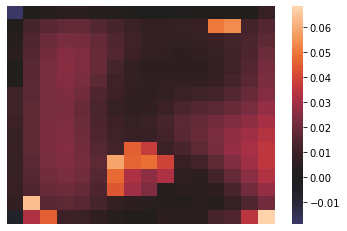

这是feature map 237 tensor(0.0310, device='cuda:0', grad_fn=<MeanBackward0>)


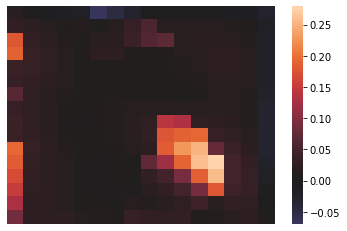

这是feature map 238 tensor(0.0610, device='cuda:0', grad_fn=<MeanBackward0>)


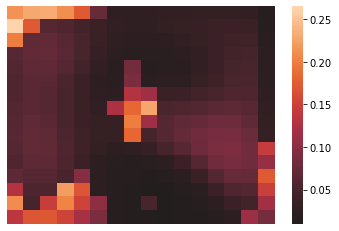

这是feature map 239 tensor(-0.0536, device='cuda:0', grad_fn=<MeanBackward0>)


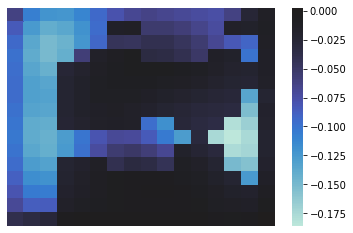

这是feature map 240 tensor(-0.1472, device='cuda:0', grad_fn=<MeanBackward0>)


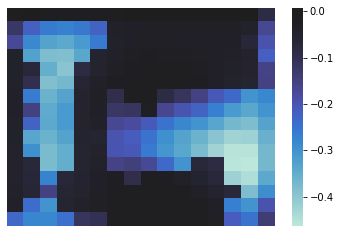

这是feature map 241 tensor(0.0184, device='cuda:0', grad_fn=<MeanBackward0>)


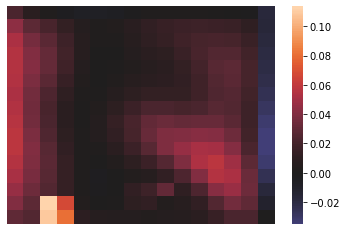

这是feature map 242 tensor(-0.1422, device='cuda:0', grad_fn=<MeanBackward0>)


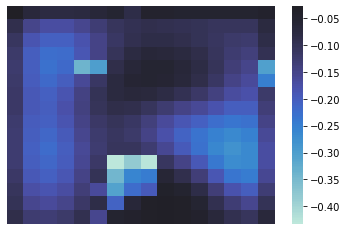

这是feature map 243 tensor(0.0767, device='cuda:0', grad_fn=<MeanBackward0>)


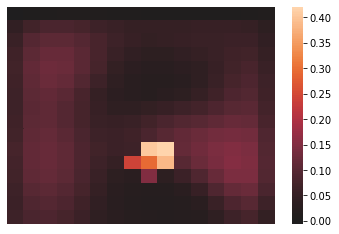

这是feature map 244 tensor(-0.0034, device='cuda:0', grad_fn=<MeanBackward0>)


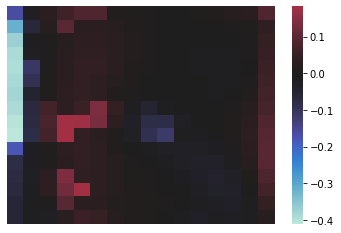

这是feature map 245 tensor(0.0062, device='cuda:0', grad_fn=<MeanBackward0>)


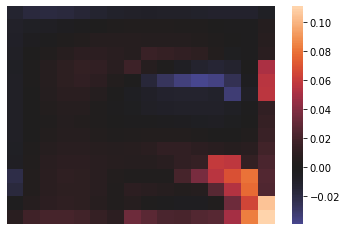

这是feature map 246 tensor(-0.1561, device='cuda:0', grad_fn=<MeanBackward0>)


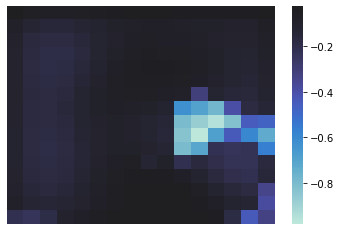

这是feature map 247 tensor(0.0545, device='cuda:0', grad_fn=<MeanBackward0>)


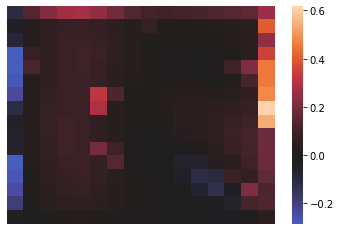

这是feature map 248 tensor(0.4761, device='cuda:0', grad_fn=<MeanBackward0>)


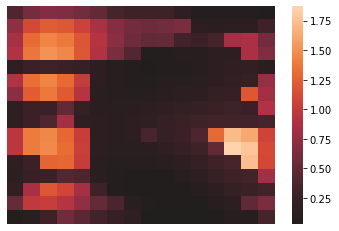

这是feature map 249 tensor(-0.3903, device='cuda:0', grad_fn=<MeanBackward0>)


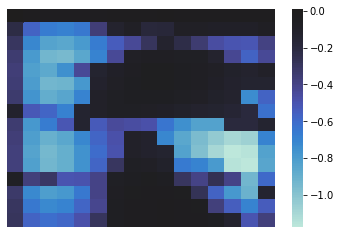

这是feature map 250 tensor(0.0697, device='cuda:0', grad_fn=<MeanBackward0>)


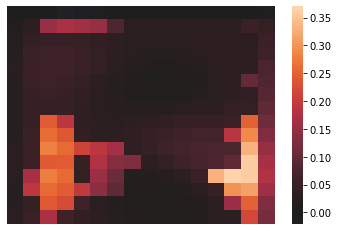

这是feature map 251 tensor(-0.0264, device='cuda:0', grad_fn=<MeanBackward0>)


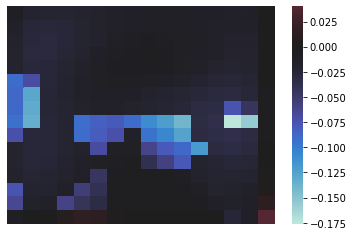

这是feature map 252 tensor(-0.0059, device='cuda:0', grad_fn=<MeanBackward0>)


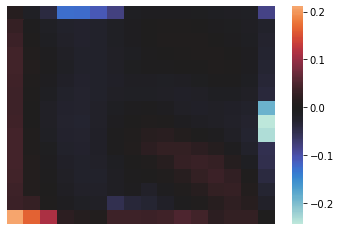

这是feature map 253 tensor(-0.4703, device='cuda:0', grad_fn=<MeanBackward0>)


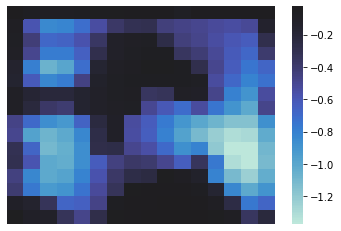

这是feature map 254 tensor(0.1883, device='cuda:0', grad_fn=<MeanBackward0>)


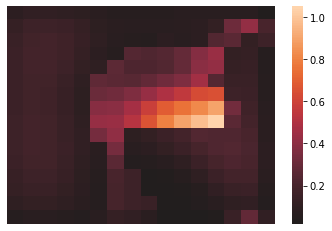

这是feature map 255 tensor(-0.0274, device='cuda:0', grad_fn=<MeanBackward0>)


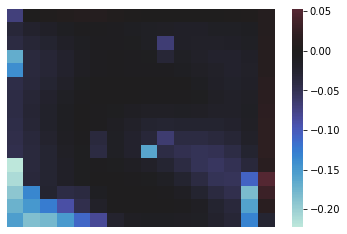

这是feature map 256 tensor(-0.3818, device='cuda:0', grad_fn=<MeanBackward0>)


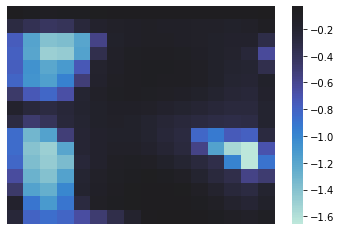

这是feature map 257 tensor(0.0730, device='cuda:0', grad_fn=<MeanBackward0>)


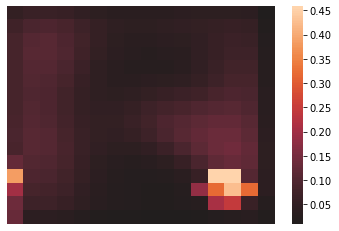

这是feature map 258 tensor(-0.0483, device='cuda:0', grad_fn=<MeanBackward0>)


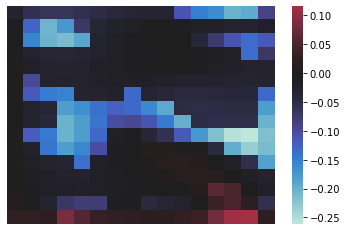

这是feature map 259 tensor(0.0448, device='cuda:0', grad_fn=<MeanBackward0>)


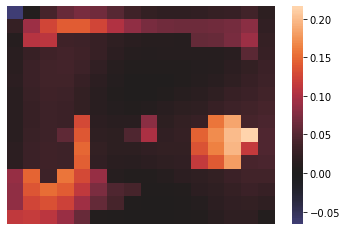

这是feature map 260 tensor(-0.0253, device='cuda:0', grad_fn=<MeanBackward0>)


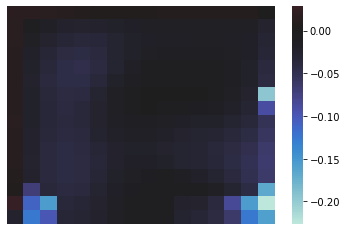

这是feature map 261 tensor(0.0979, device='cuda:0', grad_fn=<MeanBackward0>)


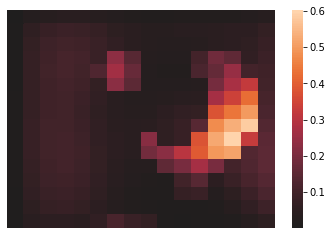

这是feature map 262 tensor(0.0872, device='cuda:0', grad_fn=<MeanBackward0>)


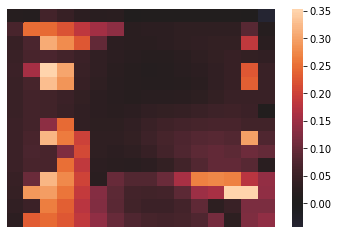

这是feature map 263 tensor(-0.5153, device='cuda:0', grad_fn=<MeanBackward0>)


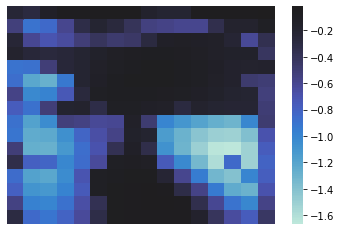

这是feature map 264 tensor(0.0383, device='cuda:0', grad_fn=<MeanBackward0>)


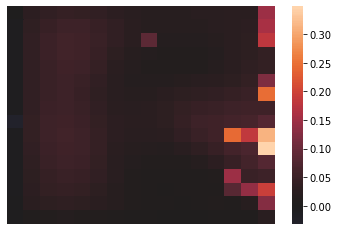

这是feature map 265 tensor(0.1434, device='cuda:0', grad_fn=<MeanBackward0>)


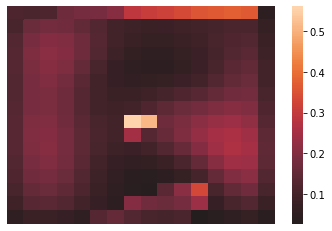

这是feature map 266 tensor(-0.0291, device='cuda:0', grad_fn=<MeanBackward0>)


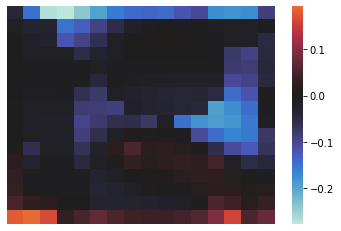

这是feature map 267 tensor(0.0489, device='cuda:0', grad_fn=<MeanBackward0>)


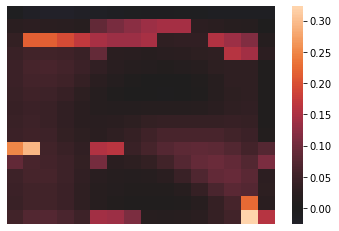

这是feature map 268 tensor(0.0112, device='cuda:0', grad_fn=<MeanBackward0>)


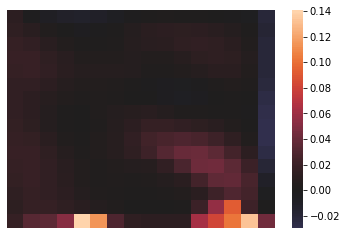

这是feature map 269 tensor(-0.0786, device='cuda:0', grad_fn=<MeanBackward0>)


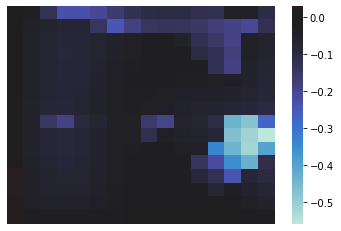

这是feature map 270 tensor(-0.2388, device='cuda:0', grad_fn=<MeanBackward0>)


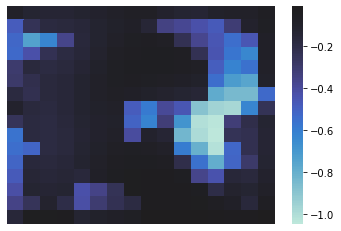

这是feature map 271 tensor(0.0838, device='cuda:0', grad_fn=<MeanBackward0>)


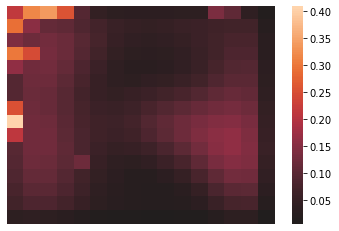

这是feature map 272 tensor(0.1661, device='cuda:0', grad_fn=<MeanBackward0>)


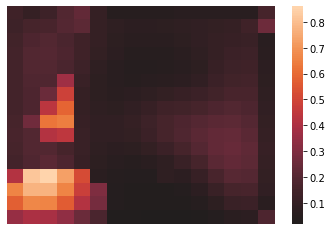

这是feature map 273 tensor(0.1962, device='cuda:0', grad_fn=<MeanBackward0>)


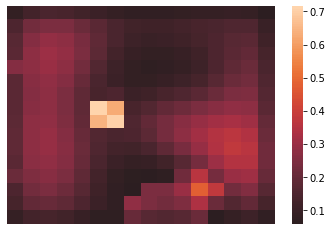

这是feature map 274 tensor(-0.0517, device='cuda:0', grad_fn=<MeanBackward0>)


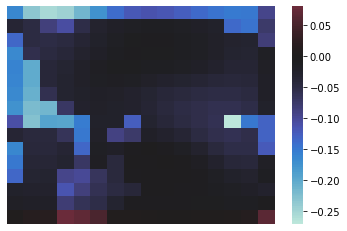

这是feature map 275 tensor(0.2460, device='cuda:0', grad_fn=<MeanBackward0>)


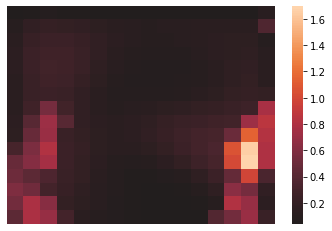

这是feature map 276 tensor(-0.0317, device='cuda:0', grad_fn=<MeanBackward0>)


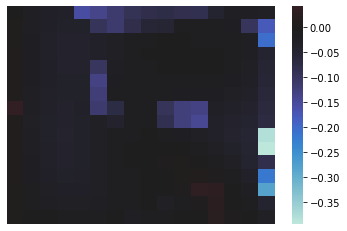

这是feature map 277 tensor(-0.0518, device='cuda:0', grad_fn=<MeanBackward0>)


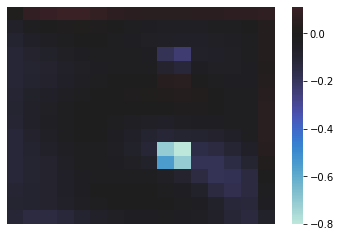

这是feature map 278 tensor(0.0777, device='cuda:0', grad_fn=<MeanBackward0>)


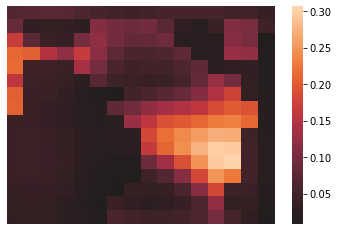

这是feature map 279 tensor(-0.3671, device='cuda:0', grad_fn=<MeanBackward0>)


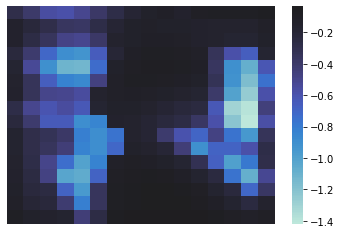

这是feature map 280 tensor(-0.0360, device='cuda:0', grad_fn=<MeanBackward0>)


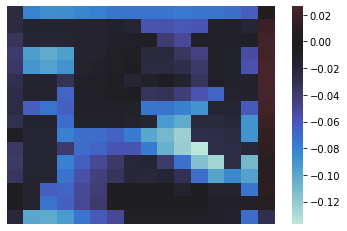

这是feature map 281 tensor(-0.0791, device='cuda:0', grad_fn=<MeanBackward0>)


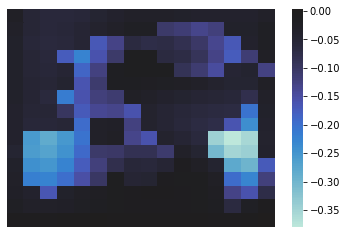

这是feature map 282 tensor(0.0332, device='cuda:0', grad_fn=<MeanBackward0>)


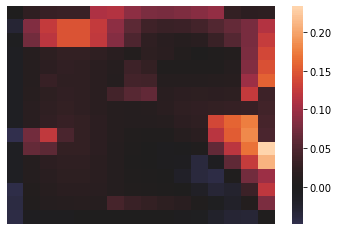

这是feature map 283 tensor(0.1959, device='cuda:0', grad_fn=<MeanBackward0>)


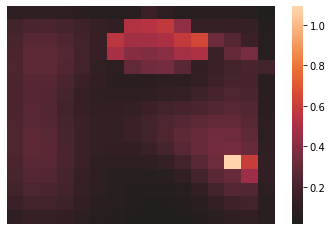

这是feature map 284 tensor(-0.4320, device='cuda:0', grad_fn=<MeanBackward0>)


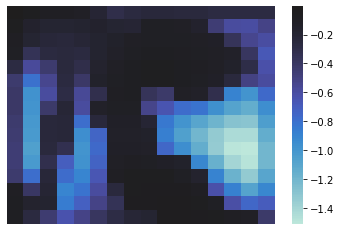

这是feature map 285 tensor(0.0460, device='cuda:0', grad_fn=<MeanBackward0>)


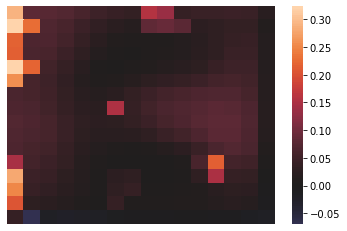

这是feature map 286 tensor(-0.2958, device='cuda:0', grad_fn=<MeanBackward0>)


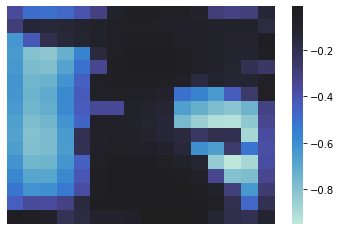

这是feature map 287 tensor(-0.0312, device='cuda:0', grad_fn=<MeanBackward0>)


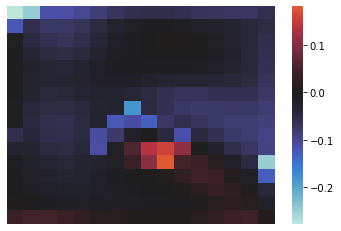

这是feature map 288 tensor(-0.0342, device='cuda:0', grad_fn=<MeanBackward0>)


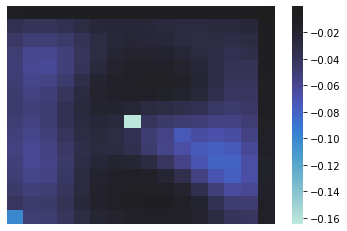

这是feature map 289 tensor(-0.1694, device='cuda:0', grad_fn=<MeanBackward0>)


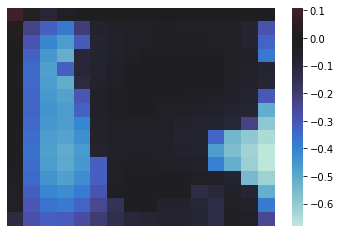

这是feature map 290 tensor(-0.1848, device='cuda:0', grad_fn=<MeanBackward0>)


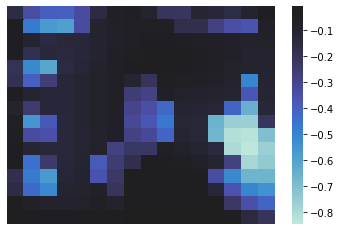

这是feature map 291 tensor(0.0155, device='cuda:0', grad_fn=<MeanBackward0>)


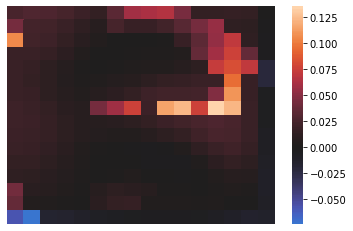

这是feature map 292 tensor(0.1138, device='cuda:0', grad_fn=<MeanBackward0>)


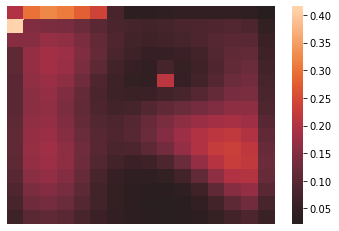

这是feature map 293 tensor(0.0572, device='cuda:0', grad_fn=<MeanBackward0>)


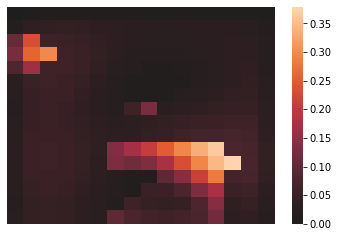

这是feature map 294 tensor(0.0740, device='cuda:0', grad_fn=<MeanBackward0>)


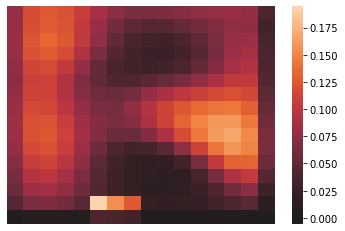

这是feature map 295 tensor(0.0859, device='cuda:0', grad_fn=<MeanBackward0>)


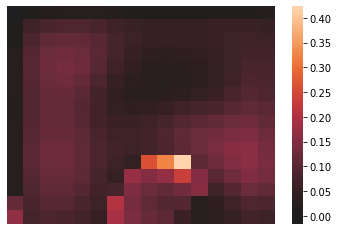

这是feature map 296 tensor(0.0181, device='cuda:0', grad_fn=<MeanBackward0>)


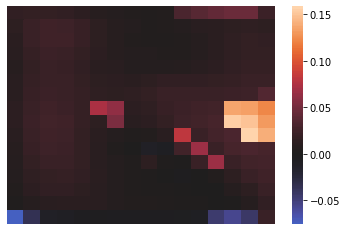

这是feature map 297 tensor(-0.2132, device='cuda:0', grad_fn=<MeanBackward0>)


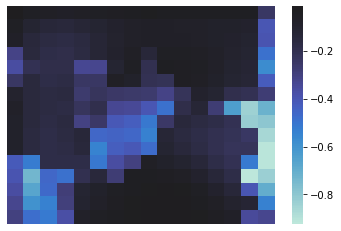

这是feature map 298 tensor(-0.2622, device='cuda:0', grad_fn=<MeanBackward0>)


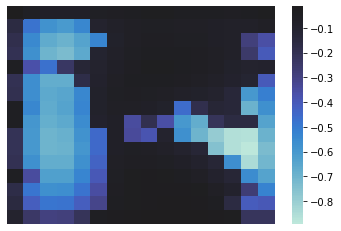

这是feature map 299 tensor(-0.3656, device='cuda:0', grad_fn=<MeanBackward0>)


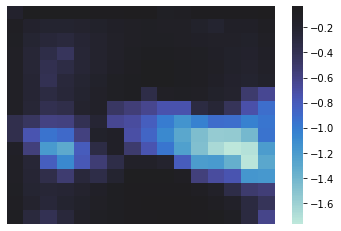

这是feature map 300 tensor(-0.0848, device='cuda:0', grad_fn=<MeanBackward0>)


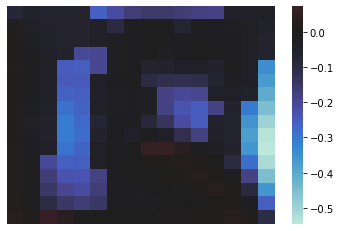

这是feature map 301 tensor(0.2139, device='cuda:0', grad_fn=<MeanBackward0>)


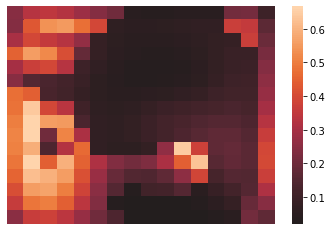

这是feature map 302 tensor(-0.0629, device='cuda:0', grad_fn=<MeanBackward0>)


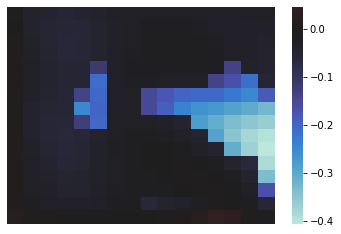

这是feature map 303 tensor(0.0290, device='cuda:0', grad_fn=<MeanBackward0>)


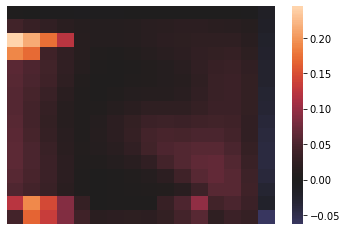

这是feature map 304 tensor(0.1288, device='cuda:0', grad_fn=<MeanBackward0>)


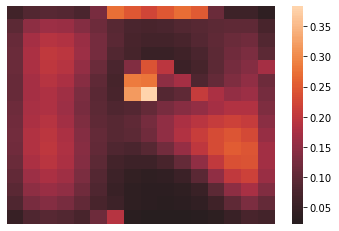

这是feature map 305 tensor(-0.0621, device='cuda:0', grad_fn=<MeanBackward0>)


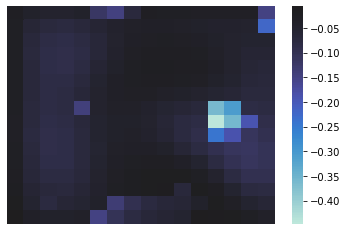

这是feature map 306 tensor(-0.0538, device='cuda:0', grad_fn=<MeanBackward0>)


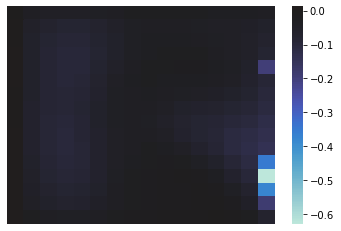

这是feature map 307 tensor(0.2460, device='cuda:0', grad_fn=<MeanBackward0>)


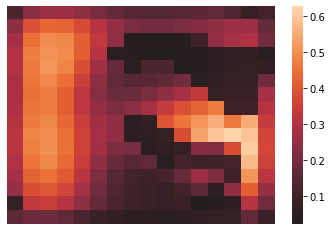

这是feature map 308 tensor(-0.0692, device='cuda:0', grad_fn=<MeanBackward0>)


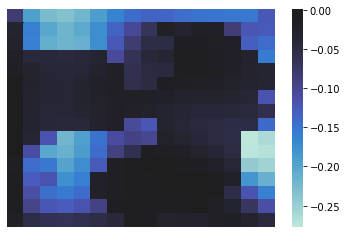

这是feature map 309 tensor(0.1703, device='cuda:0', grad_fn=<MeanBackward0>)


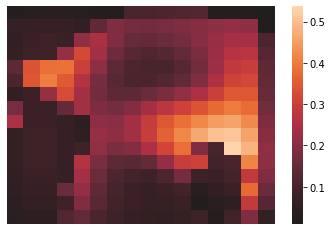

这是feature map 310 tensor(0.1485, device='cuda:0', grad_fn=<MeanBackward0>)


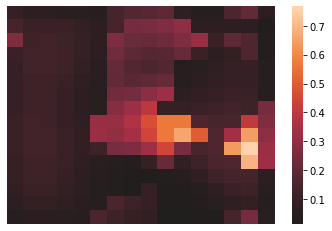

这是feature map 311 tensor(0.1572, device='cuda:0', grad_fn=<MeanBackward0>)


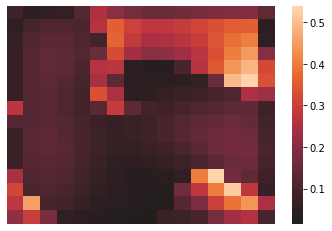

这是feature map 312 tensor(0.0022, device='cuda:0', grad_fn=<MeanBackward0>)


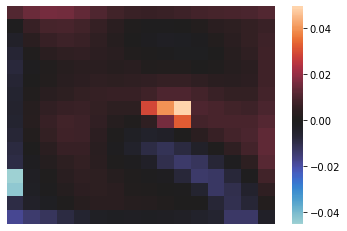

这是feature map 313 tensor(-0.2176, device='cuda:0', grad_fn=<MeanBackward0>)


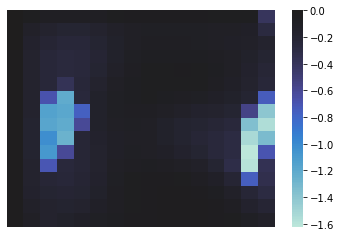

这是feature map 314 tensor(-0.0402, device='cuda:0', grad_fn=<MeanBackward0>)


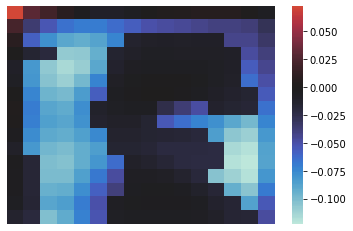

这是feature map 315 tensor(0.0370, device='cuda:0', grad_fn=<MeanBackward0>)


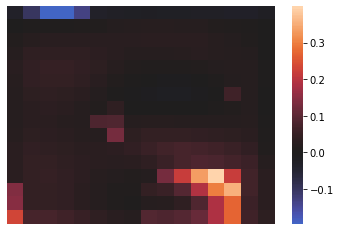

这是feature map 316 tensor(-0.5053, device='cuda:0', grad_fn=<MeanBackward0>)


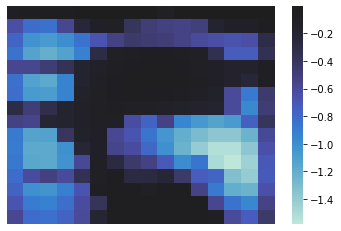

这是feature map 317 tensor(0.0481, device='cuda:0', grad_fn=<MeanBackward0>)


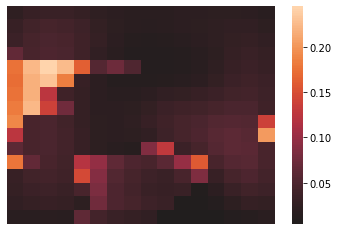

这是feature map 318 tensor(-0.1043, device='cuda:0', grad_fn=<MeanBackward0>)


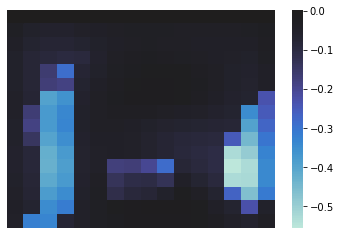

这是feature map 319 tensor(-0.7076, device='cuda:0', grad_fn=<MeanBackward0>)


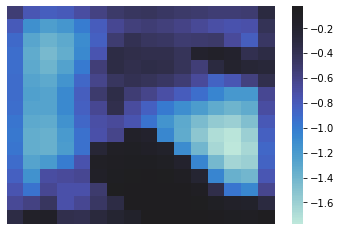

这是feature map 320 tensor(-0.0944, device='cuda:0', grad_fn=<MeanBackward0>)


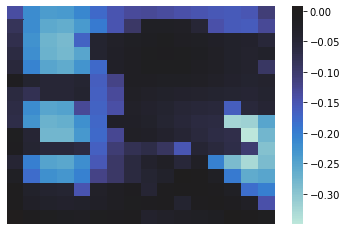

这是feature map 321 tensor(-0.1055, device='cuda:0', grad_fn=<MeanBackward0>)


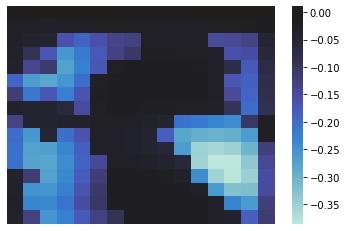

这是feature map 322 tensor(0.0705, device='cuda:0', grad_fn=<MeanBackward0>)


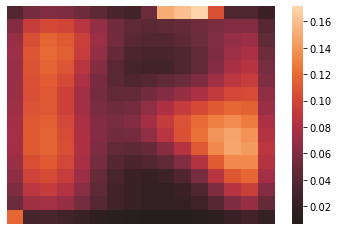

这是feature map 323 tensor(0.0145, device='cuda:0', grad_fn=<MeanBackward0>)


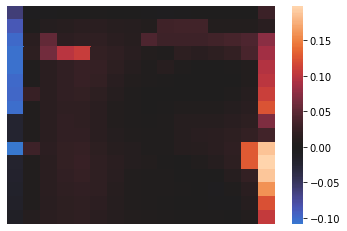

这是feature map 324 tensor(-0.0401, device='cuda:0', grad_fn=<MeanBackward0>)


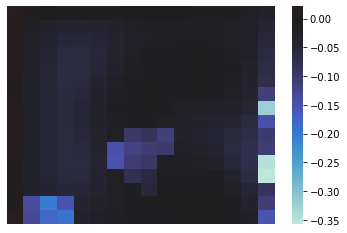

这是feature map 325 tensor(-0.0171, device='cuda:0', grad_fn=<MeanBackward0>)


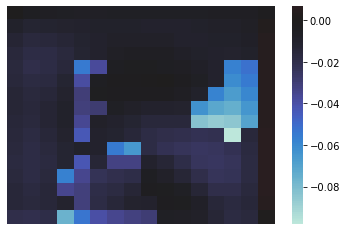

这是feature map 326 tensor(0.2389, device='cuda:0', grad_fn=<MeanBackward0>)


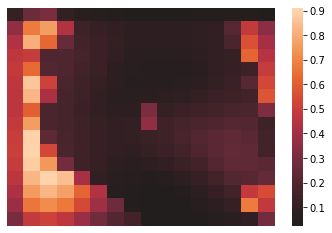

这是feature map 327 tensor(-0.0812, device='cuda:0', grad_fn=<MeanBackward0>)


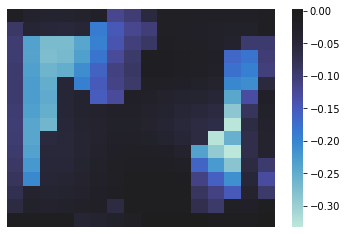

这是feature map 328 tensor(-0.0521, device='cuda:0', grad_fn=<MeanBackward0>)


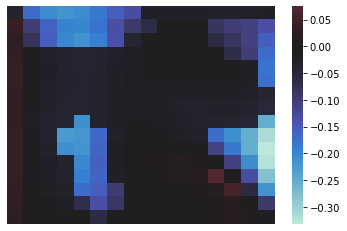

这是feature map 329 tensor(0.0991, device='cuda:0', grad_fn=<MeanBackward0>)


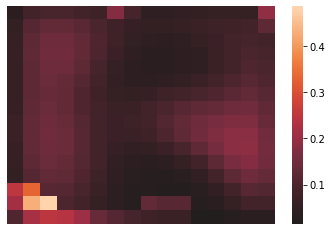

这是feature map 330 tensor(-0.2687, device='cuda:0', grad_fn=<MeanBackward0>)


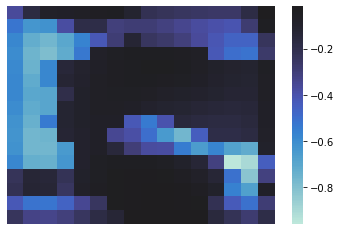

这是feature map 331 tensor(-0.1135, device='cuda:0', grad_fn=<MeanBackward0>)


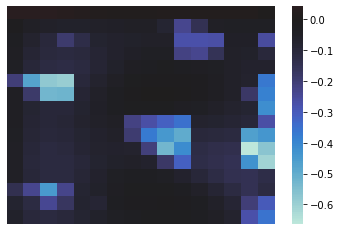

这是feature map 332 tensor(0.3255, device='cuda:0', grad_fn=<MeanBackward0>)


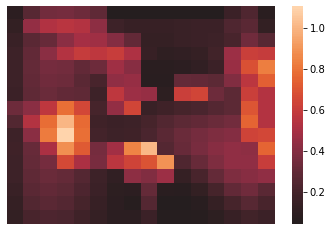

这是feature map 333 tensor(-0.0490, device='cuda:0', grad_fn=<MeanBackward0>)


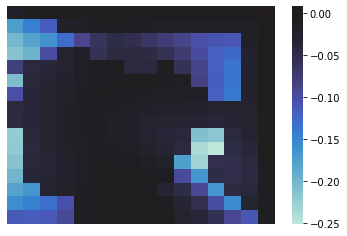

这是feature map 334 tensor(0.2042, device='cuda:0', grad_fn=<MeanBackward0>)


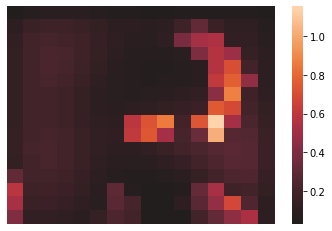

这是feature map 335 tensor(0.3178, device='cuda:0', grad_fn=<MeanBackward0>)


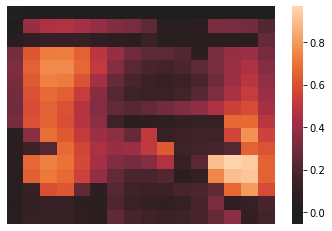

这是feature map 336 tensor(0.1007, device='cuda:0', grad_fn=<MeanBackward0>)


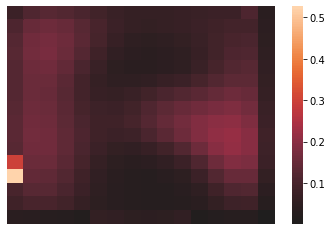

这是feature map 337 tensor(0.1312, device='cuda:0', grad_fn=<MeanBackward0>)


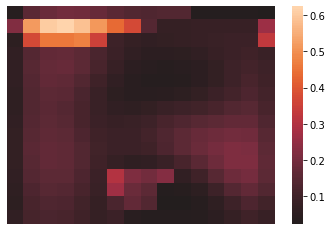

这是feature map 338 tensor(-0.0975, device='cuda:0', grad_fn=<MeanBackward0>)


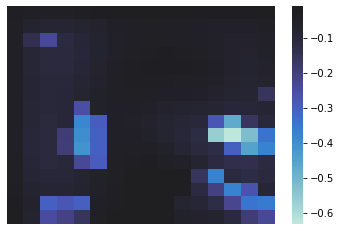

这是feature map 339 tensor(-0.7770, device='cuda:0', grad_fn=<MeanBackward0>)


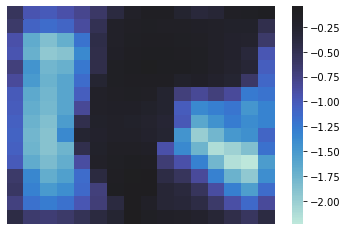

这是feature map 340 tensor(0.0092, device='cuda:0', grad_fn=<MeanBackward0>)


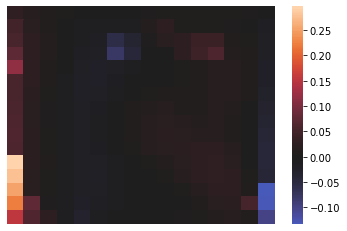

这是feature map 341 tensor(5.0833e-05, device='cuda:0', grad_fn=<MeanBackward0>)


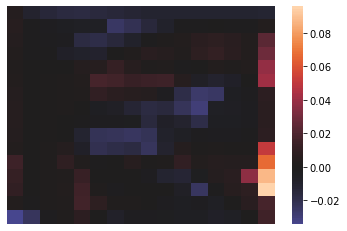

这是feature map 342 tensor(0.0631, device='cuda:0', grad_fn=<MeanBackward0>)


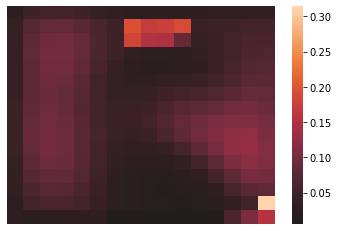

这是feature map 343 tensor(0.0478, device='cuda:0', grad_fn=<MeanBackward0>)


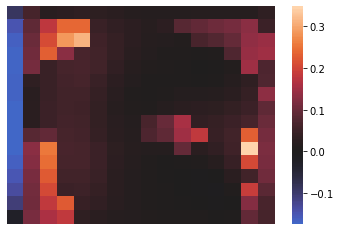

这是feature map 344 tensor(-0.0329, device='cuda:0', grad_fn=<MeanBackward0>)


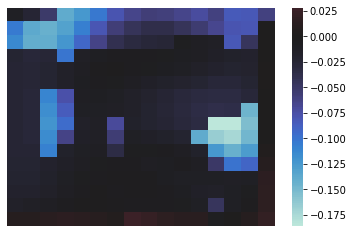

这是feature map 345 tensor(-0.1830, device='cuda:0', grad_fn=<MeanBackward0>)


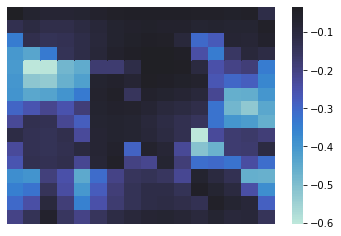

这是feature map 346 tensor(-0.0537, device='cuda:0', grad_fn=<MeanBackward0>)


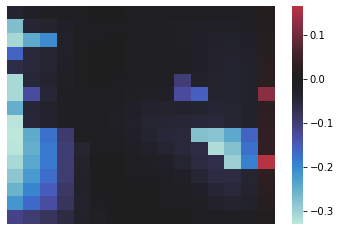

这是feature map 347 tensor(0.0308, device='cuda:0', grad_fn=<MeanBackward0>)


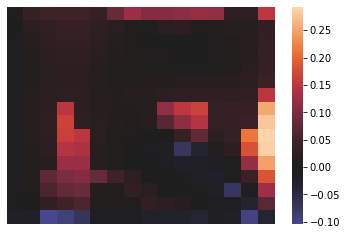

这是feature map 348 tensor(-0.1581, device='cuda:0', grad_fn=<MeanBackward0>)


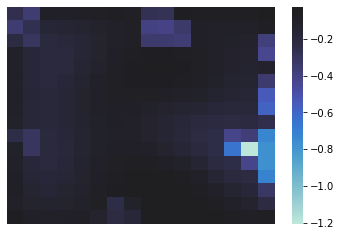

这是feature map 349 tensor(-0.0697, device='cuda:0', grad_fn=<MeanBackward0>)


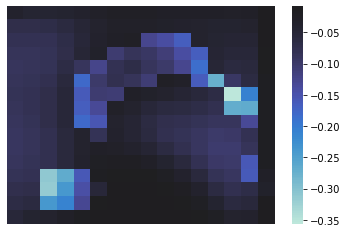

这是feature map 350 tensor(-0.1193, device='cuda:0', grad_fn=<MeanBackward0>)


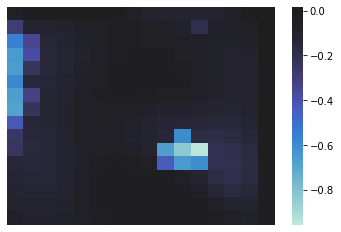

这是feature map 351 tensor(-0.3281, device='cuda:0', grad_fn=<MeanBackward0>)


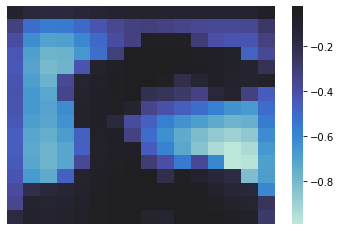

这是feature map 352 tensor(-0.0321, device='cuda:0', grad_fn=<MeanBackward0>)


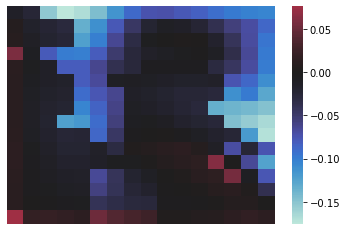

这是feature map 353 tensor(0.0573, device='cuda:0', grad_fn=<MeanBackward0>)


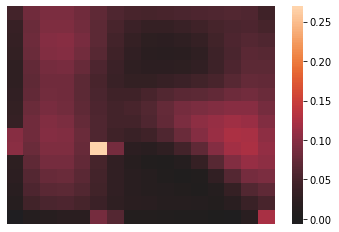

这是feature map 354 tensor(-0.0275, device='cuda:0', grad_fn=<MeanBackward0>)


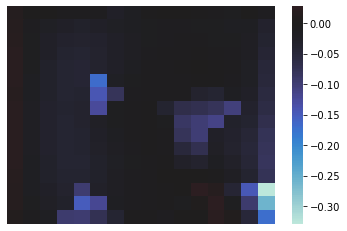

这是feature map 355 tensor(-0.0474, device='cuda:0', grad_fn=<MeanBackward0>)


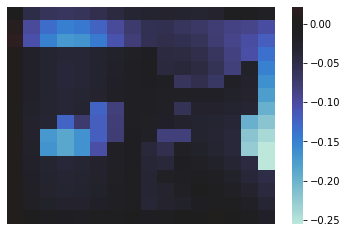

这是feature map 356 tensor(-0.1324, device='cuda:0', grad_fn=<MeanBackward0>)


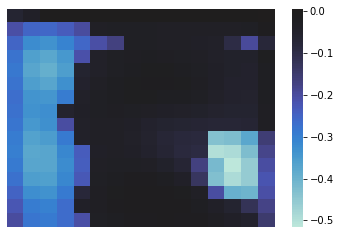

这是feature map 357 tensor(-0.0384, device='cuda:0', grad_fn=<MeanBackward0>)


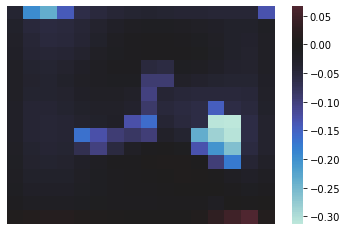

这是feature map 358 tensor(0.0562, device='cuda:0', grad_fn=<MeanBackward0>)


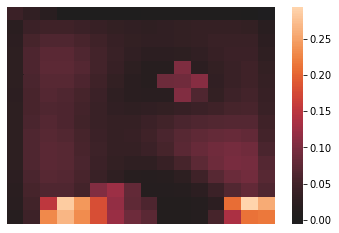

这是feature map 359 tensor(0.0618, device='cuda:0', grad_fn=<MeanBackward0>)


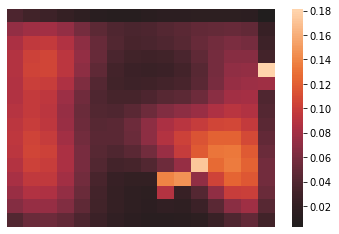

这是feature map 360 tensor(0.2699, device='cuda:0', grad_fn=<MeanBackward0>)


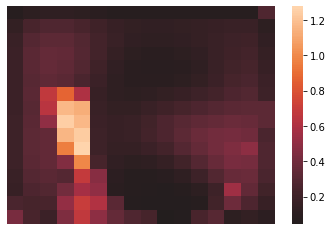

这是feature map 361 tensor(0.0344, device='cuda:0', grad_fn=<MeanBackward0>)


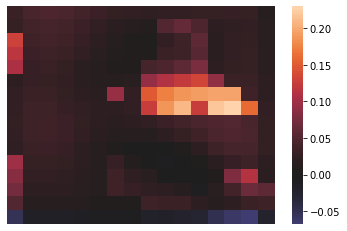

这是feature map 362 tensor(0.0864, device='cuda:0', grad_fn=<MeanBackward0>)


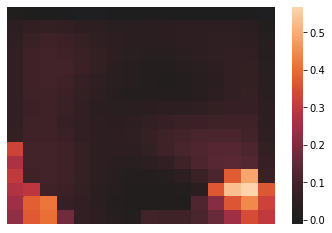

这是feature map 363 tensor(0.0939, device='cuda:0', grad_fn=<MeanBackward0>)


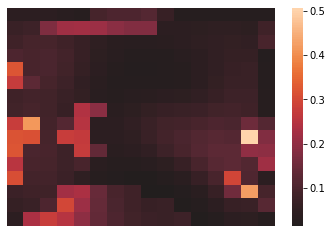

这是feature map 364 tensor(-0.1316, device='cuda:0', grad_fn=<MeanBackward0>)


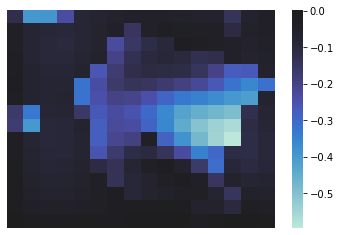

这是feature map 365 tensor(0.0861, device='cuda:0', grad_fn=<MeanBackward0>)


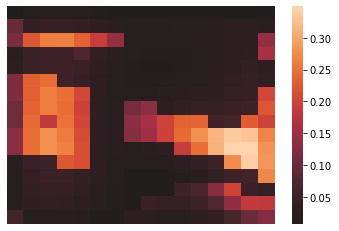

这是feature map 366 tensor(-0.3606, device='cuda:0', grad_fn=<MeanBackward0>)


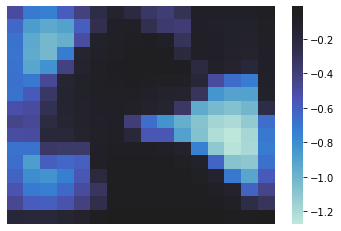

这是feature map 367 tensor(0.0092, device='cuda:0', grad_fn=<MeanBackward0>)


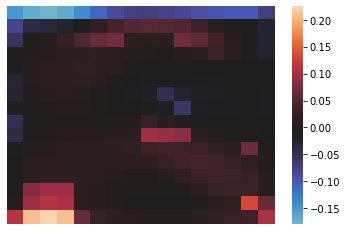

这是feature map 368 tensor(-0.0719, device='cuda:0', grad_fn=<MeanBackward0>)


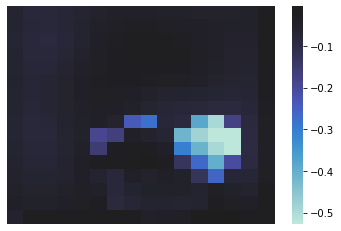

这是feature map 369 tensor(-0.0054, device='cuda:0', grad_fn=<MeanBackward0>)


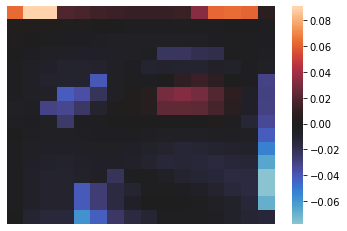

这是feature map 370 tensor(-0.0595, device='cuda:0', grad_fn=<MeanBackward0>)


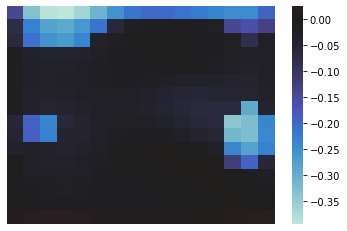

这是feature map 371 tensor(-0.3357, device='cuda:0', grad_fn=<MeanBackward0>)


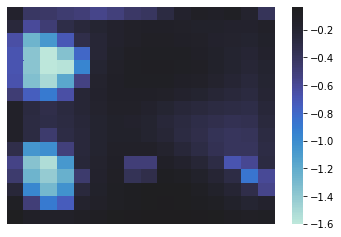

这是feature map 372 tensor(0.1889, device='cuda:0', grad_fn=<MeanBackward0>)


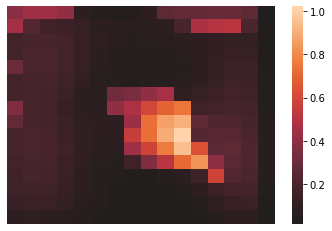

这是feature map 373 tensor(0.0186, device='cuda:0', grad_fn=<MeanBackward0>)


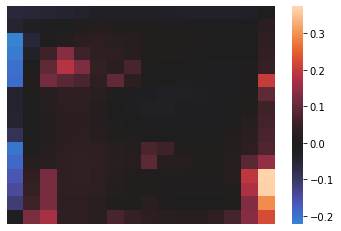

这是feature map 374 tensor(-0.1961, device='cuda:0', grad_fn=<MeanBackward0>)


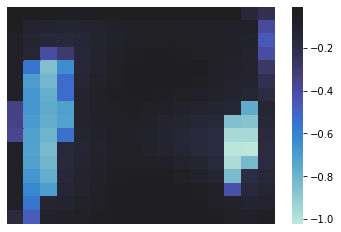

这是feature map 375 tensor(-0.0823, device='cuda:0', grad_fn=<MeanBackward0>)


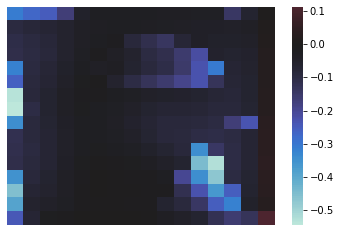

这是feature map 376 tensor(-0.1279, device='cuda:0', grad_fn=<MeanBackward0>)


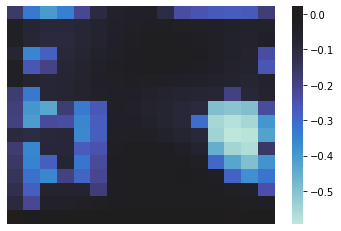

这是feature map 377 tensor(0.1083, device='cuda:0', grad_fn=<MeanBackward0>)


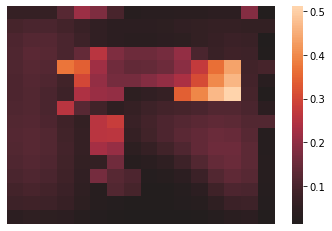

这是feature map 378 tensor(-0.0425, device='cuda:0', grad_fn=<MeanBackward0>)


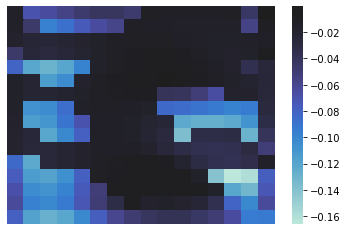

这是feature map 379 tensor(0.2716, device='cuda:0', grad_fn=<MeanBackward0>)


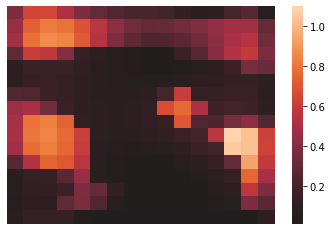

这是feature map 380 tensor(-0.1607, device='cuda:0', grad_fn=<MeanBackward0>)


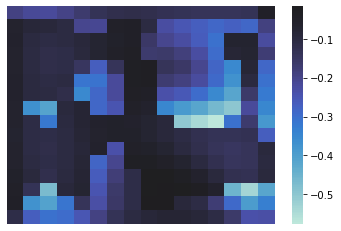

这是feature map 381 tensor(0.0130, device='cuda:0', grad_fn=<MeanBackward0>)


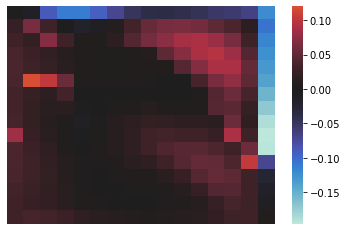

这是feature map 382 tensor(-0.0347, device='cuda:0', grad_fn=<MeanBackward0>)


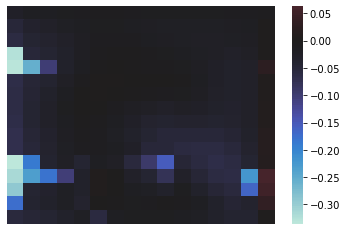

这是feature map 383 tensor(-0.6018, device='cuda:0', grad_fn=<MeanBackward0>)


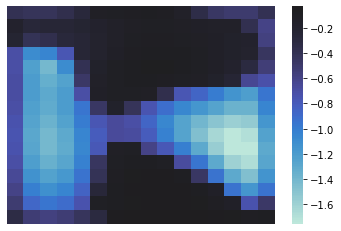

这是feature map 384 tensor(0.2015, device='cuda:0', grad_fn=<MeanBackward0>)


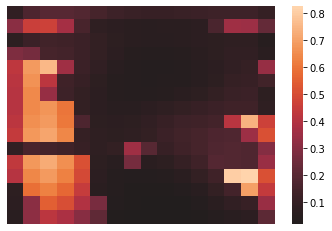

这是feature map 385 tensor(-0.2851, device='cuda:0', grad_fn=<MeanBackward0>)


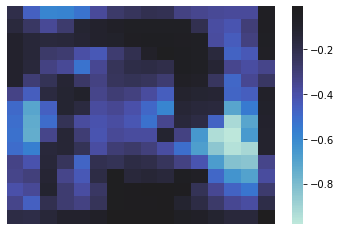

这是feature map 386 tensor(0.1834, device='cuda:0', grad_fn=<MeanBackward0>)


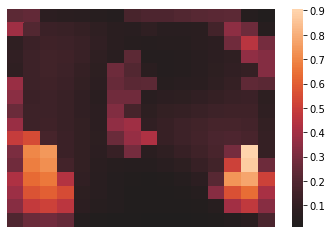

这是feature map 387 tensor(0.0052, device='cuda:0', grad_fn=<MeanBackward0>)


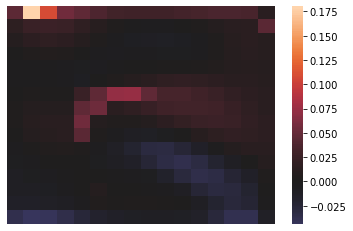

这是feature map 388 tensor(0.1290, device='cuda:0', grad_fn=<MeanBackward0>)


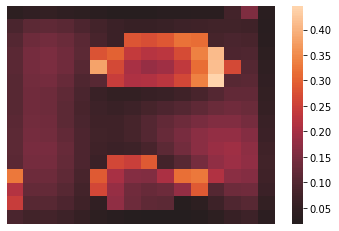

这是feature map 389 tensor(-0.0015, device='cuda:0', grad_fn=<MeanBackward0>)


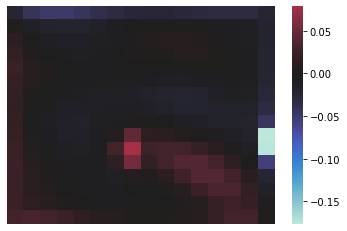

这是feature map 390 tensor(0.0512, device='cuda:0', grad_fn=<MeanBackward0>)


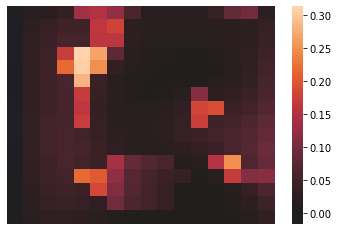

这是feature map 391 tensor(-0.0392, device='cuda:0', grad_fn=<MeanBackward0>)


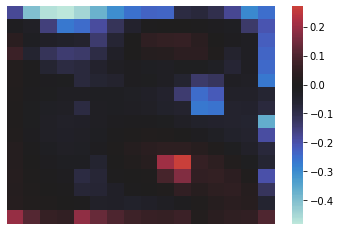

这是feature map 392 tensor(-0.2969, device='cuda:0', grad_fn=<MeanBackward0>)


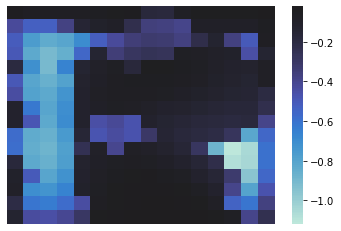

这是feature map 393 tensor(0.0344, device='cuda:0', grad_fn=<MeanBackward0>)


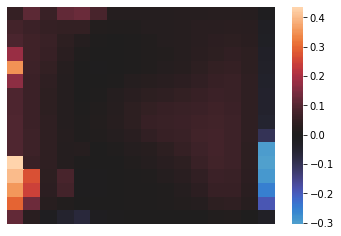

这是feature map 394 tensor(-0.1044, device='cuda:0', grad_fn=<MeanBackward0>)


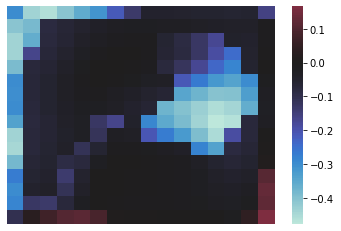

这是feature map 395 tensor(-0.1909, device='cuda:0', grad_fn=<MeanBackward0>)


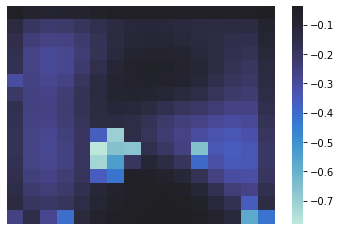

这是feature map 396 tensor(-0.5267, device='cuda:0', grad_fn=<MeanBackward0>)


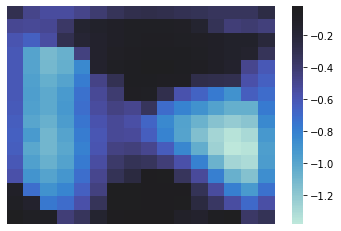

这是feature map 397 tensor(-0.0065, device='cuda:0', grad_fn=<MeanBackward0>)


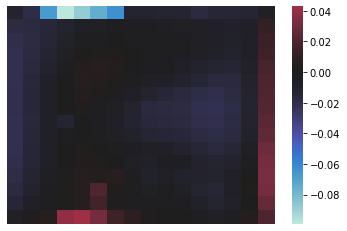

这是feature map 398 tensor(-0.1022, device='cuda:0', grad_fn=<MeanBackward0>)


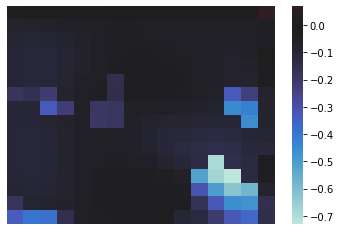

这是feature map 399 tensor(-0.1380, device='cuda:0', grad_fn=<MeanBackward0>)


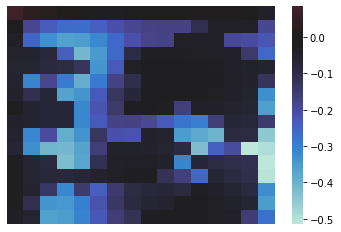

这是feature map 400 tensor(0.1184, device='cuda:0', grad_fn=<MeanBackward0>)


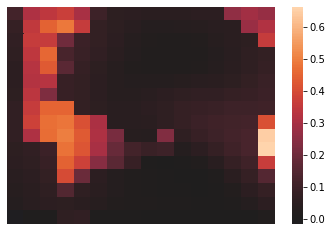

这是feature map 401 tensor(0.0215, device='cuda:0', grad_fn=<MeanBackward0>)


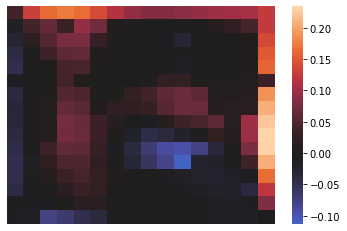

这是feature map 402 tensor(-0.0126, device='cuda:0', grad_fn=<MeanBackward0>)


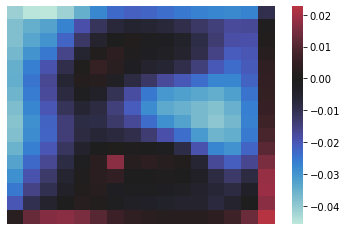

这是feature map 403 tensor(0.0850, device='cuda:0', grad_fn=<MeanBackward0>)


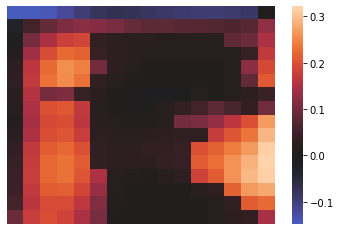

这是feature map 404 tensor(0.0551, device='cuda:0', grad_fn=<MeanBackward0>)


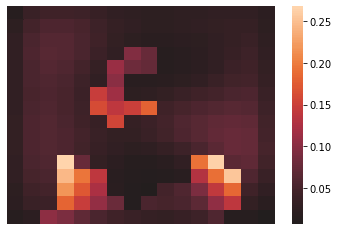

这是feature map 405 tensor(-0.0824, device='cuda:0', grad_fn=<MeanBackward0>)


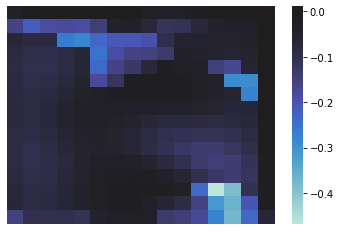

这是feature map 406 tensor(-0.3356, device='cuda:0', grad_fn=<MeanBackward0>)


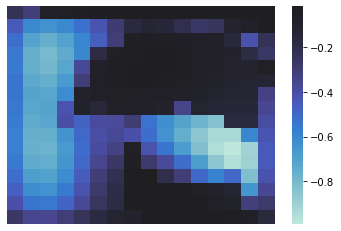

这是feature map 407 tensor(-0.3563, device='cuda:0', grad_fn=<MeanBackward0>)


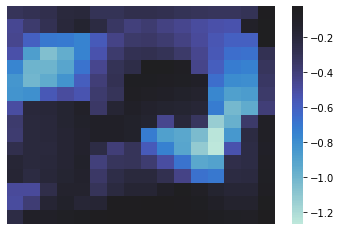

这是feature map 408 tensor(-0.0167, device='cuda:0', grad_fn=<MeanBackward0>)


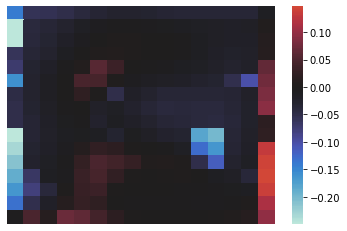

这是feature map 409 tensor(0.0678, device='cuda:0', grad_fn=<MeanBackward0>)


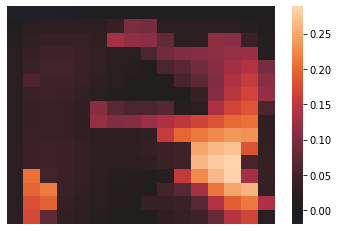

这是feature map 410 tensor(0.1244, device='cuda:0', grad_fn=<MeanBackward0>)


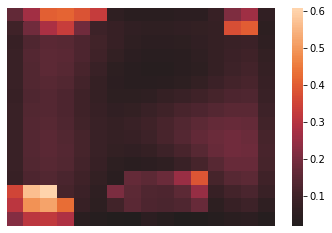

这是feature map 411 tensor(-0.0353, device='cuda:0', grad_fn=<MeanBackward0>)


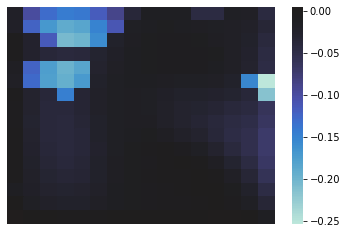

这是feature map 412 tensor(-0.1875, device='cuda:0', grad_fn=<MeanBackward0>)


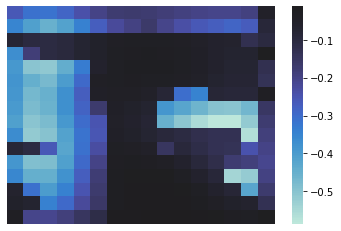

这是feature map 413 tensor(0.0172, device='cuda:0', grad_fn=<MeanBackward0>)


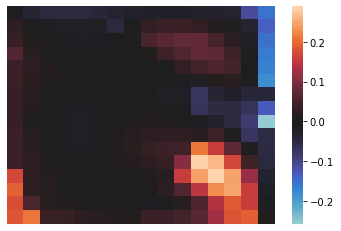

这是feature map 414 tensor(-0.2398, device='cuda:0', grad_fn=<MeanBackward0>)


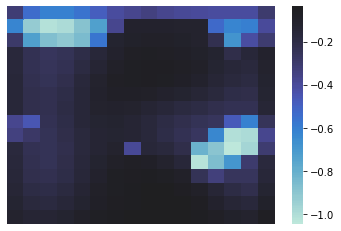

这是feature map 415 tensor(0.1779, device='cuda:0', grad_fn=<MeanBackward0>)


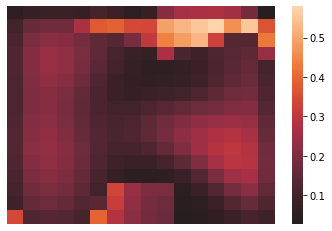

这是feature map 416 tensor(0.2002, device='cuda:0', grad_fn=<MeanBackward0>)


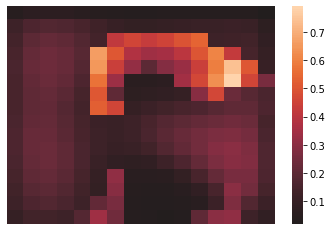

这是feature map 417 tensor(-0.6052, device='cuda:0', grad_fn=<MeanBackward0>)


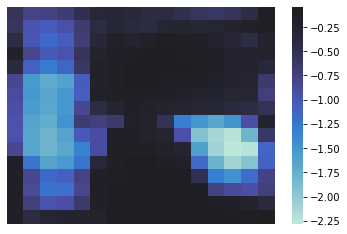

这是feature map 418 tensor(-0.5234, device='cuda:0', grad_fn=<MeanBackward0>)


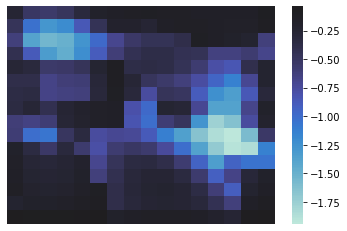

这是feature map 419 tensor(-0.5207, device='cuda:0', grad_fn=<MeanBackward0>)


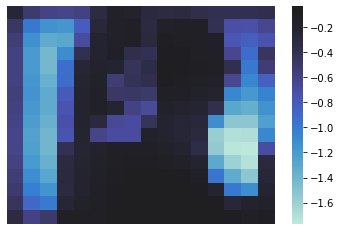

这是feature map 420 tensor(-0.3017, device='cuda:0', grad_fn=<MeanBackward0>)


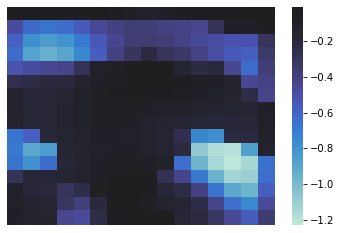

这是feature map 421 tensor(0.1503, device='cuda:0', grad_fn=<MeanBackward0>)


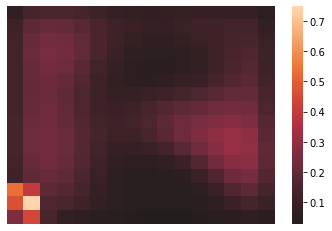

这是feature map 422 tensor(-0.4585, device='cuda:0', grad_fn=<MeanBackward0>)


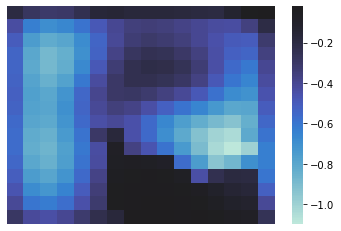

这是feature map 423 tensor(-0.0492, device='cuda:0', grad_fn=<MeanBackward0>)


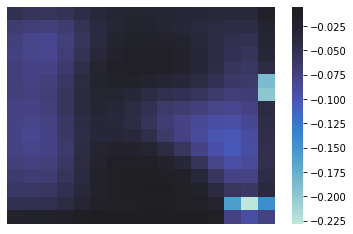

这是feature map 424 tensor(0.1389, device='cuda:0', grad_fn=<MeanBackward0>)


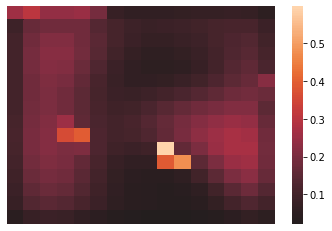

这是feature map 425 tensor(0.0478, device='cuda:0', grad_fn=<MeanBackward0>)


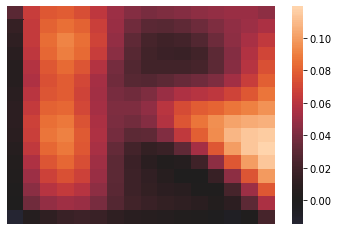

这是feature map 426 tensor(-0.0447, device='cuda:0', grad_fn=<MeanBackward0>)


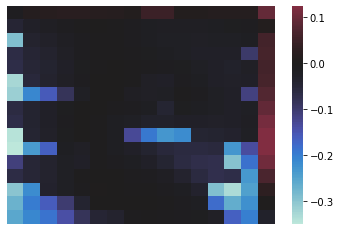

这是feature map 427 tensor(-0.0881, device='cuda:0', grad_fn=<MeanBackward0>)


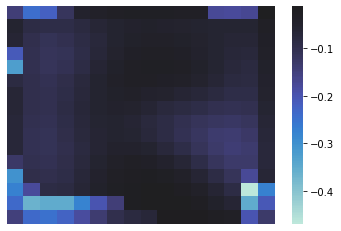

这是feature map 428 tensor(0.2853, device='cuda:0', grad_fn=<MeanBackward0>)


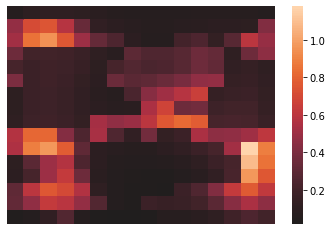

这是feature map 429 tensor(-0.0974, device='cuda:0', grad_fn=<MeanBackward0>)


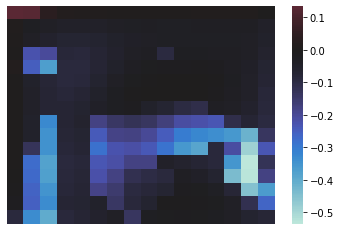

这是feature map 430 tensor(0.1660, device='cuda:0', grad_fn=<MeanBackward0>)


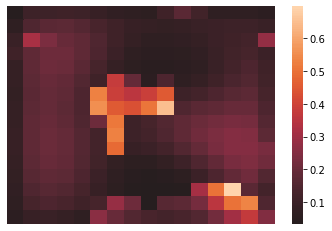

这是feature map 431 tensor(0.0706, device='cuda:0', grad_fn=<MeanBackward0>)


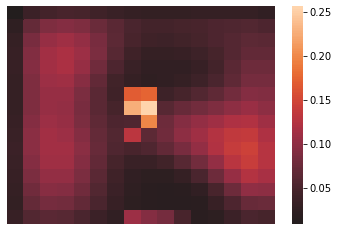

这是feature map 432 tensor(0.0369, device='cuda:0', grad_fn=<MeanBackward0>)


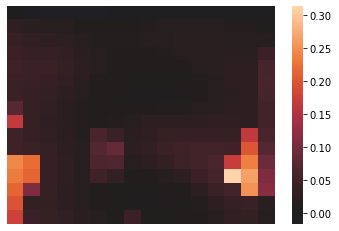

这是feature map 433 tensor(0.0636, device='cuda:0', grad_fn=<MeanBackward0>)


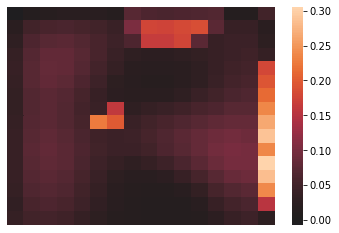

这是feature map 434 tensor(0.0502, device='cuda:0', grad_fn=<MeanBackward0>)


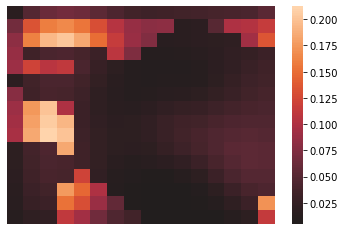

这是feature map 435 tensor(-0.2081, device='cuda:0', grad_fn=<MeanBackward0>)


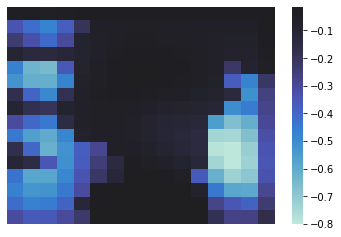

这是feature map 436 tensor(0.2998, device='cuda:0', grad_fn=<MeanBackward0>)


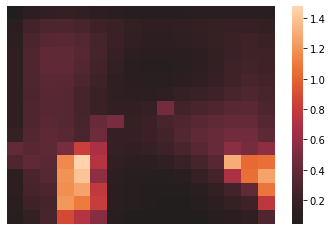

这是feature map 437 tensor(-0.1473, device='cuda:0', grad_fn=<MeanBackward0>)


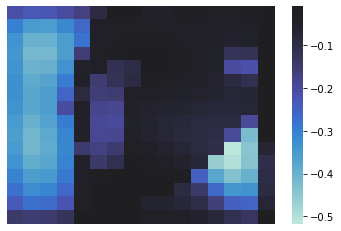

这是feature map 438 tensor(-0.1725, device='cuda:0', grad_fn=<MeanBackward0>)


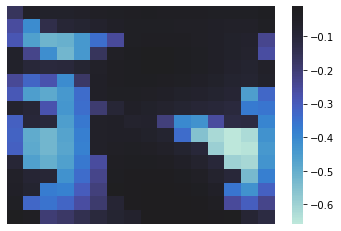

这是feature map 439 tensor(0.1282, device='cuda:0', grad_fn=<MeanBackward0>)


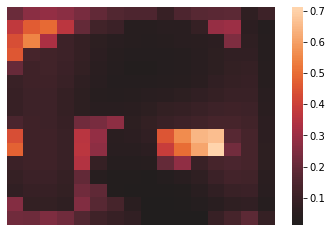

这是feature map 440 tensor(-0.0300, device='cuda:0', grad_fn=<MeanBackward0>)


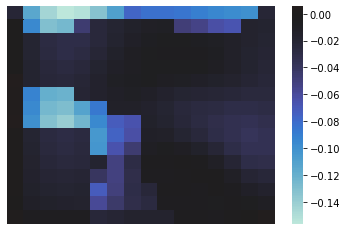

这是feature map 441 tensor(0.0773, device='cuda:0', grad_fn=<MeanBackward0>)


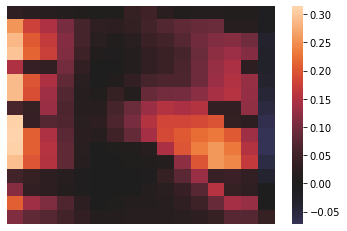

这是feature map 442 tensor(-0.0567, device='cuda:0', grad_fn=<MeanBackward0>)


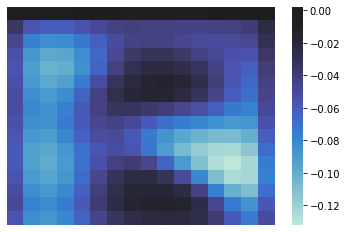

这是feature map 443 tensor(0.0520, device='cuda:0', grad_fn=<MeanBackward0>)


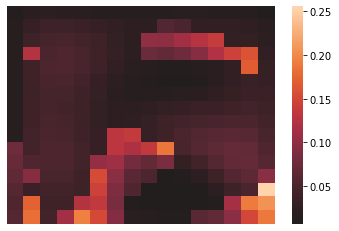

这是feature map 444 tensor(0.0447, device='cuda:0', grad_fn=<MeanBackward0>)


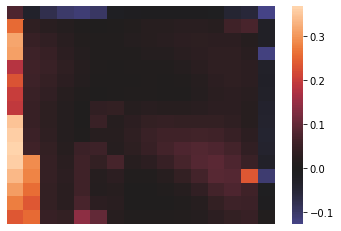

这是feature map 445 tensor(0.0903, device='cuda:0', grad_fn=<MeanBackward0>)


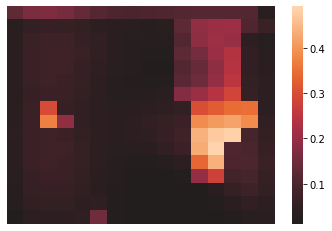

这是feature map 446 tensor(-0.2552, device='cuda:0', grad_fn=<MeanBackward0>)


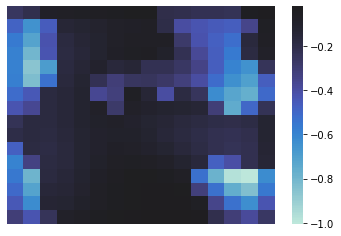

这是feature map 447 tensor(-0.0513, device='cuda:0', grad_fn=<MeanBackward0>)


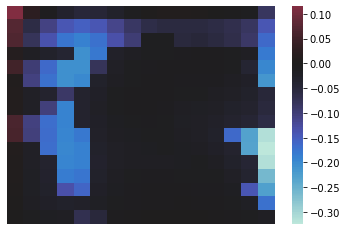

这是feature map 448 tensor(-0.0277, device='cuda:0', grad_fn=<MeanBackward0>)


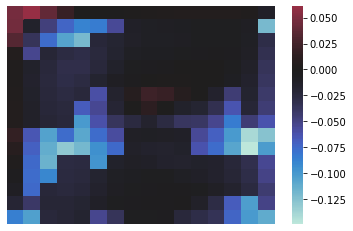

这是feature map 449 tensor(0.1043, device='cuda:0', grad_fn=<MeanBackward0>)


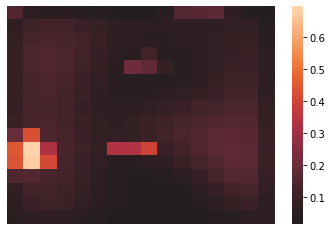

这是feature map 450 tensor(0.1861, device='cuda:0', grad_fn=<MeanBackward0>)


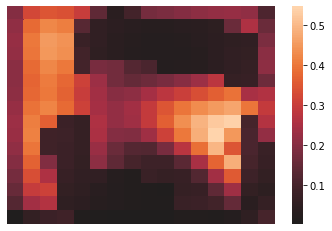

这是feature map 451 tensor(-0.2076, device='cuda:0', grad_fn=<MeanBackward0>)


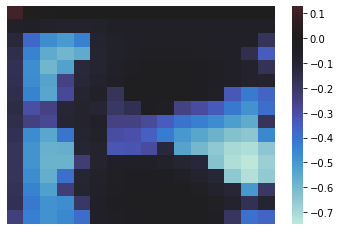

这是feature map 452 tensor(-0.0878, device='cuda:0', grad_fn=<MeanBackward0>)


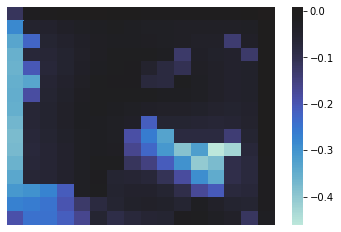

这是feature map 453 tensor(-0.1431, device='cuda:0', grad_fn=<MeanBackward0>)


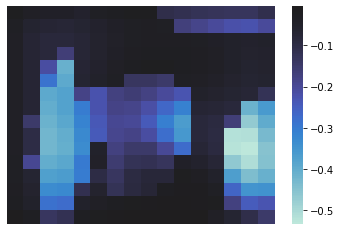

这是feature map 454 tensor(0.1296, device='cuda:0', grad_fn=<MeanBackward0>)


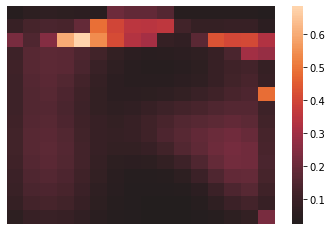

这是feature map 455 tensor(0.0350, device='cuda:0', grad_fn=<MeanBackward0>)


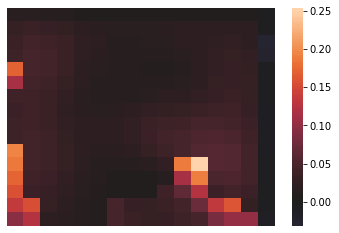

这是feature map 456 tensor(0.3496, device='cuda:0', grad_fn=<MeanBackward0>)


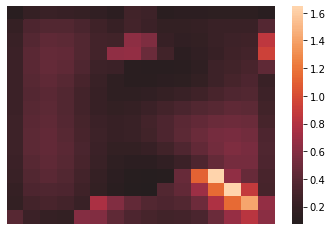

这是feature map 457 tensor(-0.1430, device='cuda:0', grad_fn=<MeanBackward0>)


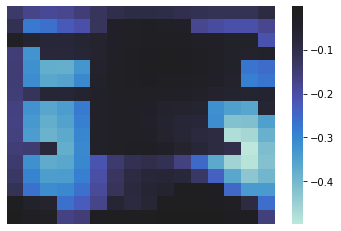

这是feature map 458 tensor(0.0410, device='cuda:0', grad_fn=<MeanBackward0>)


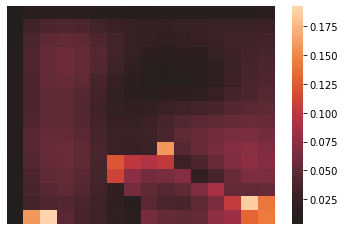

这是feature map 459 tensor(-0.0928, device='cuda:0', grad_fn=<MeanBackward0>)


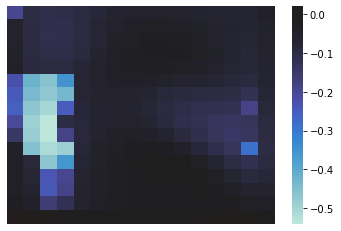

这是feature map 460 tensor(0.0525, device='cuda:0', grad_fn=<MeanBackward0>)


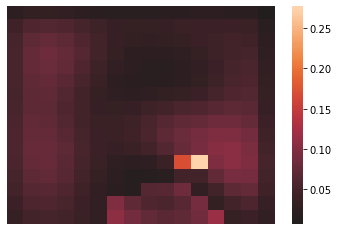

这是feature map 461 tensor(-0.0141, device='cuda:0', grad_fn=<MeanBackward0>)


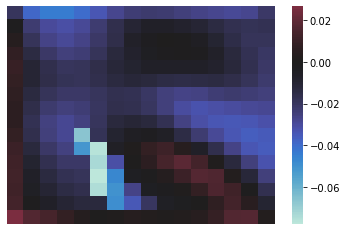

这是feature map 462 tensor(-0.2229, device='cuda:0', grad_fn=<MeanBackward0>)


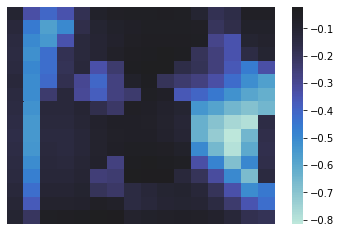

这是feature map 463 tensor(0.0265, device='cuda:0', grad_fn=<MeanBackward0>)


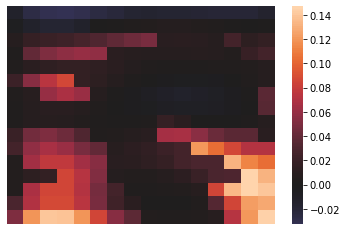

这是feature map 464 tensor(-0.0471, device='cuda:0', grad_fn=<MeanBackward0>)


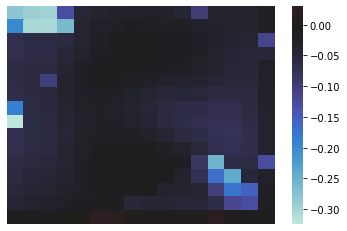

这是feature map 465 tensor(-0.2455, device='cuda:0', grad_fn=<MeanBackward0>)


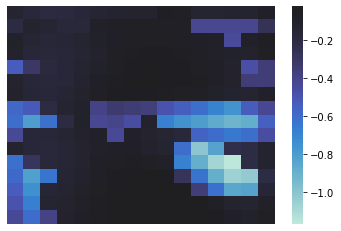

这是feature map 466 tensor(-0.6915, device='cuda:0', grad_fn=<MeanBackward0>)


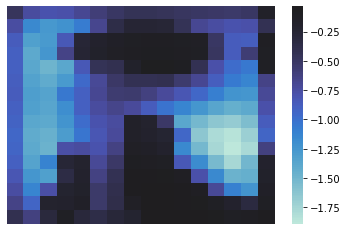

这是feature map 467 tensor(-0.1768, device='cuda:0', grad_fn=<MeanBackward0>)


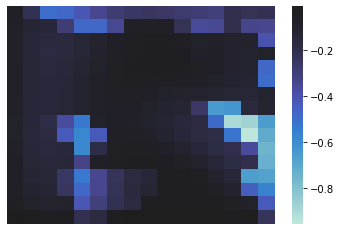

这是feature map 468 tensor(-0.0417, device='cuda:0', grad_fn=<MeanBackward0>)


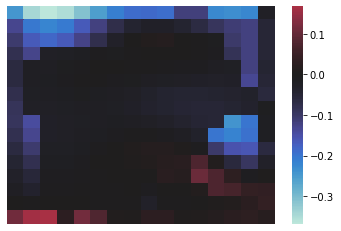

这是feature map 469 tensor(-0.0199, device='cuda:0', grad_fn=<MeanBackward0>)


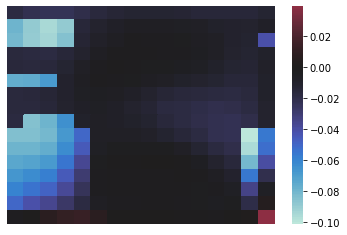

这是feature map 470 tensor(0.0698, device='cuda:0', grad_fn=<MeanBackward0>)


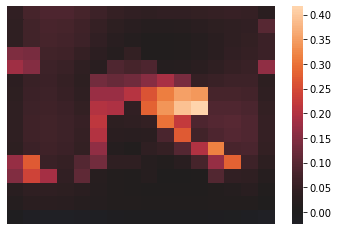

这是feature map 471 tensor(-0.1482, device='cuda:0', grad_fn=<MeanBackward0>)


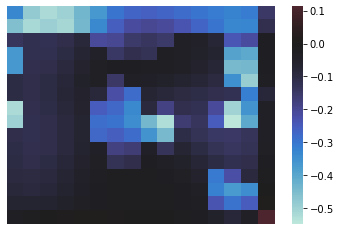

这是feature map 472 tensor(0.0648, device='cuda:0', grad_fn=<MeanBackward0>)


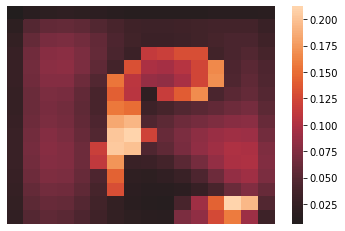

这是feature map 473 tensor(0.2240, device='cuda:0', grad_fn=<MeanBackward0>)


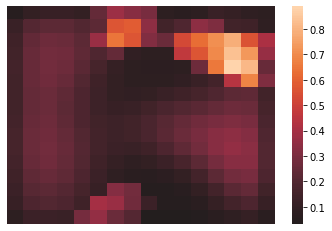

这是feature map 474 tensor(-1.0016, device='cuda:0', grad_fn=<MeanBackward0>)


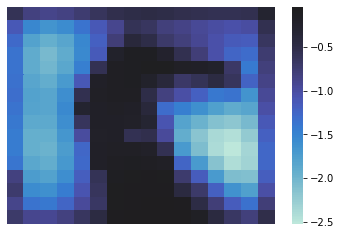

这是feature map 475 tensor(0.1332, device='cuda:0', grad_fn=<MeanBackward0>)


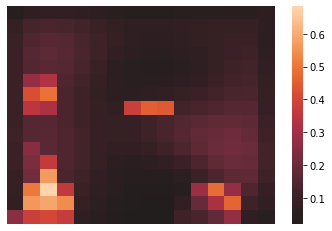

这是feature map 476 tensor(-1.0653, device='cuda:0', grad_fn=<MeanBackward0>)


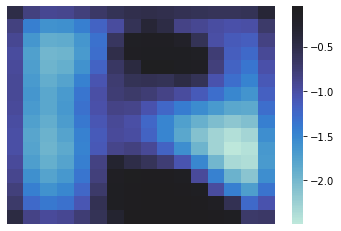

这是feature map 477 tensor(0.3305, device='cuda:0', grad_fn=<MeanBackward0>)


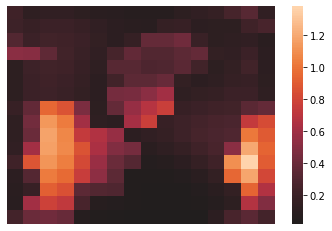

这是feature map 478 tensor(0.0131, device='cuda:0', grad_fn=<MeanBackward0>)


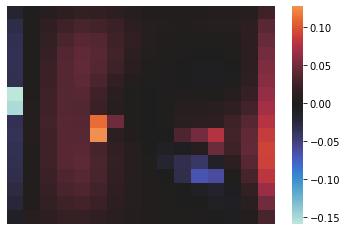

这是feature map 479 tensor(0.2439, device='cuda:0', grad_fn=<MeanBackward0>)


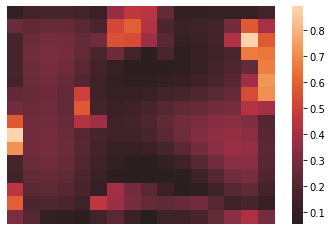

这是feature map 480 tensor(-0.0367, device='cuda:0', grad_fn=<MeanBackward0>)


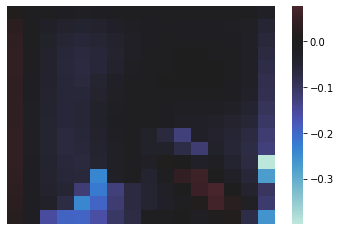

这是feature map 481 tensor(0.3647, device='cuda:0', grad_fn=<MeanBackward0>)


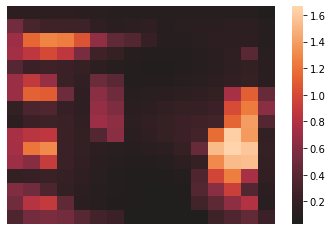

这是feature map 482 tensor(0.1532, device='cuda:0', grad_fn=<MeanBackward0>)


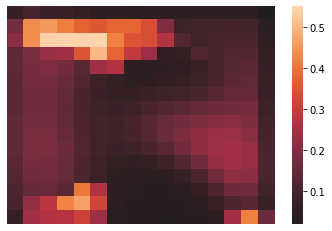

这是feature map 483 tensor(-0.1446, device='cuda:0', grad_fn=<MeanBackward0>)


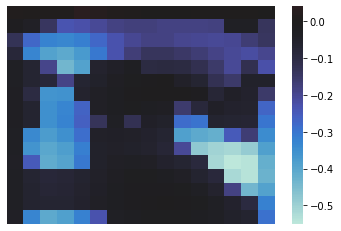

这是feature map 484 tensor(-0.1330, device='cuda:0', grad_fn=<MeanBackward0>)


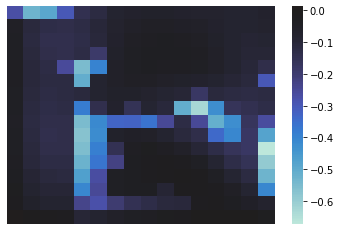

这是feature map 485 tensor(-0.0728, device='cuda:0', grad_fn=<MeanBackward0>)


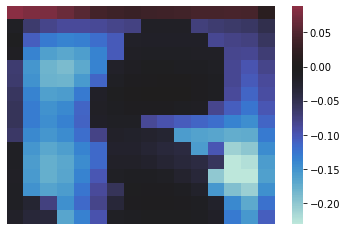

这是feature map 486 tensor(0.1090, device='cuda:0', grad_fn=<MeanBackward0>)


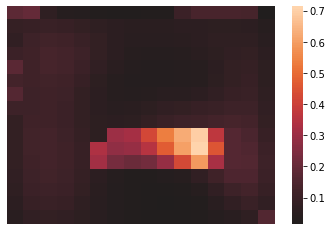

这是feature map 487 tensor(0.0020, device='cuda:0', grad_fn=<MeanBackward0>)


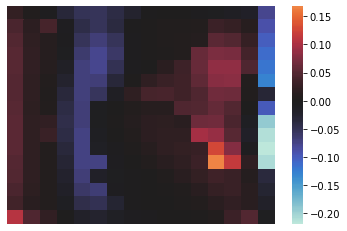

这是feature map 488 tensor(0.0627, device='cuda:0', grad_fn=<MeanBackward0>)


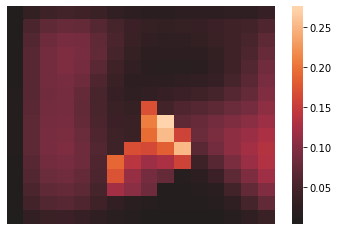

这是feature map 489 tensor(0.2412, device='cuda:0', grad_fn=<MeanBackward0>)


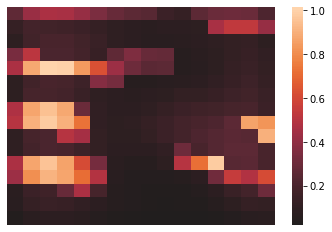

这是feature map 490 tensor(-0.0981, device='cuda:0', grad_fn=<MeanBackward0>)


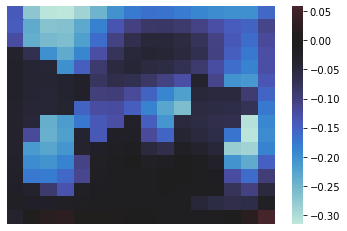

这是feature map 491 tensor(0.2011, device='cuda:0', grad_fn=<MeanBackward0>)


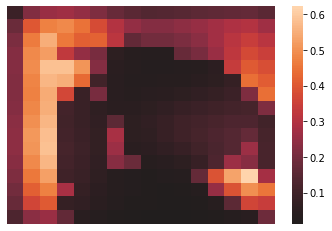

这是feature map 492 tensor(0.2801, device='cuda:0', grad_fn=<MeanBackward0>)


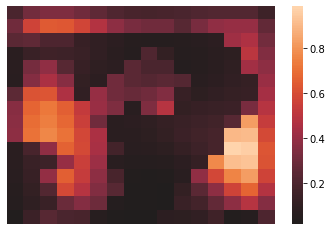

这是feature map 493 tensor(-0.1421, device='cuda:0', grad_fn=<MeanBackward0>)


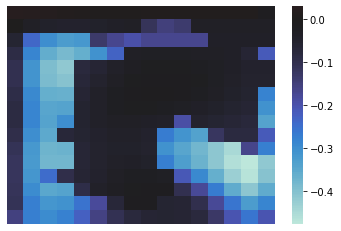

这是feature map 494 tensor(-0.0034, device='cuda:0', grad_fn=<MeanBackward0>)


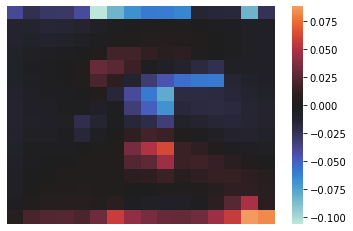

这是feature map 495 tensor(-0.0380, device='cuda:0', grad_fn=<MeanBackward0>)


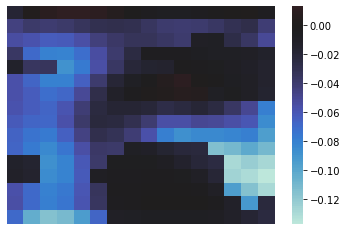

这是feature map 496 tensor(-0.2431, device='cuda:0', grad_fn=<MeanBackward0>)


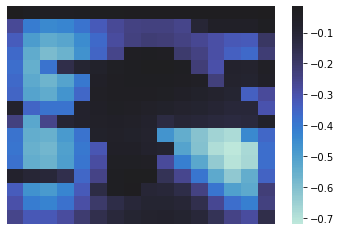

这是feature map 497 tensor(0.0355, device='cuda:0', grad_fn=<MeanBackward0>)


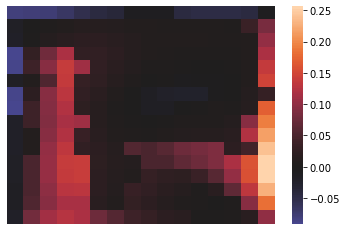

这是feature map 498 tensor(-0.1220, device='cuda:0', grad_fn=<MeanBackward0>)


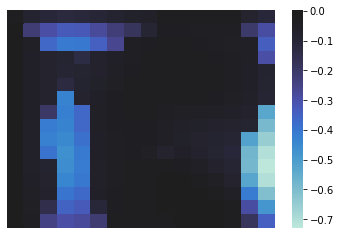

这是feature map 499 tensor(0.1463, device='cuda:0', grad_fn=<MeanBackward0>)


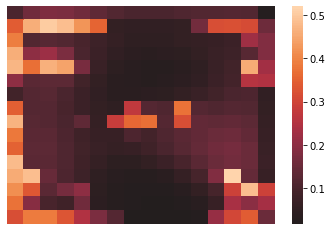

这是feature map 500 tensor(-1.8494, device='cuda:0', grad_fn=<MeanBackward0>)


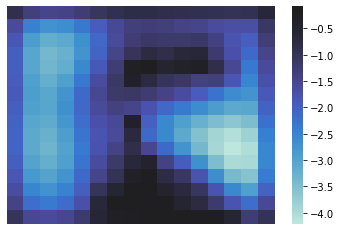

这是feature map 501 tensor(-0.1292, device='cuda:0', grad_fn=<MeanBackward0>)


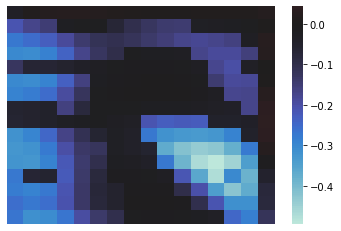

这是feature map 502 tensor(0.2418, device='cuda:0', grad_fn=<MeanBackward0>)


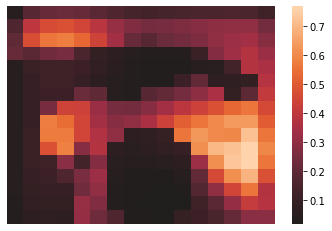

这是feature map 503 tensor(0.0795, device='cuda:0', grad_fn=<MeanBackward0>)


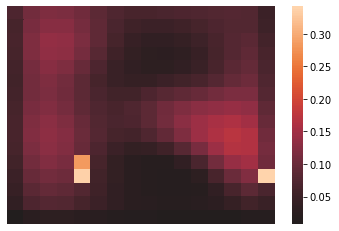

这是feature map 504 tensor(0.0049, device='cuda:0', grad_fn=<MeanBackward0>)


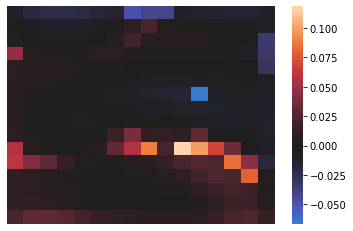

这是feature map 505 tensor(-0.0271, device='cuda:0', grad_fn=<MeanBackward0>)


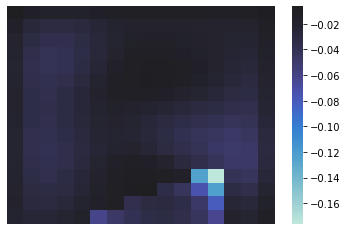

这是feature map 506 tensor(-0.0056, device='cuda:0', grad_fn=<MeanBackward0>)


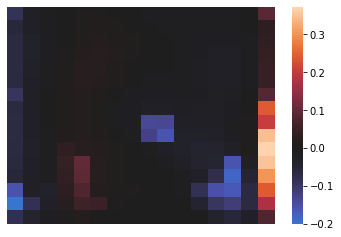

这是feature map 507 tensor(0.0220, device='cuda:0', grad_fn=<MeanBackward0>)


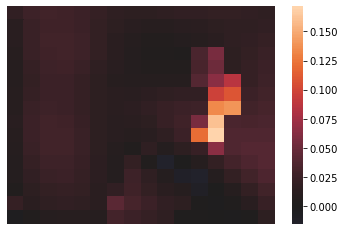

这是feature map 508 tensor(0.1025, device='cuda:0', grad_fn=<MeanBackward0>)


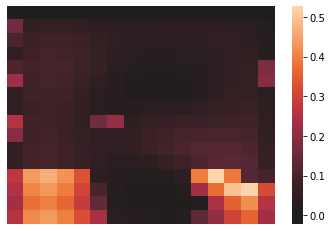

这是feature map 509 tensor(-0.3211, device='cuda:0', grad_fn=<MeanBackward0>)


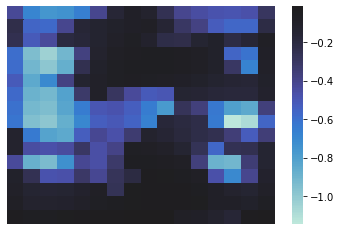

这是feature map 510 tensor(-0.0574, device='cuda:0', grad_fn=<MeanBackward0>)


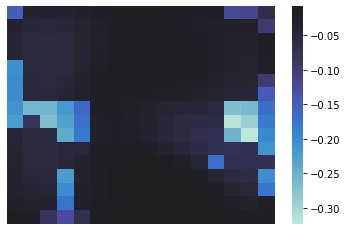

这是feature map 511 tensor(-0.8506, device='cuda:0', grad_fn=<MeanBackward0>)


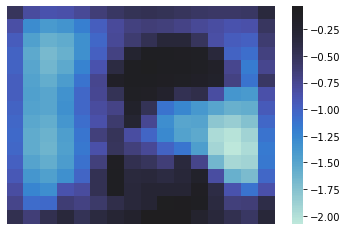

这是feature map 512 tensor(0.1012, device='cuda:0', grad_fn=<MeanBackward0>)


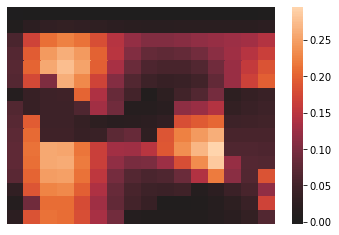

In [ ]:
import seaborn as sns
def junzhi_fangcha(x):
  mean=x.mean()
  var=x.var()
  return mean,var
import imageio
display_block = 4 #@param {type:"slider", min:0, max:17, step:1}

num_feature_map=25 #@param {type:"slider", min:0, max:512, step:1}

out_all=True #@param ["True", "False"] {type:"raw", allow-input: true}
display_tensor=True #@param ["True", "False"] {type:"raw", allow-input: true}
save_feature=False #@param ["True", "False"] {type:"raw", allow-input: true}
#Extract feature
extracted_block=x_all_1[display_block][0]
extracted_block_0=x_all[display_block][0]
#extracted_feature=extracted_block[num_feature_map-1]
import os
if save_feature:
  fea_name=str(seed)+'normalized__block'+str(display_block)
  os.mkdir(fea_name)
mean_all_1=[]
max_all_1=[]
if out_all:
  for i_index,i in enumerate(extracted_block):
    #i_mean,i_var=junzhi_fangcha(i)
    #i=(i-i_mean)/i_var
    #img_feature=(i * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    img_feature=i-extracted_block_0[i_index]
    #.clamp(0, 255)
    if display_tensor:
      print('这是feature map',i_index+1,img_feature.mean())
      mean_all_1.append(i.abs().mean())
      max_all_1.append(i.max())
      #print('该feature map 0-255归一化后是',img_feature)
      #print('该feature map 绝对值后均值是',i.abs().mean())
    else:
      print('这是feature map',i_index+1)
    if save_feature:
      img_feature = img_feature.cpu().numpy()
      #img_feature=PIL.Image.fromarray(img_feature[0], 'gray')
      imageio.imsave(f'{fea_name}/{i_index+1}.png', img_feature)
      #img_feature.save(f'{fea_name}/{i_index+1}.png')
    if display_tensor:
      plt.axis('off')
      img_feature=img_feature.detach().cpu().numpy()
      ax = sns.heatmap(img_feature, center=0)
      #plt.imshow(img_feature.detach().cpu().numpy(),cmap="ru")
      plt.show()
  zip_mean_1=zip(range(i_index+1),mean_all_1)
if not out_all:
#display
  print('这是feature map',num_feature_map,i)
  img_feature=(extracted_feature * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  plt.axis('off')
  plt.imshow(img_feature,cmap="gray")
  plt.show()



#一些数据处理函数

In [ ]:
import pickle
def save_variable(v,filename):
    f=open(filename,'wb')
    pickle.dump(v,f)
    f.close()
    return filename

def load_variavle(filename):
    f=open(filename,'rb')
    r=pickle.load(f)
    f.close()
    return r
def record_mean(x_all):
  x=x_all[0][0]
  compute_mean=[]
  index_mean=[]
  for i_index,i in enumerate(x):
    #compute_mean.append(i.mean())
    index_mean.append([i_index,i.mean()])
  return index_mean
def list_add(a,b):
  c = []
  for i in range(len(a)):
      c.append(a[i]+b[i])
  return c
def list_sub(a,b):
  c = []
  for i in range(len(a)):
      c.append(a[i]-b[i])
  return c
def list_sub_square(a,b):
  c = []
  for i in range(len(a)):
    #print('a=',a[i],'b=',b[i])
    c.append((a[i]-b[i])**2)
  return c
def list_div_real(a,b):
  c = []
  for i in range(len(a)):
      c.append(a[i]/b[i])
  return c
def list_div(a,b):
  c = []
  for i in range(len(a)):
      c.append(a[i]/b)
  return c
def compute_m_v(sta,end):

  for i in range(sta,end):
    print('处理第',i)
    f_name='./Mean_Variance/'+str(i)+'.txt'
    m=load_variavle(f_name)
    m_1=[]
    for j in m:
      m_1.append(j[1])
    if i==sta:
      mean_all=m_1
    else:
      mean_all=list_add(mean_all,m_1)
  mean_all=list_div(mean_all,(end-sta))
  return mean_all


#找不支持的均值或最大值
def ab_sta(mean_all,threshold):
  ab_mean=[]
  ab_index=[]
  for index_i,i in enumerate(mean_all):
    if i>threshold:
      ab_index.append(index_i)
      ab_mean.append([index_i,i])
  return ab_index,ab_mean
def ab_sta_with_ratio(mean_all,threshold,ratio):
  ab_mean=[]
  ab_index=[]
  for index_i,i in enumerate(mean_all):
    if i>threshold and ratio[index_i]>2:
      ab_index.append(index_i)
      ab_mean.append([index_i,i,ratio[index_i]])
  return ab_index,ab_mean


In [ ]:
#79598的b0的均值
ff='./Mean_Variance_b0/79598.txt'
mmm=load_variavle(ff)
list(mmm)

In [ ]:
#block0整体的均值
m_b0=load_variavle('m_b0.txt')
list(m_b0)

In [ ]:
mmm1=[i[1] for i in mmm]
ccc=list_sub(mmm1,m_b0)
ccc

In [ ]:
ff='./Mean_Variance_b0/79598.txt'
mmm=load_variavle(ff)

#block0整体的均值
m_b0=load_variavle('m_b0.txt')

mmm1=[i[1] for i in mmm]
ccc=list_sub(mmm1,m_b0)

dex,ab_m=ab_sta(ccc,0.1)

In [ ]:
ab_m

In [ ]:
dex,ab_m=ab_sta(mean_all_1,0.8)

In [ ]:
dex,ab_m=ab_sta(max_all_1,6)

In [ ]:
m_all=load_variavle('m_b1.txt')
vari_all=load_variavle('vari_b11.txt')
import math
vari_all_sqrt=[math.sqrt(i) for i in vari_all]
pic_num=79058
f_name='./Mean_Variance_b1/'+str(pic_num)+'.txt'
m=load_variavle(f_name)
m_1=[i[1] for i in m]
minus=list_sub(m_1,m_all)
ratio=list_div_real(minus,vari_all_sqrt)

In [ ]:
ratio=[i.abs() for i in ratio]
dex,ab_m=ab_sta(ratio,2)

In [ ]:
ab_m

In [ ]:
ratio=[i.abs() for i in ratio]
minus_abs=[i.abs() for i in minus]
dex,ab_m=ab_sta(minus_abs,10)
dex,ab_m=ab_sta_with_ratio(minus_abs,0.5,ratio)
ab_m


In [ ]:
dex

[141, 316, 409, 445, 477, 505, 511]

In [ ]:
vari_all=load_variavle('vari.txt')
import math
vari_all_sqrt=[math.sqrt(i) for i in vari_all]
vari_all_sqrt

In [ ]:

vari_all=load_variavle('vari_all_b1.txt')
import math
vari_all_sqrt=[math.sqrt(i) for i in vari_all]
vari_all_sqrt

[[176,
  tensor(1.2008, grad_fn=<AbsBackward0>),
  tensor(4.9778, grad_fn=<AbsBackward0>)]]

In [ ]:
list(zip(range(512),m_all,vari_all))

In [ ]:
#概率密度函数
import seaborn as sns
import numpy as np
from numpy.random import randn
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy import stats
import os
def prob_den(seed,block_num,x):
  f_name='FR_P_D_'+str(seed)+'_block'+str(block_num)
  os.mkdir(f_name)

  extracted_block=x[block_num][0]
  for i_index,i in enumerate(extracted_block):
    bins = np.linspace(-1, 10, 23)
# style set 这里只是一些简单的style设置
    sns.set_palette('deep', desat=.6)
#sns.set_context(rc={'figure.figsize': (8, 5) } )
# figsize是常用的参数.
    data2=i.detach().numpy().reshape(2**(2*block_num+4),)
#print(data)
#plt.hist(data,bins=12)
    plt.figure()
    plt.hist(data2,bins)
    if i_index<10:

      png_name=f_name+'/00'+str(i_index)
    elif i_index<100:
      png_name=f_name+'/0'+str(i_index)
    else:
      png_name=f_name+'/'+str(i_index)
    plt.savefig(png_name)

In [ ]:
#概率密度函数，设置横纵坐标范围prob_den_ranged
import seaborn as sns
import numpy as np
from numpy.random import randn
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy import stats
import os
def prob_den_ranged(seed,block_num,x):
  f_name='Extreme_FR_P_D_'+str(seed)+'_block'+str(block_num)
  os.mkdir(f_name)

  extracted_block=x[block_num][0]
  for i_index,i in enumerate(extracted_block):
    bins = np.linspace(5, 15, 11)
# style set 这里只是一些简单的style设置
    sns.set_palette('deep', desat=.6)
#sns.set_context(rc={'figure.figsize': (8, 5) } )
# figsize是常用的参数.
    data2=i.detach().numpy().reshape(2**(2*block_num+4),)
#print(data)
#plt.hist(data,bins=12)
    plt.figure()
    #y_ticks = np.arange(0, 100, 1)
    #plt.yticks(y_ticks)
    plt.ylim((0, 100))
    plt.hist(data2,bins)
    if i_index<10:

      png_name=f_name+'/00'+str(i_index)
    elif i_index<100:
      png_name=f_name+'/0'+str(i_index)
    else:
      png_name=f_name+'/'+str(i_index)
    plt.savefig(png_name)

In [ ]:

bins = np.linspace(5, 15, 11)
#bins=np.append(bins,[15.])
data=[1,2,3,4,3]
#plt.hist(data,bins)

In [ ]:
block_num=3

In [ ]:
ccc=[3]
for i in ccc:
  prob_den_ranged(seed,i,x_all)


In [ ]:
extracted_block=x_all[block_num][0]

In [ ]:
block_num = 4 #@param {type:"slider", min:0, max:8, step:1}

prob_den(seed,block_num,x_all)

In [ ]:
import os
import seaborn as sns
import numpy as np
from numpy.random import randn
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy import stats

block_num = 3 #@param {type:"slider", min:0, max:8, step:1}
f_name='P_D_'+str(seed)+'_block'+str(block_num)
os.mkdir(f_name)
extracted_block=x_all[block_num][0]
# style set 这里只是一些简单的style设置
sns.set_palette('deep', desat=.6)
#sns.set_context(rc={'figure.figsize': (8, 5) } )

# figsize是常用的参数.


data2=extracted_block[22,:,:].detach().numpy().reshape(2**(2*block_num+4))
#print(data)
#plt.hist(data,bins=12)
plt.figure()
plt.hist(data2,bins=10)
png_name=f_name+'/'+str(i_index)
plt.savefig(png_name)




In [ ]:
!ls

In [ ]:
ab_mean_1
ab_index
#mean_all_1

[24, 199, 308, 386, 432]

In [ ]:
ab_mean_1
#ab_index
#mean_all_1

[[24, tensor(2.2558, grad_fn=<MeanBackward0>)],
 [199, tensor(1.7455, grad_fn=<MeanBackward0>)],
 [308, tensor(2.4537, grad_fn=<MeanBackward0>)],
 [386, tensor(2.0796, grad_fn=<MeanBackward0>)],
 [432, tensor(1.8167, grad_fn=<MeanBackward0>)]]

In [ ]:
ccc=extracted_block[24]
for i in range(32):
  print('第',i,'个',ccc[i,:])

In [ ]:
def com_mean(aaa):
  sum1=0
  for i in aaa:
    sum1+=i.abs()
  return sum1/len(aaa)
s_mall=[]
s1_m=com_mean(s1[0])
s2_m=com_mean(s2[1][0])
s3_m=com_mean(s3[1][0])
s4_m=com_mean(s4[1][0])
s5_m=com_mean(s5[1][0])
s6_m=com_mean(s6[1][0])
s7_m=com_mean(s7[1][0])

s_mall.append(s1_m)
s_mall.append(s2_m)
s_mall.append(s3_m)
s_mall.append(s4_m)
s_mall.append(s5_m)
s_mall.append(s6_m)
s_mall.append(s7_m)
s_mall
def com_mean(aaa):
  sum1=0
  for i in aaa:
    sum1+=i.abs()
  return sum1/len(aaa)
s_mall=[]
s1_m=com_mean(s1[0])
s2_m=com_mean(s2[1][0])
s3_m=com_mean(s3[1][0])
s4_m=com_mean(s4[1][0])
s5_m=com_mean(s5[1][0])
s6_m=com_mean(s6[1][0])
s7_m=com_mean(s7[1][0])

s_mall.append(s1_m)
s_mall.append(s2_m)
s_mall.append(s3_m)
s_mall.append(s4_m)
s_mall.append(s5_m)
s_mall.append(s6_m)
s_mall.append(s7_m)
s_mall

#Feature map的显示4

In [ ]:
display_block = 2 #@param {type:"slider", min:0, max:8, step:1}

num_feature_map=22 #@param {type:"slider", min:0, max:512, step:1}

out_all=True #@param ["True", "False"] {type:"raw", allow-input: true}
display_tensor=True #@param ["True", "False"] {type:"raw", allow-input: true}

#Extract feature
extracted_block=x_all[display_block][0]
extracted_feature=extracted_block[num_feature_map]
mean_all_2=[]
if out_all:
  for i_index,i in enumerate(extracted_block):
    img_feature=(i * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    #.clamp(0, 255)
    if display_tensor:
      print('这是feature map',i_index+1,i.abs().mean())
      mean_all_2.append(i.abs().mean())
      #print('该feature map 0-255归一化后是',img_feature)
      #print('该feature map 绝对值后均值是',i.abs().mean())
    else:
      print('这是feature map',i_index+1)
    plt.axis('off')
    plt.imshow(img_feature,cmap="gray")
    plt.show()
  zip_mean_2=zip(range(i_index+1),mean_all_2)
if not out_all:
#display
  img_feature=(extracted_feature * 127.5 + 128).to(torch.uint8)
  plt.axis('off')
  plt.imshow(img_feature,cmap="gray")
  plt.show()



#mean的差值比较

In [ ]:
list(zip_mean_2)

In [ ]:
mean_minus=[]
for mean_index, i in enumerate(mean_all_1):
  temp=float(mean_all_1[mean_index])-float(mean_all_2[mean_index])
  mean_minus.append(temp)

In [ ]:
mean_minus

In [ ]:
list(zip(range(i_index+1),mean_all_1))

In [ ]:

zip_minus=zip(range(i_index+1),mean_minus)
list(zip_minus)

In [ ]:
ab_mean_1=[]
for index_i,i in enumerate(mean_minus):
  if i>1 or i<-1:
    if mean_all_1[index_i]>0:
      ab_mean_1.append(index_i)




In [ ]:
ab_mean_1


[38, 60, 125, 130, 183, 318, 395, 473, 475, 499, 510]

#多幅图片的生成

In [ ]:
import math
def createImageGrid(images, scale=0.25, rows=1):
   w,h = images[0].size
   w = int(w*scale)
   h = int(h*scale)
   height = rows*h
   cols = math.ceil(len(images) / rows)
   width = cols*w
   canvas = PIL.Image.new('RGBA', (width,height), 'white')
   for i,img in enumerate(images):
     img = img.resize((w,h), PIL.Image.ANTIALIAS)
     canvas.paste(img, (w*(i % cols), h*(i // cols)))
   return canvas
def imshow(a, format='png', jpeg_fallback=True):
  a = np.asarray(a, dtype=np.uint8)
  str_file = BytesIO()
  PIL.Image.fromarray(a).save(str_file, format)
  im_data = str_file.getvalue()
  try:
    disp = IPython.display.display(IPython.display.Image(im_data))
  except IOError:
    if jpeg_fallback and format != 'jpeg':
      print ('Warning: image was too large to display in format "{}"; '
             'trying jpeg instead.').format(format)
      return imshow(a, format='jpeg')
    else:
      raise
  return disp

In [ ]:
#生成多个seeds的z
seed = 1815 #@param {type:"slider", min:1, max:10000, step:1}
#Display = True #@param ["True", "False"] {type:"raw", allow-input: true}
#Save = None #@param ["True", "None"] {type:"raw"}
#Only_final = True #@param ["True", "None"] {type:"raw"}
device='cpu'
label = torch.zeros([1, G_copy.c_dim], device=device)
truncation_psi=1
noise_mode= 'const'
z_all=[]
seed_num= 10 #@param {type:"slider", min:1, max:30, step:1}
for i in range(seed_num):
  z = torch.from_numpy(np.random.RandomState(seed*1000+i).randn(1, G_copy.z_dim)).to(device)
  z_all.append(z)
img_all=[]
#生成多个图片
for i in range(seed_num):
  ws = G_copy.mapping(z_all[i], label, truncation_psi=truncation_psi, truncation_cutoff=None)
  img,x_all,y_all = G_copy.synthesis(ws, noise_mode=noise_mode)
  img_all.apeend(img[-1])

In [ ]:


import pickle
def save_variable(v,filename):
    f=open(filename,'wb')
    pickle.dump(v,f)
    f.close()
    return filename

def load_variavle(filename):
    f=open(filename,'rb')
    r=pickle.load(f)
    f.close()
    return r

def save_feature(fea_all,block_index,fea_index,file_n):
  var=fea_all[block_index][0][fea_index]
  save_variable(var,file_n)



In [ ]:
file_n='376_test.txt'
save_feature(x_all,3,2,file_n)

In [ ]:
import pickle
def save_variable(v,filename):
    f=open(filename,'wb')
    pickle.dump(v,f)
    f.close()
    return filename

def load_variavle(filename):
    f=open(filename,'rb')
    r=pickle.load(f)
    f.close()
    return r
def record_mean(x_all):
  x=x_all[0][0]
  compute_mean=[]
  index_mean=[]
  for i_index,i in enumerate(x):
    #compute_mean.append(i.mean())
    index_mean.append([i_index,i.mean()])
  return index_mean
def list_add(a,b):
  c = []
  for i in range(len(a)):
      c.append(a[i]+b[i])
  return c
def list_sub(a,b):
  c = []
  for i in range(len(a)):
      c.append(a[i]-b[i])
  return c
def list_sub_square(a,b):
  c = []
  for i in range(len(a)):
      c.append((a[i]-b[i])**2)
  return c
def list_div_real(a,b):
  c = []
  for i in range(len(a)):
      c.append(a[i]/b[i])
  return c
def list_div(a,b):
  c = []
  for i in range(len(a)):
      c.append(a[i]/b)
  return c
def compute_m_v(sta,end):

  for i in range(sta,end):
    print('处理第',i)
    f_name='./Mean_Variance/'+str(i)+'.txt'
    m=load_variavle(f_name)
    m_1=[]
    for j in m:
      m_1.append(j[1])
    if i==sta:
      mean_all=m_1
    else:
      mean_all=list_add(mean_all,m_1)
  mean_all=list_div(mean_all,(end-sta))
  return mean_all

In [ ]:
m_all1=compute_m_v(78000,78100)